# Phase 4 Project: Predicting Primary Car Crash Cause.

# Table of Contents.
## 1. Business Problem Overview.
## 2. Proposed Solution.
## 3. Datasets Download Links.
## 4. Datasets EDA and Cleaning:
### &nbsp; 4.1. Traffic Crashes: `Crashes` Overview, EDA, Cleaning. 
### &nbsp; 4.2. Traffic Crashes: `Drivers` Overview, EDA, Cleaning. 
### &nbsp; 4.3. Traffic Crashes: `Vehicles` Overview, EDA, Cleaning.
### &nbsp; 4.4. Traffic Crashes: Merging `Drivers`, `Crashes`, `Vehicles`.
## 5. Data EDA.
## 6. Data Transformation For Classification.
## 7. Modelling.
## 8. Results.
## 9. Recommendations.
## 10. Conclusion.

## 1. Business Problem Overview.

Our stakeholder is the City of Chicago.
The business goal is to develop a data-driven Driver Awareness Campaign to reduce accidents in business and residential areas.

## 2. Proposed Solution.
* Use publicly-available Chicago Car Crashes Dataset.
* Develop a predictive model using ML tools.
* Analyze key fetures contributing to the accident.

## 3. Datasets Download Links.

* [Traffic Crashes: Crashes](https://data.cityofchicago.org/Transportation/Traffic-Crashes-Crashes/85ca-t3if/about_data).
* [Traffic Crashes: People](https://data.cityofchicago.org/Transportation/Traffic-Crashes-People/u6pd-qa9d/about_data).
* [Traffic Ctashes: Vehicle](https://data.cityofchicago.org/Transportation/Traffic-Crashes-Vehicles/68nd-jvt3/about_data).

## 4. Datasets EDA and Cleaning.

In this section of the notebook we'll load the datasets and do a brief EDA.
We'll take a look at the datasets, we'll list columns and unique values for categorical columns. This would give us a better understanding of the datasets structures and amount of cleaning we might have to do for each set.

### Loading datasets. 

In [1]:
# importing modules
import pandas as pd
import numpy as np
import os
import glob

# data directory
dir_data = './Data'

# filenames (use wildcard *)
data_crashes_pattern = 'Traffic_Crashes_-_Crashes_*.csv'
data_people_pattern = 'Traffic_Crashes_-_People_*.csv'
data_vehicles_pattern = 'Traffic_Crashes_-_Vehicles_*.csv'

#for each pattern, look up all matches and store the latest match

path_crashes_files = glob.glob(os.path.join(dir_data, data_crashes_pattern))
path_people_files = glob.glob(os.path.join(dir_data, data_people_pattern))
path_vehicles_files = glob.glob(os.path.join(dir_data, data_vehicles_pattern))

# get the most recent file for each pattern
path_crashes = max(path_crashes_files, key=os.path.getmtime) if path_crashes_files else None
path_people = max(path_people_files, key=os.path.getmtime) if path_people_files else None
path_vehicles = max(path_vehicles_files, key=os.path.getmtime) if path_vehicles_files else None

# check if files were found before attempting to load them
if path_crashes and path_people and path_vehicles:
    # load the datasets
    df_crashes = pd.read_csv(path_crashes, low_memory=False)
    df_people = pd.read_csv(path_people, low_memory=False)
    df_vehicles = pd.read_csv(path_vehicles, low_memory=False)
    
    print("Datasets loaded successfully.")
else:
    # Display a message indicating which files were not found
    if not path_crashes:
        print("No matching file found for 'Traffic_Crashes_-_Crashes_*.csv'")
    if not path_people:
        print("No matching file found for 'Traffic_Crashes_-_People_*.csv'")
    if not path_vehicles:
        print("No matching file found for 'Traffic_Crashes_-_Vehicles_*.csv'")

Datasets loaded successfully.


#### Supplemental function to display unique categorical column values in a dataframe.

In [2]:
# function will display unique values for all categorical columns in a dataframe.
def display_categorical_vals(df):
    # select categorical columns
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns

    # print categorical columns and their unique values
    for col in categorical_columns:
        unique_values = df[col].unique()
        print(f"Column '{col}' has unique values: {unique_values}")

## 4.1. Overview of Vehicle Crashes: Crashes. 
Viewing top 5 elemets, listing columns, listing unique values in categorical columns.

In [3]:
# view datasets
df_crashes.head()

,CRASH_RECORD_ID,CRASH_DATE_EST_I,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,...,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION
0,6c1659069e9c6285a650e70d6f9b574ed5f64c12888479...,NaN,08/18/2023 12:50:00 PM,15,OTHER,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,OTHER,...,1.0,0.0,1.0,0.0,12,6,8,NaN,NaN,NaN
1,5f54a59fcb087b12ae5b1acff96a3caf4f2d37e79f8db4...,NaN,07/29/2023 02:45:00 PM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,DIVIDED - W/MEDIAN (NOT RAISED),...,0.0,0.0,1.0,0.0,14,7,7,41.854120,-87.665902,POINT (-87.665902342962 41.854120262952)
2,61fcb8c1eb522a6469b460e2134df3d15f82e81fd93e9c...,NaN,08/18/2023 05:58:00 PM,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PEDALCYCLIST,NOT DIVIDED,...,1.0,0.0,1.0,0.0,17,6,8,41.942976,-87.761883,POINT (-87.761883496974 41.942975745006)
3,004cd14d0303a9163aad69a2d7f341b7da2a8572b2ab33...,NaN,11/26/2019 08:38:00 AM,25,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PEDESTRIAN,ONE-WAY,...,0.0,0.0,1.0,0.0,8,3,11,NaN,NaN,NaN
4,a1d5f0ea90897745365a4cbb06cc60329a120d89753fac...,NaN,08/18/2023 10:45:00 AM,20,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,FIXED OBJECT,OTHER,...,0.0,0.0,1.0,0.0,10,6,8,NaN,NaN,NaN


In [4]:
df_crashes.shape

(879740, 48)

In [5]:
# print column names
df_crashes.columns

Index(['CRASH_RECORD_ID', 'CRASH_DATE_EST_I', 'CRASH_DATE',
       'POSTED_SPEED_LIMIT', 'TRAFFIC_CONTROL_DEVICE', 'DEVICE_CONDITION',
       'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'FIRST_CRASH_TYPE',
       'TRAFFICWAY_TYPE', 'LANE_CNT', 'ALIGNMENT', 'ROADWAY_SURFACE_COND',
       'ROAD_DEFECT', 'REPORT_TYPE', 'CRASH_TYPE', 'INTERSECTION_RELATED_I',
       'NOT_RIGHT_OF_WAY_I', 'HIT_AND_RUN_I', 'DAMAGE', 'DATE_POLICE_NOTIFIED',
       'PRIM_CONTRIBUTORY_CAUSE', 'SEC_CONTRIBUTORY_CAUSE', 'STREET_NO',
       'STREET_DIRECTION', 'STREET_NAME', 'BEAT_OF_OCCURRENCE',
       'PHOTOS_TAKEN_I', 'STATEMENTS_TAKEN_I', 'DOORING_I', 'WORK_ZONE_I',
       'WORK_ZONE_TYPE', 'WORKERS_PRESENT_I', 'NUM_UNITS',
       'MOST_SEVERE_INJURY', 'INJURIES_TOTAL', 'INJURIES_FATAL',
       'INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING',
       'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION',
       'INJURIES_UNKNOWN', 'CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'CRASH_MONTH',
       'LATITUDE', 

In [6]:
# unique values for categorical columns.
display_categorical_vals(df_crashes)

Column 'CRASH_RECORD_ID' has unique values: ['6c1659069e9c6285a650e70d6f9b574ed5f64c12888479093dfeef179c0344ec6d2057eae224b5c0d5dfc278c0a237f8c22543f07fdef2e4a95a3849871c9345'
 '5f54a59fcb087b12ae5b1acff96a3caf4f2d37e79f8db4106558b34b8a6d2b81af02cf91b576ecd7ced08ffd10fcfd940a84f7613125b89d33636e6075064e22'
 '61fcb8c1eb522a6469b460e2134df3d15f82e81fd93e9cafd3dc7e631b9e1ba8b450a63af12bd90d1d2d9b127ea287f88d32e138a4eeba17799f536c08048934'
 ...
 'ede74fa6fd507334cd0415d3d53deb535d27d23523cd38f0b9ca8c5600c8b75ad9f58e61a4f8191dd1a49737683900ef45fe43e98d3c2ac58b12e46260b07e37'
 '37b7acd5f2db6728ca4ac0d7e4217f78b6703f769754b495c437ace10d472977fe4ad4973167dd364031c0641830c0d163bd382d7c6927e2669619ce77051f65'
 'e88a7d78baea3f2de14f0042ce24937d03ca58553c71022c5abc84cfabfd5f6db42fabfe34751eaa13e6c617a725ab8f42af877c382a4abdab0709b99deccf8a']
Column 'CRASH_DATE_EST_I' has unique values: [nan 'Y' 'N']
Column 'CRASH_DATE' has unique values: ['08/18/2023 12:50:00 PM' '07/29/2023 02:45:00 PM'
 '08/18/2

#### Supplemental function displaying % `NaNs` for each column.

In [7]:
def display_df_nans(df_input):
# display % NaN for each column

    # calculate the percentage of NaN values for each column
    nan_percentage = df_input.isna().mean() * 100

    # create a new DataFrame with the column name and percentage of NaNs
    nan_df = pd.DataFrame({'Column Name': nan_percentage.index, '% NaN': nan_percentage.values})

    # sort the filtered DataFrame by '% NaN' in descending order
    nan_df_filtered = nan_df.sort_values(by='% NaN', ascending=False).reset_index(drop=True)

    # display the result
    print(nan_df_filtered)

In [8]:
# display NaNs for df_crashes
display_df_nans(df_crashes)

                      Column Name      % NaN
0               WORKERS_PRESENT_I  99.855071
1                       DOORING_I  99.683657
2                  WORK_ZONE_TYPE  99.564644
3                     WORK_ZONE_I  99.436197
4                  PHOTOS_TAKEN_I  98.644372
5              STATEMENTS_TAKEN_I  97.711824
6              NOT_RIGHT_OF_WAY_I  95.430923
7                CRASH_DATE_EST_I  92.588719
8                        LANE_CNT  77.377748
9          INTERSECTION_RELATED_I  77.063451
10                  HIT_AND_RUN_I  68.645736
11                    REPORT_TYPE   3.070339
12                       LOCATION   0.712483
13                      LONGITUDE   0.712483
14                       LATITUDE   0.712483
15             MOST_SEVERE_INJURY   0.221884
16                 INJURIES_TOTAL   0.220292
17                 INJURIES_FATAL   0.220292
18        INJURIES_INCAPACITATING   0.220292
19    INJURIES_NON_INCAPACITATING   0.220292
20  INJURIES_REPORTED_NOT_EVIDENT   0.220292
21        

#### Takeaways after initial overview:
* The dataset `Traffic Crashes: Crashes` has 48 columns and 854910 data entries;
* The dataset has a primary key `CRASH_RECORD_ID`.
* The dataset has a target column `PRIM_CONTRIBUTORY_CAUSE` and a similar column `SEC_CONTRIBUTORY_CAUSE`.

* The dataset contains information about the road conditions, traffic devices, road type. 
* Ten columns contain mostly NaN values (>60%).

Let's investigate the values in `PRIM_CONTRIBUTORY_CAUSE` and `SEC_CONTRIBUTORY_CAUSE`. Learning about the contributory causes will help us decide what cilumns to keep and what coluns to drop.

### Overview of value distributions in  `PRIM_CONTRIBUTORY_CAUSE`.

In [9]:
# get the counts of unique values and sort them
cause_counts = df_crashes['PRIM_CONTRIBUTORY_CAUSE'].value_counts()

# print the top 100 (or fewer if there are not 100 unique values)
top_100_causes = cause_counts.head(100)

# iterate and print each cause and its count
for cause, count in top_100_causes.items():
    print(f"{cause}: {count}")    

UNABLE TO DETERMINE: 343762
FAILING TO YIELD RIGHT-OF-WAY: 96965
FOLLOWING TOO CLOSELY: 84963
NOT APPLICABLE: 46641
IMPROPER OVERTAKING/PASSING: 43753
FAILING TO REDUCE SPEED TO AVOID CRASH: 36967
IMPROPER BACKING: 34175
IMPROPER LANE USAGE: 31351
DRIVING SKILLS/KNOWLEDGE/EXPERIENCE: 29810
IMPROPER TURNING/NO SIGNAL: 29404
DISREGARDING TRAFFIC SIGNALS: 17221
WEATHER: 12730
OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER: 11099
DISREGARDING STOP SIGN: 9424
DISTRACTION - FROM INSIDE VEHICLE: 5979
EQUIPMENT - VEHICLE CONDITION: 5449
PHYSICAL CONDITION OF DRIVER: 5180
VISION OBSCURED (SIGNS, TREE LIMBS, BUILDINGS, ETC.): 5007
DRIVING ON WRONG SIDE/WRONG WAY: 4761
UNDER THE INFLUENCE OF ALCOHOL/DRUGS (USE WHEN ARREST IS EFFECTED): 4082
DISTRACTION - FROM OUTSIDE VEHICLE: 3570
ROAD ENGINEERING/SURFACE/MARKING DEFECTS: 2111
EXCEEDING AUTHORIZED SPEED LIMIT: 1982
DISREGARDING OTHER TRAFFIC SIGNS: 1880
ROAD CONSTRUCTION/MAINTENANCE: 1858
EXCEEDING SAFE SPEED FOR

### Overview of value distributions in  `SEC_CONTRIBUTORY_CAUSE`.

In [10]:
# get the counts of unique values and sort them
cause_counts = df_crashes['SEC_CONTRIBUTORY_CAUSE'].value_counts()

# print the top 100 (or fewer if there are not 100 unique values)
top_100_causes = cause_counts.head(100)

# iterate and print each cause and its count
for cause, count in top_100_causes.items():
    print(f"{cause}: {count}")

NOT APPLICABLE: 362502
UNABLE TO DETERMINE: 317272
FAILING TO REDUCE SPEED TO AVOID CRASH: 32447
FAILING TO YIELD RIGHT-OF-WAY: 28090
DRIVING SKILLS/KNOWLEDGE/EXPERIENCE: 27275
FOLLOWING TOO CLOSELY: 23177
IMPROPER OVERTAKING/PASSING: 13645
IMPROPER LANE USAGE: 12385
WEATHER: 9744
IMPROPER TURNING/NO SIGNAL: 9090
IMPROPER BACKING: 7037
OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER: 5470
DISREGARDING TRAFFIC SIGNALS: 3572
VISION OBSCURED (SIGNS, TREE LIMBS, BUILDINGS, ETC.): 2732
PHYSICAL CONDITION OF DRIVER: 2658
DISTRACTION - FROM INSIDE VEHICLE: 2634
DISREGARDING STOP SIGN: 2556
DRIVING ON WRONG SIDE/WRONG WAY: 1854
EQUIPMENT - VEHICLE CONDITION: 1775
EXCEEDING AUTHORIZED SPEED LIMIT: 1473
DISTRACTION - FROM OUTSIDE VEHICLE: 1445
EXCEEDING SAFE SPEED FOR CONDITIONS: 1438
UNDER THE INFLUENCE OF ALCOHOL/DRUGS (USE WHEN ARREST IS EFFECTED): 1415
HAD BEEN DRINKING (USE WHEN ARREST IS NOT MADE): 1043
ROAD CONSTRUCTION/MAINTENANCE: 1012
DISREGARDING OTHER

### Overview of value distributions in  `SEC_CONTRIBUTORY_CAUSE` when `PRIM_CONTRIBUTORY_CAUSE` is either unknown or undetermined.

In [11]:
df_crashes_undetermined = \
df_crashes[df_crashes['PRIM_CONTRIBUTORY_CAUSE'].isin(['UNABLE TO DETERMINE', 'NOT APPLICABLE'])]

# get the counts of unique values and sort them
cause_counts = df_crashes_undetermined['SEC_CONTRIBUTORY_CAUSE'].value_counts()

# print the top 100 (or fewer if there are not 100 unique values)
top_100_causes = cause_counts.head(100)

# iterate and print each cause and its count
for cause, count in top_100_causes.items():
    print(f"{cause}: {count}")

UNABLE TO DETERMINE: 204637
NOT APPLICABLE: 176010
DRIVING SKILLS/KNOWLEDGE/EXPERIENCE: 1956
FAILING TO REDUCE SPEED TO AVOID CRASH: 1095
WEATHER: 892
FAILING TO YIELD RIGHT-OF-WAY: 774
FOLLOWING TOO CLOSELY: 756
IMPROPER LANE USAGE: 738
HAD BEEN DRINKING (USE WHEN ARREST IS NOT MADE): 383
PHYSICAL CONDITION OF DRIVER: 380
IMPROPER OVERTAKING/PASSING: 376
IMPROPER BACKING: 362
OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER: 238
IMPROPER TURNING/NO SIGNAL: 221
VISION OBSCURED (SIGNS, TREE LIMBS, BUILDINGS, ETC.): 160
EQUIPMENT - VEHICLE CONDITION: 141
DISREGARDING TRAFFIC SIGNALS: 109
DISTRACTION - FROM INSIDE VEHICLE: 108
RELATED TO BUS STOP: 98
ROAD CONSTRUCTION/MAINTENANCE: 89
BICYCLE ADVANCING LEGALLY ON RED LIGHT: 88
ANIMAL: 83
DISREGARDING STOP SIGN: 79
DISTRACTION - FROM OUTSIDE VEHICLE: 78
DRIVING ON WRONG SIDE/WRONG WAY: 78
EXCEEDING AUTHORIZED SPEED LIMIT: 69
ROAD ENGINEERING/SURFACE/MARKING DEFECTS: 59
UNDER THE INFLUENCE OF ALCOHOL/DRUGS (US

#### Takeaways on `PRIM_CONTRIBUTORY_CAUSE`, `SEC_CONTRIBUTORY_CAUSE`.

* Over 77% (~661000) of target column `PRIM_CONTRIBUTORY_CAUSE` has either undetermined/unknown values.
* When `PRIM_CONTRIBUTORY_CAUSE` is unknown on undetermined, more than half of values in  `SEC_CONTRIBUTORY_CAUSE` are unknown/undetermined as well, meaning that we cannot add/substitute it.

If we attemnpt to group together similar `PRIM_CONTRIBUTORY_CAUSE`, then we should be able to select other relevant columns from the `df_crashes`.

| Contributing Factors                         | Primary Cause                                                                                                               | Relevant Columns                                                    |
| -------------------------------------------- | ---------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------- |
| Speed-related, weather condition-related:    | FAILING TO REDUCE SPEED TO AVOID CRASH, EXCEEDING AUTHORIZED SPEED LIMIT, EXCEEDING SAFE SPEED FOR CONDITIONS                 | POSTED_SPEED_LIMIT, 'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'CRASH_MONTH' |
| Weather-related, vision-related              | WEATHER, VISION OBSCURED (SIGNS, TREE LIMBS, BUILDINGS, ETC.)                                                                | 'WEATHER_CONDITION', 'LIGHTING_CONDITION'                           |
| Disregarding traffic signs or road markings  | DISREGARDING STOP SIGN, DISREGARDING TRAFFIC SIGNALS, DISREGARDING OTHER TRAFFIC SIGNS, DISREGARDING ROAD MARKINGS, DISREGARDING YIELD SIGN | "INTERSECTION_RELATED_I', 'NOT_RIGHT_OF_WAY_I'"                      |
| Improper vehicle operation                   | IMPROPER OVERTAKING/PASSING, IMPROPER LANE USAGE, IMPROPER TURNING/NO SIGNAL, IMPROPER BACKING, TURNING RIGHT ON RED, OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER, DRIVING ON WRONG SIDE/WRONG WAY, FOLLOWING TOO CLOSELY, RELATED TO BUS STOP, BICYCLE ADVANCING LEGALLY ON RED LIGHT, FAILING TO YIELD RIGHT-OF-WAY | 'NOT_RIGHT_OF_WAY_I', POSTED_SPEED_LIMIT, 'FIRST_CRASH_TYPE', CRASH_TYPE' |
| Driving experience                           | DRIVING SKILLS/KNOWLEDGE/EXPERIENCE                                                                                          |                                                                     |
| Distraction Outside                          | DISTRACTION - FROM OUTSIDE VEHICLE, EVASIVE ACTION DUE TO ANIMAL, OBJECT, NONMOTORIST, ANIMAL                                 |                                                                     |
| Distraction Inside                           | DISTRACTION - FROM INSIDE VEHICLE, CELL PHONE USE OTHER THAN TEXTING, DISTRACTION - OTHER ELECTRONIC DEVICE (NAVIGATION DEVICE, DVD PLAYER, ETC.) |                                                                     |
| Physical condition of Driver (or DUI)        | PHYSICAL CONDITION OF DRIVER, UNDER THE INFLUENCE OF ALCOHOL/DRUGS (USE WHEN ARREST IS EFFECTED), HAD BEEN DRINKING (USE WHEN ARREST IS NOT MADE) |                                                                     |
| Vehicle malfunction                          | EQUIPMENT - VEHICLE CONDITION                                                                                                |                                                                     |
| Road malfunction                             | ROAD CONSTRUCTION/MAINTENANCE, ROAD ENGINEERING/SURFACE/MARKING DEFECTS                                                      | "WORK_ZONE_I', 'WORK_ZONE_TYPE', 'WORKERS_PRESENT_I', 'ROADWAY_SURFACE_COND', 'ROAD_DEFECT', TRAFFICWAY_TYPE', 'LANE_CNT', 'ALIGNMENT'" |


### Next steps: perform EDA on `df_crashes` to determine best filtering options.

* We're challenged with the overall amount of undetermined\unapplicable crash causes. Approximately ~650.000 entries have undetermined\unapplicable `PRIM_CONTRIBUTORY_CAUSE`, and about half of those entries also have undetermined\unapplicable `SEC_CONTRIBUTORY_CAUSE`. If we were to filter ou all crashes without a cause, we would lose over 40% of the data.

* We would want to retain the entries where crash causes were undetermined/na, because they are valid options. 

### Crashes EDA: Visualizing Primary Cause Determination by Injury Severity and Damages.

* We won't be able to build a model that would correctly predict the primary cause for every possible crash with over half of primary causes being unknown. 
* Crashes with severe and fatal injuries have the most devastating impact, from emotional toll to the lives being lost, to severely impacted traffic flow and the greater use of system resources.
* Serious crashes prompt detailed investigation.
* Crashes with damages over $1000 more likely to involve multiple vehicles and require LEO presence and towing.


In [12]:
# Grouping primary causes into 3 general categories: Determined, Unable to Determine, Not Applicable.
# group 'PRIM_CONTRIBUTORY_CAUSE' into three categories: 'Unable to Determine', 'Not Applicable', and 'Determined'
df_crashes['CAUSE_GROUP'] = df_crashes['PRIM_CONTRIBUTORY_CAUSE'].apply(lambda x: 'Unable to Determine' \
                                                                        if x == 'UNABLE TO DETERMINE' else \
                                                                        'Not Applicable' if x == 'NOT APPLICABLE' else \
                                                                        'Determined')


### Defining count plot function for df_crashes.

This function will display a countplot of values `X` groupped by values `Y` (if present) in pallete `set_palette`.

In [13]:
# supplimental plotting function displaying various distributions of damages and injuries in df_crashes

# import plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)

def countplot_df_crashes(df_crashes, X, Y=None, set_palette='bone'):
    # create the plot figure and axes
    fig, ax = plt.subplots(figsize=(20, 20))
    
    # check if Y is provided, and adjust the count plot accordingly
    if Y is not None:
        sns.countplot(data=df_crashes, x=X, hue=Y, palette=set_palette, ax=ax)
        ax.set_title(f'Distribution by {Y}', fontsize=30)
        ax.legend(loc='upper right', fontsize=20)  # legend top right corner
    else:
        sns.countplot(data=df_crashes, x=X, palette=set_palette, ax=ax)
        ax.set_title(f'Distribution of {X}', fontsize=30)
    
    # axis fonts and size plot elements
    ax.set_xlabel(X, fontsize=25, fontstyle='italic')
    ax.set_ylabel('Count (Thousands)', fontsize=25, fontstyle='italic')
    
    # format Y-axis to show values in thousands (10^3)
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x/1000)}K'))
    
    # set ticks to be in italic
    plt.setp(ax.get_xticklabels(), rotation=90, fontsize=20, fontstyle='italic')
    plt.setp(ax.get_yticklabels(), fontsize=20, fontstyle='italic')

    # add count numbers on top of bars formatted in thousands (x.xK)
    for p in ax.patches:
        ax.annotate(f'{p.get_height()/1000:.1f}K',  # format in thousands and add "K"
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='baseline', fontsize=17, color='black', xytext=(0, 5), 
                    textcoords='offset points', rotation=60)
    # adjust layout without showing the plot
    plt.tight_layout()

    # return figure and axes objects for further modification
    return fig, ax

#### Code to save all figures at the end of the notebook.
We'll use a custom hook to collect all figures created during the session, then save at the end of the notebook.

In [14]:
# create a directory to save plots if it doesn't exist
save_dir = './Images'
os.makedirs(save_dir, exist_ok=True)

# counter for naming plots
plot_counter = 1

# save the original plt.show() function
plt.show_original = plt.show

# Define a new function to show and save figures
def show_and_save(*args, **kwargs):
    global plot_counter
    # Get the current figure
    fig = plt.gcf()
    # Save the figure automatically before showing
    filename = os.path.join(save_dir, f"figure_{plot_counter}.png")
    fig.savefig(filename, dpi=300, bbox_inches='tight')
    plot_counter += 1
    # Call the original plt.show() function
    plt.show_original(*args, **kwargs)

# override plt.show with the new function
plt.show = show_and_save

### Crashed EDA: Exploring Damages, Injuries.

We'll look into how Damages, Injuries, and Primary Contributory Causes relate to eachother.

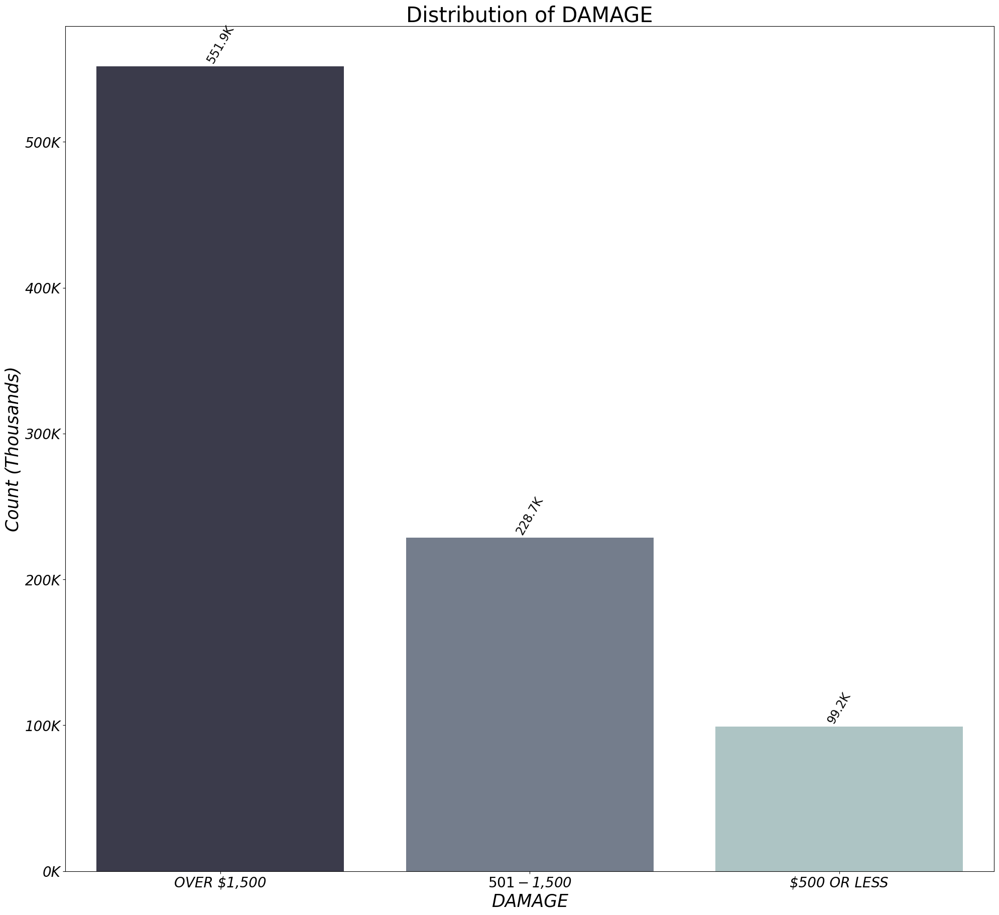

In [15]:
# count plot for 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'DAMAGE')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

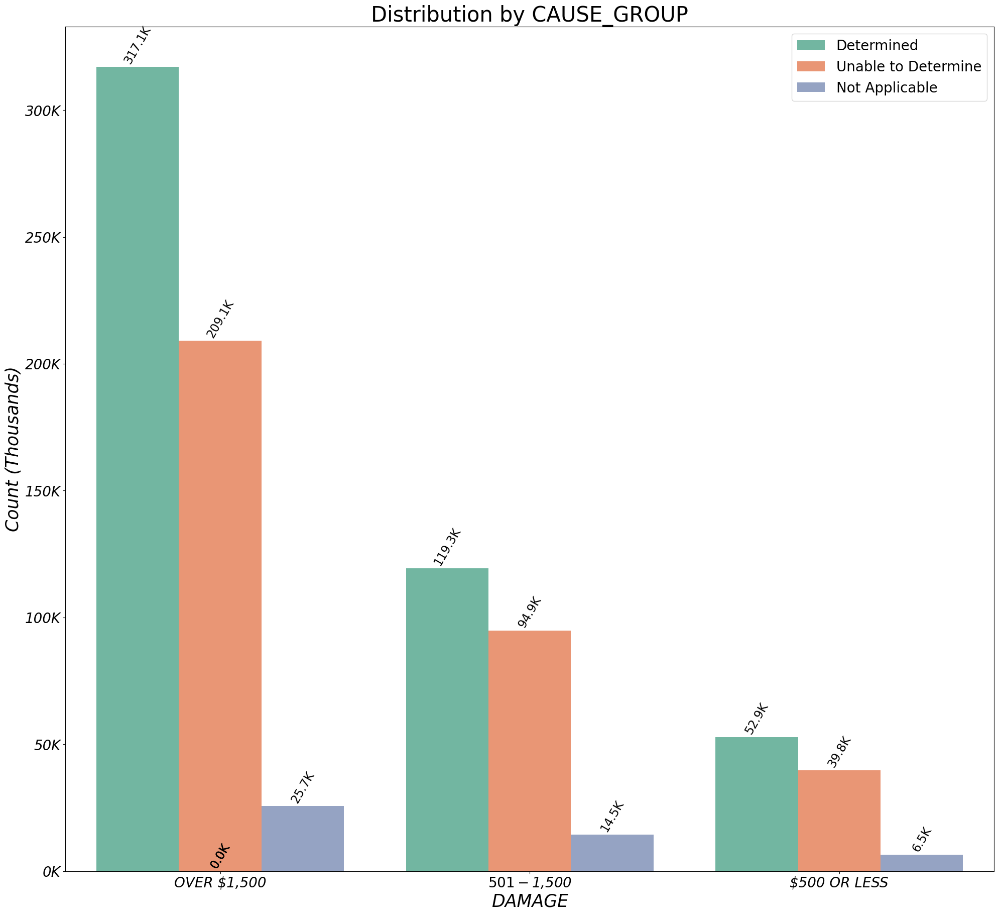

In [16]:
# count plot for 'DAMAGES' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'DAMAGE', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

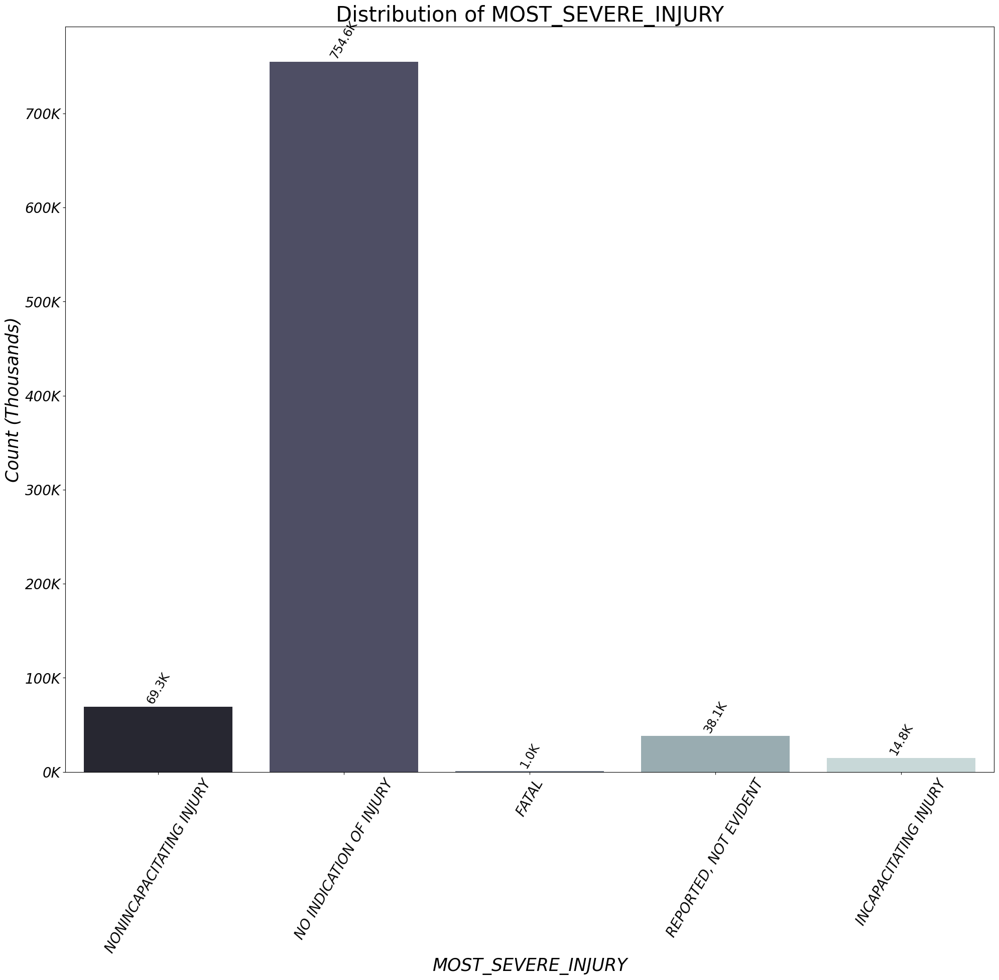

In [17]:
# count plot for 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'MOST_SEVERE_INJURY')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# refresh the plot
plt.show()

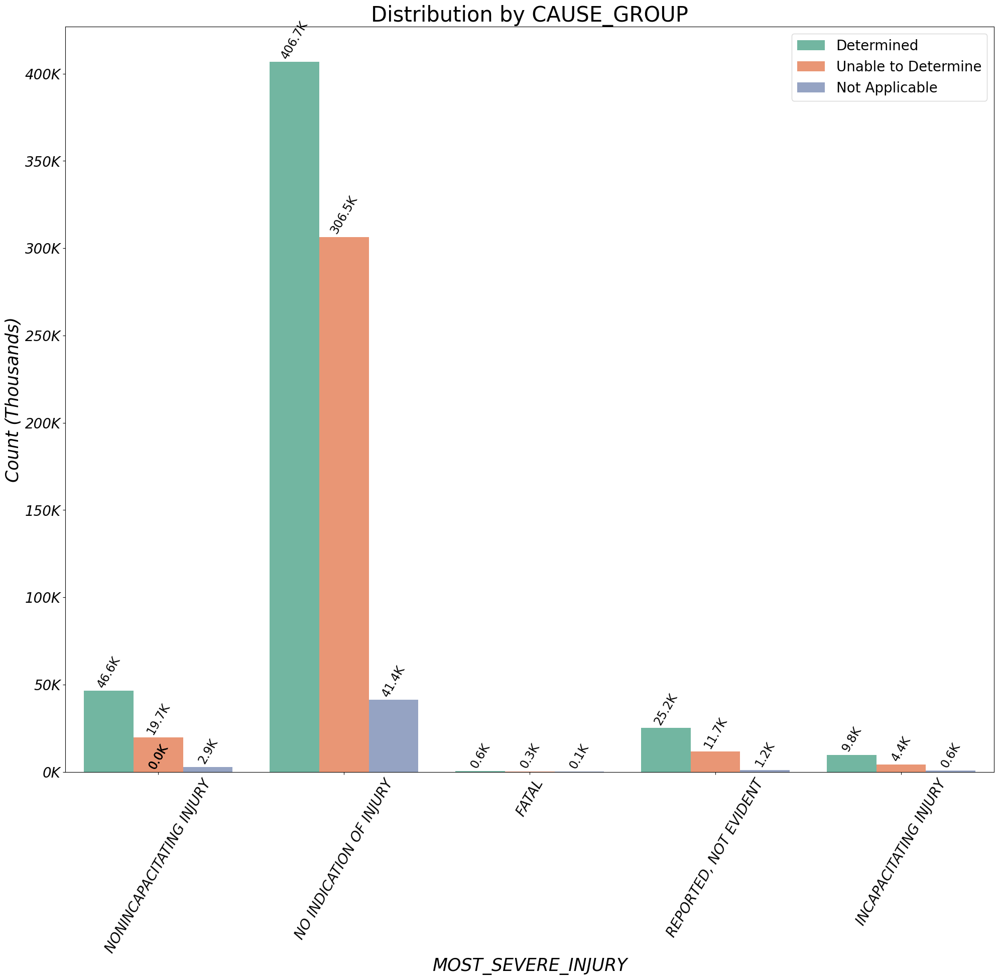

In [18]:
# count plot for MOST_SEVERE_INJURY by CAUSE_GROUP
fig, ax = countplot_df_crashes(df_crashes, 'MOST_SEVERE_INJURY', 'CAUSE_GROUP', 'Set2')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, and Damages.

* The majority of crashes have extensive damages (530k).
* The overwhelming majority of crashes have no injuries (730k).
* Crashes with extensive damages have better (2:1) Determined vs Undetermined cause ratio, whereas the lower damages have close to 1:1 ratio.

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by Posted Speed Limit.

Let's take a look at what are the logged speed limits.

In [19]:
(df_crashes['POSTED_SPEED_LIMIT']).value_counts()

POSTED_SPEED_LIMIT
30    647807
35     58432
25     56209
20     36741
15     31377
10     20579
40      8384
0       7555
45      5849
5       4887
55       864
50       273
3        216
9         96
39        92
99        66
60        52
1         41
24        38
2         30
65        20
32        20
34        16
33        14
11        11
26        10
36         8
6          7
70         6
7          6
18         4
22         4
14         4
12         3
29         3
23         2
31         2
8          2
38         2
4          2
62         1
63         1
44         1
16         1
49         1
46         1
Name: count, dtype: int64

Since the location is US, most common speed limits would be:

* 20 mph for School, Park, Business/Downtown.
* 25 mph for Residential.
* 30 - 35 mph for Urban.
* 40, 45, 50, 55mph for Expressway.
* 60, 65, 70 mph for Highway.

Although most of these numbers are present, we can also see some bogus entries (1-14) perhaps indicating the speed limit code, 99 indicating no entry, 0 indicating stationary vehicle.

#### Apply mapping to values in 1-14 range and filter out remaining.  

In [20]:
# define the mapping of report codes to speed limits (only values from 1 to 14)
speed_limit_mapping = {
    0: 0,
    1: 5,
    2: 10,
    3: 15,
    4: 20,
    5: 25,
    6: 30,
    7: 35,
    8: 40,
    9: 45,
    10: 50,
    11: 55,
    12: 60,
    13: 65,
    14: 70
}

# apply the mapping only to values in the range 1-14
df_crashes['posted_speed_limit_(mph)'] = df_crashes['POSTED_SPEED_LIMIT'].apply(
    lambda x: speed_limit_mapping[x] if x in speed_limit_mapping else x)

# filter out rows where 'Posted Speed Limit (mph)' is not in the speed limit mapping values
# convert mapping values to a set for faster lookup
valid_speed_limits = set(speed_limit_mapping.values())  

df_filtered = df_crashes[df_crashes['posted_speed_limit_(mph)'].isin(valid_speed_limits)]

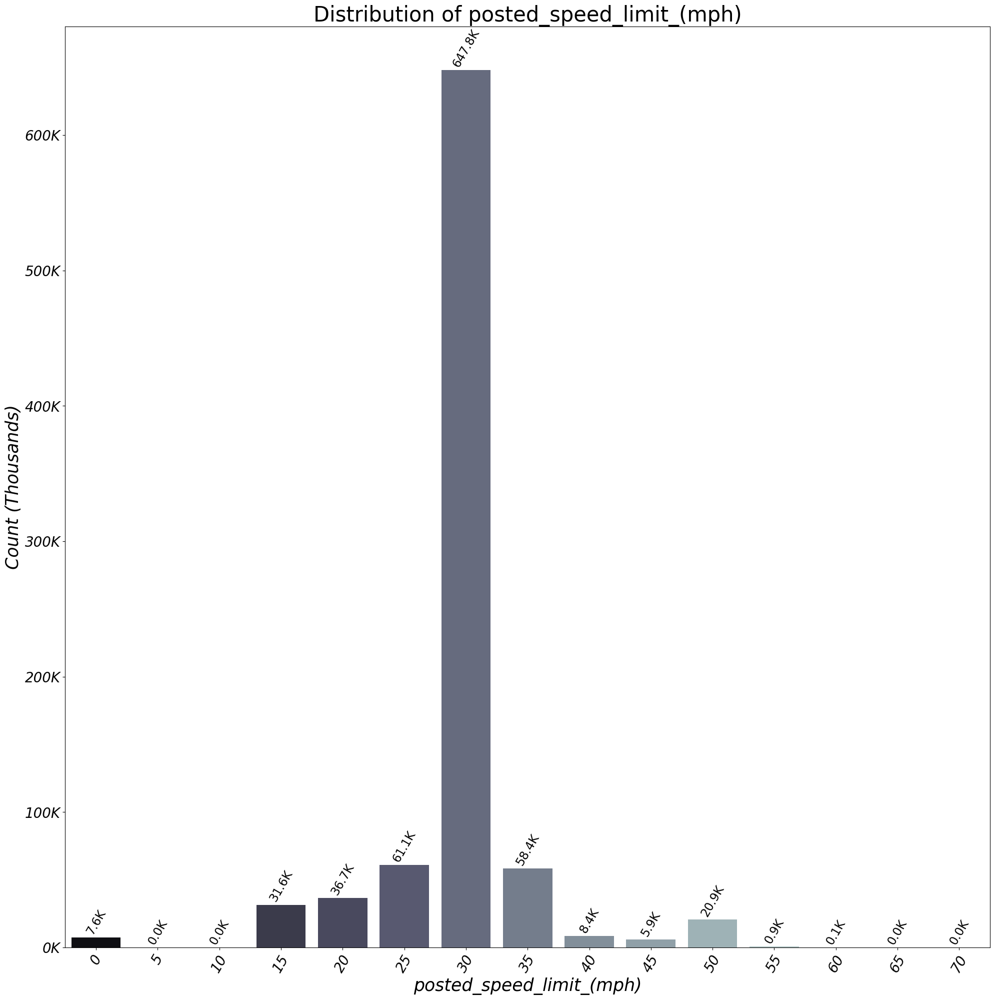

In [21]:
# count plot for 'posted_speed_limit_(mph)'
fig, ax = countplot_df_crashes(df_filtered, 'posted_speed_limit_(mph)')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# refresh the plot
plt.show()

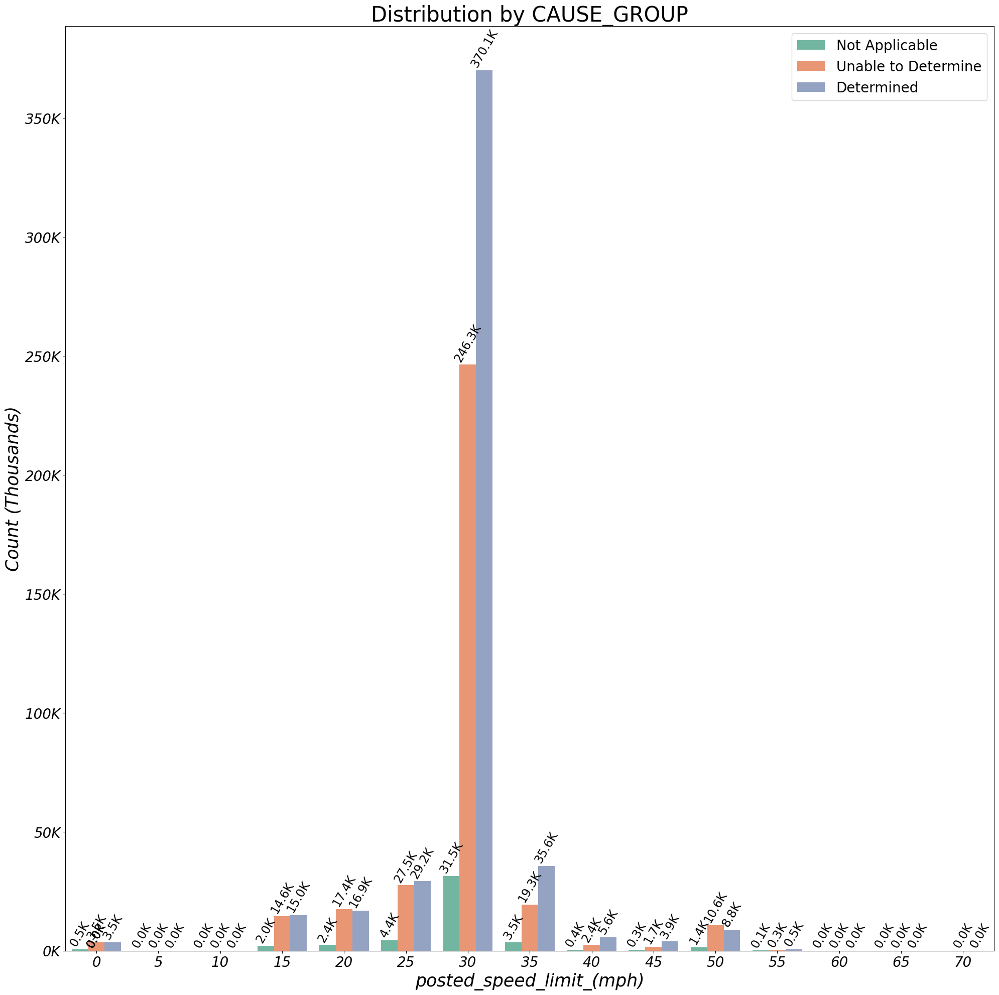

In [22]:
# count plot for 'POSTED_SPEED_LIMIT' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_filtered, 'posted_speed_limit_(mph)', 'CAUSE_GROUP', 'Set2')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

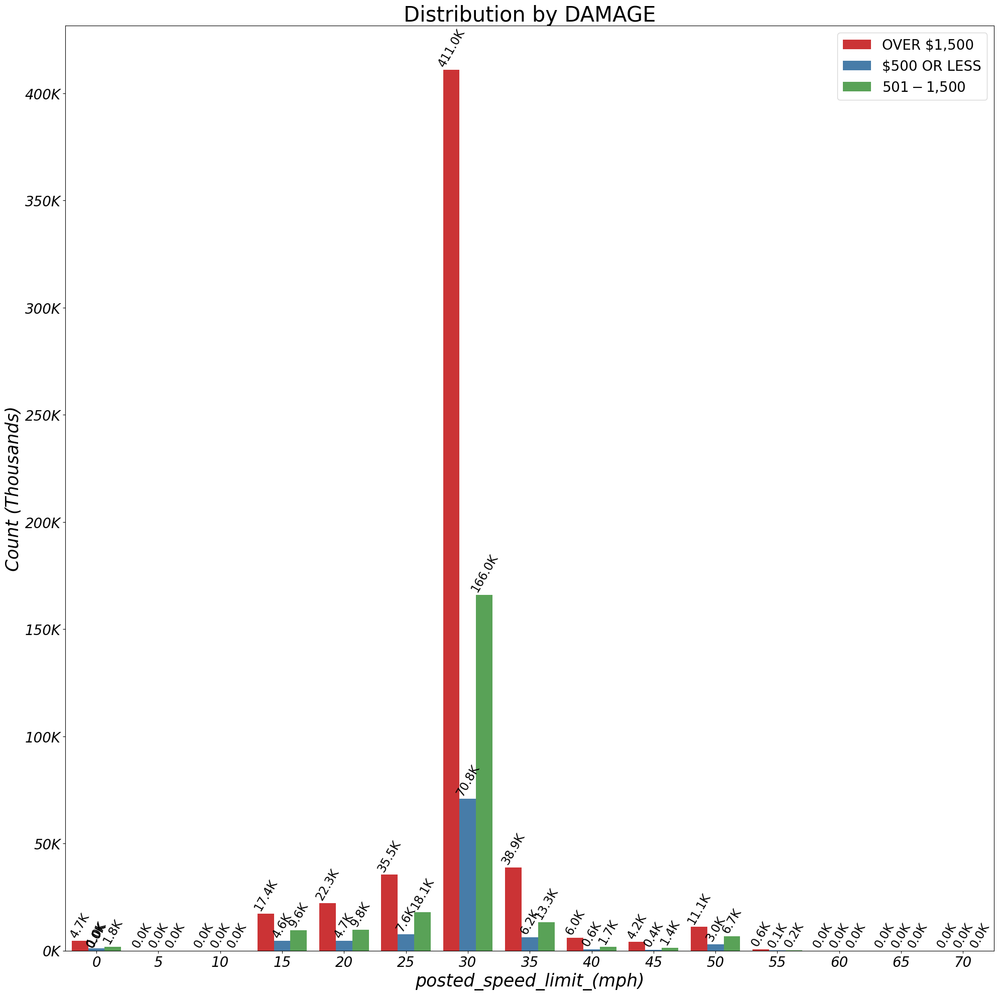

In [23]:
# count plot for 'POSTED_SPEED_LIMIT' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_filtered, 'posted_speed_limit_(mph)', 'DAMAGE', 'Set1')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

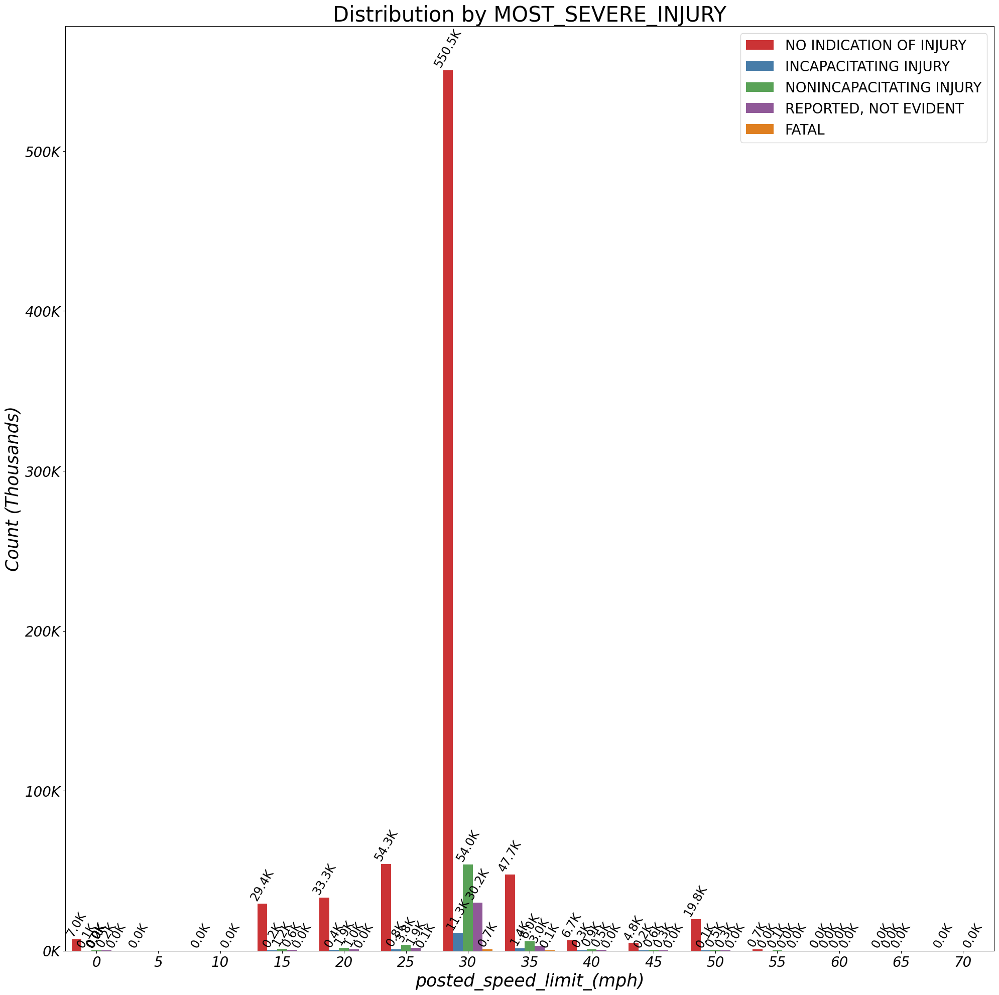

In [24]:
# count plot for 'POSTED_SPEED_LIMIT' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_filtered, 'posted_speed_limit_(mph)', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, and Damages vs Speed Limit.

* Majority of crashes occurs in 25-35 mph speed limit.
* Crashes in 30-35 mph zone have the best Determined:Undetermined ratio.
* Crashes in 30-35 mph zonehave the most damage.

### Crashes EDA: Visualizing Primary Cause Determination by Injury Severity, Damages and Weather Condition.

In [25]:
(df_crashes['WEATHER_CONDITION']).value_counts()

WEATHER_CONDITION
CLEAR                       692429
RAIN                         76257
UNKNOWN                      49665
SNOW                         28400
CLOUDY/OVERCAST              25560
OTHER                         2727
FREEZING RAIN/DRIZZLE         1740
FOG/SMOKE/HAZE                1347
SLEET/HAIL                    1010
BLOWING SNOW                   444
SEVERE CROSS WIND GATE         154
BLOWING SAND, SOIL, DIRT         7
Name: count, dtype: int64

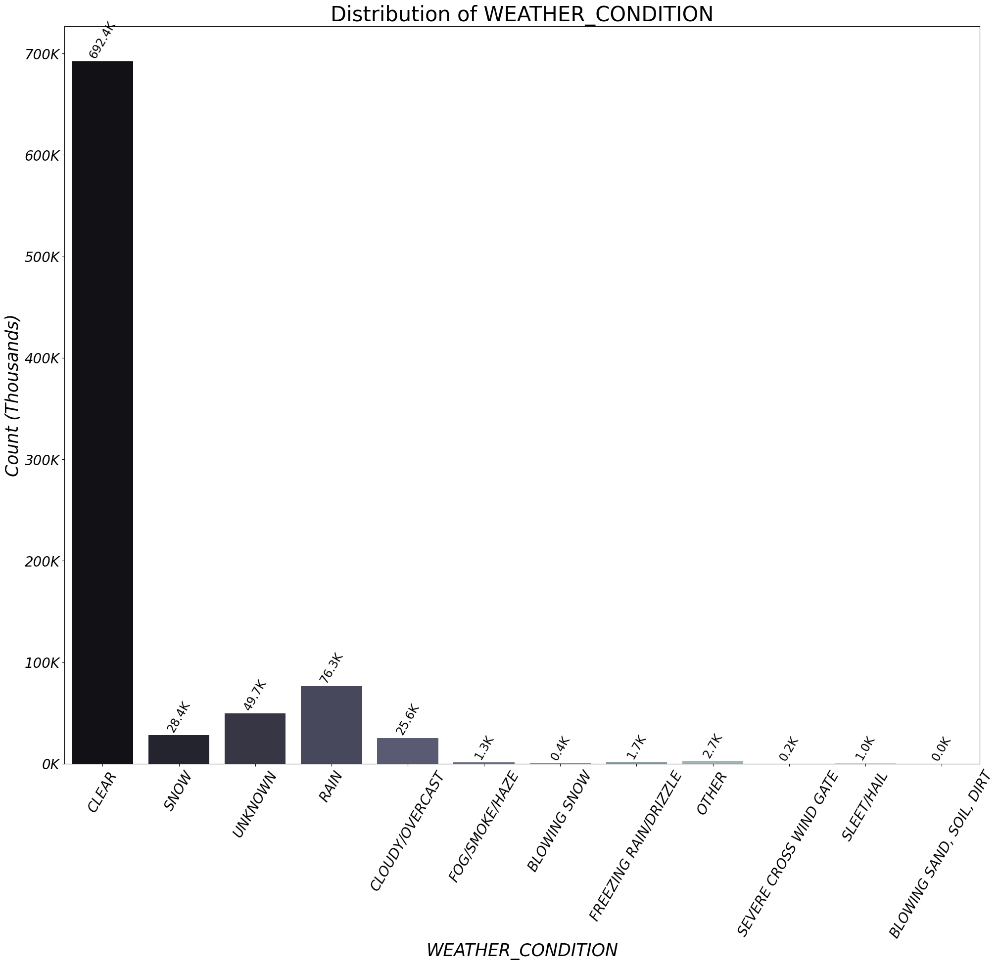

In [26]:
# count plot for 'WEATHER_CONDITION'
fig, ax = countplot_df_crashes(df_crashes, 'WEATHER_CONDITION')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# refresh the plot
plt.show()

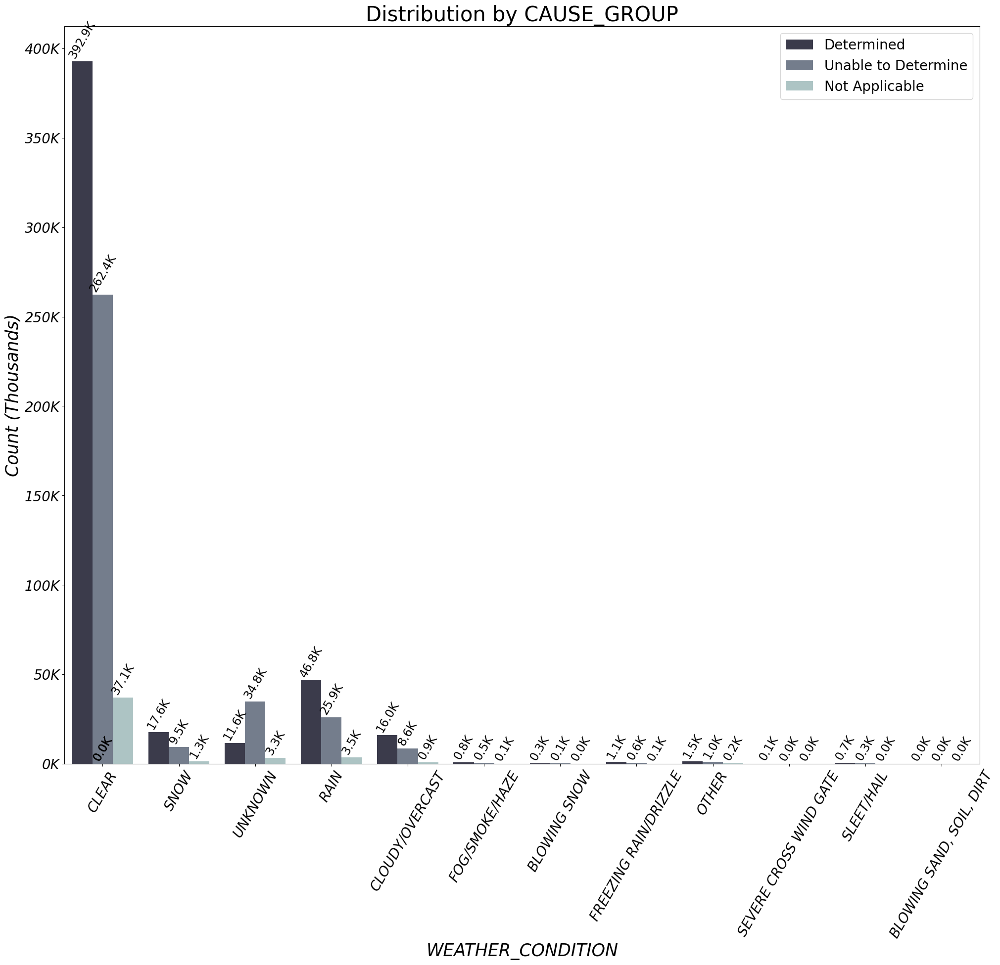

In [27]:
# count plot for 'WEATHER_CONDITION' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'WEATHER_CONDITION', 'CAUSE_GROUP')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# refresh the plot
plt.show()

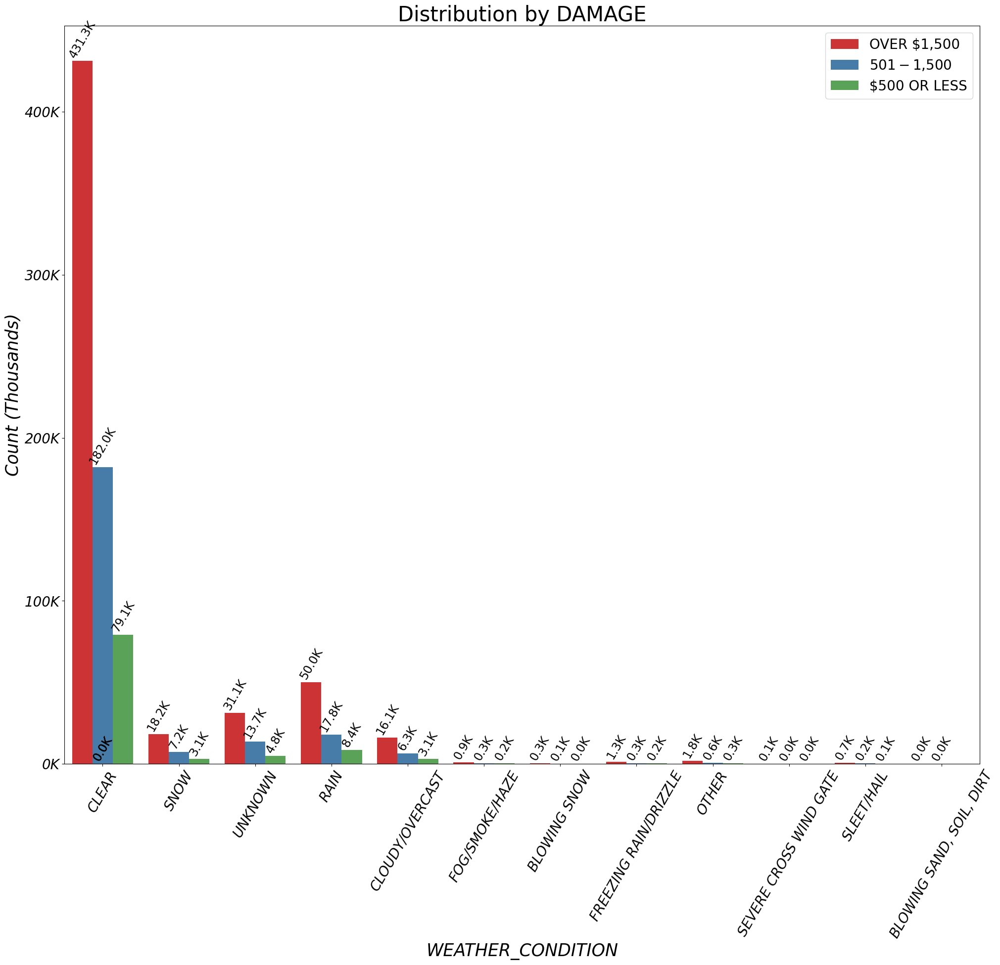

In [28]:
# count plot for 'WEATHER_CONDITION' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'WEATHER_CONDITION', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, and Damages vs Weather Condition.

* The majority of crashes occur in clear weather. The second largest amount of crashes occurs in rain.

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by First Crash Type.

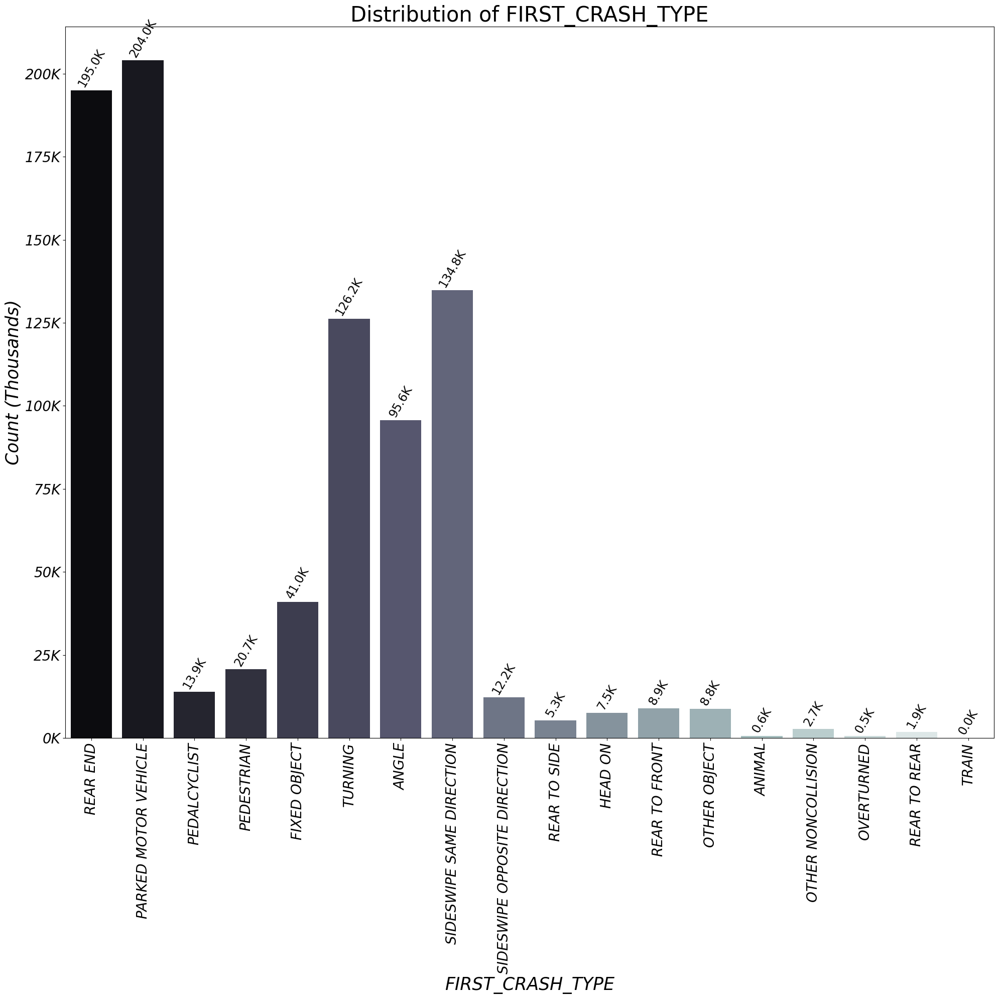

In [29]:
# count plot for 'FIRST_CRASH_TYPE'
fig, ax = countplot_df_crashes(df_crashes, 'FIRST_CRASH_TYPE')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

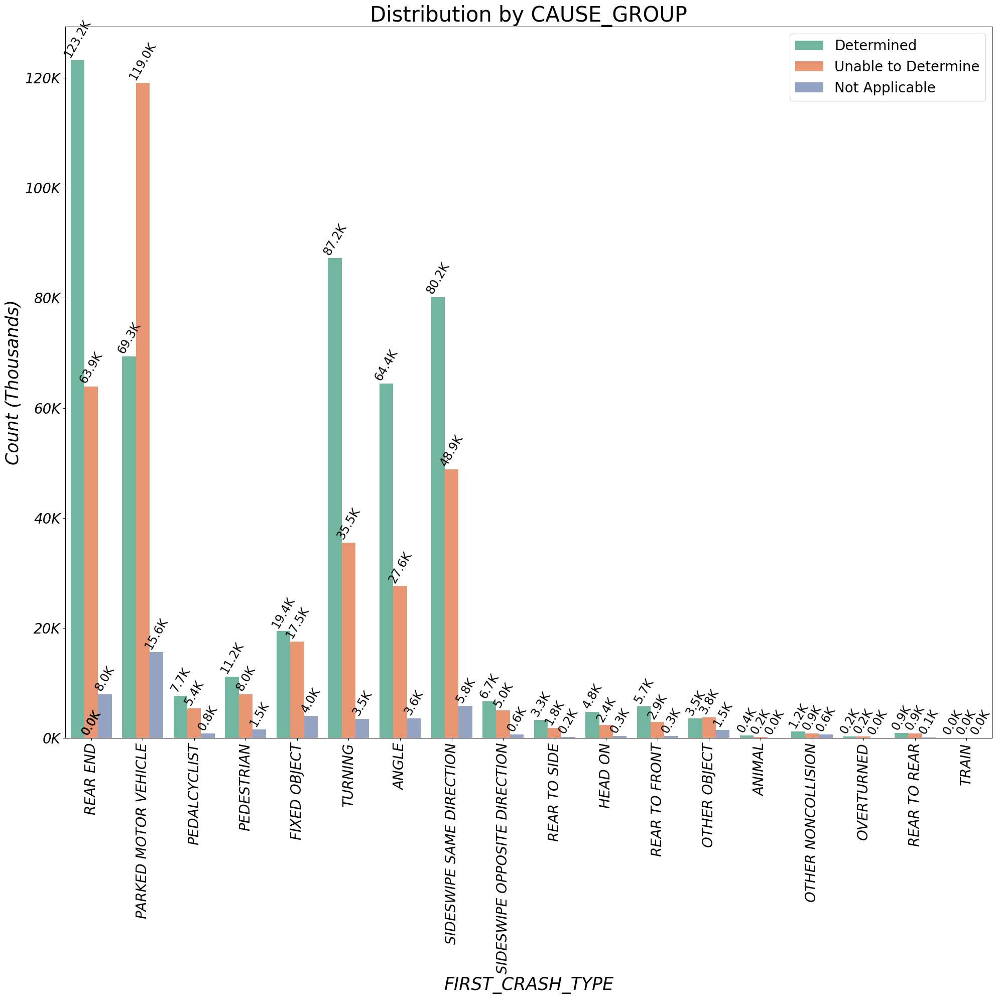

In [30]:
# count plot for 'FIRST_CRASH_TYPE' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'FIRST_CRASH_TYPE', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

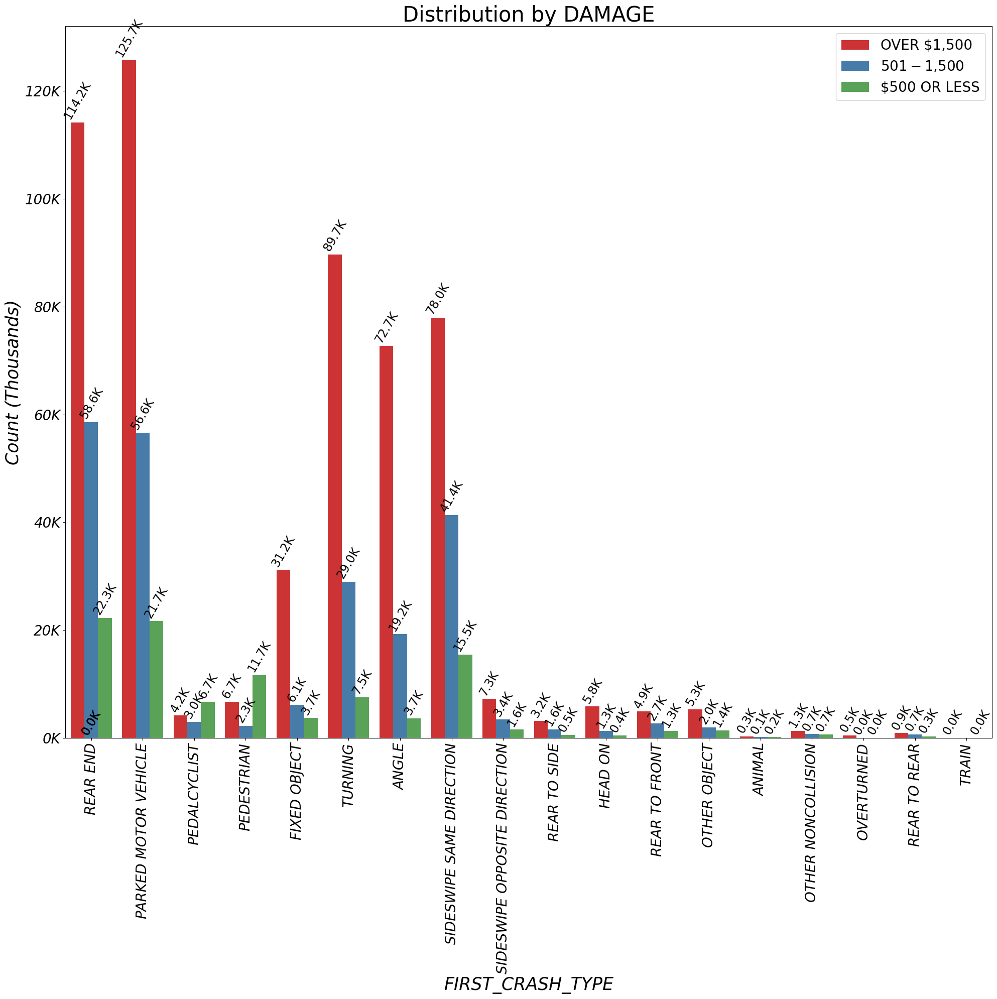

In [31]:
# count plot for 'FIRST_CRASH_TYPE' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'FIRST_CRASH_TYPE', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

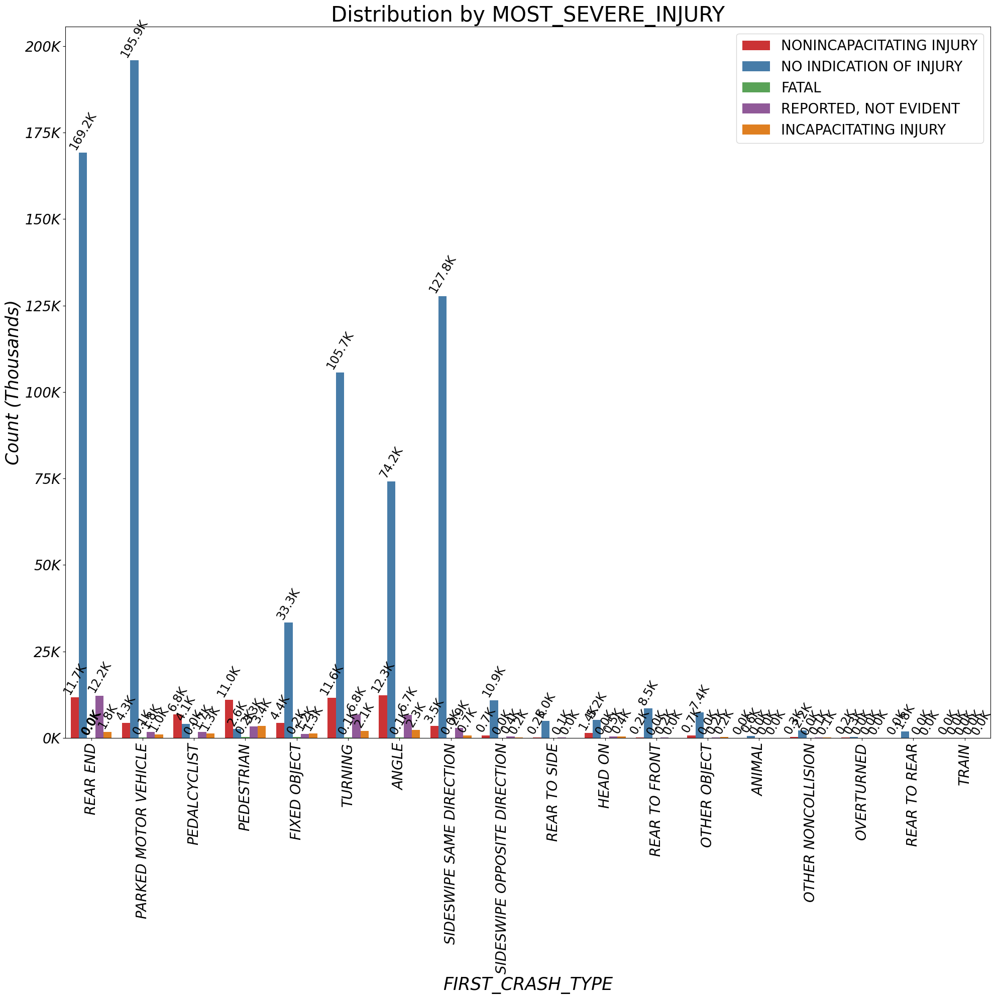

In [32]:
# count plot for 'FIRST_CRASH_TYPE' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'FIRST_CRASH_TYPE', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, and Damages by First Crash Type.

* Parked motor vehicle had the highest amount of damages and has the highest undetermined amount of crash causes.

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by Time (Day, Hour, Month).

We're going to look at the distribution of causes, damages, aind injuries by time of the day (`CRASH_HOUR`), week (`CRASH_DAY_OF_WEEK`), and month(`CRASH_MONTH`).

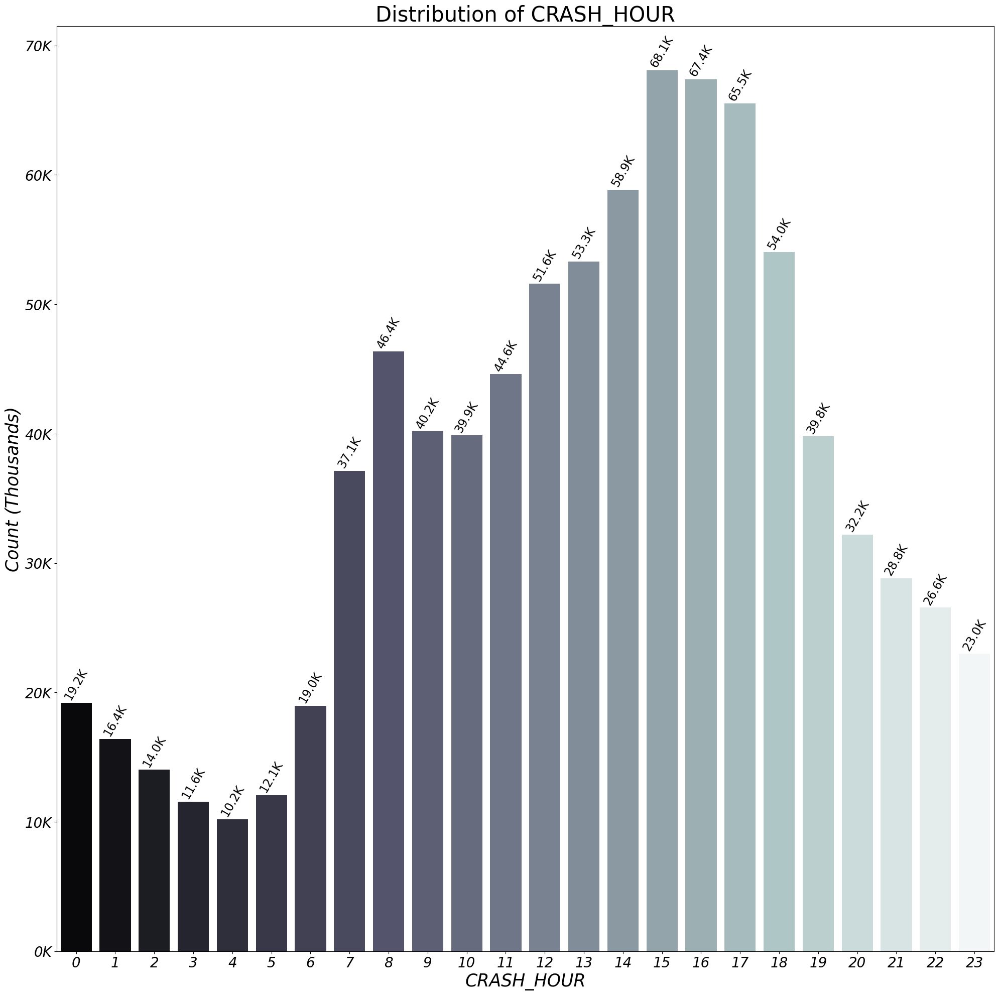

In [33]:
# count plot for 'CRASH_HOUR'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_HOUR')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

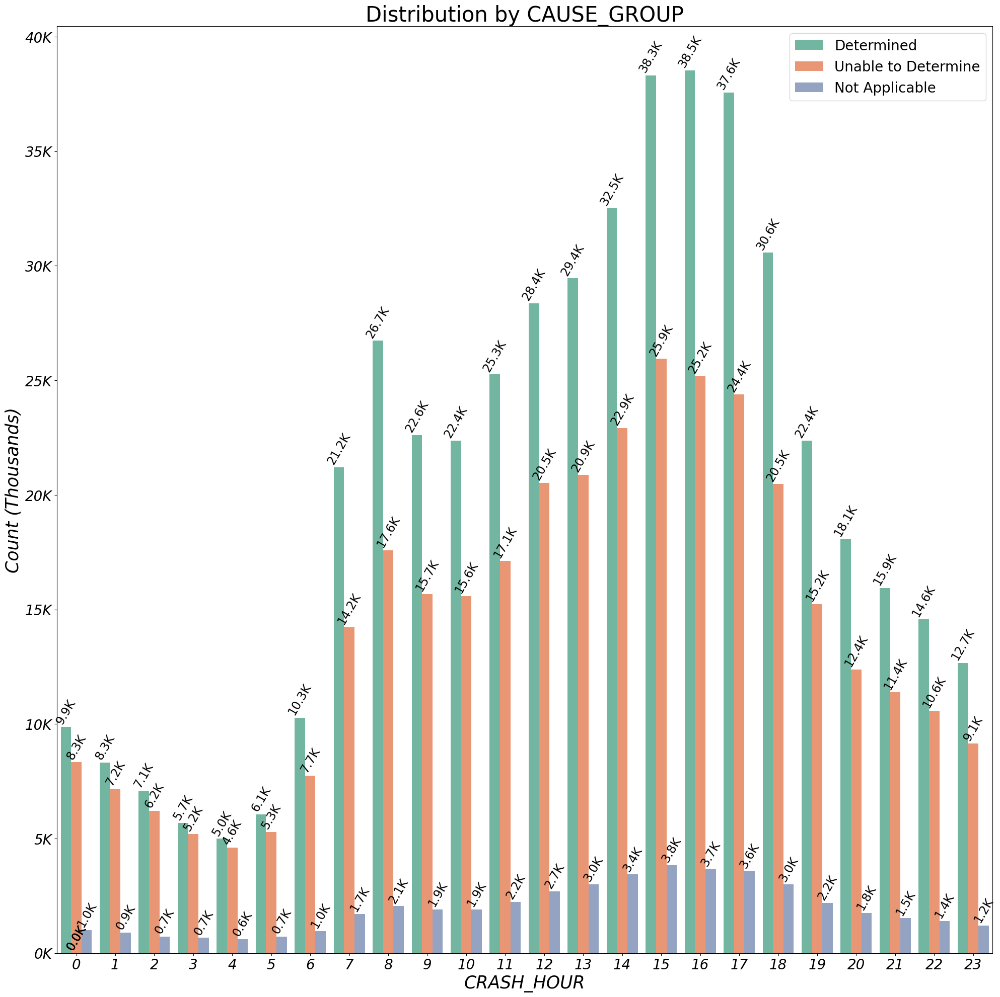

In [34]:
# count plot for 'CRASH_HOUR' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_HOUR', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

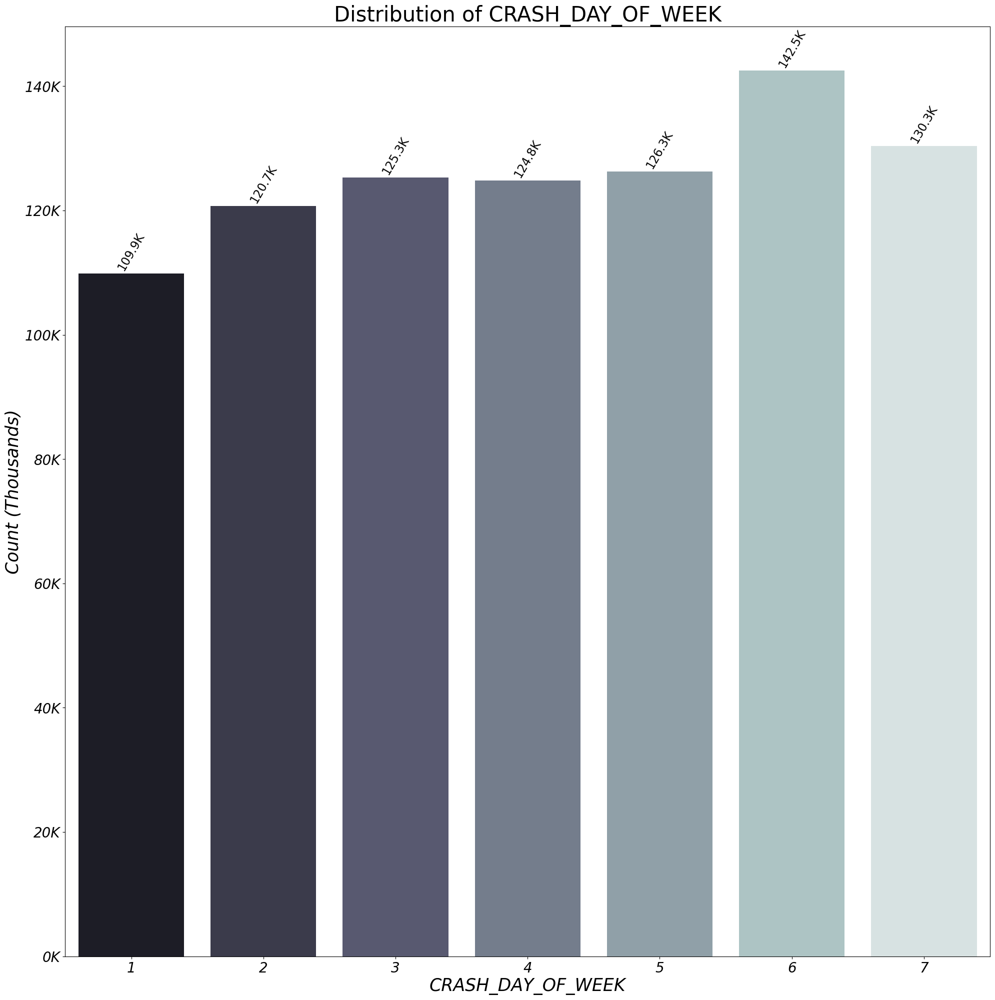

In [35]:
# count plot for 'CRASH_DAY_OF_WEEK'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_DAY_OF_WEEK')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

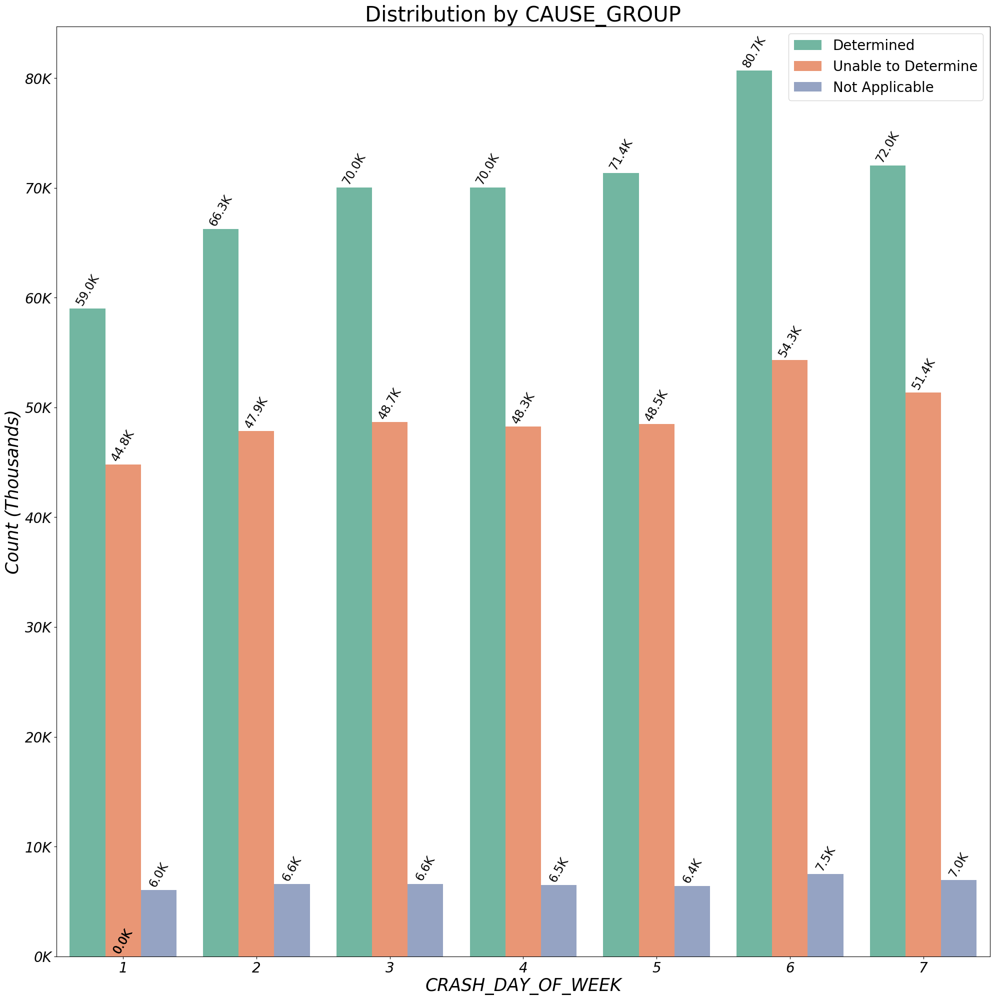

In [36]:
# count plot for 'CRASH_DAY_OF_WEEK' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_DAY_OF_WEEK', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

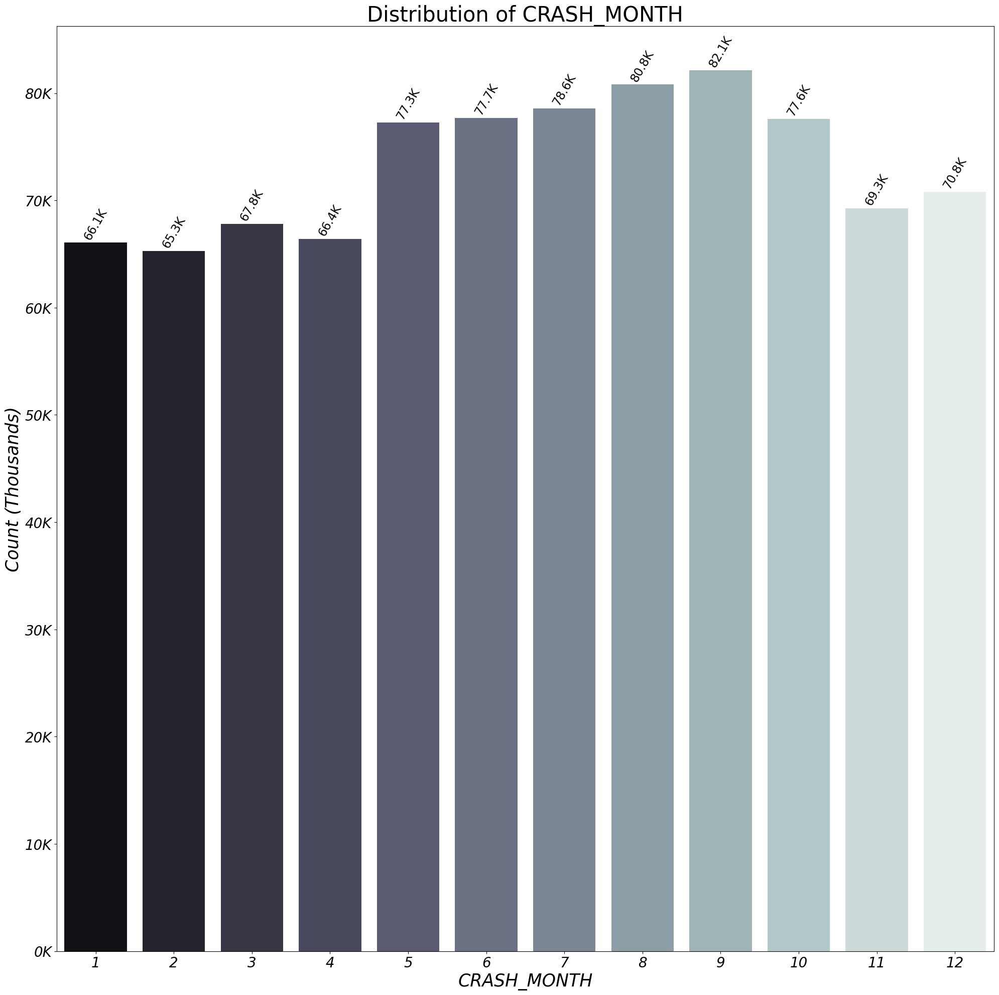

In [37]:
# count plot for 'CRASH_MONTH'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_MONTH')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

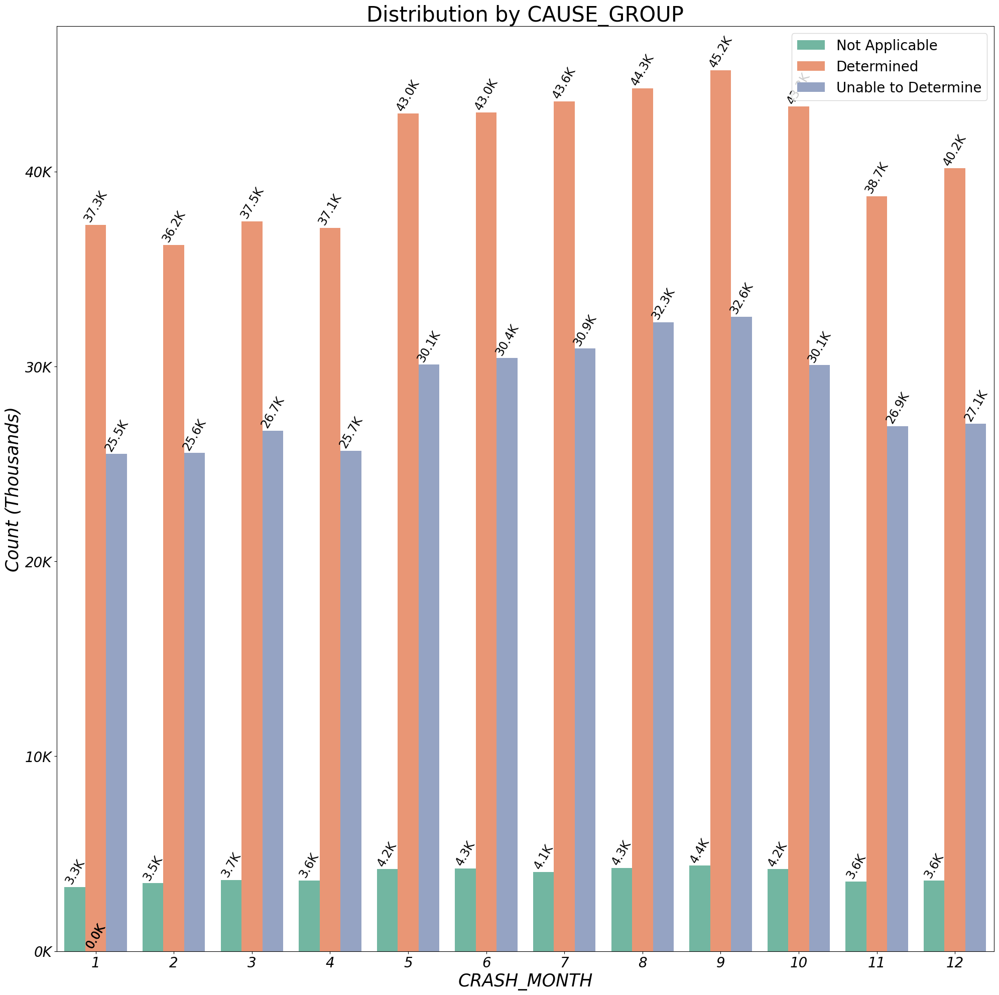

In [38]:
# count plot for 'CRASH_MONTH' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_MONTH', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

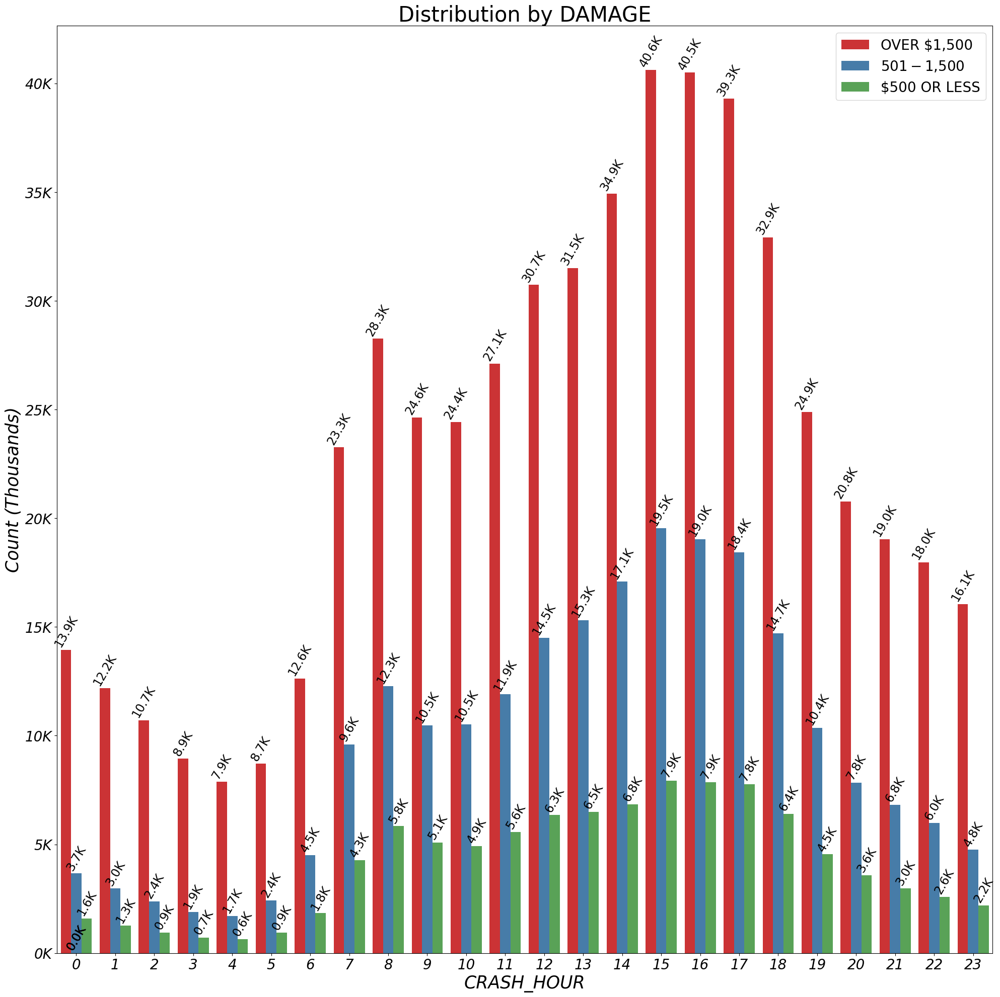

In [39]:
# count plot for 'CRASH_HOUR' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_HOUR', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

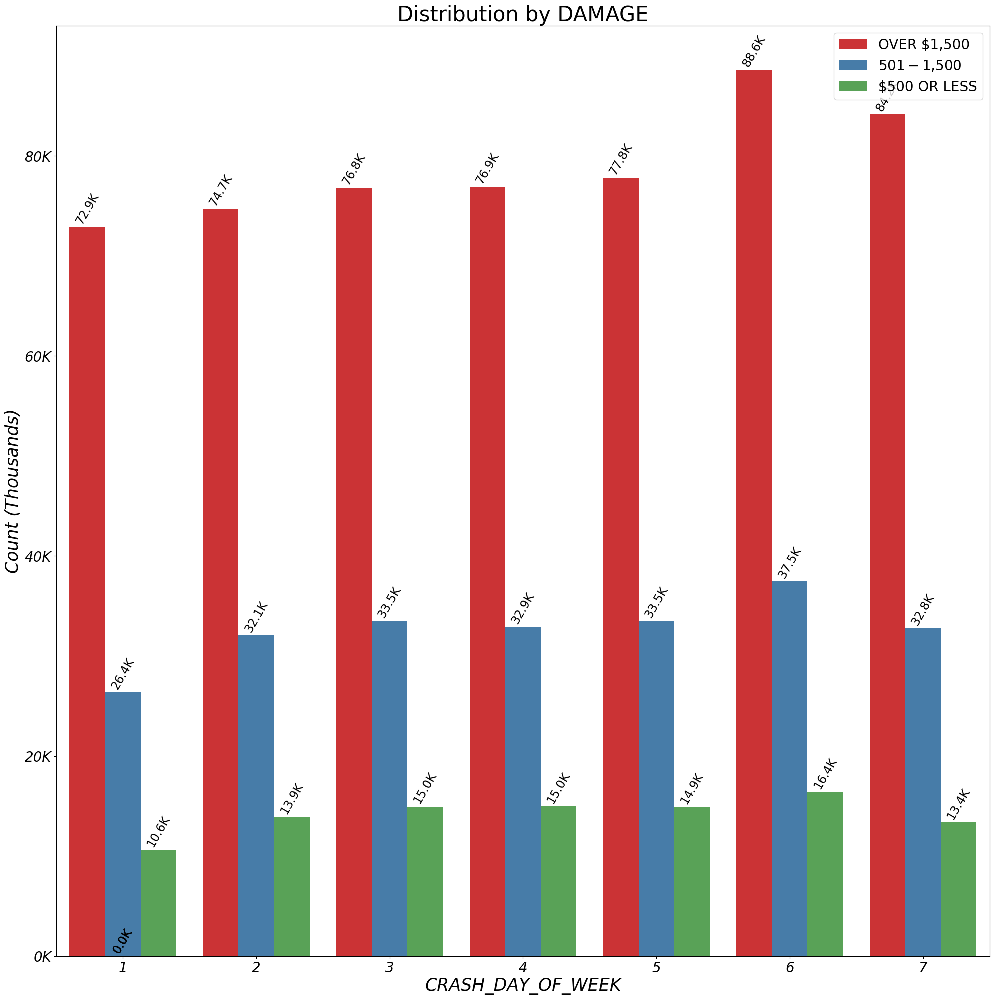

In [40]:
# count plot for 'CRASH_DAY_OF_WEEK' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_DAY_OF_WEEK', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

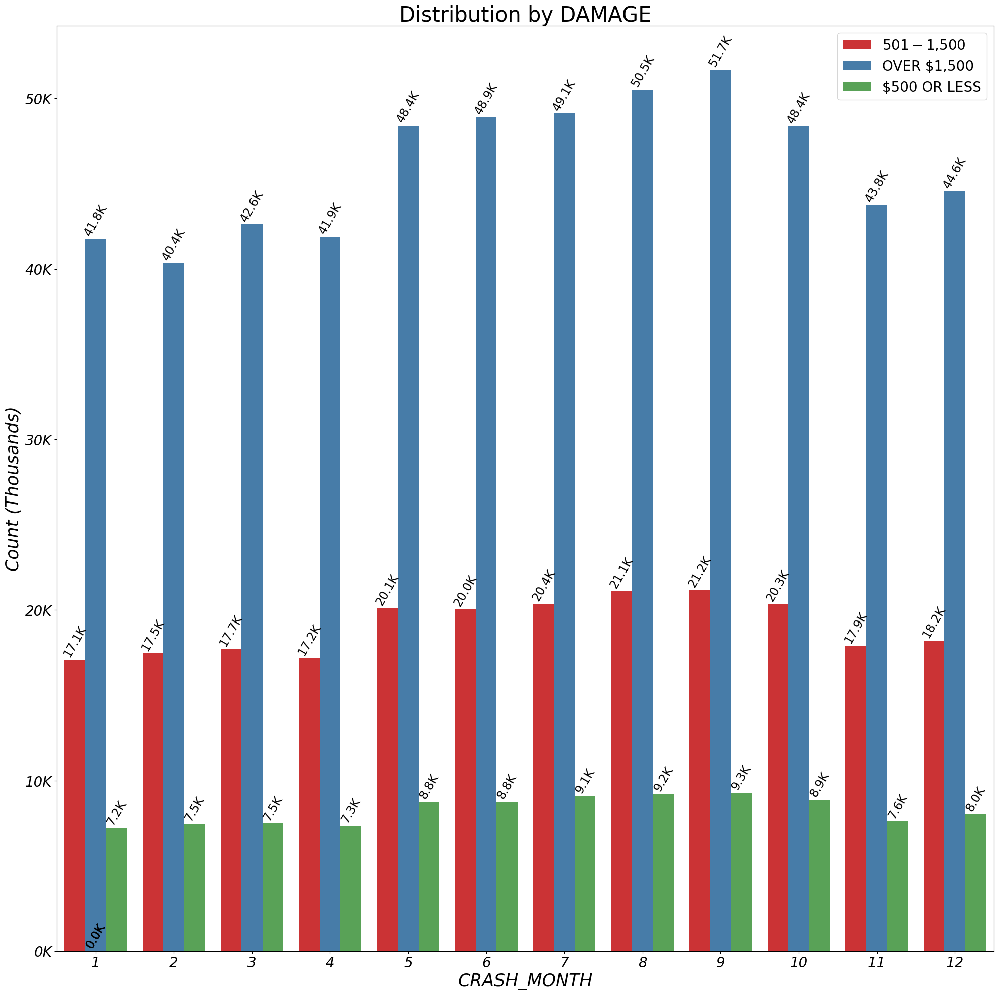

In [41]:
# count plot for 'CRASH_MONTH' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_MONTH', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

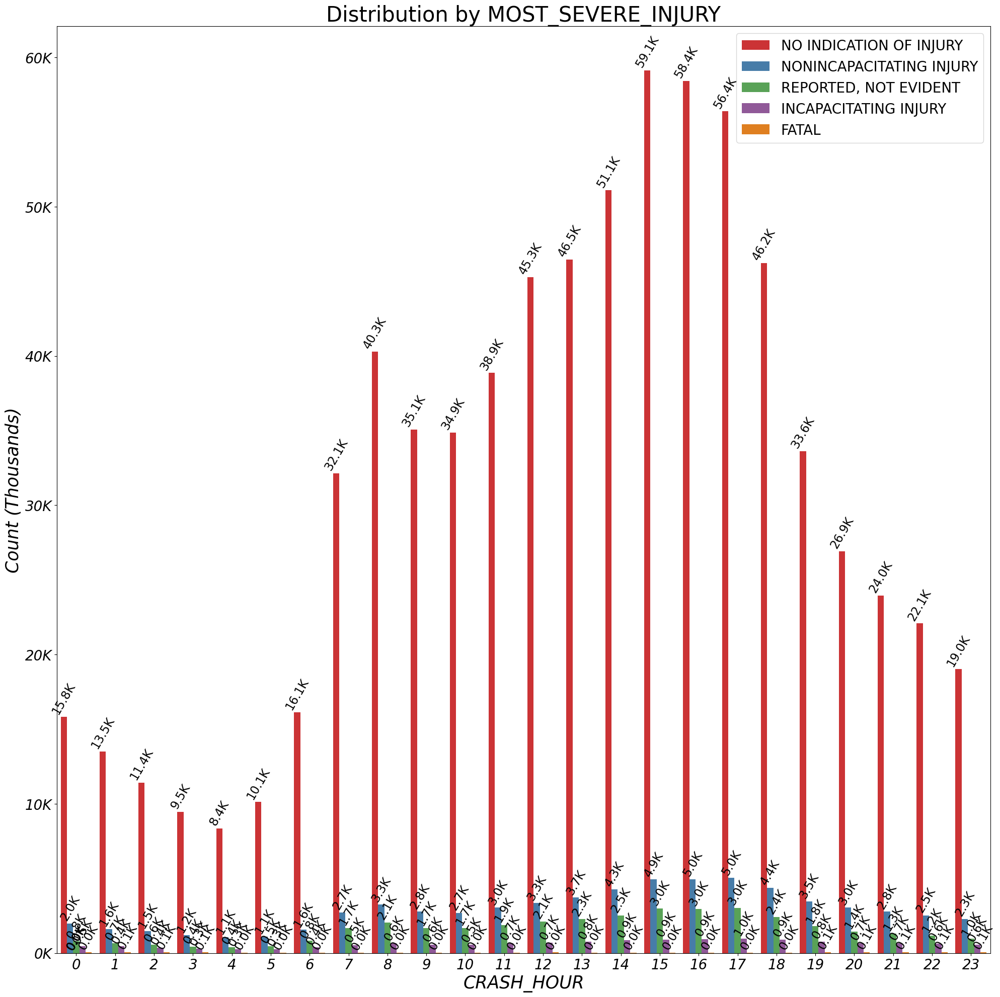

In [42]:
# count plot for 'CRASH_HOUR' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_HOUR', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

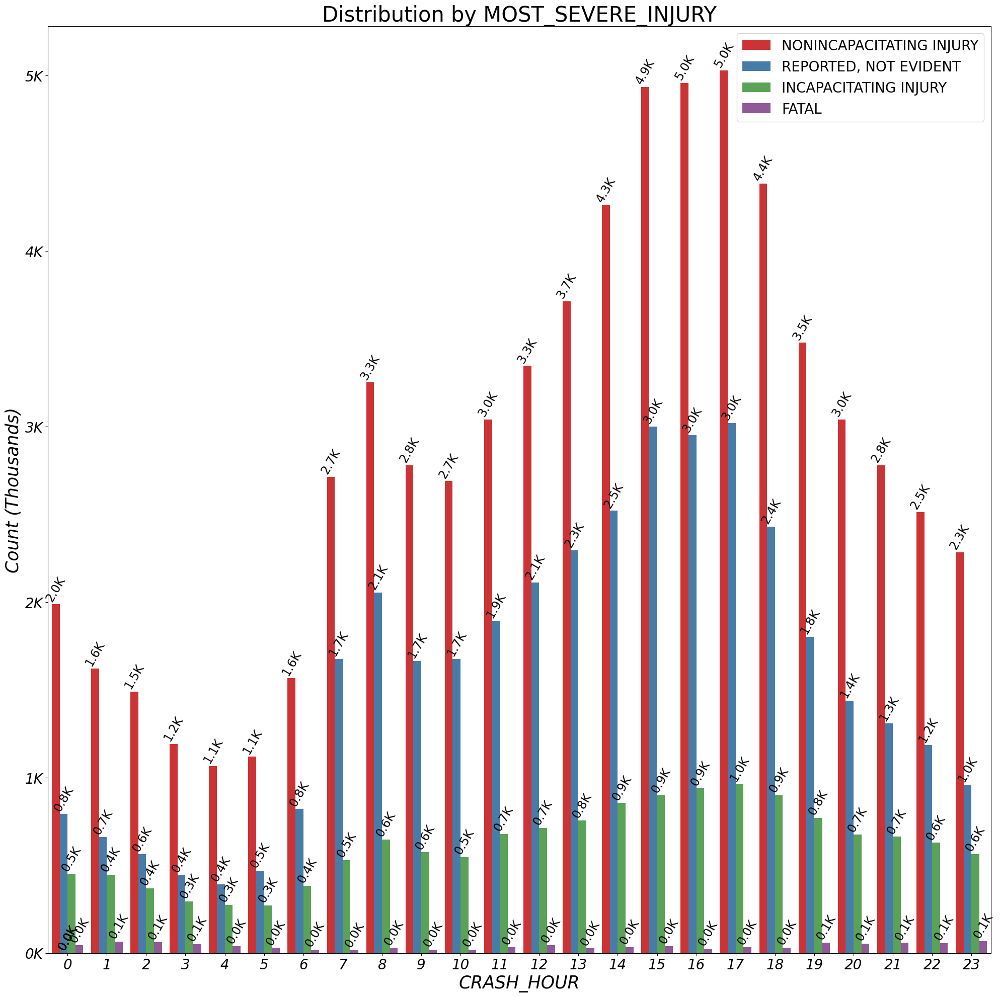

In [43]:
# filter out all non-injured crashes:
df_filtered = df_crashes[df_crashes['MOST_SEVERE_INJURY'] != 'NO INDICATION OF INJURY']

# count plot for 'CRASH_HOUR' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_filtered, 'CRASH_HOUR', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

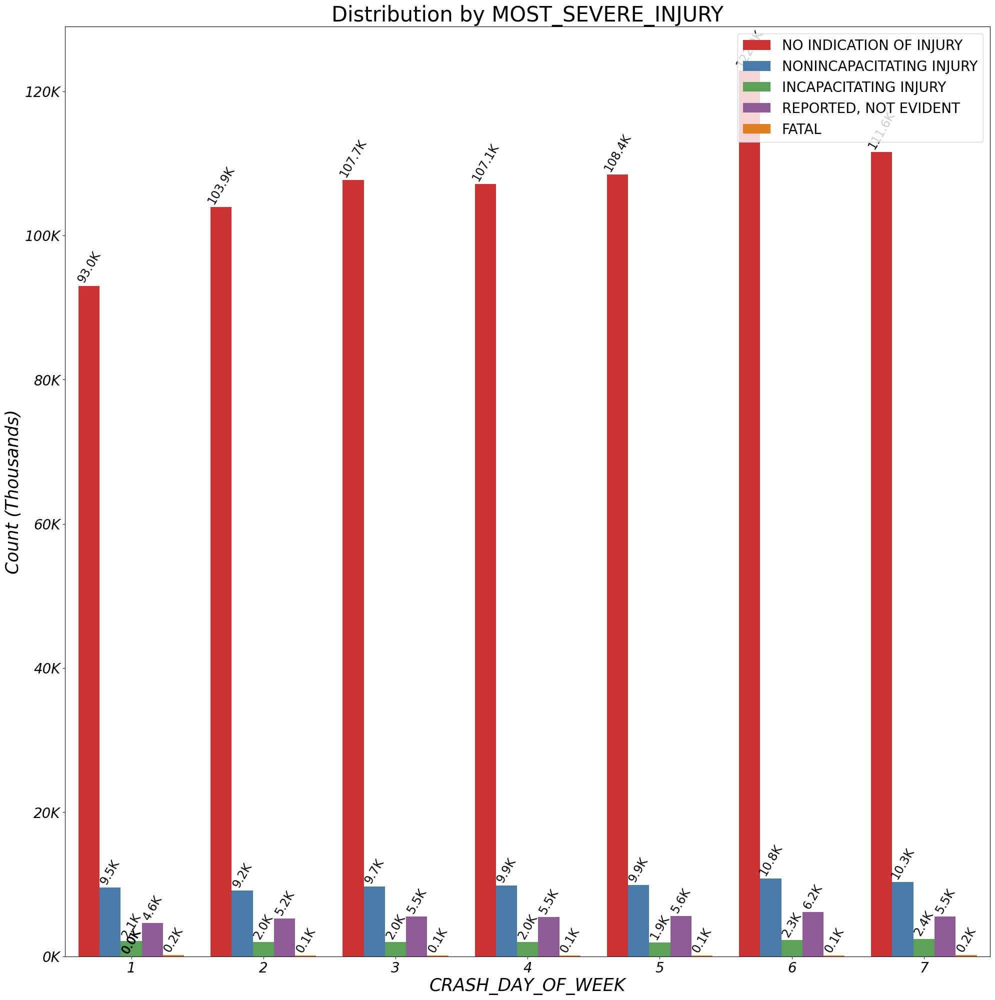

In [44]:
# count plot for 'CRASH_DAY_OF_WEEK' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_DAY_OF_WEEK', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

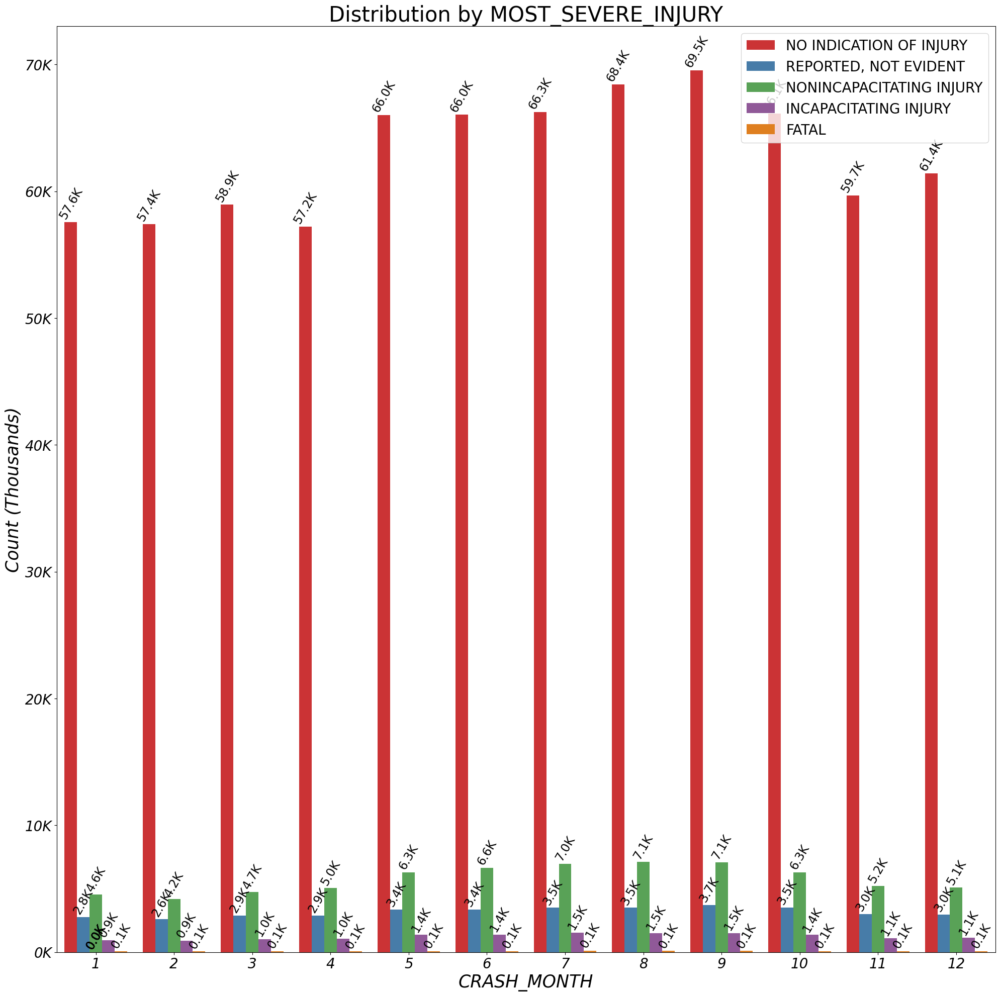

In [45]:
# count plot for 'CRASH_MONTH' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'CRASH_MONTH', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

#### Mapping datetime day of the week to `CRASH_DAY_OF_WEEK`. 

In [46]:
# select 5 random entries from 'CRASH_DAY_OF_WEEK' and 'DAY_OF_CRASH'
random_slice = df_crashes[['CRASH_DAY_OF_WEEK', 'CRASH_DATE']].sample(n=5, random_state=42)

# convert 'CRASH_DATE' to datetime if not already
random_slice['CRASH_DATE'] = pd.to_datetime(random_slice['CRASH_DATE'])

# create a new column for the day of the week based on 'CRASH_DATE'
random_slice['CRASH_DAY_OF_WEEK_STR'] = random_slice['CRASH_DATE'].dt.day_name()

random_slice.head()

,CRASH_DAY_OF_WEEK,CRASH_DATE,CRASH_DAY_OF_WEEK_STR
673264,4,2022-03-30 09:02:00,Wednesday
514638,3,2019-05-21 05:43:00,Tuesday
543622,4,2021-10-06 06:40:00,Wednesday
56508,7,2023-05-20 03:26:00,Saturday
784733,2,2023-10-23 18:30:00,Monday


### Initial Overview of Contributory Cause, Injury Severity, and Damages by Crash Date and Time.

* Crash Time (of the day) has a significant impact on both the damages and the injuries: we can clearly see the commute/business hours having up to 3x crashes.
* After filtering out crashes with no injuries, we can see there's an increase in crashes with incapacitating injuries starting in the morning hours, remainig steady throughout the day.
* There's a significant increase in fatal crashes from 7 pm to 2 am. 
* Crash Day (Sunday is coded as 1) has mild impact with Friday (coded as 6) having the most crashes and Sunday having the least.
* Crash Month has the least impact, with May, June being the highest, followed by October (maybe change in weather condition).

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by Lighting Condition.

Here we'll look at the distribution of damages, injuries, and causes by `LIGHTING_CONDITION` type.

In [47]:
(df_crashes['LIGHTING_CONDITION']).value_counts()

LIGHTING_CONDITION
DAYLIGHT                  566265
DARKNESS, LIGHTED ROAD    191601
DARKNESS                   41191
UNKNOWN                    41075
DUSK                       25019
DAWN                       14589
Name: count, dtype: int64

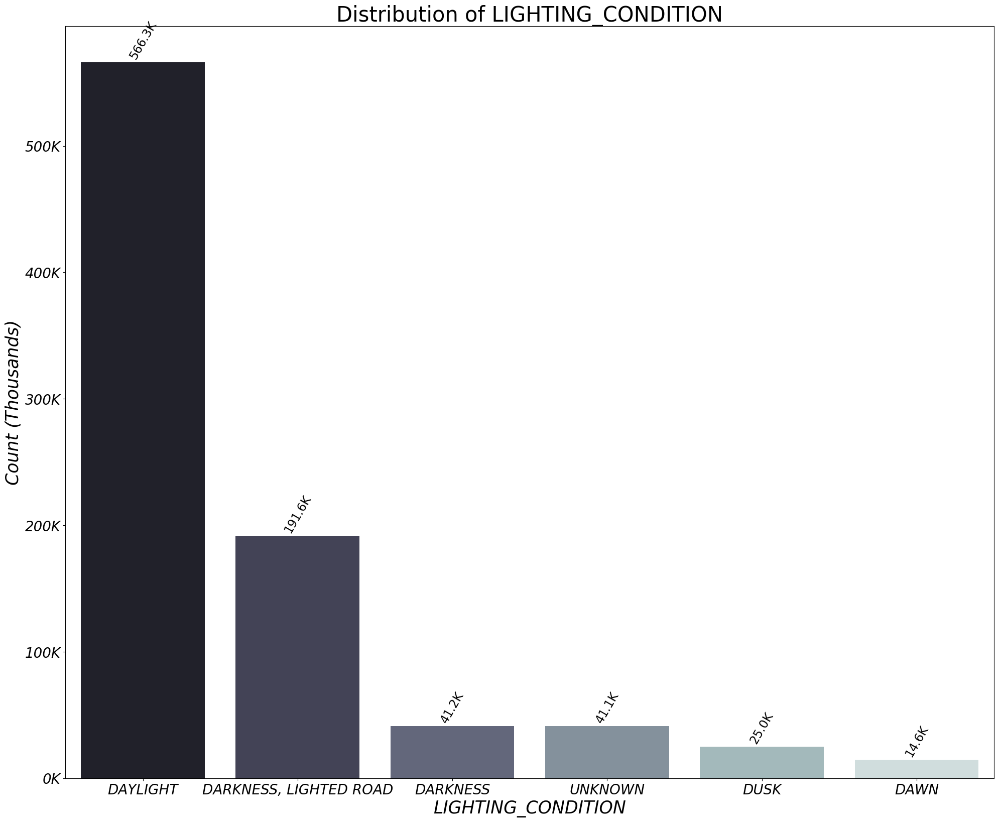

In [48]:
# count plot for 'LIGHTING_CONDITION' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'LIGHTING_CONDITION')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

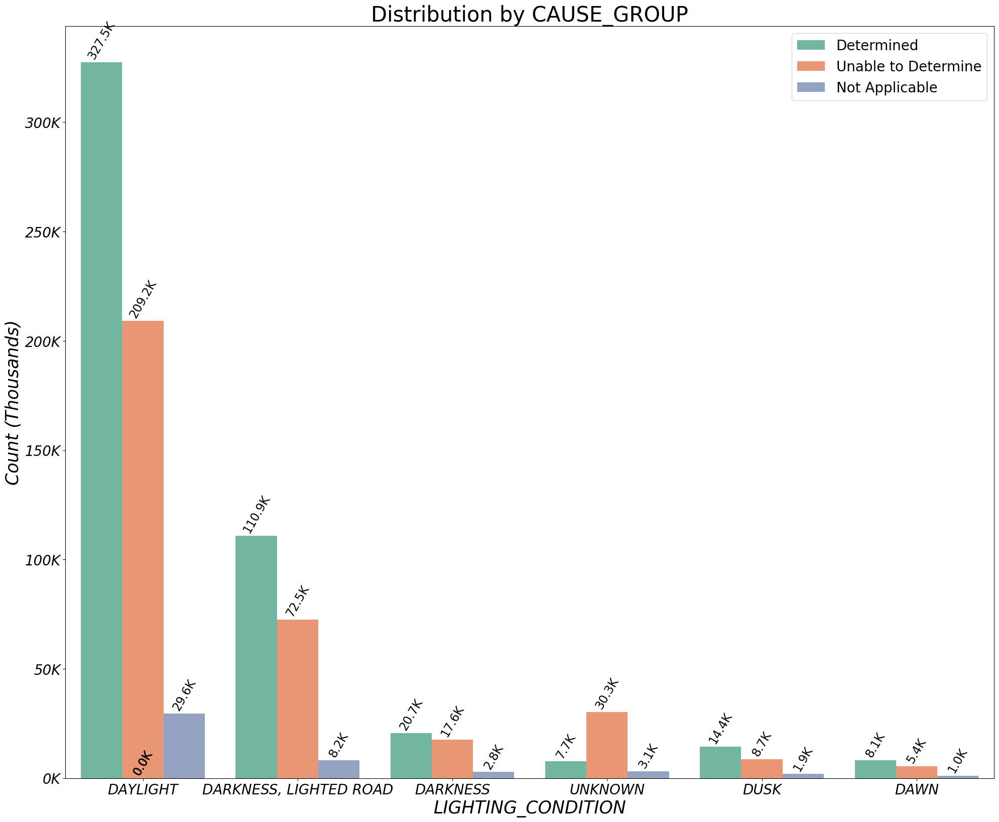

In [49]:
# count plot for 'LIGHTING_CONDITION' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'LIGHTING_CONDITION', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

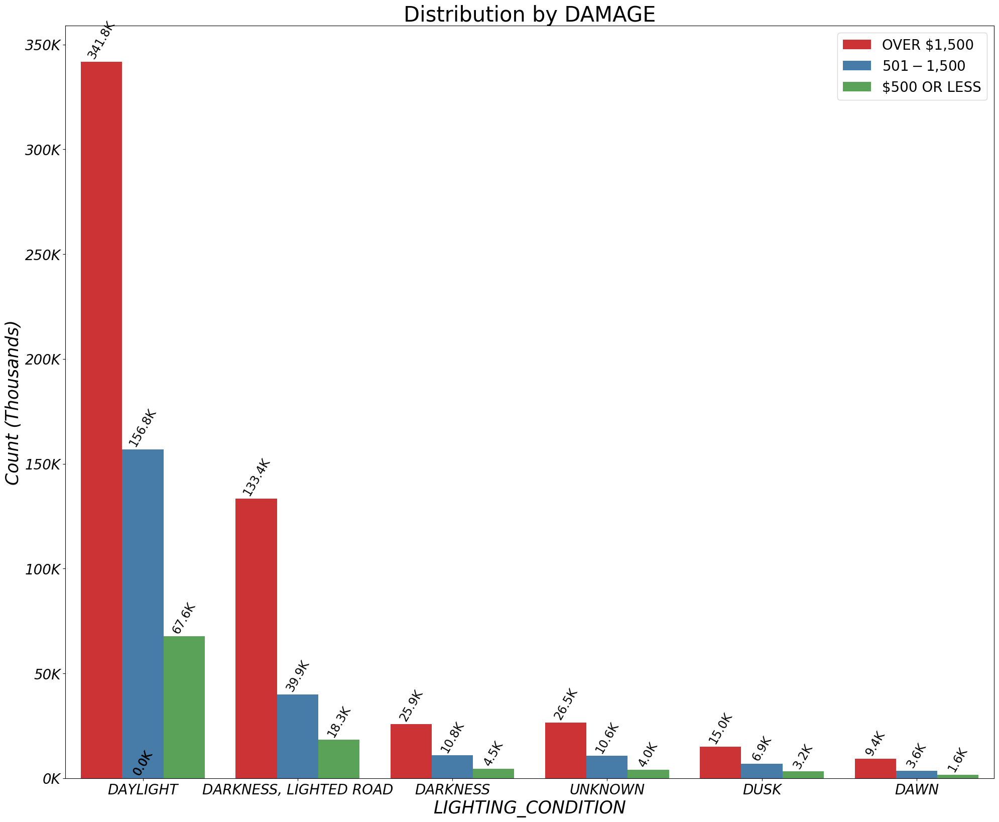

In [50]:
# count plot for 'LIGHTING_CONDITION' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'LIGHTING_CONDITION', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

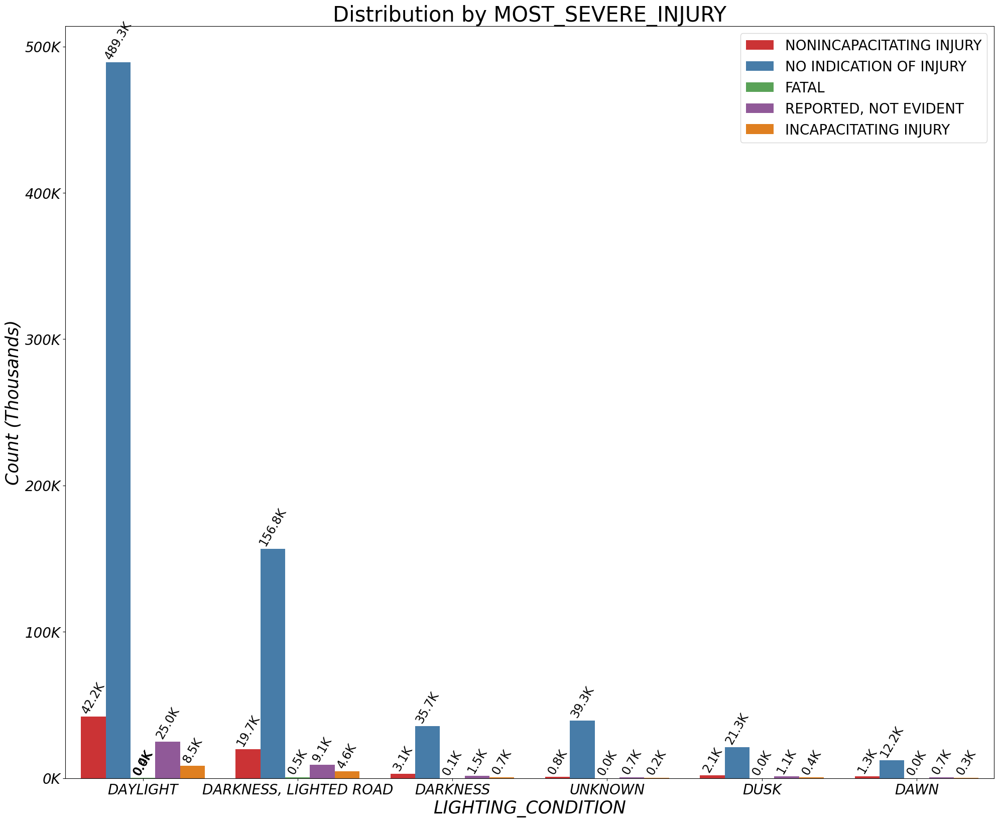

In [51]:
# count plot for 'LIGHTING_CONDITION' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'LIGHTING_CONDITION', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 0 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, and Lighting Condition.

* Most Crashes occur in Daylight or in Darkness/Lighted Road.
* Most high-damage crashes also occur in daylight or Darkness/Lighted Road.
* Most non-incapaciting and incapacitating injuries occur in Daylight or in Darkness/Lighted Road.

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by Trafficway Type.

Here we'll look at the distribution of damages, injuries, and causes by `TRAFFICWAY_TYPE` type.

In [52]:
(df_crashes['TRAFFICWAY_TYPE']).value_counts()

TRAFFICWAY_TYPE
NOT DIVIDED                        379606
DIVIDED - W/MEDIAN (NOT RAISED)    139269
ONE-WAY                            111599
FOUR WAY                            59766
PARKING LOT                         59704
DIVIDED - W/MEDIAN BARRIER          49877
OTHER                               23850
ALLEY                               14501
T-INTERSECTION                      11879
UNKNOWN                             10323
CENTER TURN LANE                     6262
DRIVEWAY                             2839
RAMP                                 2759
UNKNOWN INTERSECTION TYPE            2678
FIVE POINT, OR MORE                  1316
Y-INTERSECTION                       1300
TRAFFIC ROUTE                        1081
NOT REPORTED                          652
ROUNDABOUT                            296
L-INTERSECTION                        183
Name: count, dtype: int64

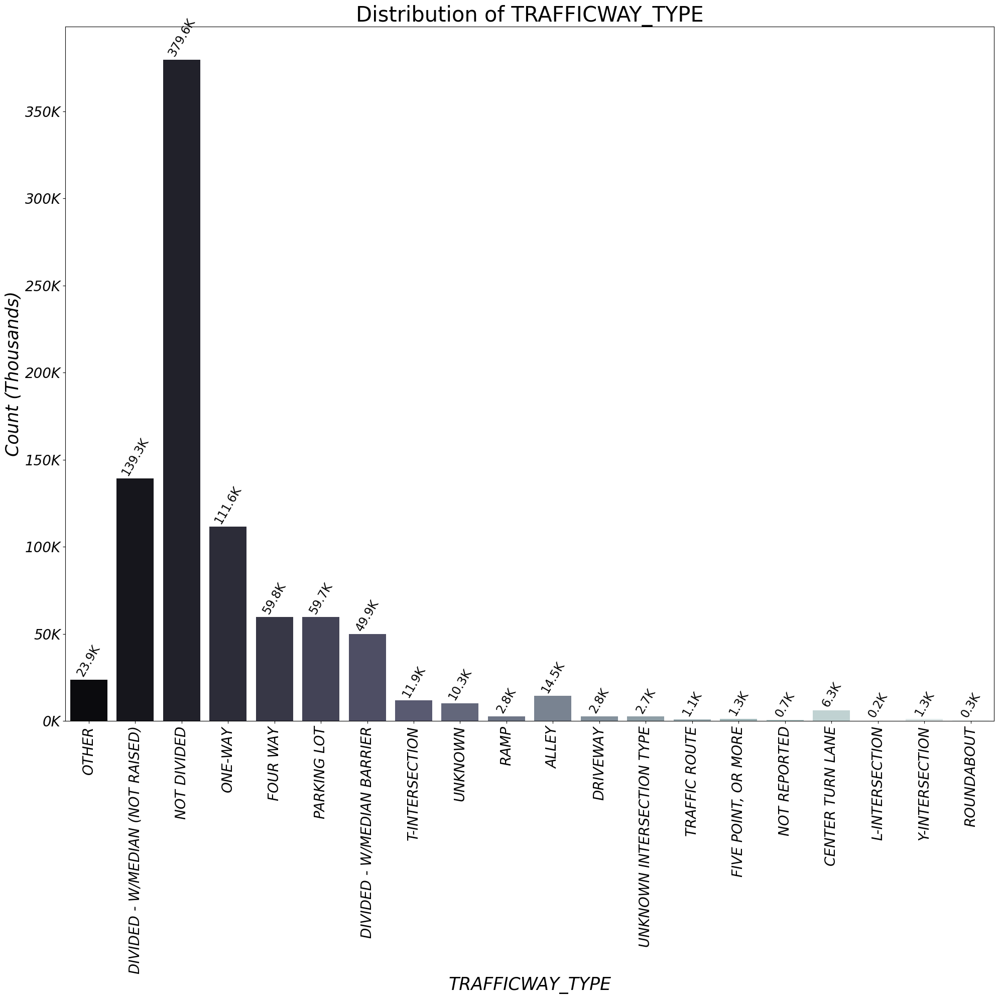

In [53]:
# count plot for 'TRAFFICWAY_TYPE'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFICWAY_TYPE')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

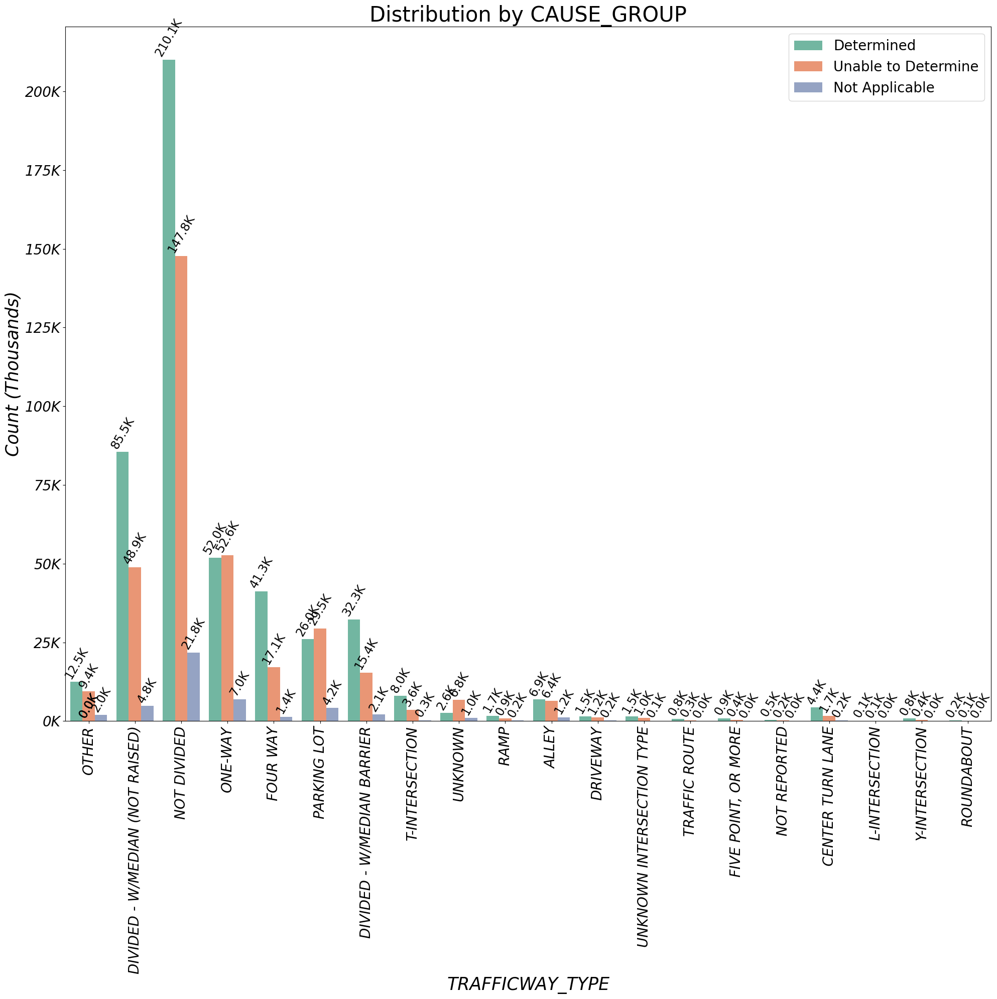

In [54]:
# count plot for 'TRAFFICWAY_TYPE' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFICWAY_TYPE', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

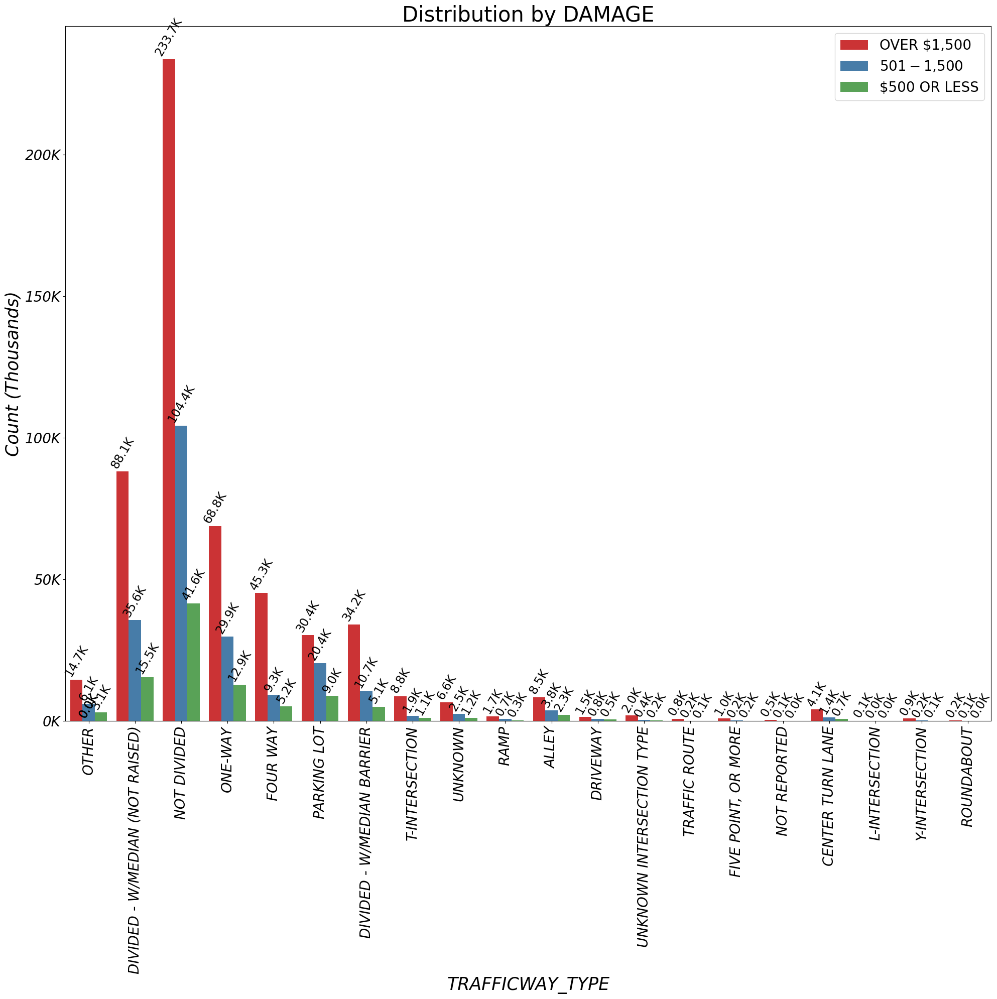

In [55]:
# count plot for 'TRAFFICWAY_TYPE' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFICWAY_TYPE', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

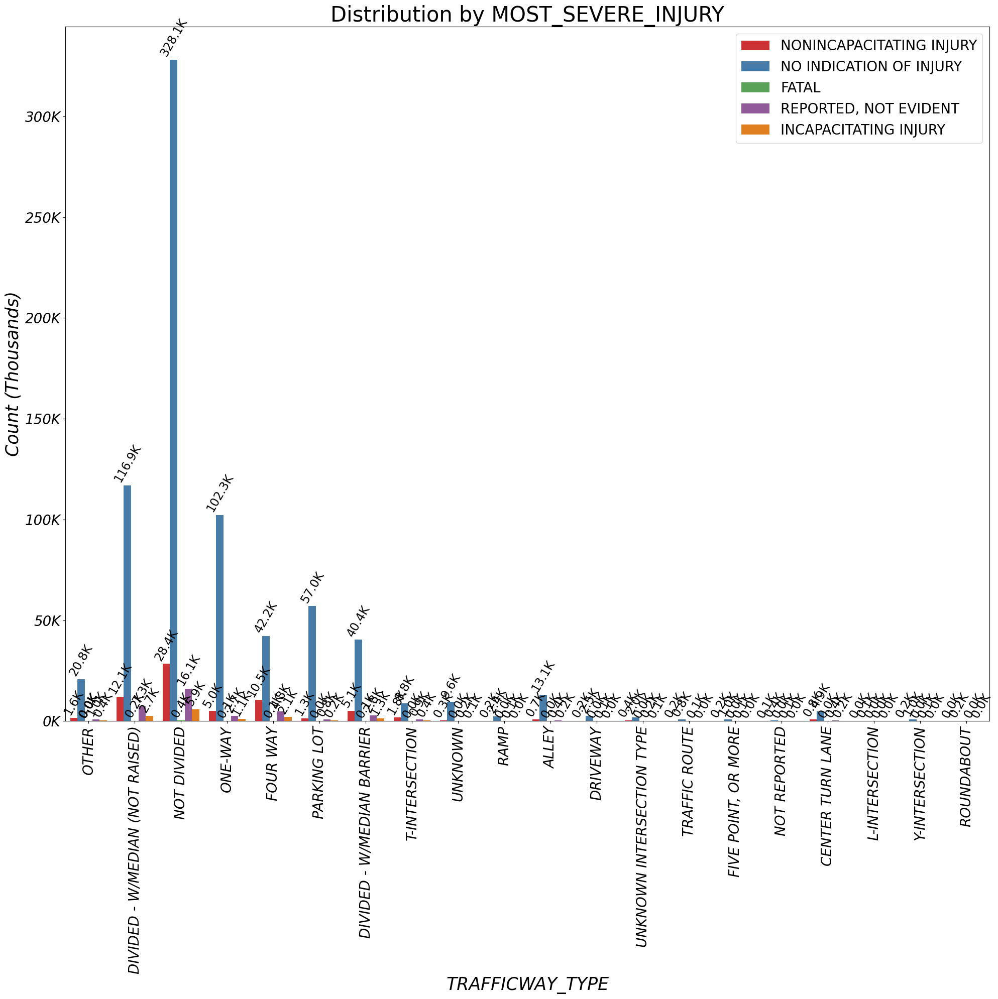

In [56]:
# count plot for 'TRAFFICWAY_TYPE' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFICWAY_TYPE', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

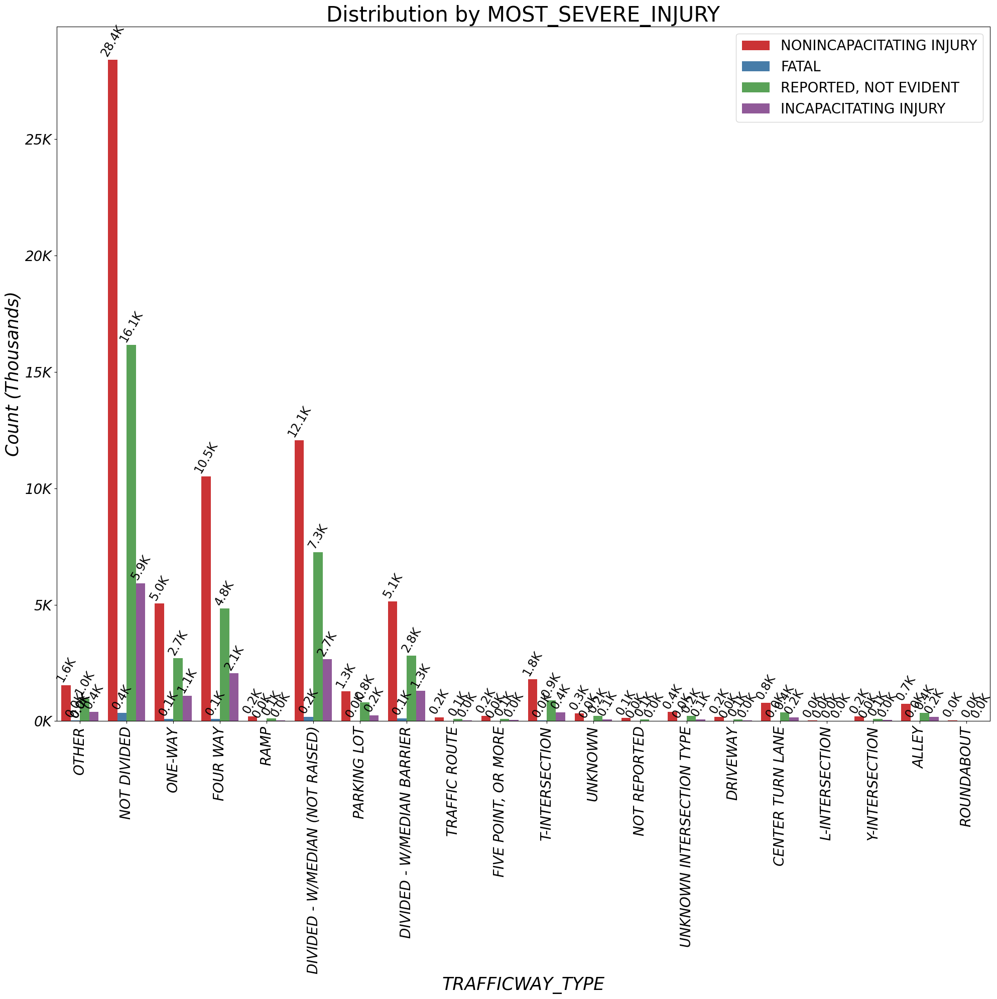

In [57]:
# filter out all non-injured crashes:
df_filtered = df_crashes[df_crashes['MOST_SEVERE_INJURY'] != 'NO INDICATION OF INJURY']

# count plot for 'CRASH_HOUR' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_filtered, 'TRAFFICWAY_TYPE', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, Damages by Trafficway Type.

* Most crashes are happening on undivided road, followed by divided road, one way, and parking lot.
* Crashes with most fatal/incapacitating injuries happen on 2-way roads without physical divider.

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by Traffic Control Device.

Here we'll look at the distribution of damages, injuries, and causes by `TRAFFIC_CONTROL_DEVICE` type.

In [58]:
(df_crashes['TRAFFIC_CONTROL_DEVICE']).value_counts()

TRAFFIC_CONTROL_DEVICE
NO CONTROLS                 498721
TRAFFIC SIGNAL              243858
STOP SIGN/FLASHER            87154
UNKNOWN                      36760
OTHER                         5963
YIELD                         1332
LANE USE MARKING              1226
OTHER REG. SIGN               1041
OTHER WARNING SIGN             702
PEDESTRIAN CROSSING SIGN       605
RAILROAD CROSSING GATE         566
FLASHING CONTROL SIGNAL        358
DELINEATORS                    350
SCHOOL ZONE                    338
POLICE/FLAGMAN                 299
OTHER RAILROAD CROSSING        191
RR CROSSING SIGN               188
NO PASSING                      55
BICYCLE CROSSING SIGN           33
Name: count, dtype: int64

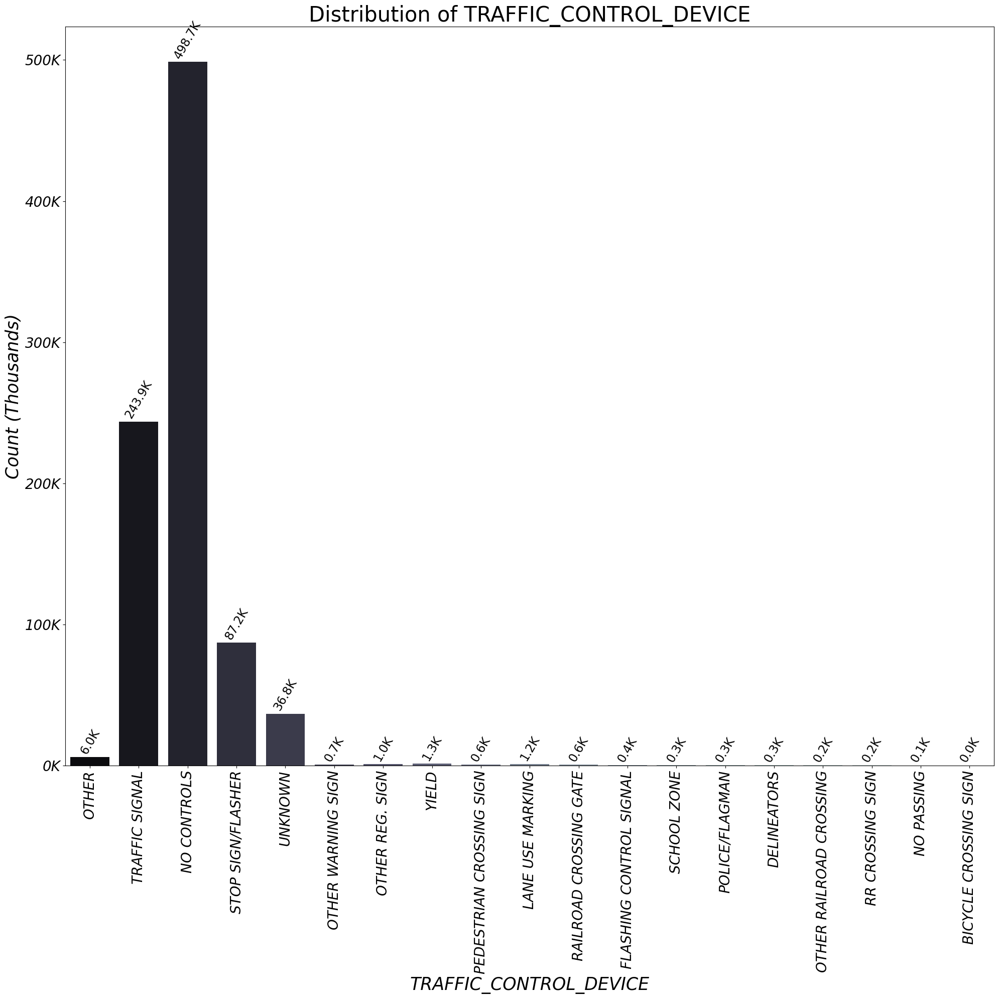

In [59]:
# count plot for 'TRAFFIC_CONTROL_DEVICE'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFIC_CONTROL_DEVICE')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

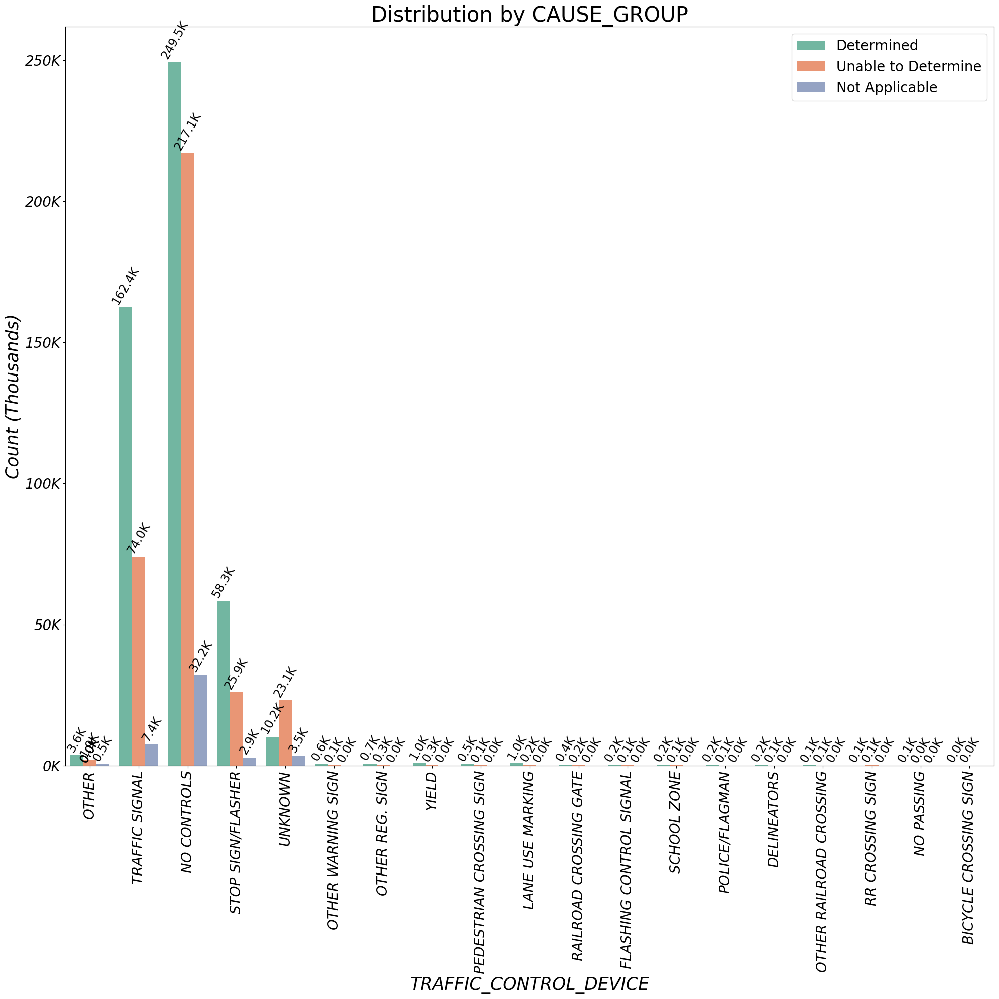

In [60]:
# count plot for 'TRAFFIC_CONTROL_DEVICE' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFIC_CONTROL_DEVICE', 'CAUSE_GROUP', 'Set2')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

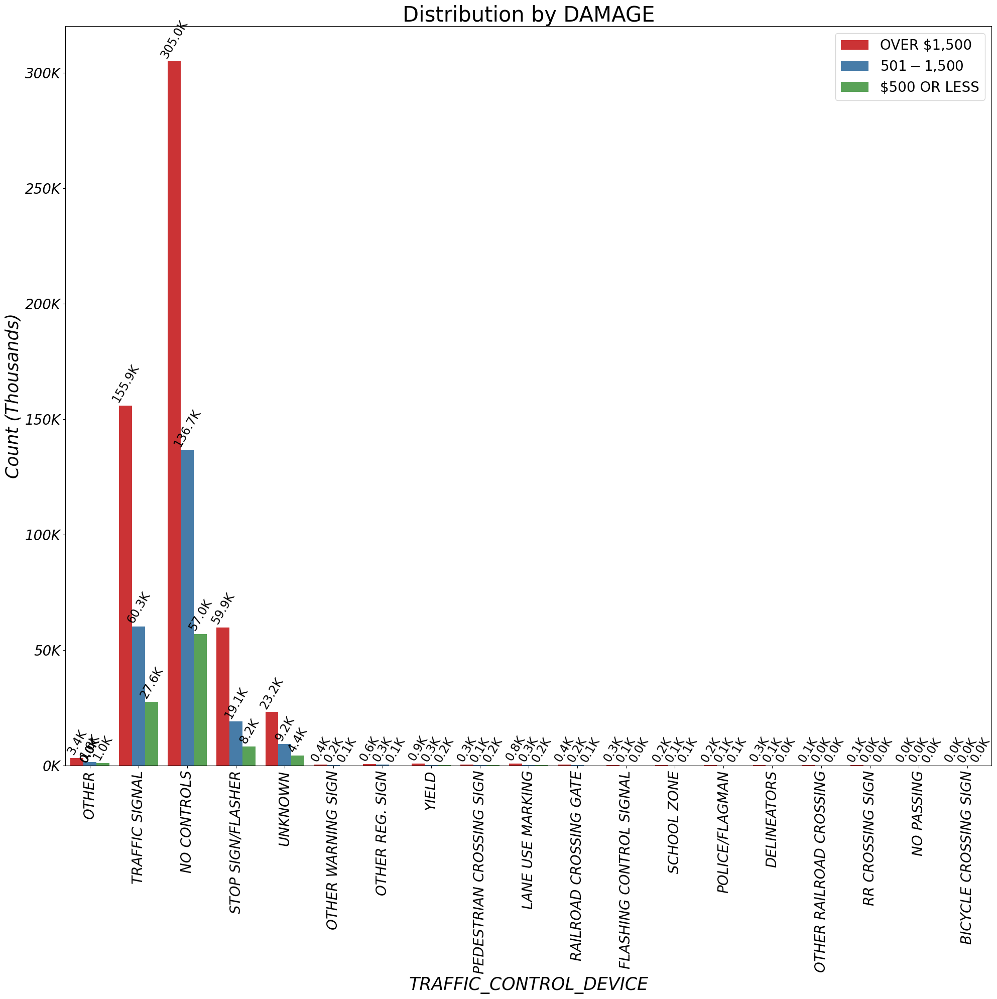

In [61]:
# count plot for 'TRAFFIC_CONTROL_DEVICE' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFIC_CONTROL_DEVICE', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

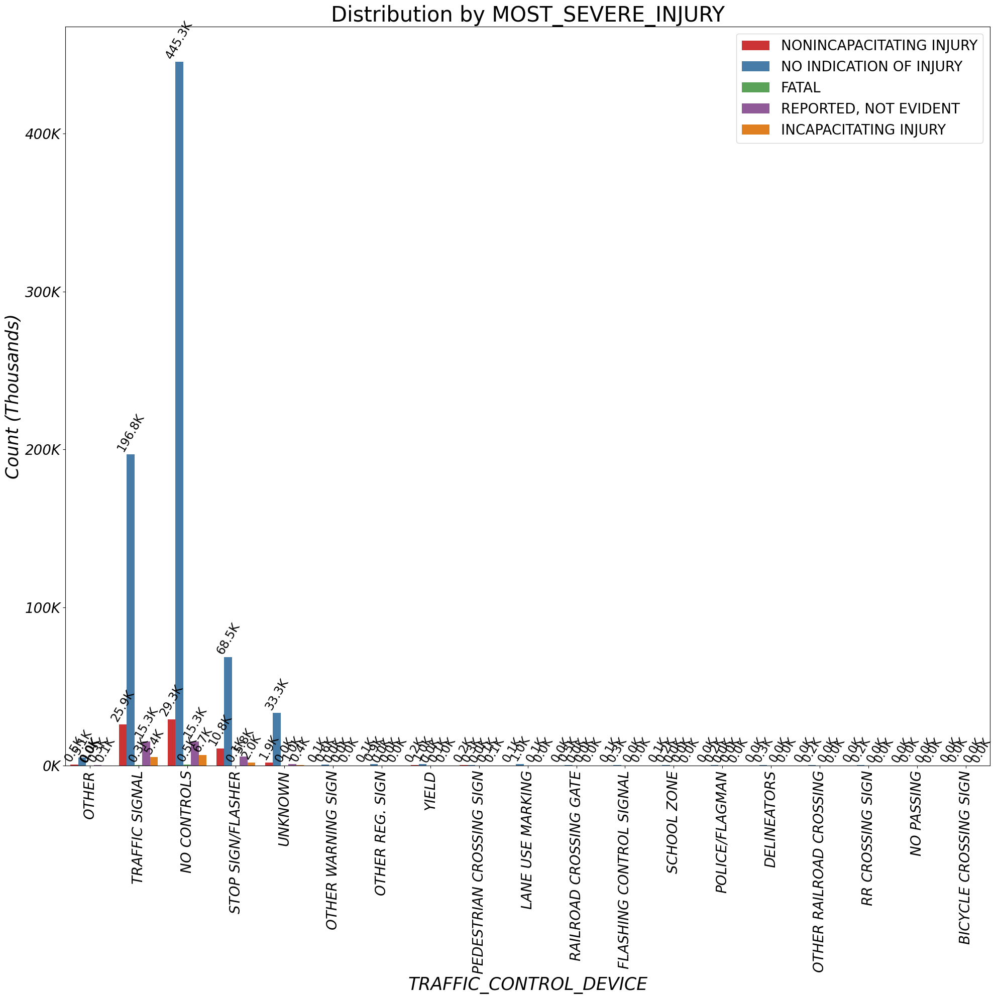

In [62]:
# count plot for 'TRAFFIC_CONTROL_DEVICE' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'TRAFFIC_CONTROL_DEVICE', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

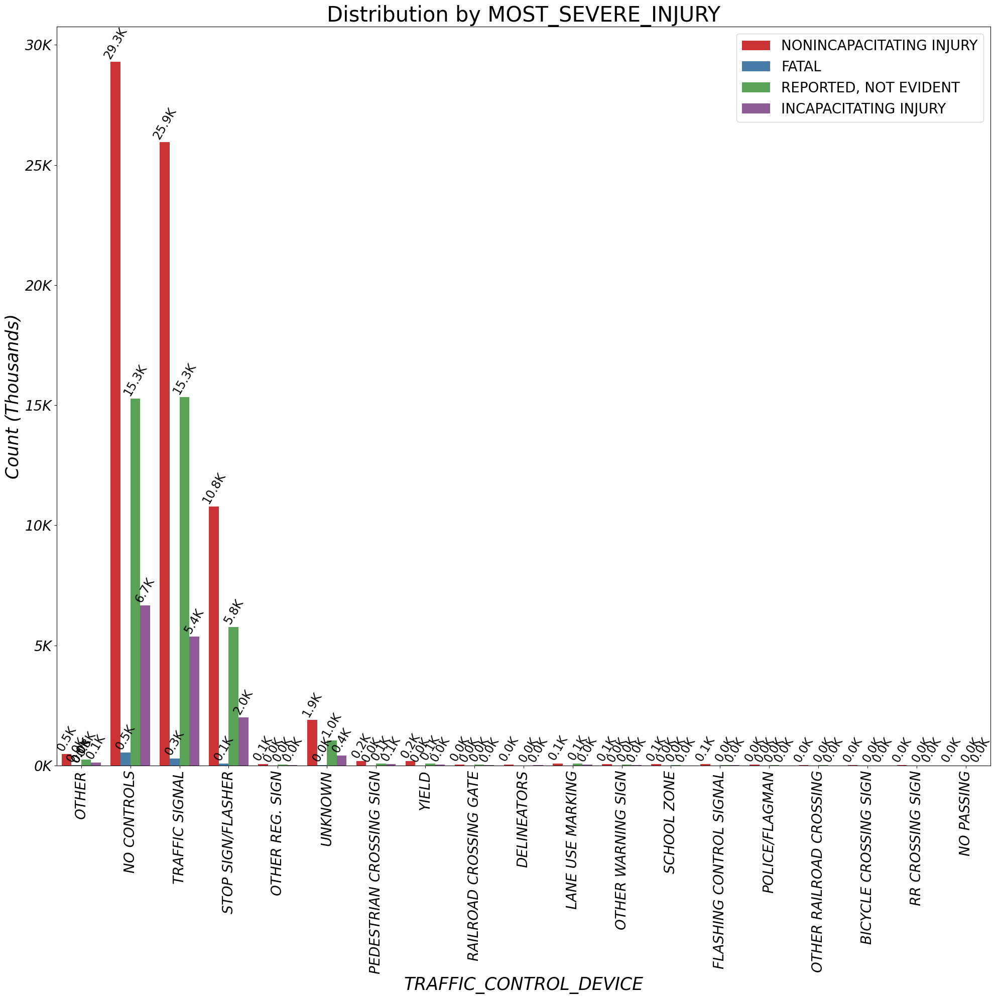

In [63]:
# filter out all non-injured crashes:
df_filtered = df_crashes[df_crashes['MOST_SEVERE_INJURY'] != 'NO INDICATION OF INJURY']

# count plot for 'CRASH_HOUR' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_filtered, 'TRAFFIC_CONTROL_DEVICE', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Initial Overview of Contributory Cause, Injury Severity, and Damages by Traffic Control Device.

* The most common types of Traffic Control Device are the Traffic Signal and the Stop Sign (intersecion-related).
* The most frequent Traffic Control Device is No Controls, meaning either parking lot or on the road 
* The fourth most common value is `Unknown`.
* Most fatalities occur without traffic controls.

### Crashes EDA: Visualizing Contributory Cause, Injury Severity, and Damages by Date Police Notified.

Let's look at the distribution of causes, damages, injuries for the crashes when police was not immediately notified. 

In [64]:
# convert 'CRASH_DATE' and 'DATE_POLICE_NOTIFIED' to datetime
df_crashes['CRASH_DATE'] = pd.to_datetime(df_crashes['CRASH_DATE'])
df_crashes['DATE_POLICE_NOTIFIED'] = pd.to_datetime(df_crashes['DATE_POLICE_NOTIFIED'])

df_crashes['time_difference_hours'] = abs(df_crashes['CRASH_DATE'] - \
                                          df_crashes['DATE_POLICE_NOTIFIED']).dt.total_seconds() / 3600

# categorize the time differences into ranges
bins = [0, 1, 4, 8, 12, float('inf')]  # edges of the bins
labels = ['<1 hr', '2-4 hrs', '5-8 hrs', '8-12 hrs', '>12 hrs']  # labels for each bin

# use pd.cut() to assign each time difference to a bin
df_crashes['reporting_delay_category'] = pd.cut(df_crashes['time_difference_hours'], \
                                                bins=bins, labels=labels, right=False)

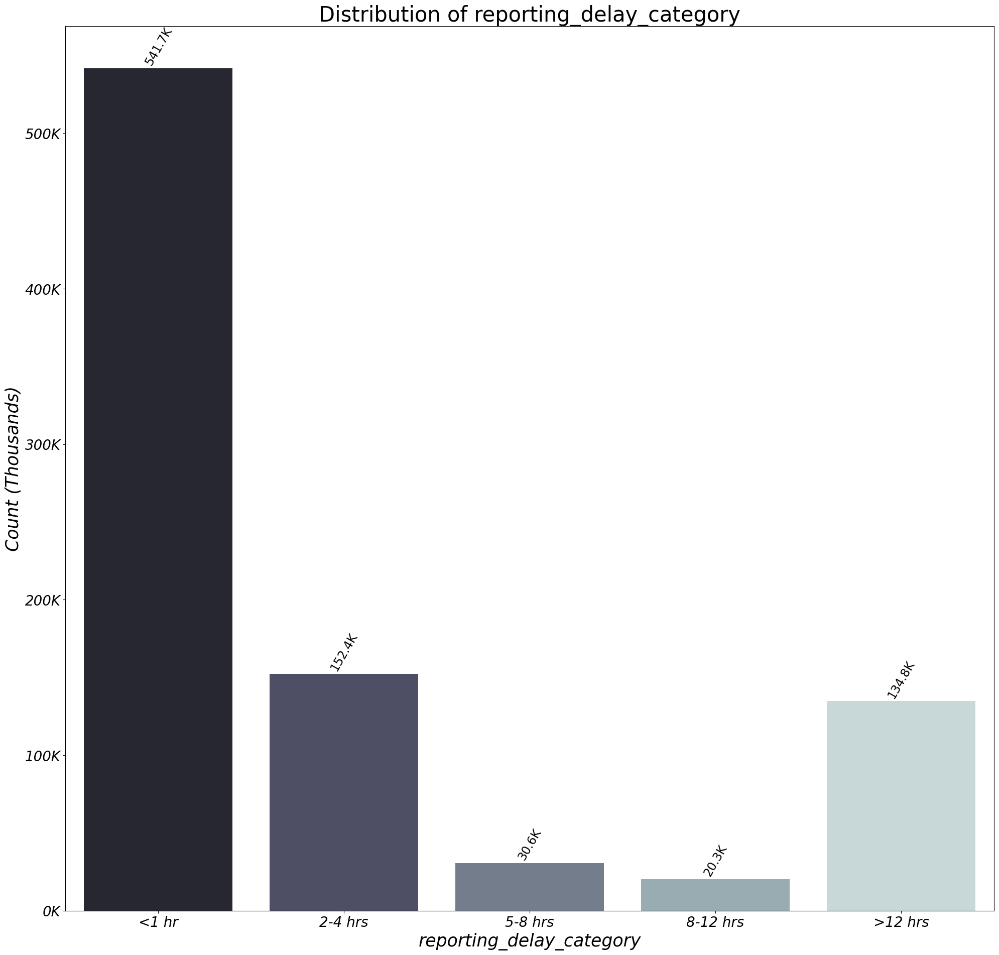

In [65]:
# count plot for 'reporting_delay_category'
fig, ax = countplot_df_crashes(df_crashes, 'reporting_delay_category')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

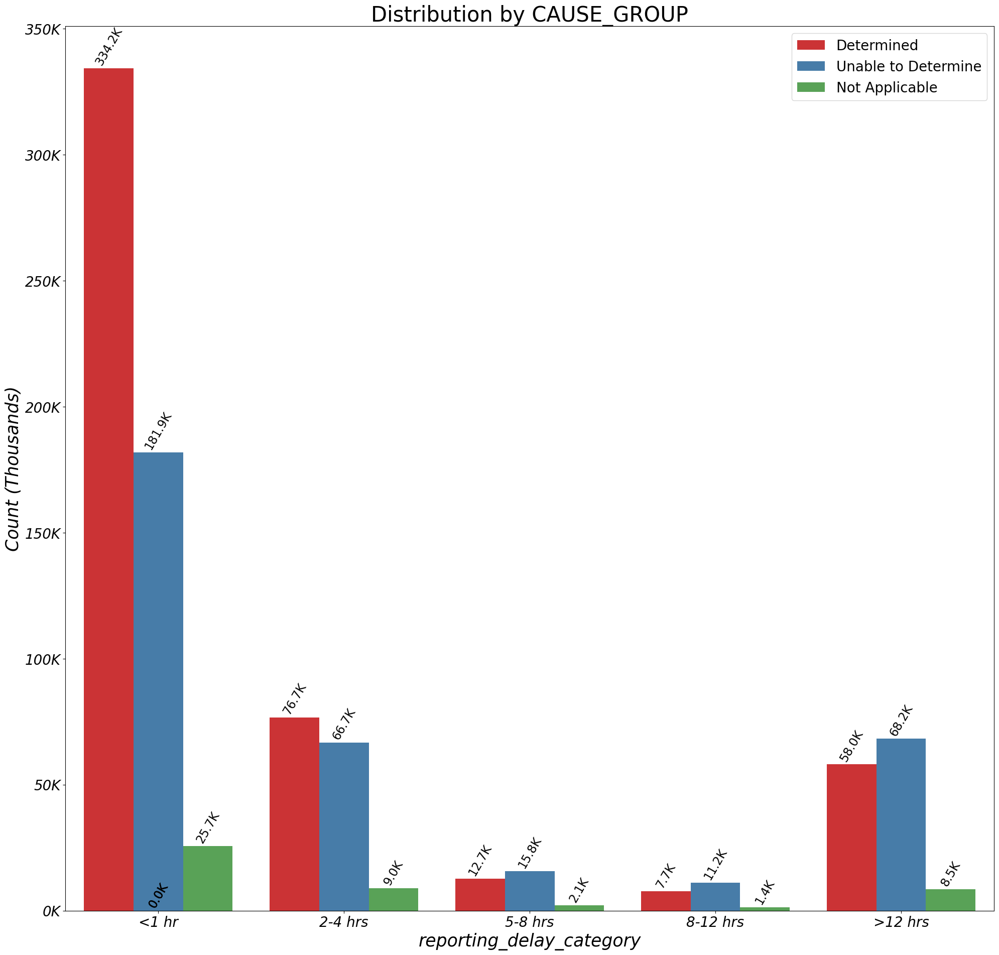

In [66]:
# count plot for 'reporting_delay_category' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes, 'reporting_delay_category', 'CAUSE_GROUP', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

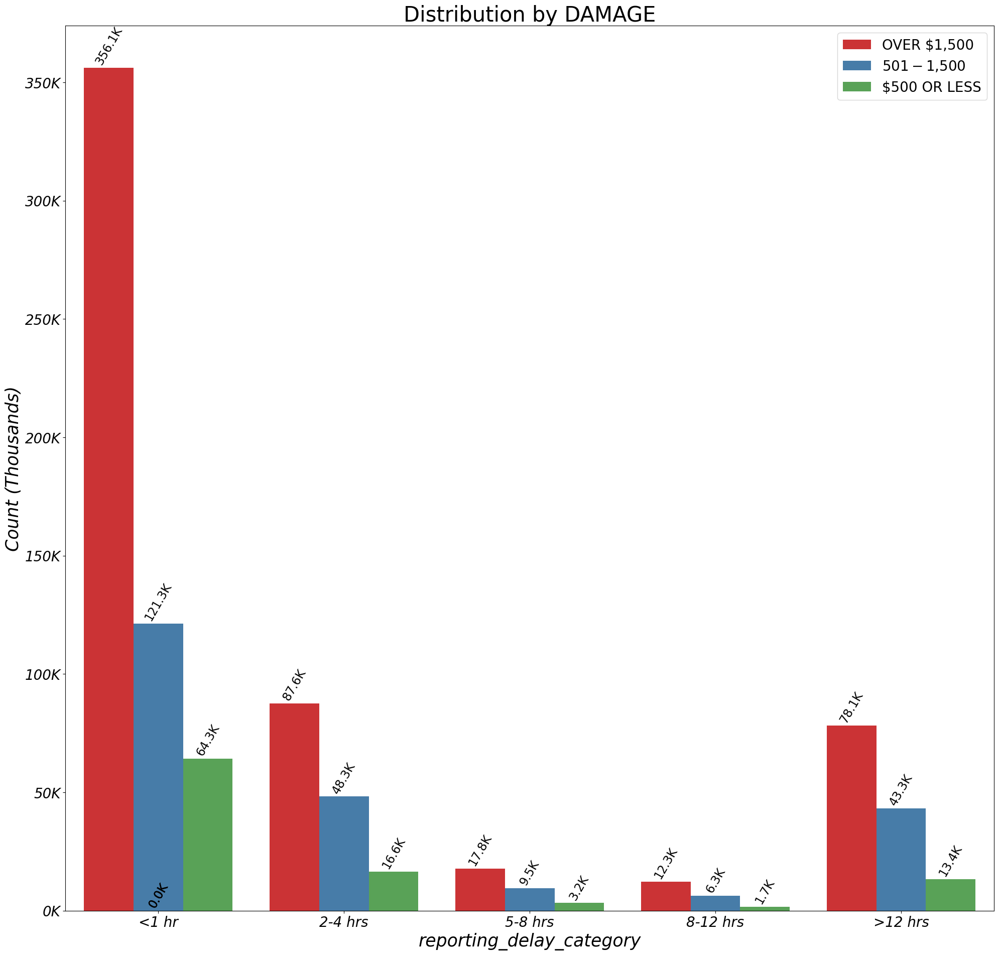

In [67]:
# count plot for 'reporting_delay_category' with hue as 'DAMAGE'
fig, ax = countplot_df_crashes(df_crashes, 'reporting_delay_category', 'DAMAGE', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

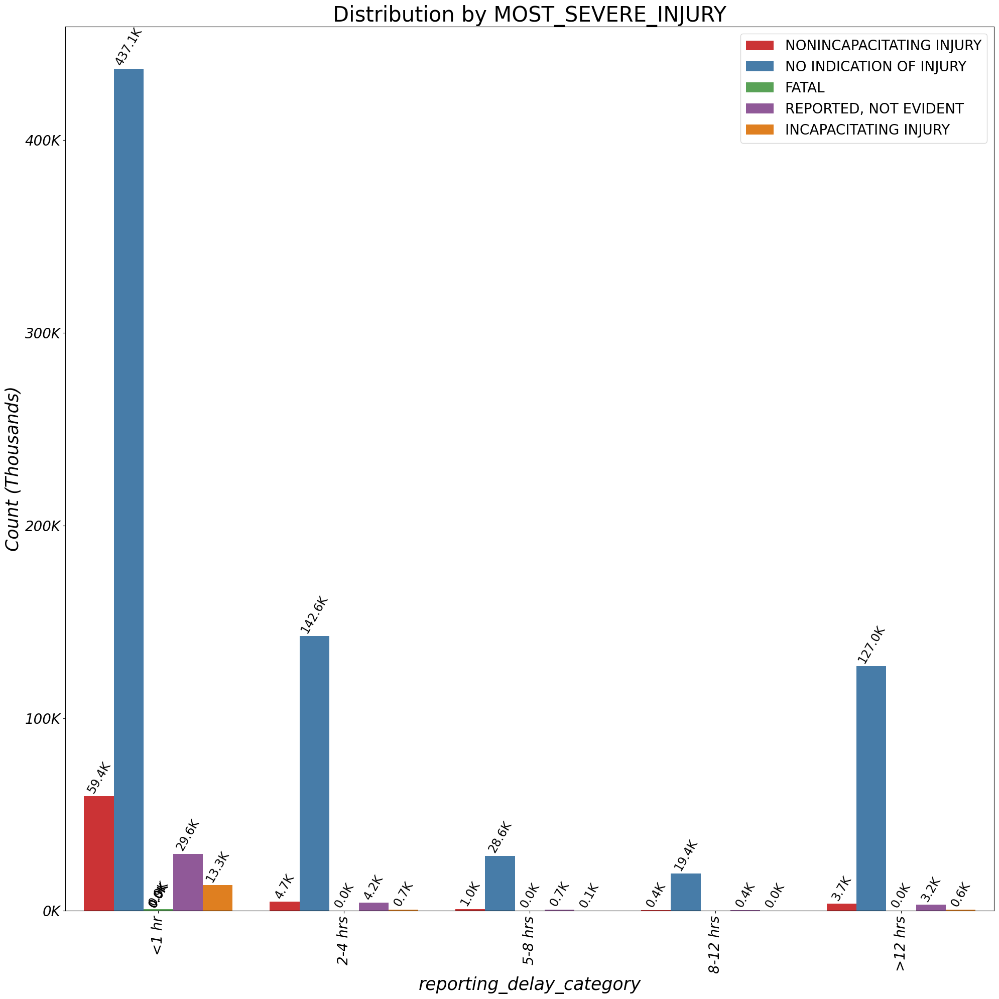

In [68]:
# count plot for 'reporting_delay_category' with hue as 'MOST_SEVERE_INJURY'
fig, ax = countplot_df_crashes(df_crashes, 'reporting_delay_category', 'MOST_SEVERE_INJURY', 'Set1')
# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

## 4. Overview of Crashes EDA.

Here are the following observations we can make about the `df_crashes` so far:

Date, Time, Daylight, Weather Conditions:

* Most of the crashes in the datset happen during business hours (7am - 11pm) at medium speed of 30-35 mph.
* Between the commute hours (7am - 7pm), the number of incapacitating ijuries increases. 
* Most of the crashes have no injuries, however between hours of 11 am-11 pm, there's a steady amount of incapacitating injuries. 
* Most of the crashes happen either in daylight or in darkness/streetlight.
* Most frequent weather is clear, second is rain.
* Sunday is the day with least crashes and Friday is the day with most crashes.
* As far as months, it's a steady distribution, except for slight uptick in May, June, October.
* Most of crashes are reported within 1 hour, 2-4 hours (parking accidents) and >12 hrs (probably parking accidents).
* Crashes reported after 12 hours have the most `Unable to Determine` causes.
  

Trafficway Type, Traffic Signal Type:

* Most crashes happen on undivided road, one-way road, or parking lot.
* Most reported are traffic signal/stop and no signal (road or parking lot).
* Parking lot trafficway and one-way streets have the most `Unable to Determine` causes.

First Crash Type:

* The most frequenct are rear-ending, and parked motor vehicle, followed by angle, turning, side-sweeping.
* Parked motor vehicle has the most `Unable to Determine` causes.


In [69]:
# displaying all columns 
df_crashes.columns

Index(['CRASH_RECORD_ID', 'CRASH_DATE_EST_I', 'CRASH_DATE',
       'POSTED_SPEED_LIMIT', 'TRAFFIC_CONTROL_DEVICE', 'DEVICE_CONDITION',
       'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'FIRST_CRASH_TYPE',
       'TRAFFICWAY_TYPE', 'LANE_CNT', 'ALIGNMENT', 'ROADWAY_SURFACE_COND',
       'ROAD_DEFECT', 'REPORT_TYPE', 'CRASH_TYPE', 'INTERSECTION_RELATED_I',
       'NOT_RIGHT_OF_WAY_I', 'HIT_AND_RUN_I', 'DAMAGE', 'DATE_POLICE_NOTIFIED',
       'PRIM_CONTRIBUTORY_CAUSE', 'SEC_CONTRIBUTORY_CAUSE', 'STREET_NO',
       'STREET_DIRECTION', 'STREET_NAME', 'BEAT_OF_OCCURRENCE',
       'PHOTOS_TAKEN_I', 'STATEMENTS_TAKEN_I', 'DOORING_I', 'WORK_ZONE_I',
       'WORK_ZONE_TYPE', 'WORKERS_PRESENT_I', 'NUM_UNITS',
       'MOST_SEVERE_INJURY', 'INJURIES_TOTAL', 'INJURIES_FATAL',
       'INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING',
       'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION',
       'INJURIES_UNKNOWN', 'CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'CRASH_MONTH',
       'LATITUDE', 

### Proposed modifications to `df_crashes`.

* Check date entries in binary columns: if most of the valid entries are relatively new, then we keep the columns and convert missing values to 0 (default). If the valid entries are the oldest ones, then it would make sence to drop the columns due to being an artifact from older logging style. 
* Drop invalid speed limits.
* For columns with multiple categotical values, generalize and group similar items together as much as possible.
* For numeric columns, like hours, days, months, categorize time and month. For day of week, convert numbers to weekdays.
* For the speed limit column, group speed limit into larger categories, like under 5 mph, 5-15 mph, 15-25 mph, 25-35 mph, 35-45 mph, 45+ mph. 

### Applying proposed modifications to `df_crashes`.

In [70]:
# store columns to keep
cols_to_keep_df_crashes = ['CRASH_RECORD_ID', 'CRASH_DATE', 'posted_speed_limit_(mph)', 'reporting_delay_category', \
                          'TRAFFIC_CONTROL_DEVICE', 'DEVICE_CONDITION', 'WEATHER_CONDITION', \
                           'LIGHTING_CONDITION', 'FIRST_CRASH_TYPE', 'TRAFFICWAY_TYPE', 'ROAD_DEFECT', \
                           'DAMAGE', 'PRIM_CONTRIBUTORY_CAUSE', 'SEC_CONTRIBUTORY_CAUSE', \
                           'WORK_ZONE_I', 'HIT_AND_RUN_I', 'NOT_RIGHT_OF_WAY_I', \
                           'MOST_SEVERE_INJURY', 'INJURIES_TOTAL', 'INJURIES_FATAL',\
                           'INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING',\
                           'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION',\
                           'INJURIES_UNKNOWN', 'DOORING_I', 'INTERSECTION_RELATED_I',\
                           'CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'CRASH_MONTH']

df_crashes_slice = df_crashes[cols_to_keep_df_crashes].copy()
df_crashes_slice.columns = df_crashes_slice.columns.str.lower()

# display the updated column names
print(df_crashes_slice.columns)

Index(['crash_record_id', 'crash_date', 'posted_speed_limit_(mph)',
       'reporting_delay_category', 'traffic_control_device',
       'device_condition', 'weather_condition', 'lighting_condition',
       'first_crash_type', 'trafficway_type', 'road_defect', 'damage',
       'prim_contributory_cause', 'sec_contributory_cause', 'work_zone_i',
       'hit_and_run_i', 'not_right_of_way_i', 'most_severe_injury',
       'injuries_total', 'injuries_fatal', 'injuries_incapacitating',
       'injuries_non_incapacitating', 'injuries_reported_not_evident',
       'injuries_no_indication', 'injuries_unknown', 'dooring_i',
       'intersection_related_i', 'crash_hour', 'crash_day_of_week',
       'crash_month'],
      dtype='object')


In [71]:
# filter out other speed limits
df_crashes_slice = df_crashes_slice[df_crashes_slice['posted_speed_limit_(mph)'].isin(valid_speed_limits)]

### Explore range of dates in binary columns.
We have 5 binary columns that contain a mix of NaN and Y/N values. This can happen either because they were a new addition to logging process at some point and NaNs are artifacts of older reports. In this case, we'll keep the columns and perform cleanup. Other possibility is that these columns became deprecated at some point, so in this case we'll remove them.

We'll look at the distribution of non-nan values by year to make a decision. If we see an increase of non-nan entries in recent years, then these columns are valid.  

In [72]:
# clean binary columns
df_crashes_binary_cols = ['work_zone_i', 'hit_and_run_i', 'not_right_of_way_i', \
                          'dooring_i', 'intersection_related_i']

In [73]:
# filter out rows where any binary column has NaN
binary_df = df_crashes_slice[['crash_date'] + df_crashes_binary_cols].copy()

# extract the year from 'crash_date'
binary_df['crash_year'] = binary_df['crash_date'].dt.year

# loop through each binary column
for col in df_crashes_binary_cols:
    # drop rows where the current binary column has NaN values
    filtered_df = binary_df.dropna(subset=[col])
    
    # extract the year from 'crash_date'
    crash_year = filtered_df['crash_date'].dt.year
    
    # run value counts on the 'crash_year' column
    year_counts = filtered_df['crash_year'].value_counts()
    
    # display the result for the current binary column
    print(f"Value counts for 'crash_year' when '{col}' has no NaN values:")
    print(year_counts)
    print("~~~~~~~~~~~~~~~\n")  # add a blank line for readability between results

Value counts for 'crash_year' when 'work_zone_i' has no NaN values:
crash_year
2018    877
2017    704
2019    619
2023    581
2021    506
2022    440
2020    429
2024    360
2016    342
2015     98
Name: count, dtype: int64
~~~~~~~~~~~~~~~

Value counts for 'crash_year' when 'hit_and_run_i' has no NaN values:
crash_year
2021    38816
2022    37129
2023    36484
2019    33395
2018    33039
2020    31910
2024    27326
2017    23168
2016    12005
2015     2479
2014        1
2013        1
Name: count, dtype: int64
~~~~~~~~~~~~~~~

Value counts for 'crash_year' when 'not_right_of_way_i' has no NaN values:
crash_year
2019    5820
2018    5505
2021    5220
2022    4970
2023    4640
2020    4603
2017    3571
2024    3482
2016    1875
2015     501
Name: count, dtype: int64
~~~~~~~~~~~~~~~

Value counts for 'crash_year' when 'dooring_i' has no NaN values:
crash_year
2018    450
2019    379
2023    335
2024    324
2021    307
2022    290
2017    289
2020    258
2016    117
2015     33
Name: coun

Looks like the binary columns were added into digital logging database after 2015 and can be important. We'll replace NaNs with 0 (No).

In [74]:
# replace Y with 1, everything else 0
df_crashes_slice[df_crashes_binary_cols] = \
    df_crashes_slice[df_crashes_binary_cols].applymap(lambda x: 1 if x == 'Y' else 0)

In [75]:
# check 
df_crashes_slice[df_crashes_binary_cols].value_counts()

work_zone_i  hit_and_run_i  not_right_of_way_i  dooring_i  intersection_related_i
0            0              0                   0          0                         432359
             1              0                   0          0                         215464
             0              0                   0          1                         152362
             1              0                   0          1                          37149
             0              1                   0          0                          24735
             1              1                   0          0                          10096
1            0              0                   0          0                           2462
0            0              0                   1          0                           1500
                            1                   0          1                           1209
1            0              0                   0          1                            71

In [76]:
# rename columns 
# map old column names to new column names by removing '_i'
new_column_names = {col: col.replace('_i', '') for col in df_crashes_binary_cols}

# Rename the columns in the DataFrame
df_crashes_slice = df_crashes_slice.rename(columns=new_column_names)

#### Cleaning up all categorical columns one by one, starting with `traffic_control_device`.

In [77]:
# all categorical columns
df_crashes_categorical_columns = ['traffic_control_device',
       'device_condition', 'weather_condition', 'lighting_condition',
       'first_crash_type', 'trafficway_type', 'road_defect',
       'prim_contributory_cause', 'sec_contributory_cause']

In [78]:
# traffic control device
df_crashes_slice['traffic_control_device'].value_counts()

traffic_control_device
NO CONTROLS                 498554
TRAFFIC SIGNAL              243784
STOP SIGN/FLASHER            87129
UNKNOWN                      36742
OTHER                         5962
YIELD                         1332
LANE USE MARKING              1226
OTHER REG. SIGN               1041
OTHER WARNING SIGN             701
PEDESTRIAN CROSSING SIGN       605
RAILROAD CROSSING GATE         566
FLASHING CONTROL SIGNAL        358
DELINEATORS                    350
SCHOOL ZONE                    338
POLICE/FLAGMAN                 299
OTHER RAILROAD CROSSING        191
RR CROSSING SIGN               187
NO PASSING                      55
BICYCLE CROSSING SIGN           33
Name: count, dtype: int64

In [79]:
# define the mapping to clean up or group the values
traffic_control_device_map = {
    'NO CONTROLS': 'No Controls',
    'TRAFFIC SIGNAL': 'Traffic Signal',
    'STOP SIGN/FLASHER': 'Stop Sign',
    'UNKNOWN': 'Unknown',
    'OTHER': 'Other',
    'YIELD': 'Yield Sign',
    'LANE USE MARKING': 'Other',
    'OTHER REG. SIGN': 'Other',
    'OTHER WARNING SIGN': 'Other',
    'PEDESTRIAN CROSSING SIGN': 'Pedestrian Xing',
    'RAILROAD CROSSING GATE': 'RR Xing',
    'FLASHING CONTROL SIGNAL': 'Flashing Signal',
    'DELINEATORS': 'Other',
    'SCHOOL ZONE': 'School Zone',
    'POLICE/FLAGMAN': 'Police or Flagman',
    'OTHER RAILROAD CROSSING': 'RR Xing',
    'RR CROSSING SIGN': 'RR Xing',
    'NO PASSING': 'Other',
    'BICYCLE CROSSING SIGN': 'Bicycle Xing'
}
# apply the mapping to the column
df_crashes_slice['traffic_control_device'] = \
df_crashes_slice['traffic_control_device'].replace(traffic_control_device_map)

In [80]:
# traffic control device check
df_crashes_slice['traffic_control_device'].value_counts()

traffic_control_device
No Controls          498554
Traffic Signal       243784
Stop Sign             87129
Unknown               36742
Other                  9335
Yield Sign             1332
RR Xing                 944
Pedestrian Xing         605
Flashing Signal         358
School Zone             338
Police or Flagman       299
Bicycle Xing             33
Name: count, dtype: int64

#### Cleaning up  `device_condition` column.

In [81]:
# traffic control device condition
df_crashes_slice['device_condition'].value_counts()

device_condition
NO CONTROLS                 504382
FUNCTIONING PROPERLY        300361
UNKNOWN                      61074
OTHER                         6680
FUNCTIONING IMPROPERLY        4050
NOT FUNCTIONING               2516
WORN REFLECTIVE MATERIAL       291
MISSING                         99
Name: count, dtype: int64

In [82]:
# define the mapping to clean up or group the values
device_condition_map = {
    'NO CONTROLS': 'No Controls',
    'UNKNOWN': 'Unknown',
    'OTHER': 'Other',
    'FUNCTIONING PROPERLY': 'Functioning',    
    'FUNCTIONING IMPROPERLY': 'Malfunctioning',
    'NOT FUNCTIONING': 'Malfunctioning',
    'WORN REFLECTIVE MATERIAL': 'Other',
    'MISSING': 'Malfunctioning'
}
# apply the mapping to the column
df_crashes_slice['device_condition'] = df_crashes_slice['device_condition'].replace(device_condition_map)

In [83]:
# traffic control device condition
df_crashes_slice['device_condition'].value_counts()

device_condition
No Controls       504382
Functioning       300361
Unknown            61074
Other               6971
Malfunctioning      6665
Name: count, dtype: int64

#### Cleaning up  `weather_condition` column.

In [84]:
# weather condition
df_crashes_slice['weather_condition'].value_counts()

weather_condition
CLEAR                       692222
RAIN                         76230
UNKNOWN                      49623
SNOW                         28395
CLOUDY/OVERCAST              25556
OTHER                         2727
FREEZING RAIN/DRIZZLE         1740
FOG/SMOKE/HAZE                1346
SLEET/HAIL                    1010
BLOWING SNOW                   443
SEVERE CROSS WIND GATE         154
BLOWING SAND, SOIL, DIRT         7
Name: count, dtype: int64

In [85]:
# define the mapping to clean up or group the values
weather_condition_map = {
    'CLEAR': 'Clear',
    'RAIN': 'Rain',
    'SNOW': 'Snow',
    'UNKNOWN': 'Unknown',
    'OTHER': 'Other',
    'CLOUDY/OVERCAST': 'Cloudy',
    'FREEZING RAIN/DRIZZLE': 'Rain',
    'SLEET/HAIL': 'Sleet',
    'FOG/SMOKE/HAZE': 'Haze',
    'BLOWING SNOW': 'Snow',
    'BLOWING SAND, SOIL, DIRT': 'Other',
    'SEVERE CROSS WIND GATE': 'Other'
}
# apply the mapping to the column
df_crashes_slice['weather_condition'] = df_crashes_slice['weather_condition'].replace(weather_condition_map)

In [86]:
# weather condition
df_crashes_slice['weather_condition'].value_counts()

weather_condition
Clear      692222
Rain        77970
Unknown     49623
Snow        28838
Cloudy      25556
Other        2888
Haze         1346
Sleet        1010
Name: count, dtype: int64

#### Cleaning up  `lighting_condition` column.

In [87]:
# lighting condition
df_crashes_slice['lighting_condition'].value_counts()

lighting_condition
DAYLIGHT                  566104
DARKNESS, LIGHTED ROAD    191545
DARKNESS                   41175
UNKNOWN                    41035
DUSK                       25008
DAWN                       14586
Name: count, dtype: int64

In [88]:
# define the mapping to clean up or group the values
lighting_condition_map = {
    'DAYLIGHT': 'Daylight',
    'DARKNESS, LIGHTED ROAD': 'Lighted Road',
    'DARKNESS': 'Dark',
    'UNKNOWN': 'Unknown',
    'DUSK': 'Dusk',
    'DAWN': 'Dawn'
}
# apply the mapping to the column
df_crashes_slice['lighting_condition'] = df_crashes_slice['lighting_condition'].replace(lighting_condition_map)

In [89]:
# lighting condition
df_crashes_slice['lighting_condition'].value_counts()

lighting_condition
Daylight        566104
Lighted Road    191545
Dark             41175
Unknown          41035
Dusk             25008
Dawn             14586
Name: count, dtype: int64

#### Cleaning up  `first_crash_type` column.

In [90]:
# first crash type 
df_crashes_slice['first_crash_type'].value_counts()

first_crash_type
PARKED MOTOR VEHICLE            203912
REAR END                        194931
SIDESWIPE SAME DIRECTION        134764
TURNING                         126198
ANGLE                            95582
FIXED OBJECT                     40987
PEDESTRIAN                       20657
PEDALCYCLIST                     13880
SIDESWIPE OPPOSITE DIRECTION     12243
REAR TO FRONT                     8934
OTHER OBJECT                      8771
HEAD ON                           7496
REAR TO SIDE                      5322
OTHER NONCOLLISION                2709
REAR TO REAR                      1852
ANIMAL                             632
OVERTURNED                         537
TRAIN                               46
Name: count, dtype: int64

In [91]:
# define the mapping to clean up or group the values
first_crash_map = {
    'PARKED MOTOR VEHICLE'            : 'Parked',
    'REAR END'                        : 'Rear End',
    'SIDESWIPE SAME DIRECTION'        : 'Sideswipe Same',
    'TURNING'                         : 'Turning',
    'ANGLE'                           : 'Angle', 
    'FIXED OBJECT'                    : 'Object',
    'PEDESTRIAN'                      : 'Pedestrian',
    'PEDALCYCLIST'                    : 'Cyclist',
    'SIDESWIPE OPPOSITE DIRECTION'    : 'Sideswipe Opposite',
    'REAR TO FRONT'                   : 'Rear to Front',
    'OTHER OBJECT'                    : 'Object',
    'HEAD ON'                         : 'Head On',
    'REAR TO SIDE'                    : 'Rear to Side',
    'OTHER NONCOLLISION'              : 'Other',
    'REAR TO REAR'                    : 'Rear to Rear',
    'ANIMAL'                          : 'Animal',
    'OVERTURNED'                      : 'Overturned',
    'TRAIN'                           : 'Train'
}
# apply the mapping to the column
df_crashes_slice['first_crash_type'] = df_crashes_slice['first_crash_type'].replace(first_crash_map)

In [92]:
# first crash type 
df_crashes_slice['first_crash_type'].value_counts()

first_crash_type
Parked                203912
Rear End              194931
Sideswipe Same        134764
Turning               126198
Angle                  95582
Object                 49758
Pedestrian             20657
Cyclist                13880
Sideswipe Opposite     12243
Rear to Front           8934
Head On                 7496
Rear to Side            5322
Other                   2709
Rear to Rear            1852
Animal                   632
Overturned               537
Train                     46
Name: count, dtype: int64

#### Cleaning up  `trafficway_type` column.

In [93]:
# trafficway type
df_crashes_slice['trafficway_type'].value_counts()

trafficway_type
NOT DIVIDED                        379499
DIVIDED - W/MEDIAN (NOT RAISED)    139234
ONE-WAY                            111571
FOUR WAY                            59748
PARKING LOT                         59680
DIVIDED - W/MEDIAN BARRIER          49861
OTHER                               23841
ALLEY                               14500
T-INTERSECTION                      11876
UNKNOWN                             10281
CENTER TURN LANE                     6259
DRIVEWAY                             2838
RAMP                                 2759
UNKNOWN INTERSECTION TYPE            2678
FIVE POINT, OR MORE                  1316
Y-INTERSECTION                       1300
TRAFFIC ROUTE                        1081
NOT REPORTED                          652
ROUNDABOUT                            296
L-INTERSECTION                        183
Name: count, dtype: int64

In [94]:
# define the mapping to clean up or group the values
trafficway_map = {
    'NOT DIVIDED': 'Not Divided',
    'DIVIDED - W/MEDIAN (NOT RAISED)': 'Divided, Median',
    'ONE-WAY': 'One-Way',
    'PARKING LOT': 'Parking Lot',
    'FOUR WAY': 'Intersection',
    'DIVIDED - W/MEDIAN BARRIER': 'Divided, Barrier',
    'OTHER': 'Other',
    'ALLEY': 'Alley',
    'T-INTERSECTION': 'Intersection',
    'UNKNOWN': 'Unknown',
    'CENTER TURN LANE': 'Center Turn Lane',
    'DRIVEWAY': 'Other',
    'RAMP': 'Ramp',
    'UNKNOWN INTERSECTION TYPE': 'Intersection',
    'FIVE POINT, OR MORE': 'Intersection',
    'Y-INTERSECTION': 'Intersection',
    'TRAFFIC ROUTE': 'Other',
    'NOT REPORTED': 'Unknown',
    'ROUNDABOUT': 'Roundabout',
    'L-INTERSECTION': 'Intersection'
}

# apply the mapping to the column
df_crashes_slice['trafficway_type'] = df_crashes_slice['trafficway_type'].replace(trafficway_map)

In [95]:
# trafficway type
df_crashes_slice['trafficway_type'].value_counts()

trafficway_type
Not Divided         379499
Divided, Median     139234
One-Way             111571
Intersection         77101
Parking Lot          59680
Divided, Barrier     49861
Other                27760
Alley                14500
Unknown              10933
Center Turn Lane      6259
Ramp                  2759
Roundabout             296
Name: count, dtype: int64

#### Cleaning up  `road_defect` column.

In [96]:
# road_defect type
df_crashes_slice['road_defect'].value_counts()

road_defect
NO DEFECTS           702368
UNKNOWN              160185
RUT, HOLES             6299
OTHER                  4771
WORN SURFACE           3648
SHOULDER DEFECT        1534
DEBRIS ON ROADWAY       648
Name: count, dtype: int64

In [97]:
# define the mapping to clean up or group the values
road_defect_map = {
    'NO DEFECTS':'No Defects',
    'UNKNOWN': 'Unknown',
    'OTHER':'Other',
    'RUT, HOLES': 'Surface Defect',
    'WORN SURFACE':'Surface Defect',
    'SHOULDER DEFECT':'Shoulder Defect',
    'DEBRIS ON ROADWAY':'Debris'
}
# apply the mapping to the column
df_crashes_slice['road_defect'] = df_crashes_slice['road_defect'].replace(road_defect_map)

In [98]:
# road_defect type
df_crashes_slice['road_defect'].value_counts()

road_defect
No Defects         702368
Unknown            160185
Surface Defect       9947
Other                4771
Shoulder Defect      1534
Debris                648
Name: count, dtype: int64

#### Categorizing up `crash_hour`, `crash_day`, `crash_month`, adding crash year column.

We'll start with splitting hours into five categories: morning, afternoon, late afternoon, evening, late evening, night. Having more than 4 categories is driven by data distribution and data origins (busy urban area), where multiple commute waves (and associated increase in traffic accidents) exist.

In [99]:
# function to categorize the hour into time of day
def categorize_time_of_day(hour):
    if 7 < hour <= 11:
        return 'Morning'
    elif 11 < hour <= 14:
         return 'Afternoon'
    elif 14 < hour <= 17:
        return 'Late Afternoon'    
    elif 18 < hour <= 21:
        return 'Evening'
    elif 21 < hour <= 23:
        return 'Late Evening'    
    else:
        return 'Night'

# apply the categorization to the 'CRASH_HOUR' column
df_crashes_slice['time_of_day'] = df_crashes_slice['crash_hour'].apply(categorize_time_of_day)

# display the result
print(df_crashes_slice[['crash_hour', 'time_of_day']].head())

   crash_hour     time_of_day
0          12       Afternoon
1          14       Afternoon
2          17  Late Afternoon
3           8         Morning
4          10         Morning


In [100]:
# create a mapping dictionary for weekdays
weekday_mapping = {
    1: 'Sunday',    
    2: 'Monday',
    3: 'Tuesday',
    4: 'Wednesday',
    5: 'Thursday',
    6: 'Friday',
    7: 'Saturday'
}

# replace the numeric weekdays with the day names
df_crashes_slice['day'] = df_crashes_slice['crash_day_of_week'].map(weekday_mapping)

# display the updated df
df_crashes_slice[['crash_day_of_week', 'day']].head()

,crash_day_of_week,day
0,6,Friday
1,7,Saturday
2,6,Friday
3,3,Tuesday
4,6,Friday


In [101]:
# create a mapping dictionary for months to seasons
month_to_season = {
    1: 'Winter',  2: 'Winter',  3: 'Spring',
    4: 'Spring',  5: 'Spring',  6: 'Summer',
    7: 'Summer',  8: 'Summer',  9: 'Fall',
    10: 'Fall',  11: 'Fall',  12: 'Winter'
}

# replace the numeric months with the corresponding seasons
df_crashes_slice['season'] = df_crashes_slice['crash_month'].map(month_to_season)

# display the updated df
df_crashes_slice[['crash_month', 'season']].head()

,crash_month,season
0,8,Summer
1,7,Summer
2,8,Summer
3,11,Fall
4,8,Summer


In [102]:
# add year
df_crashes_slice['year'] = df_crashes_slice['crash_date'].dt.year

In [103]:
# drop old columns
df_crashes_slice.drop(columns=['crash_hour', 'crash_day_of_week', 'crash_month', 'crash_date'], inplace=True)

#### Categorizing `Posted Speed Limit (mph)`.

Our choise of bins reflects data distribution in the determined vs undetermined crash cause distribution.

In [104]:
# specify the bins and labels
bins = [-float('inf'), 5, 15, 25, 35, 50, float('inf')] 
labels = ['slow (<5 mph)', '5-15 mph', '20-25 mph', '30-35 mph', '40-50 mph', '50+ mph'] 
# Apply pd.cut() to categorize the 'Posted Speed Limit (mph)' column
df_crashes_slice['speed_limit'] = pd.cut(df_crashes_slice['posted_speed_limit_(mph)'], \
                                         bins=bins, labels=labels, right=False)

# display the updated DataFrame with the new speed category column
df_crashes_slice[['posted_speed_limit_(mph)', 'speed_limit']].head()

,posted_speed_limit_(mph),speed_limit
0,15,20-25 mph
1,30,30-35 mph
2,30,30-35 mph
3,25,30-35 mph
4,20,20-25 mph


In [105]:
# drop the 'posted_speed_limit_(mph)'
df_crashes_slice.drop(columns='posted_speed_limit_(mph)', inplace=True)

#### Cleaning up  `prim_contributory_cause`, `sec_contributory_cause` columns.

In [106]:
# road_defect type
df_crashes_slice['prim_contributory_cause'].value_counts()

prim_contributory_cause
UNABLE TO DETERMINE                                                                 343667
FAILING TO YIELD RIGHT-OF-WAY                                                        96941
FOLLOWING TOO CLOSELY                                                                84940
NOT APPLICABLE                                                                       46573
IMPROPER OVERTAKING/PASSING                                                          43744
FAILING TO REDUCE SPEED TO AVOID CRASH                                               36958
IMPROPER BACKING                                                                     34167
IMPROPER LANE USAGE                                                                  31342
DRIVING SKILLS/KNOWLEDGE/EXPERIENCE                                                  29799
IMPROPER TURNING/NO SIGNAL                                                           29398
DISREGARDING TRAFFIC SIGNALS                                      

In [107]:
# intersect to use common causes 
primary_causes = set(df_crashes_slice['prim_contributory_cause'])
secondary_causes = set(df_crashes_slice['sec_contributory_cause'])

# find the intersection (common causes)
common_causes = primary_causes & secondary_causes

common_causes

{'ANIMAL',
 'BICYCLE ADVANCING LEGALLY ON RED LIGHT',
 'CELL PHONE USE OTHER THAN TEXTING',
 'DISREGARDING OTHER TRAFFIC SIGNS',
 'DISREGARDING ROAD MARKINGS',
 'DISREGARDING STOP SIGN',
 'DISREGARDING TRAFFIC SIGNALS',
 'DISREGARDING YIELD SIGN',
 'DISTRACTION - FROM INSIDE VEHICLE',
 'DISTRACTION - FROM OUTSIDE VEHICLE',
 'DISTRACTION - OTHER ELECTRONIC DEVICE (NAVIGATION DEVICE, DVD PLAYER, ETC.)',
 'DRIVING ON WRONG SIDE/WRONG WAY',
 'DRIVING SKILLS/KNOWLEDGE/EXPERIENCE',
 'EQUIPMENT - VEHICLE CONDITION',
 'EVASIVE ACTION DUE TO ANIMAL, OBJECT, NONMOTORIST',
 'EXCEEDING AUTHORIZED SPEED LIMIT',
 'EXCEEDING SAFE SPEED FOR CONDITIONS',
 'FAILING TO REDUCE SPEED TO AVOID CRASH',
 'FAILING TO YIELD RIGHT-OF-WAY',
 'FOLLOWING TOO CLOSELY',
 'HAD BEEN DRINKING (USE WHEN ARREST IS NOT MADE)',
 'IMPROPER BACKING',
 'IMPROPER LANE USAGE',
 'IMPROPER OVERTAKING/PASSING',
 'IMPROPER TURNING/NO SIGNAL',
 'MOTORCYCLE ADVANCING LEGALLY ON RED LIGHT',
 'NOT APPLICABLE',
 'OBSTRUCTED CROSSWALKS',


In [108]:
#  mapping to group or generalize contributory causes
cause_map = {
    'ANIMAL': 'Animal',
    'BICYCLE ADVANCING LEGALLY ON RED LIGHT': 'Bicycle',
    'CELL PHONE USE OTHER THAN TEXTING': 'Distracted Driving',
    'DISREGARDING OTHER TRAFFIC SIGNS': 'Disregarding Traffic Control',
    'DISREGARDING ROAD MARKINGS': 'Disregarding Traffic Control',
    'DISREGARDING STOP SIGN': 'Disregarding Traffic Control',
    'DISREGARDING TRAFFIC SIGNALS': 'Disregarding Traffic Control',
    'DISREGARDING YIELD SIGN': 'Disregarding Traffic Control',
    'DISTRACTION - FROM INSIDE VEHICLE': 'Distracted Driving',
    'DISTRACTION - FROM OUTSIDE VEHICLE': 'Distracted Driving',
    'DISTRACTION - OTHER ELECTRONIC DEVICE (NAVIGATION DEVICE, DVD PLAYER, ETC.)': 'Distracted Driving',
    'DRIVING ON WRONG SIDE/WRONG WAY': 'Improper Driving',
    'DRIVING SKILLS/KNOWLEDGE/EXPERIENCE': 'Driver Experience',
    'EQUIPMENT - VEHICLE CONDITION': 'Vehicle Equipment',
    'EVASIVE ACTION DUE TO ANIMAL, OBJECT, NONMOTORIST': 'Evasive Action',
    'EXCEEDING AUTHORIZED SPEED LIMIT': 'Speeding',
    'EXCEEDING SAFE SPEED FOR CONDITIONS': 'Speeding',
    'FAILING TO REDUCE SPEED TO AVOID CRASH': 'Speeding',
    'FAILING TO YIELD RIGHT-OF-WAY': 'Failure to Yield',
    'FOLLOWING TOO CLOSELY': 'Following Too Closely',
    'HAD BEEN DRINKING (USE WHEN ARREST IS NOT MADE)': 'Alcohol/Drugs',
    'IMPROPER BACKING': 'Improper Driving',
    'IMPROPER LANE USAGE': 'Improper Driving',
    'IMPROPER OVERTAKING/PASSING': 'Improper Driving',
    'IMPROPER TURNING/NO SIGNAL': 'Improper Driving',
    'MOTORCYCLE ADVANCING LEGALLY ON RED LIGHT': 'Motorcycle',
    'NOT APPLICABLE': 'Not Applicable',
    'OBSTRUCTED CROSSWALKS': 'Road Obstruction',
    'OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELESS, NEGLIGENT OR AGGRESSIVE MANNER': 'Reckless Driving',
    'PASSING STOPPED SCHOOL BUS': 'Improper Driving',
    'PHYSICAL CONDITION OF DRIVER': 'Driver Condition',
    'RELATED TO BUS STOP': 'Roadway Conditions',
    'ROAD CONSTRUCTION/MAINTENANCE': 'Roadway Conditions',
    'ROAD ENGINEERING/SURFACE/MARKING DEFECTS': 'Roadway Conditions',
    'TEXTING': 'Distracted Driving',
    'TURNING RIGHT ON RED': 'Improper Driving',
    'UNABLE TO DETERMINE': 'Unable to Determine',
    'UNDER THE INFLUENCE OF ALCOHOL/DRUGS (USE WHEN ARREST IS EFFECTED)': 'Alcohol/Drugs',
    'VISION OBSCURED (SIGNS, TREE LIMBS, BUILDINGS, ETC.)': 'Obstructed Vision',
    'WEATHER': 'Weather'
}

# apply the mapping to 'prim_contributory_cause', sec_contributory_cause columns
df_crashes_slice['prim_contributory_cause'] = df_crashes_slice['prim_contributory_cause'].replace(cause_map)
df_crashes_slice['sec_contributory_cause'] = df_crashes_slice['sec_contributory_cause'].replace(cause_map)

In [109]:
# display the updated prim_contributory_cause
df_crashes_slice['prim_contributory_cause'].value_counts()

prim_contributory_cause
Unable to Determine             343667
Improper Driving                144191
Failure to Yield                 96941
Following Too Closely            84940
Not Applicable                   46573
Speeding                         40622
Disregarding Traffic Control     29863
Driver Experience                29799
Weather                          12725
Distracted Driving               11462
Reckless Driving                 11097
Vehicle Equipment                 5449
Driver Condition                  5178
Obstructed Vision                 5007
Alcohol/Drugs                     4962
Roadway Conditions                4425
Evasive Action                    1604
Animal                             744
Road Obstruction                    95
Bicycle                             86
Motorcycle                          23
Name: count, dtype: int64

In [110]:
# display the updated sec_contributory_cause
df_crashes_slice['sec_contributory_cause'].value_counts()

sec_contributory_cause
Not Applicable                  362360
Unable to Determine             317177
Improper Driving                 44431
Speeding                         35348
Failure to Yield                 28087
Driver Experience                27272
Following Too Closely            23173
Weather                           9741
Disregarding Traffic Control      8107
Reckless Driving                  5468
Distracted Driving                5144
Obstructed Vision                 2732
Driver Condition                  2657
Alcohol/Drugs                     2457
Roadway Conditions                2259
Vehicle Equipment                 1774
Evasive Action                     464
Animal                             417
Bicycle                            231
Road Obstruction                    96
Motorcycle                          58
Name: count, dtype: int64

#### Final filtering/cleaning, when the primary cause is undetermined, replace it with secondary cause unless it's also undetermined. 

In [111]:
# replace 'Unable to Determine' or 'Not Applicable' in 'prim_contributory_cause' 
# if 'sec_contributory_cause' is neither 'Unable to Determine' nor 'Not Applicable'
df_crashes_slice['prim_contributory_cause'] = df_crashes_slice.apply(
    lambda row: row['sec_contributory_cause'] \
    if row['prim_contributory_cause'] in ['Unable to Determine', 'Not Applicable'] 
    and row['sec_contributory_cause'] not in ['Unable to Determine', 'Not Applicable'] 
    else row['prim_contributory_cause'],
    axis=1
)
# display the updated prim_contributory_cause
df_crashes_slice['prim_contributory_cause'].value_counts()

prim_contributory_cause
Unable to Determine             335079
Improper Driving                145990
Failure to Yield                 97715
Following Too Closely            85696
Not Applicable                   45407
Speeding                         41825
Driver Experience                31755
Disregarding Traffic Control     30157
Weather                          13617
Distracted Driving               11702
Reckless Driving                 11334
Vehicle Equipment                 5590
Driver Condition                  5558
Alcohol/Drugs                     5394
Obstructed Vision                 5167
Roadway Conditions                4671
Evasive Action                    1634
Animal                             827
Bicycle                            174
Road Obstruction                   115
Motorcycle                          46
Name: count, dtype: int64

In [112]:
# drop the 'sec_contributory_cause'
df_crashes_slice.drop(columns='sec_contributory_cause', inplace=True)

In [113]:
# drop nans
df_crashes_clean = df_crashes_slice.dropna().copy()

In [114]:
# display rows x cols
df_crashes_clean.shape

(877504, 29)

In [115]:
# display first 5 rows
df_crashes_clean.head()

,crash_record_id,reporting_delay_category,traffic_control_device,device_condition,weather_condition,lighting_condition,first_crash_type,trafficway_type,road_defect,damage,...,injuries_reported_not_evident,injuries_no_indication,injuries_unknown,dooring,intersection_related,time_of_day,day,season,year,speed_limit
0,6c1659069e9c6285a650e70d6f9b574ed5f64c12888479...,<1 hr,Other,Functioning,Clear,Daylight,Rear End,Other,No Defects,"OVER $1,500",...,0.0,1.0,0.0,0,0,Afternoon,Friday,Summer,2023,20-25 mph
1,5f54a59fcb087b12ae5b1acff96a3caf4f2d37e79f8db4...,<1 hr,Traffic Signal,Functioning,Clear,Daylight,Parked,"Divided, Median",No Defects,"OVER $1,500",...,0.0,1.0,0.0,0,0,Afternoon,Saturday,Summer,2023,30-35 mph
2,61fcb8c1eb522a6469b460e2134df3d15f82e81fd93e9c...,<1 hr,No Controls,No Controls,Clear,Daylight,Cyclist,Not Divided,No Defects,"$501 - $1,500",...,0.0,1.0,0.0,0,0,Late Afternoon,Friday,Summer,2023,30-35 mph
3,004cd14d0303a9163aad69a2d7f341b7da2a8572b2ab33...,<1 hr,No Controls,No Controls,Clear,Daylight,Pedestrian,One-Way,No Defects,"OVER $1,500",...,0.0,1.0,0.0,0,0,Morning,Tuesday,Fall,2019,30-35 mph
4,a1d5f0ea90897745365a4cbb06cc60329a120d89753fac...,<1 hr,No Controls,No Controls,Clear,Daylight,Object,Other,No Defects,"OVER $1,500",...,0.0,1.0,0.0,0,0,Morning,Friday,Summer,2023,20-25 mph


In [116]:
# display columns
df_crashes_clean.columns

Index(['crash_record_id', 'reporting_delay_category', 'traffic_control_device',
       'device_condition', 'weather_condition', 'lighting_condition',
       'first_crash_type', 'trafficway_type', 'road_defect', 'damage',
       'prim_contributory_cause', 'work_zone', 'hit_and_run',
       'not_right_of_way', 'most_severe_injury', 'injuries_total',
       'injuries_fatal', 'injuries_incapacitating',
       'injuries_non_incapacitating', 'injuries_reported_not_evident',
       'injuries_no_indication', 'injuries_unknown', 'dooring',
       'intersection_related', 'time_of_day', 'day', 'season', 'year',
       'speed_limit'],
      dtype='object')

In [117]:
# free memory
del df_crashes
del df_crashes_slice

#### `Unknown` , `Unable to determine`,  `Not Applicable`?
As a last bit of exploration, we want to check what other values coinside with `Unknown` values in columns that should not have `Unknown` and how it relates to `Unable to Determine` or `Not Applicable` crash cause.

#### Composing dataframes (damages, injury, reporting delay, primary cause) with value counts for each column. 

In [118]:
# columns with unusual `Unknown`
df_crashes_unknown_cols = ['traffic_control_device',
       'device_condition', 'weather_condition', 'lighting_condition', 'trafficway_type', 'road_defect']

# initialize empty DataFrames for each category (damage, injury, delay, cause)
grouped_damage_counts = pd.DataFrame()
grouped_injury_counts = pd.DataFrame()
grouped_delay_counts = pd.DataFrame()
grouped_cause_counts = pd.DataFrame()

# Loop through each column in df_crashes_unknown_cols
for col in df_crashes_unknown_cols:
    # Filter rows where the current column has 'Unknown'
    df_filtered = df_crashes_clean[df_crashes_clean[col] == 'Unknown']
    
    # get value counts for each of the categories
    damage_counts = df_filtered['damage'].value_counts()
    injury_counts = df_filtered['most_severe_injury'].value_counts()
    delay_counts = df_filtered['reporting_delay_category'].value_counts()
    cause_counts = df_filtered['prim_contributory_cause'].value_counts()

    # add the value counts as columns in their respective grouped DataFrames
    grouped_damage_counts[col] = damage_counts
    grouped_injury_counts[col] = injury_counts
    grouped_delay_counts[col] = delay_counts
    grouped_cause_counts[col] = cause_counts

# fill NaN with 0 for missing values and ensure integer representation
grouped_damage_counts = grouped_damage_counts.fillna(0).astype(int)
grouped_injury_counts = grouped_injury_counts.fillna(0).astype(int)
grouped_delay_counts = grouped_delay_counts.fillna(0).astype(int)
grouped_cause_counts = grouped_cause_counts.fillna(0).astype(int)

#### Supplemental plotting function to display value distribution for each dataframe.

In [119]:
def hist_visual(grouped_df_counts, name_index):
    # reset index and melt the dataframe for plotting
    grouped_counts_reset = grouped_df_counts.reset_index()
    grouped_counts_reset.rename(columns={'index': name_index}, inplace=True)

    # melt the DataFrame into long format
    df_melted = pd.melt(grouped_counts_reset, id_vars=name_index, \
                            var_name='Column', value_name='Count')

    # plot the histogram using seaborn's barplot
    fig, ax = plt.subplots(figsize=(12, 8))  
    sns.barplot(data=df_melted, x='Column', y='Count', hue=name_index, palette='Set1', ax=ax)

    # add plot titles, axis fonts, and size plot elements
    ax.set_xlabel('Columns (Unknown Categories)', fontsize=20, fontstyle='italic')
    ax.set_ylabel('Count (Thousands)', fontsize=20, fontstyle='italic')

    # format Y-axis to show values in thousands (10^3)
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x/1000)}K'))
    
    # set ticks to be in italic
    plt.setp(ax.get_xticklabels(), rotation=45, fontsize=15, fontstyle='italic')
    plt.setp(ax.get_yticklabels(), fontsize=15, fontstyle='italic')

    # add title and legend
    ax.set_title('Histogram of Grouped Counts', fontsize=25)
    ax.legend(title=name_index)

    # adjust layout
    plt.tight_layout()

    # show the plot
    plt.show()

#### Visualize the counts with histograms: Damages.

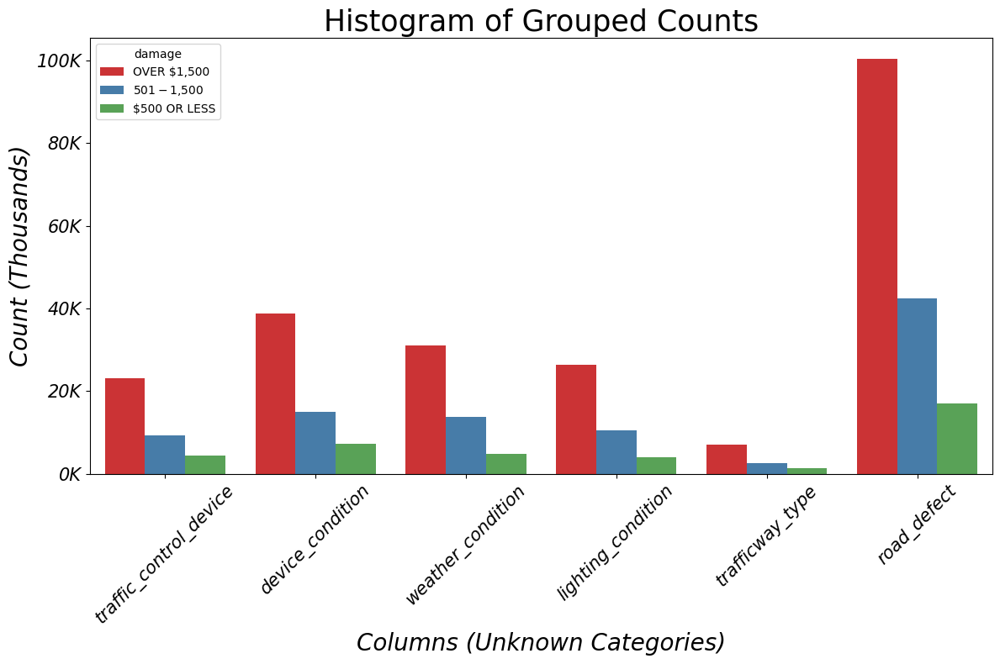

In [120]:
hist_visual(grouped_damage_counts, 'damage')

#### Visualize the counts with histograms: Injuries.

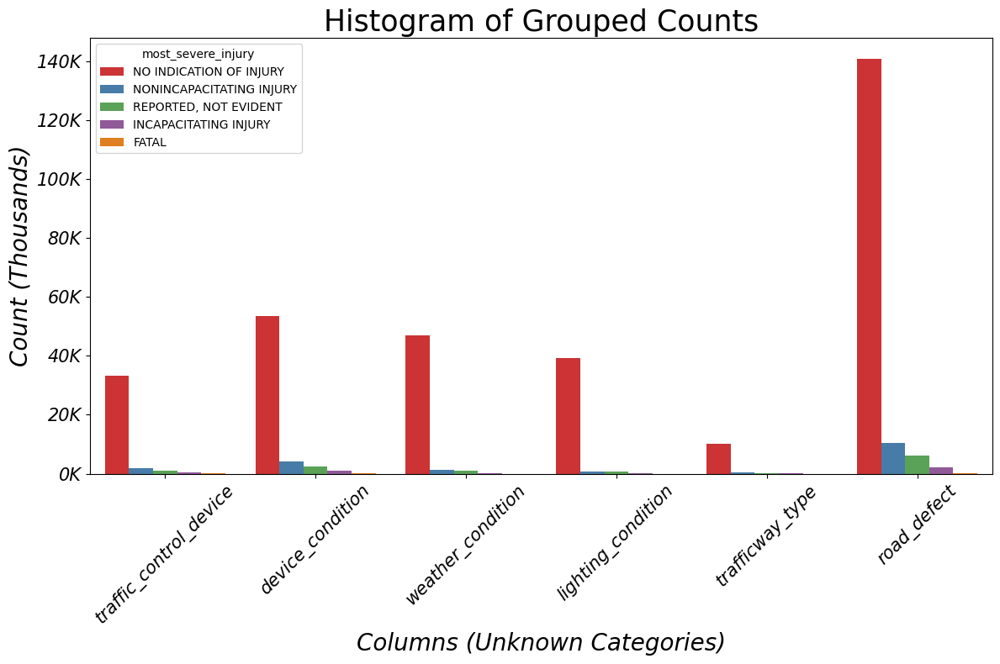

In [121]:
hist_visual(grouped_injury_counts, 'most_severe_injury')

#### Visualize the counts with histograms: Reporting Delay.

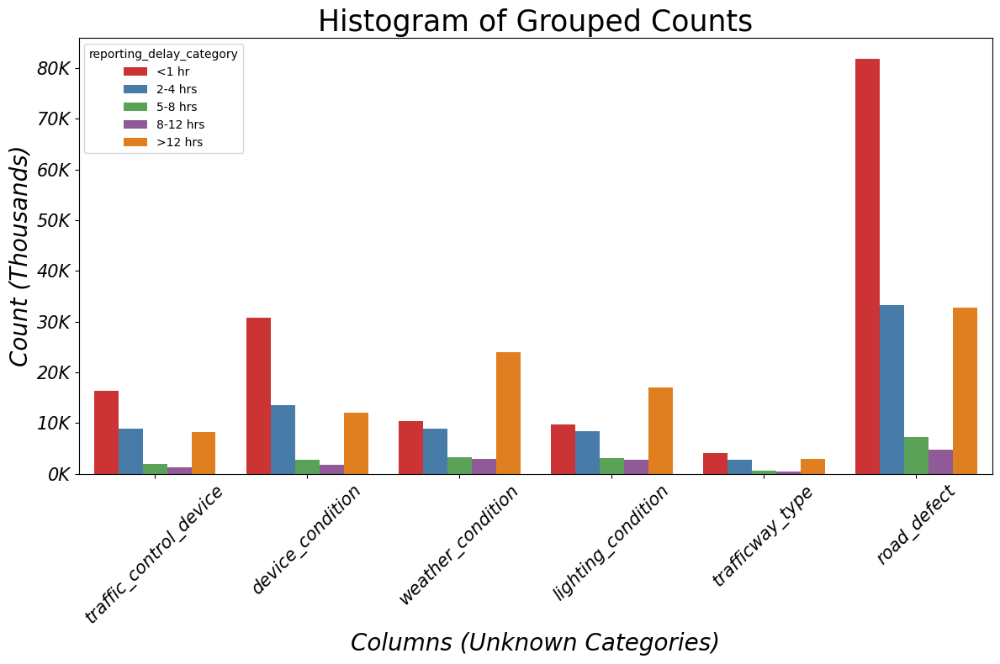

In [122]:
hist_visual(grouped_delay_counts, 'reporting_delay_category')

#### Visualize the counts with histograms: Crash Cause.

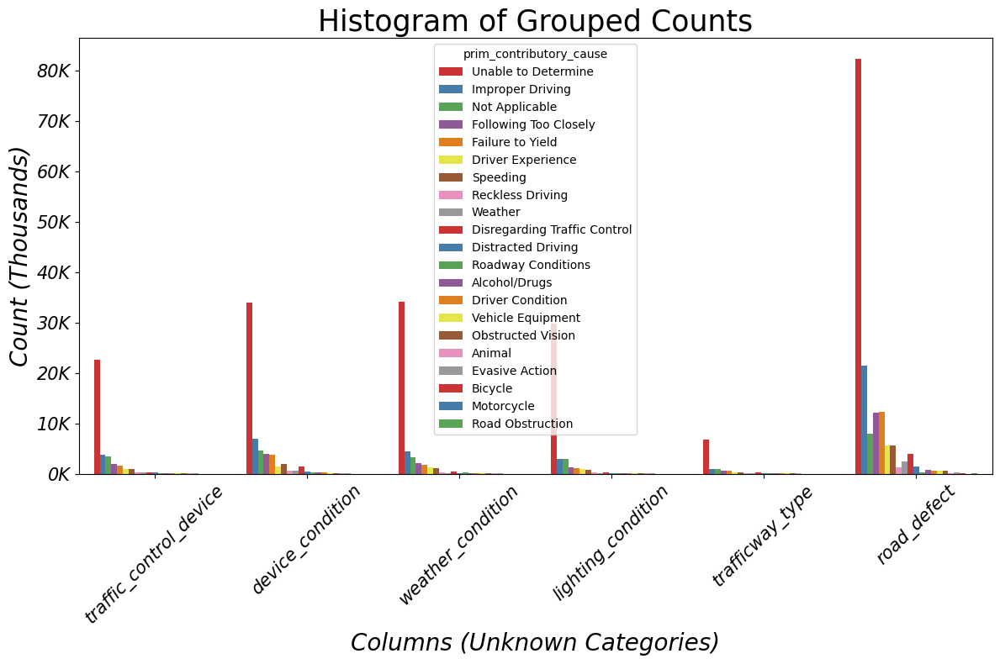

In [123]:
hist_visual(grouped_cause_counts, 'prim_contributory_cause')

#### Print out counts.

In [124]:
# loop through each column with unknowns
for col in df_crashes_unknown_cols:
    # filter out all rows where 'TRAFFICWAY_TYPE' is not 'Unknown'
    df_filtered = df_crashes_clean[df_crashes_clean[col] == 'Unknown']    
    
    # run value counts on the 'year' column
    year_counts = df_filtered['year'].value_counts()
    # run value counts on the 'damage' column
    damage_counts = df_filtered['damage'].value_counts()
    # run value counts on the 'most_severe_injury' column
    injury_counts = df_filtered['most_severe_injury'].value_counts()
    # run value counts on the 'reporting_delay_category' column
    delay_counts = df_filtered['reporting_delay_category'].value_counts()
    # run value counts on the 'prim_contributory_cause' column
    cause_counts = df_filtered['prim_contributory_cause'].value_counts()
                                                                     
    # display the result for the current binary column
    print(f"Value counts for 'crash_year' when '{col}' has Unknown values:")
    print(year_counts)
    print("~~~~~~~~~~~~~~~\n")  # add a blank line for readability between results
    print(f"Value counts for 'damage_counts' when '{col}' has Unknown values:")
    print(damage_counts)
    print("~~~~~~~~~~~~~~~\n")  
                                   
    print(f"Value counts for 'injury_counts' when '{col}' has Unknown values:")
    print(injury_counts)
    print("~~~~~~~~~~~~~~~\n")  
    print(f"Value counts for 'delay_counts' when '{col}' has Unknown values:")
    print(delay_counts)
    print("~~~~~~~~~~~~~~~\n")  
    print(f"Value counts for 'cause_counts' when '{col}' has Unknown values:")
    print(cause_counts)
    print("~~~~~~~~~~~~~~~\n")                        

Value counts for 'crash_year' when 'traffic_control_device' has Unknown values:
year
2023    7482
2024    5171
2022    5112
2019    3907
2021    3846
2018    3645
2020    2849
2017    2302
2016    1944
2015     377
Name: count, dtype: int64
~~~~~~~~~~~~~~~

Value counts for 'damage_counts' when 'traffic_control_device' has Unknown values:
damage
OVER $1,500      23065
$501 - $1,500     9220
$500 OR LESS      4350
Name: count, dtype: int64
~~~~~~~~~~~~~~~

Value counts for 'injury_counts' when 'traffic_control_device' has Unknown values:
most_severe_injury
NO INDICATION OF INJURY     33254
NONINCAPACITATING INJURY     1896
REPORTED, NOT EVIDENT        1048
INCAPACITATING INJURY         413
FATAL                          24
Name: count, dtype: int64
~~~~~~~~~~~~~~~

Value counts for 'delay_counts' when 'traffic_control_device' has Unknown values:
reporting_delay_category
<1 hr       16395
2-4 hrs      8872
>12 hrs      8269
5-8 hrs      1915
8-12 hrs     1184
Name: count, dtype: int64
~~

#### Brief conclusion about distribution of `Unknown` values:

* There's no visible dependence on `year`, so it's not an artifact of digitizing old reports or updating the report system.
* For all `Unknown` values in the columns, most damages are excessive, so there's no visible indication of underreporting the crashes with low to none damages.
* Most of `Unknown` values in the columns have no injuries (but so is most of the dataset), so we can't make any conclusion yet.
* We can see prevalence of delayed reporting (> 12hrs) for `Unknown` values in `weather_condition`, `lighting_condition`.
* We can see prevalence of `Unable to determine` in primary crash cause for all columns with the `Unknown` values.

### 4. 1. Recap of Traffic Crashes: `Crashes` EDA and Transformations.  

#### EDA.
* The City of Chicago crashes dataset contains information about medium-speed (30-35mph) crashes registered in urban environment. 
* Most crashes happen in clear weather during daylight or on a lit street.
* Most streets are well-maintained and have no road defects.
* Most traffic control devices are not present.
* Most crashes have no injuries and have excessive damages (over 1500USD).
* Most crashes happen on undivided roads, followed by mdeian-divided roads, various types of intersections, and parking garages.
* Most of the first crashes are either hitting parked vehicle or rear-ending.
* Crash number patterns by hour follow commute hours, with an uptic of crashes between 5 and 7 pm. 
* Crash number patterns by hour display steady amount of serious injuries between 11 am and 11 pm.  
* Crash number patterns by day display Sunday as the day with the least crashes and Friday the day with the most crashes.
* Crash number patterns by month mostly steady with slight uptick in May, June, and October.
* Most of crashes are reported within 1 hour, the second most reported is over 8 hours. Crashes reported after 8 hours have an increased number of `Unable to determine` cause.

#### Transformations.

* We started with the `df_crashes` 48 columns and 854910 data entries;
* Over 44% of `df_crashes[PRIM_CONTRIBUTORY_CAUSE]` was either undetermined (333195) or n/a (45295).
* Based on the data ranges in binary columns, we cleaned the values and replaced `nan`s with 0.
* For other categorical columns, we applied generalization, merging together similar categories.
* For the speed limit column, we replaced values 1-12 with 5mph increments and removed all odd rows with numbers not matching canonical speed limit values. We then generalized speed limit into wider bins based on distribution of determined vs undetermined crash causes.
* For the time, day, month columns, we created genral categories (time, month), for the day of the week, we replaced the number with the day name.
* We ended up with 852750 rows and 28 columns, `df_crashes_clean[prim_contributory_cause]` being undetermined in 324845 or n/a in 44181 rows.

#### Note on `Unknown` in categorical columns :

* We learned that `Unknown` is not related to historical reporting.
* We learned that `Unknown` is not related to the amount of damages.
* We learned that `Unknown` is not related to the extent of injuries.
* For weather and lighting conditions, `Unknown` strongly related to the delay in reporting.
* We learned that `Unable to determine` in primary crash cause dominates for all columns with the `Unknown` values.
* If we add up all `Unable to determine` in categorical columns with `Unknown` values, that would amount to 168359, or 1/2 of the entire dataset.

## 4. 2. Overview of Vehicle Crashes: People. 
Viewing top 5 elemets, listing columns, listing unique values in categorical columns.

In [125]:
df_people.head()

,PERSON_ID,PERSON_TYPE,CRASH_RECORD_ID,VEHICLE_ID,CRASH_DATE,SEAT_NO,CITY,STATE,ZIPCODE,SEX,...,EMS_RUN_NO,DRIVER_ACTION,DRIVER_VISION,PHYSICAL_CONDITION,PEDPEDAL_ACTION,PEDPEDAL_VISIBILITY,PEDPEDAL_LOCATION,BAC_RESULT,BAC_RESULT VALUE,CELL_PHONE_USE
0,O749947,DRIVER,81dc0de2ed92aa62baccab641fa377be7feb1cc47e6554...,834816.0,09/28/2019 03:30:00 AM,NaN,CHICAGO,IL,60651,M,...,NaN,UNKNOWN,UNKNOWN,UNKNOWN,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN
1,O871921,DRIVER,af84fb5c8d996fcd3aefd36593c3a02e6e7509eeb27568...,827212.0,04/13/2020 10:50:00 PM,NaN,CHICAGO,IL,60620,M,...,NaN,NONE,NOT OBSCURED,NORMAL,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN
2,O10018,DRIVER,71162af7bf22799b776547132ebf134b5b438dcf3dac6b...,9579.0,11/01/2015 05:00:00 AM,NaN,NaN,NaN,NaN,X,...,NaN,IMPROPER BACKING,UNKNOWN,UNKNOWN,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN
3,O10038,DRIVER,c21c476e2ccc41af550b5d858d22aaac4ffc88745a1700...,9598.0,11/01/2015 08:00:00 AM,NaN,NaN,NaN,NaN,X,...,NaN,UNKNOWN,UNKNOWN,UNKNOWN,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN
4,O10039,DRIVER,eb390a4c8e114c69488f5fb8a097fe629f5a92fd528cf4...,9600.0,11/01/2015 10:15:00 AM,NaN,NaN,NaN,NaN,X,...,NaN,UNKNOWN,UNKNOWN,UNKNOWN,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN


In [126]:
df_people.columns

Index(['PERSON_ID', 'PERSON_TYPE', 'CRASH_RECORD_ID', 'VEHICLE_ID',
       'CRASH_DATE', 'SEAT_NO', 'CITY', 'STATE', 'ZIPCODE', 'SEX', 'AGE',
       'DRIVERS_LICENSE_STATE', 'DRIVERS_LICENSE_CLASS', 'SAFETY_EQUIPMENT',
       'AIRBAG_DEPLOYED', 'EJECTION', 'INJURY_CLASSIFICATION', 'HOSPITAL',
       'EMS_AGENCY', 'EMS_RUN_NO', 'DRIVER_ACTION', 'DRIVER_VISION',
       'PHYSICAL_CONDITION', 'PEDPEDAL_ACTION', 'PEDPEDAL_VISIBILITY',
       'PEDPEDAL_LOCATION', 'BAC_RESULT', 'BAC_RESULT VALUE',
       'CELL_PHONE_USE'],
      dtype='object')

In [127]:
display_categorical_vals(df_people)

Column 'PERSON_ID' has unique values: ['O749947' 'O871921' 'O10018' ... 'P423636' 'P423637' 'P424430']
Column 'PERSON_TYPE' has unique values: ['DRIVER' 'PASSENGER' 'PEDESTRIAN' 'BICYCLE' 'NON-MOTOR VEHICLE'
 'NON-CONTACT VEHICLE']
Column 'CRASH_RECORD_ID' has unique values: ['81dc0de2ed92aa62baccab641fa377be7feb1cc47e6554932773284e51271e820d7a3c2398fa53636ac3b5b9004d27ee725ff26cfe65ce9b7869b67572e8f17d'
 'af84fb5c8d996fcd3aefd36593c3a02e6e7509eeb27568963d242f4b42bd91abfe2e5a046370df528b37a30d594ab2921c37f38f59f7db8863e2e2fa3e9dfa1f'
 '71162af7bf22799b776547132ebf134b5b438dcf3dac6b1ccc744e423da96652f8b51ba415f677df81aa76b994674618744fa0547e1216f32cf320324dcc732e'
 ...
 '2a2c2b94ebfd96652792942164db64b56732d1fb3230a16db531b29c7b97c4d3197d8b57908e4d232a5278dd9a0300f7a6510eaecf00e4b5a7abcf68a0a72004'
 'e3c27114d3f312df392113898881d17573e42a2559ab67904d9606d0eb10152d1330c4b690f558ab858f5ee7e779c9d9aef2cadd7090e51b2f956216a25e123d'
 '9456ea2b1574d9ed8db3c5091af3fb8d9fe5f08395057ecc9f02c2375

### Displaying percent NaNs in each column.

In [128]:
# display NaNs for df_people
display_df_nans(df_people)

              Column Name      % NaN
0          CELL_PHONE_USE  99.939959
1        BAC_RESULT VALUE  99.890529
2              EMS_RUN_NO  98.319433
3     PEDPEDAL_VISIBILITY  98.055254
4       PEDPEDAL_LOCATION  98.051734
5         PEDPEDAL_ACTION  98.051734
6              EMS_AGENCY  89.933572
7                HOSPITAL  83.705551
8                 SEAT_NO  79.765645
9   DRIVERS_LICENSE_CLASS  51.276277
10  DRIVERS_LICENSE_STATE  41.469680
11                ZIPCODE  33.104834
12                    AGE  29.147382
13                   CITY  27.243112
14                  STATE  26.138209
15          DRIVER_VISION  20.444135
16          DRIVER_ACTION  20.413597
17             BAC_RESULT  20.364685
18     PHYSICAL_CONDITION  20.359095
19             VEHICLE_ID   2.040811
20        AIRBAG_DEPLOYED   1.963328
21                    SEX   1.682172
22               EJECTION   1.248275
23       SAFETY_EQUIPMENT   0.278102
24  INJURY_CLASSIFICATION   0.038457
25            PERSON_TYPE   0.000000
2

#### Takeaways after initial overview:
* The dataset `Traffic Crashes: People` has 29 columns and 1877321 data entries;
* The dataset has a primary kery `PERSON_ID` and two non-primary keys:`CRASH_RECORD_ID`, `VEHICLE_ID`.
* The dataset contains information about the vehicle occupants. 

Columns that can contribute to identifying primary cause would contain information about physical condition (vision, health, BAC), experience (driver's age and drivers licence details), cellphone use.

### Proposed course of action for `df_people`.

We'll select a subset of columns related to driver's age, sex, out-of-state license, vision, action, physical condition, use of cell phone. We'll keep columns related to airbag deployment and hospital trip. 

Based on % NaNs and value distributions in drivers license class column, we'll have to omit it.

### Selecting a subset of columns from `df_people`.

In [129]:
# selecting columns of interest
cols_of_interest = ['PERSON_TYPE', 'CRASH_RECORD_ID', 'VEHICLE_ID', 'STATE', 'SEX', 'AGE',\
       'DRIVERS_LICENSE_STATE', 'SAFETY_EQUIPMENT',\
       'AIRBAG_DEPLOYED', 'HOSPITAL','DRIVER_ACTION', 'DRIVER_VISION',\
       'PHYSICAL_CONDITION', 'PEDPEDAL_ACTION', 'PEDPEDAL_VISIBILITY',\
       'PEDPEDAL_LOCATION', 'BAC_RESULT']

In [130]:
# selecting subset of original data frame
df_people_slice = df_people[cols_of_interest].copy()
df_people_slice.columns = df_people_slice.columns.str.lower()

### People EDA: cleaning categorical columns: `hospital`.

In [131]:
df_people_slice['hospital'].value_counts().head(40)

hospital
REFUSED                      103733
DNA                           38880
NONE                          21016
99                             7415
DECLINED                       7265
UNIVERSITY OF CHICAGO          5950
REFUSED EMS                    4468
HOLY CROSS                     4267
UNKNOWN                        4021
STROGER                        3882
NORTHWESTERN                   3050
MT SINAI                       2998
COMMUNITY FIRST                2971
ILLINOIS MASONIC               2487
UNK                            2363
WEST SUBURBAN                  2176
LITTLE COMPANY OF MARY         2012
TRINITY                        1982
CHRIST                         1741
ROSELAND                       1719
EMS REFUSED                    1710
MT. SINAI                      1700
JACKSON PARK                   1600
CHRIST HOSPITAL                1594
U OF C                         1519
ST BERNARD                     1500
NORWEGIAN                      1492
LORETTO            

The values in this column come from the on scene report and have greater variability in them.
We'll define a decline pattern as the one containing keywords `99`, `Unknown`, `DNA`, `refuse`, `decline` and replace all values matching decline pattern with 0. 

In [132]:
# define the pattern to match the values you want to set to 0
decline_pattern = 'refuse|decline|unk|99|DNA|unknown|none'

# Use .loc to update values that match the pattern
df_people_slice.loc[df_people_slice['hospital'].str.contains(decline_pattern, \
                                                             case=False, na=False), 'hospital'] = 0

# set all other values to 1
df_people_slice.loc[df_people_slice['hospital'] != 0, 'hospital'] = 1
# replace NaNs with 0
df_people_slice['hospital'] = df_people_slice['hospital'].fillna(0)

In [133]:
df_people_slice['hospital'].value_counts()

hospital
1    1727225
0     204801
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `airbag_deployed`.

In [134]:
df_people_slice['airbag_deployed'].value_counts()

airbag_deployed
DID NOT DEPLOY                            970169
NOT APPLICABLE                            408560
DEPLOYMENT UNKNOWN                        387375
DEPLOYED, FRONT                            60276
DEPLOYED, COMBINATION                      49257
DEPLOYED, SIDE                             17510
DEPLOYED OTHER (KNEE, AIR, BELT, ETC.)       947
Name: count, dtype: int64

In [135]:
# mapping for generalizing the values
generalization_mapping = {
    'DID NOT DEPLOY': 'No',
    'NOT APPLICABLE': 'Not Applicable',
    'DEPLOYMENT UNKNOWN': 'Unknown',
    'DEPLOYED, FRONT': 'Yes',
    'DEPLOYED, COMBINATION': 'Yes',
    'DEPLOYED, SIDE': 'Yes',
    'DEPLOYED OTHER (KNEE, AIR, BELT, ETC.)': 'Yes'
}

# apply the generalization
df_people_slice['airbag_deployed'] = df_people_slice['airbag_deployed'].replace(generalization_mapping)
# replace NaNs with Uknown
df_people_slice['airbag_deployed'] = df_people_slice['airbag_deployed'].fillna('Unknown')

In [136]:
df_people_slice['airbag_deployed'].value_counts()

airbag_deployed
No                970169
Unknown           425307
Not Applicable    408560
Yes               127990
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `driver_action`.

In [137]:
df_people_slice['driver_action'].value_counts()

driver_action
NONE                                 547534
UNKNOWN                              390413
FAILED TO YIELD                      139815
OTHER                                138288
FOLLOWED TOO CLOSELY                  90171
IMPROPER BACKING                      45292
IMPROPER TURN                         40450
IMPROPER LANE CHANGE                  39526
IMPROPER PASSING                      34504
DISREGARDED CONTROL DEVICES           27211
TOO FAST FOR CONDITIONS               22593
WRONG WAY/SIDE                         6209
IMPROPER PARKING                       5651
OVERCORRECTED                          3033
EVADING POLICE VEHICLE                 2408
CELL PHONE USE OTHER THAN TEXTING      2243
EMERGENCY VEHICLE ON CALL              1436
TEXTING                                 604
STOPPED SCHOOL BUS                      183
LICENSE RESTRICTIONS                     66
Name: count, dtype: int64

In [138]:
# mapping table
generalization_mapping = {
    'NONE': 'None',
    'UNKNOWN': 'Unknown',
    'FAILED TO YIELD': 'Disregarding Controls/Signs',
    'OTHER': 'Other',
    'FOLLOWED TOO CLOSELY': 'Distance',
    'IMPROPER BACKING': 'Improper Manouver',
    'IMPROPER TURN': 'Improper Manouver',
    'IMPROPER LANE CHANGE': 'Improper Manouver',
    'IMPROPER PASSING': 'Improper Manouver',
    'DISREGARDED CONTROL DEVICES': 'Disregarding Controls/Signs',
    'TOO FAST FOR CONDITIONS': 'Speeding',
    'WRONG WAY/SIDE': 'Wrong Way',
    'IMPROPER PARKING': 'Improper Manouver',
    'OVERCORRECTED': 'Improper Manouver',
    'EVADING POLICE VEHICLE': 'Other',
    'CELL PHONE USE OTHER THAN TEXTING': 'Distraction',
    'EMERGENCY VEHICLE ON CALL': 'Other',
    'TEXTING': 'Distraction',
    'STOPPED SCHOOL BUS': 'Other',
    'LICENSE RESTRICTIONS': 'Other'
}
# apply the generalization
df_people_slice['driver_action'] = df_people_slice['driver_action'].replace(generalization_mapping)
# replace NaNs with Uknown
df_people_slice['driver_action'] = df_people_slice['driver_action'].fillna('Unknown')

In [139]:
df_people_slice['driver_action'].value_counts()

driver_action
Unknown                        784809
None                           547534
Improper Manouver              168456
Disregarding Controls/Signs    167026
Other                          142381
Distance                        90171
Speeding                        22593
Wrong Way                        6209
Distraction                      2847
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `driver_vision`.

In [140]:
df_people_slice['driver_vision'].value_counts()

driver_vision
NOT OBSCURED              768702
UNKNOWN                   731742
OTHER                      15099
MOVING VEHICLES             8633
PARKED VEHICLES             5300
WINDSHIELD (WATER/ICE)      4093
BLINDED - SUNLIGHT          1833
TREES, PLANTS                610
BUILDINGS                    540
BLINDED - HEADLIGHTS         164
BLOWING MATERIALS            105
HILLCREST                    100
EMBANKMENT                    83
SIGNBOARD                     36
Name: count, dtype: int64

In [141]:
# mapping for generalizing the values
generalization_mapping = {
    'NOT OBSCURED': 'Clear',
    'UNKNOWN': 'Unknown',
    'OTHER': 'Other',
    'MOVING VEHICLES': 'Obscured',
    'PARKED VEHICLES': 'Obscured',
    'WINDSHIELD (WATER/ICE)': 'Obscured',
    'BLINDED - SUNLIGHT': 'Obscured',
    'TREES, PLANTS': 'Obscured',
    'BUILDINGS': 'Obscured',
    'BLINDED - HEADLIGHTS': 'Obscured',
    'BLOWING MATERIALS': 'Obscured',
    'HILLCREST': 'Obscured',
    'EMBANKMENT': 'Obscured',
    'SIGNBOARD': 'Obscured'
}

# apply the generalization
df_people_slice['driver_vision'] = df_people_slice['driver_vision'].replace(generalization_mapping)
# replace NaNs with Unknown
df_people_slice['driver_vision'] = df_people_slice['driver_vision'].fillna('Unknown')

In [142]:
df_people_slice['driver_vision'].value_counts()

driver_vision
Unknown     1126728
Clear        768702
Obscured      21497
Other         15099
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `physical_condition`.

In [143]:
df_people_slice['physical_condition'].value_counts()

physical_condition
NORMAL                          997117
UNKNOWN                         513151
IMPAIRED - ALCOHOL                6480
REMOVED BY EMS                    5588
OTHER                             4479
EMOTIONAL                         4044
FATIGUED/ASLEEP                   4027
ILLNESS/FAINTED                   1380
HAD BEEN DRINKING                 1108
IMPAIRED - DRUGS                   720
IMPAIRED - ALCOHOL AND DRUGS       400
MEDICATED                          189
Name: count, dtype: int64

In [144]:
# mapping for generalizing the values
generalization_mapping = {
    'NORMAL': 'Normal',
    'UNKNOWN': 'Unknown',
    'IMPAIRED - ALCOHOL': 'Impaired',
    'IMPAIRED - DRUGS': 'Impaired',
    'IMPAIRED - ALCOHOL AND DRUGS': 'Impaired',
    'MEDICATED': 'Impaired',
    'HAD BEEN DRINKING': 'Impaired',
    'FATIGUED/ASLEEP': 'Fatigue',
    'EMOTIONAL': 'Distressed',
    'ILLNESS/FAINTED': 'Illness',
    'REMOVED BY EMS': 'Other',
    'OTHER': 'Other'
}

# apply the generalization
df_people_slice['physical_condition'] = df_people_slice['physical_condition'].replace(generalization_mapping)
# replace NaNs with Unknown
df_people_slice['physical_condition'] = df_people_slice['physical_condition'].fillna('Unknown')

In [145]:
df_people_slice['physical_condition'].value_counts()

physical_condition
Normal        997117
Unknown       906494
Other          10067
Impaired        8897
Distressed      4044
Fatigue         4027
Illness         1380
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `pedpedal_action`, `pedpedal_visibility`,`pedpedal_location`.

In [146]:
df_people_slice['pedpedal_action'].value_counts()

pedpedal_action
CROSSING - WITH SIGNAL                               7571
WITH TRAFFIC                                         5780
UNKNOWN/NA                                           4782
OTHER ACTION                                         4333
CROSSING - NO CONTROLS (NOT AT INTERSECTION)         2554
CROSSING - NO CONTROLS (AT INTERSECTION)             2141
NO ACTION                                            2107
CROSSING - AGAINST SIGNAL                            1773
CROSSING - CONTROLS PRESENT (NOT AT INTERSECTION)    1211
NOT AT INTERSECTION                                  1146
AGAINST TRAFFIC                                      1120
STANDING IN ROADWAY                                   857
TURNING LEFT                                          557
PARKED VEHICLE                                        446
ENTER FROM DRIVE/ALLEY                                354
WORKING IN ROADWAY                                    253
TURNING RIGHT                                         24

In [147]:
# mapping
generalization_mapping = {
    'CROSSING - WITH SIGNAL': 'Crossing',
    'WITH TRAFFIC': 'With traffic',
    'UNKNOWN/NA': 'Unknown',
    'OTHER ACTION': 'Other',
    'CROSSING - NO CONTROLS (NOT AT INTERSECTION)': 'Crossing',
    'CROSSING - NO CONTROLS (AT INTERSECTION)': 'Crossing, intersection',
    'NO ACTION': 'Other',
    'CROSSING - AGAINST SIGNAL': 'Crossing',
    'CROSSING - CONTROLS PRESENT (NOT AT INTERSECTION)': 'Crossing',
    'NOT AT INTERSECTION': 'Crossing',
    'AGAINST TRAFFIC': 'Against traffic',
    'STANDING IN ROADWAY': 'Standing',
    'TURNING LEFT': 'Turning',
    'PARKED VEHICLE': 'Stationary',
    'ENTER FROM DRIVE/ALLEY': 'Other',
    'WORKING IN ROADWAY': 'Moving',
    'TURNING RIGHT': 'Turning',
    'INTOXICATED PED/PEDAL': 'Other',
    'PLAYING IN ROADWAY': 'Moving',
    'PLAYING/WORKING ON VEHICLE': 'Moving',
    'TO/FROM DISABLED VEHICLE': 'Moving',
    'SCHOOL BUS (WITHIN 50 FT.)': 'School Bus',
    'WAITING FOR SCHOOL BUS': 'School Bus'
}

# apply the generalization
df_people_slice['pedpedal_action'] = df_people_slice['pedpedal_action'].replace(generalization_mapping)
# replace NaNs with `Unknown`
df_people_slice['pedpedal_action'] = df_people_slice['pedpedal_action'].fillna('Unknown')

In [148]:
df_people_slice['pedpedal_action'].value_counts()

pedpedal_action
Unknown                   1899167
Crossing                    14255
Other                        6992
With traffic                 5780
Crossing, intersection       2141
Against traffic              1120
Standing                      857
Turning                       800
Stationary                    446
Moving                        438
School Bus                     30
Name: count, dtype: int64

In [149]:
df_people_slice['pedpedal_visibility'].value_counts()

pedpedal_visibility
NO CONTRASTING CLOTHING    29597
CONTRASTING CLOTHING        4866
OTHER LIGHT SOURCE USED     2163
REFLECTIVE MATERIAL          947
Name: count, dtype: int64

In [150]:
# replace 'NO CONTRASTING CLOTHING' with 0 and everything else with 1
df_people_slice['pedpedal_visibility'] = df_people_slice['pedpedal_visibility'].apply(lambda x: \
                                                                                      0 if x == 'NO CONTRASTING CLOTHING' else 1)
# replace NaNs with 0
df_people_slice['pedpedal_visibility'] = df_people_slice['pedpedal_visibility'].fillna(0)

In [151]:
df_people_slice['pedpedal_visibility'].value_counts()

pedpedal_visibility
1    1902429
0      29597
Name: count, dtype: int64

In [152]:
df_people_slice['pedpedal_location'].value_counts()


pedpedal_location
IN ROADWAY         16465
IN CROSSWALK       12486
UNKNOWN/NA          3168
NOT IN ROADWAY      1670
BIKEWAY             1646
BIKE LANE           1431
DRIVEWAY ACCESS      539
SHOULDER             236
Name: count, dtype: int64

In [153]:
# define mapping for generalizing the values
generalization_mapping = {
    'IN ROADWAY': 'Roadway',
    'IN CROSSWALK': 'Crosswalk',
    'UNKNOWN/NA': 'Unknown',
    'NOT IN ROADWAY': 'Not in Roadway',
    'BIKEWAY': 'Bike Lane/Shoulder',
    'BIKE LANE': 'Bike Lane/Shoulder',
    'DRIVEWAY ACCESS': 'Driveway',
    'SHOULDER': 'Bike Lane/Shoulder'
}

# apply the generalization 
df_people_slice['pedpedal_location'] = df_people_slice['pedpedal_location'].replace(generalization_mapping)
# replace NaNs with `Unknown`
df_people_slice['pedpedal_location'] = df_people_slice['pedpedal_location'].fillna('Unknown')

In [154]:
df_people_slice['pedpedal_location'].value_counts()

pedpedal_location
Unknown               1897553
Roadway                 16465
Crosswalk               12486
Bike Lane/Shoulder       3313
Not in Roadway           1670
Driveway                  539
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `safety_equpment`.

In [155]:
df_people_slice['safety_equipment'].value_counts()

safety_equipment
USAGE UNKNOWN                                 914551
SAFETY BELT USED                              899285
NONE PRESENT                                   65132
SAFETY BELT NOT USED                           10516
HELMET NOT USED                                 9709
CHILD RESTRAINT USED                            7822
CHILD RESTRAINT - FORWARD FACING                4945
BICYCLE HELMET (PEDACYCLIST INVOLVED ONLY)      3806
CHILD RESTRAINT - TYPE UNKNOWN                  2599
CHILD RESTRAINT - REAR FACING                   2250
DOT COMPLIANT MOTORCYCLE HELMET                 1527
HELMET USED                                     1358
BOOSTER SEAT                                    1285
CHILD RESTRAINT NOT USED                         853
NOT DOT COMPLIANT MOTORCYCLE HELMET              297
SHOULD/LAP BELT USED IMPROPERLY                  270
WHEELCHAIR                                       237
CHILD RESTRAINT USED IMPROPERLY                  165
STRETCHER                    

In [156]:
# mapping for generalizing
generalization_mapping = {
    'USAGE UNKNOWN': 'Unknown',
    'SAFETY BELT USED': 'Used',
    'NONE PRESENT': 'None',
    'SAFETY BELT NOT USED': 'Not Used',
    'HELMET NOT USED': 'Not Used',
    'CHILD RESTRAINT USED': 'Used',
    'CHILD RESTRAINT - FORWARD FACING': 'Used',
    'BICYCLE HELMET (PEDACYCLIST INVOLVED ONLY)': 'Used',
    'CHILD RESTRAINT - TYPE UNKNOWN': 'Used',
    'CHILD RESTRAINT - REAR FACING': 'Used',
    'DOT COMPLIANT MOTORCYCLE HELMET': 'Used',
    'HELMET USED': 'Used',
    'BOOSTER SEAT': 'Used',
    'CHILD RESTRAINT NOT USED': 'Not Used',
    'NOT DOT COMPLIANT MOTORCYCLE HELMET': 'Not Used',
    'SHOULD/LAP BELT USED IMPROPERLY': 'Not Used',
    'WHEELCHAIR': 'Other',
    'CHILD RESTRAINT USED IMPROPERLY': 'Not Used',
    'STRETCHER': 'Other'
}
# apply the generalization 
df_people_slice['safety_equipment'] = df_people_slice['safety_equipment'].replace(generalization_mapping)
# replace NaNs with `Unknown`
df_people_slice['safety_equipment'] = df_people_slice['safety_equipment'].fillna('Unknown')

In [157]:
df_people_slice['safety_equipment'].value_counts()

safety_equipment
Used        924877
Unknown     919924
None         65132
Not Used     21810
Other          283
Name: count, dtype: int64

### People EDA: cleaning categorical columns: `bac_result`.

In [158]:
df_people_slice['bac_result'].value_counts()

bac_result
TEST NOT OFFERED                   1516366
TEST REFUSED                         15843
TEST PERFORMED, RESULTS UNKNOWN       3658
TEST TAKEN                            2708
Name: count, dtype: int64

In [159]:
# mapping for generalizing
generalization_mapping = {
    'TEST NOT OFFERED': 'Not Offered',
    'TEST REFUSED': 'Refused',
    'TEST TAKEN': 'Taken',
    'TEST PERFORMED, RESULTS UNKNOWN': 'Taken',
    'nan': 'Not Offered'
}
# apply the generalization 
df_people_slice['bac_result'] = df_people_slice['bac_result'].replace(generalization_mapping)

# impute NaNs with `Not Offered`
df_people_slice['bac_result'] = df_people_slice['bac_result'].fillna('Not Offered')

In [160]:
df_people_slice['bac_result'].value_counts()

bac_result
Not Offered    1909817
Refused          15843
Taken             6366
Name: count, dtype: int64

### People EDA: creating a binary column if driver is out of state.

In [161]:
# create a new binary column 'out_of_state' where 1 means the driver is out of state, and 0 means they are in-state
df_people_slice['driver_out_of_state'] = df_people_slice.apply(lambda row: \
                                                        1 if row['state'] != row['drivers_license_state'] \
                                                        else 0, axis=1)
# impute NaNs with `0`
df_people_slice['driver_out_of_state'] = df_people_slice['driver_out_of_state'].fillna(0)

In [162]:
df_people_slice['driver_out_of_state'].value_counts()

driver_out_of_state
0    1040924
1     891102
Name: count, dtype: int64

### People EDA: categorizing driver's age.

First, we'll take a look at age distribution.

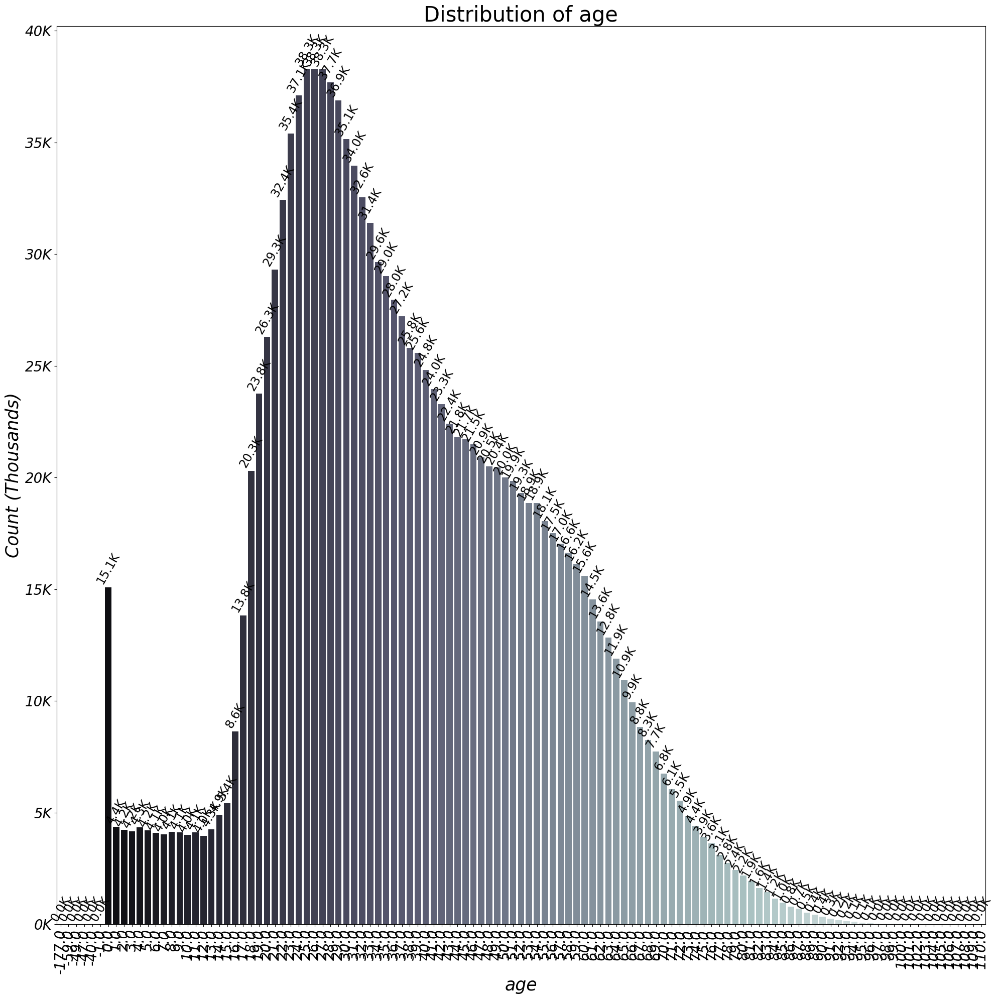

In [163]:
# count plot for 'reporting_delay_category'
fig, ax = countplot_df_crashes(df_people_slice, 'age')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

#### Data issues: negative age and out-of limits age.
Confirm with `value_counts()`:

In [164]:
df_people_slice['age'].value_counts()

age
 25.0     38298
 26.0     38295
 27.0     38269
 28.0     37686
 24.0     37107
          ...  
-40.0         1
-177.0        1
-49.0         1
-47.0         1
-59.0         1
Name: count, Length: 117, dtype: int64

#### Data cleaning: use absolute value of age, check age count after 90.
We'll expect to see a number of ages over 90, what we're looking for is a steady decline as age goes up.
We also want to be sure there's no uptick in age 99 (code for unknown).

In [165]:
# replace age with abs(age)
df_people_slice['age'] = df_people_slice['age'].abs()

In [166]:
#get the value counts for all ages over 90
df_people_slice[df_people_slice['age'] > 90]['age'].value_counts()

age
91.0     258
92.0     193
93.0     152
94.0     110
95.0      77
96.0      51
99.0      34
97.0      33
98.0      32
100.0     24
102.0     23
101.0     20
103.0     10
104.0      8
109.0      7
107.0      7
110.0      6
108.0      5
105.0      5
106.0      3
177.0      1
Name: count, dtype: int64

One minor fix, we'll replace age 177 with age 77.

In [167]:
# replace 177 age with 77
df_people_slice.loc[df_people_slice['age'] == 177, 'age'] = 77

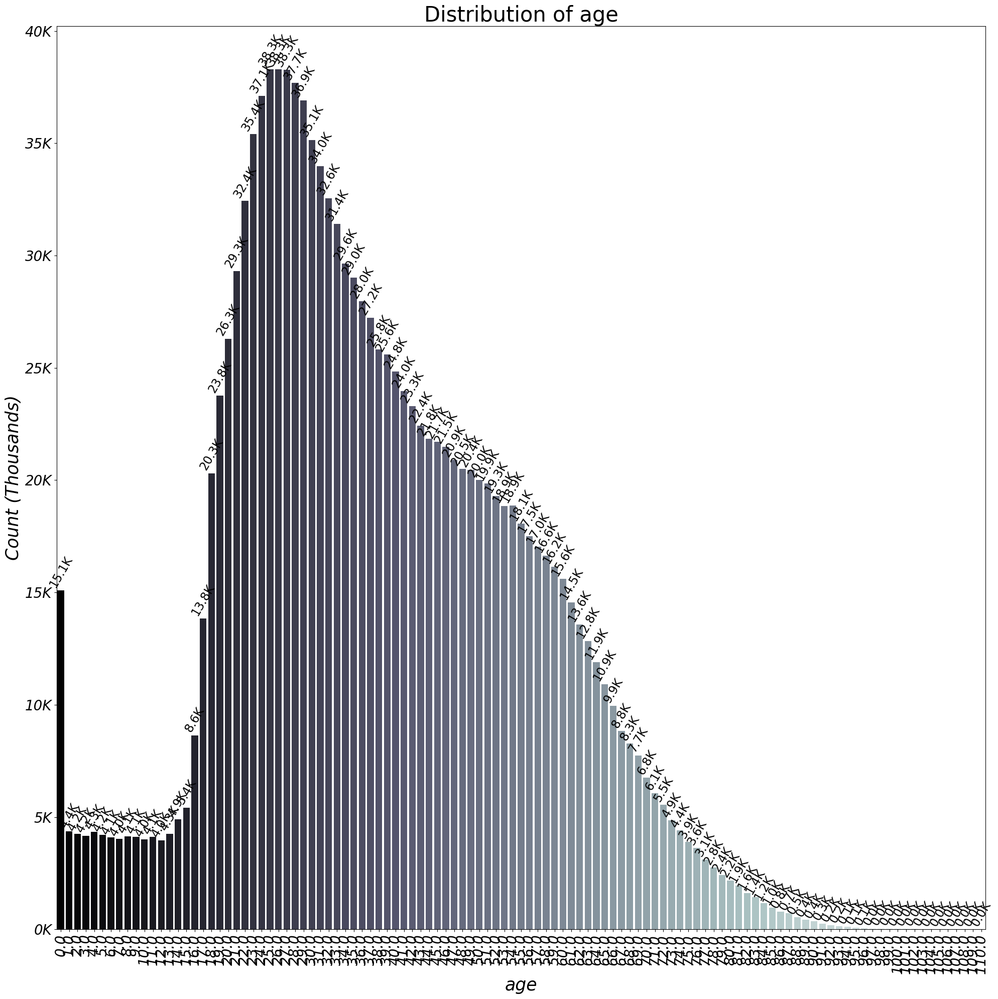

In [168]:
# count plot for 'reporting_delay_category'
fig, ax = countplot_df_crashes(df_people_slice, 'age')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

In [169]:
# replace NaNs with 'Unknown'
df_people_slice['age'] = df_people_slice['age'].fillna('Unknown')
# convert 'age' to numeric, forcing errors to NaN
df_people_slice['age_numeric'] = pd.to_numeric(df_people_slice['age'], errors='coerce')

In [170]:
# function to categorize age into different groups
def categorize_age(age):
    if age < 1:
        return 'Infant'
    elif 1 <= age <= 3:
        return 'Toddler'
    elif 4 <= age <= 8:
        return 'Child'    
    elif 13 <= age < 18:
        return 'Teenager'
    elif 18 <= age < 25:
        return 'Young Adult'
    elif 25 <= age < 70:
        return 'Adult'
    else:
        return 'Senior'

# apply the function to create a new column 'age_category'
df_people_slice['age_category'] = df_people_slice['age_numeric'].apply(categorize_age)
df_people_slice['age_category'].value_counts()

age_category
Adult          1005642
Senior          636001
Young Adult     204619
Teenager         37072
Child            20821
Infant           15089
Toddler          12782
Name: count, dtype: int64

We'll stop with `age` for now, we'll perform more EDA once this dataset is merged with the crashes to allowing us better categorization.

### People EDA: cleaning `sex` column.

In [171]:
# replace NaNs with 'Unknown'
df_people_slice['sex'] = df_people_slice['sex'].fillna('X')

### People EDA: selecting a non-passenger subset.
We'll select a subset of columns, remove NaNs from the subset, confirm with the output.
We'll also remove all entries related to passengers.

In [172]:
df_people_slice['person_type'].value_counts()

person_type
DRIVER                 1502188
PASSENGER               390933
PEDESTRIAN               22700
BICYCLE                  14263
NON-MOTOR VEHICLE         1618
NON-CONTACT VEHICLE        324
Name: count, dtype: int64

In [173]:
# mapping for generalizing
generalization_mapping = {
    'DRIVER': 'Driver',
    'PASSENGER': 'Passenger',
    'PEDESTRIAN': 'Pedestrian',
    'BICYCLE': 'Cyclist',
    'NON-CONTACT VEHICLE': 'Other',
    'NON-MOTOR VEHICLE': 'Other'
}
# apply the generalization 
df_people_slice['person_type'] = df_people_slice['person_type'].replace(generalization_mapping)

In [174]:
df_people_slice['person_type'].value_counts()

person_type
Driver        1502188
Passenger      390933
Pedestrian      22700
Cyclist         14263
Other            1942
Name: count, dtype: int64

In [175]:
# identify non-drivers (assuming 'is_driver' is a column in the dataframe)
df_people_slice_non_drivers = df_people_slice[df_people_slice['person_type'] == 'Passenger']
# create a pivot table to check the presence of different age categories for non-drivers by 'vehicle_id'
age_category_pivot = pd.crosstab(df_people_slice_non_drivers['vehicle_id'], \
                                 df_people_slice_non_drivers['age_category'])
# merge the pivot table back to the original dataframe
# merge on 'vehicle_id' to add the binary columns to the main dataframe
df_people_slice = df_people_slice.merge(age_category_pivot, on='vehicle_id', how='left')

# fill any NaN values with 0, as absence of an age category means 0
df_people_slice.fillna('0', inplace=True)

In [176]:
df_people_slice.shape

(1932026, 27)

In [177]:
# select a subset where df_people_slice['person_type'] is not a passneger
df_people_slice = df_people_slice[df_people_slice['person_type'] != 'Passenger']

In [178]:
df_people_slice.shape

(1541093, 27)

### People EDA: selecting subset for future analysis and dropping NaNs.

In [179]:
df_people_slice.columns

Index(['person_type', 'crash_record_id', 'vehicle_id', 'state', 'sex', 'age',
       'drivers_license_state', 'safety_equipment', 'airbag_deployed',
       'hospital', 'driver_action', 'driver_vision', 'physical_condition',
       'pedpedal_action', 'pedpedal_visibility', 'pedpedal_location',
       'bac_result', 'driver_out_of_state', 'age_numeric', 'age_category',
       'Adult', 'Child', 'Infant', 'Senior', 'Teenager', 'Toddler',
       'Young Adult'],
      dtype='object')

In [180]:
# cols to keep_keep
people_cols_to_keep = ['person_type', 'crash_record_id', 'vehicle_id', 'sex', 'age_category', 'safety_equipment',
       'airbag_deployed', 'hospital', 'driver_action', 'driver_vision',
       'physical_condition', 'pedpedal_action', 'pedpedal_visibility',
       'pedpedal_location', 'bac_result', 'driver_out_of_state', 'Adult', 'Child', 'Infant', 'Senior', 'Teenager', 'Toddler',
       'Young Adult']

df_to_keep_people = df_people_slice[people_cols_to_keep].copy()

In [181]:
display_df_nans(df_to_keep_people)

            Column Name  % NaN
0           person_type    0.0
1   pedpedal_visibility    0.0
2               Toddler    0.0
3              Teenager    0.0
4                Senior    0.0
5                Infant    0.0
6                 Child    0.0
7                 Adult    0.0
8   driver_out_of_state    0.0
9            bac_result    0.0
10    pedpedal_location    0.0
11      pedpedal_action    0.0
12      crash_record_id    0.0
13   physical_condition    0.0
14        driver_vision    0.0
15        driver_action    0.0
16             hospital    0.0
17      airbag_deployed    0.0
18     safety_equipment    0.0
19         age_category    0.0
20                  sex    0.0
21           vehicle_id    0.0
22          Young Adult    0.0


In [182]:
df_people_clean = df_to_keep_people.dropna().copy()

# rename passenger age category columns
df_people_clean.rename(columns = {'Adult':'passenger_adult', 'Child':'passenger_child', \
                            'Infant':'passenger_infant', 'Senior':'passenger_senior', \
                            'Teenager':'passenger_teenager', 'Young Adult':'passenger_young_adult', \
                                 'Toddler':'passenger_toddler'}, \
                      inplace=True)

In [183]:
df_people_clean.shape

(1541093, 23)

In [184]:
df_people_clean.columns

Index(['person_type', 'crash_record_id', 'vehicle_id', 'sex', 'age_category',
       'safety_equipment', 'airbag_deployed', 'hospital', 'driver_action',
       'driver_vision', 'physical_condition', 'pedpedal_action',
       'pedpedal_visibility', 'pedpedal_location', 'bac_result',
       'driver_out_of_state', 'passenger_adult', 'passenger_child',
       'passenger_infant', 'passenger_senior', 'passenger_teenager',
       'passenger_toddler', 'passenger_young_adult'],
      dtype='object')

In [185]:
# free memory
del df_people
del df_people_slice
del df_to_keep_people

### Recapping of people EDA and cleaning.

* We started with  29 columns and 1877321 rows.  After cleaning, we ended with 16 columns and 1459439 rows, losing 418 thousand entries mostly related to passenger `person_type`.
* This dataset shows signs of incomplete logging, with multiple columns conyaining large amount of NaNs.
* Our cleaning mostly involved applying generalization to categories `safety_equipment`,
       `airbag_deployed`, `driver_action`, `driver_vision`,
       `physical_condition`, `pedpedal_action`, `pedpedal_visibility`,
       `pedpedal_location`, `bac_result` and imputing NaNs with appropriate entries.
* We created two binary columns: whenever the driver is out of state and whenever there was an ambulance trip.
* We dropped all passenger entries.
* We only cleaned `age`, we'll apply categorization once we merge it with other datasets.

## 4. 3. Overview of Vehicle Crashes: Vehicles. 
Viewing top 5 elemets, listing columns, listing unique values in categorical columns.

In [186]:
df_vehicles.head()

,CRASH_UNIT_ID,CRASH_RECORD_ID,CRASH_DATE,UNIT_NO,UNIT_TYPE,NUM_PASSENGERS,VEHICLE_ID,CMRC_VEH_I,MAKE,MODEL,...,TRAILER1_LENGTH,TRAILER2_LENGTH,TOTAL_VEHICLE_LENGTH,AXLE_CNT,VEHICLE_CONFIG,CARGO_BODY_TYPE,LOAD_TYPE,HAZMAT_OUT_OF_SERVICE_I,MCS_OUT_OF_SERVICE_I,HAZMAT_CLASS
0,1727162,f5943b05f46b8d4148a63b7506a59113eae0cf1075aabc...,12/21/2023 08:57:00 AM,2,PEDESTRIAN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1717556,7b1763088507f77e0e552c009a6bf89a4d6330c7527706...,12/06/2023 03:24:00 PM,1,DRIVER,NaN,1634931.0,NaN,NISSAN,SENTRA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1717574,2603ff5a88f0b9b54576934c5ed4e4a64e8278e005687b...,12/06/2023 04:00:00 PM,2,DRIVER,NaN,1634978.0,NaN,CHRYSLER,SEBRING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1717579,a52ef70e33d468b855b5be44e8638a564434dcf99c0edf...,12/06/2023 04:30:00 PM,1,DRIVER,NaN,1634948.0,NaN,SUBARU,OUTBACK,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1720118,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,12/10/2023 12:12:00 PM,1,DRIVER,NaN,1637401.0,NaN,TOYOTA,RAV4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [187]:
df_vehicles.columns

Index(['CRASH_UNIT_ID', 'CRASH_RECORD_ID', 'CRASH_DATE', 'UNIT_NO',
       'UNIT_TYPE', 'NUM_PASSENGERS', 'VEHICLE_ID', 'CMRC_VEH_I', 'MAKE',
       'MODEL', 'LIC_PLATE_STATE', 'VEHICLE_YEAR', 'VEHICLE_DEFECT',
       'VEHICLE_TYPE', 'VEHICLE_USE', 'TRAVEL_DIRECTION', 'MANEUVER',
       'TOWED_I', 'FIRE_I', 'OCCUPANT_CNT', 'EXCEED_SPEED_LIMIT_I', 'TOWED_BY',
       'TOWED_TO', 'AREA_00_I', 'AREA_01_I', 'AREA_02_I', 'AREA_03_I',
       'AREA_04_I', 'AREA_05_I', 'AREA_06_I', 'AREA_07_I', 'AREA_08_I',
       'AREA_09_I', 'AREA_10_I', 'AREA_11_I', 'AREA_12_I', 'AREA_99_I',
       'FIRST_CONTACT_POINT', 'CMV_ID', 'USDOT_NO', 'CCMC_NO', 'ILCC_NO',
       'COMMERCIAL_SRC', 'GVWR', 'CARRIER_NAME', 'CARRIER_STATE',
       'CARRIER_CITY', 'HAZMAT_PLACARDS_I', 'HAZMAT_NAME', 'UN_NO',
       'HAZMAT_PRESENT_I', 'HAZMAT_REPORT_I', 'HAZMAT_REPORT_NO',
       'MCS_REPORT_I', 'MCS_REPORT_NO', 'HAZMAT_VIO_CAUSE_CRASH_I',
       'MCS_VIO_CAUSE_CRASH_I', 'IDOT_PERMIT_NO', 'WIDE_LOAD_I',
       'TRAILER1_

In [188]:
display_categorical_vals(df_vehicles)

Column 'CRASH_RECORD_ID' has unique values: ['f5943b05f46b8d4148a63b7506a59113eae0cf1075aabca4408e733f6f9de735fb237fe5c15f032ea3b70e89a3c445f750f576fba089f421c9e99f17bdacf0d9'
 '7b1763088507f77e0e552c009a6bf89a4d6330c75277067fe4c9c8081d86be3db49c1f283c6bcf64b690e03175db497c49aaa3456b5e3c858b3e013dabc1228e'
 '2603ff5a88f0b9b54576934c5ed4e4a64e8278e005687b0edb576f26e0d17decfa6d65506e65b16db5ef12628f2a02cbfcfcbfc97782d28c8f7fdda5a34e9f75'
 ...
 '4b4ad0a63db31573e59ebdf7f87fbf620e21e76f27f19a9c5f5378701b978da7c461b6b1f616417a411a83338e4137abc33126dbe517cc89d28558ba29983c63'
 '0ea9c44ae05caeed841da1d3724cb96ebed3fb0421df26e116311fb381ca17891ff912a46ac1b8b1ebd1a6ce884dbd3394b855decc758ec8d9ebe8b92c83662c'
 'b1adab887082540c3d3b5f51bb00561c13122e1fab5f55bb5e3b4f093944a98ef1a33aeec2acc70361a8f696ddead308a67d2614f6ede951efca0a5375636ea2']
Column 'CRASH_DATE' has unique values: ['12/21/2023 08:57:00 AM' '12/06/2023 03:24:00 PM'
 '12/06/2023 04:00:00 PM' ... '09/30/2024 01:13:00 AM'
 '09/30/2024 

In [189]:
display_df_nans(df_vehicles)

         Column Name      % NaN
0   HAZMAT_REPORT_NO  99.999944
1      MCS_REPORT_NO  99.999610
2        HAZMAT_NAME  99.996489
3    TRAILER2_LENGTH  99.996099
4        WIDE_LOAD_I  99.991029
..               ...        ...
66         UNIT_TYPE   0.123928
67   CRASH_RECORD_ID   0.000000
68           UNIT_NO   0.000000
69        CRASH_DATE   0.000000
70     CRASH_UNIT_ID   0.000000

[71 rows x 2 columns]


#### Takeaways after initial overview:
* The dataset `Traffic Crashes: Vehicle` has 71 columns and 1743922 data entries;
* The dataset has a primary kery `CRASH_UNIT_ID` and two non-primary keys:`CRASH_RECORD_ID`, `VEHICLE_ID`.
* The dataset contains information about the vehicle, such as make, model, defect. 

Columns that can contribute to identifying primary cause would contain information about the number of passengers, vehicle details, and driver's manouvers before the crash.

### Proposed course of action for `df_vehicles`.

We'll select a subset of columns related to vehicle's make, model, type, defects.
We'll consider total length,number of axles, number of occupants, travel direction, first contact point, manouver before crash.  

### Selecting a subset of columns from `df_vehicles`.

In [190]:
cols_of_interest = ['CRASH_RECORD_ID', 'UNIT_TYPE', 'VEHICLE_ID', 'MAKE',
       'MODEL', 'VEHICLE_YEAR', 'VEHICLE_DEFECT',
       'VEHICLE_TYPE', 'VEHICLE_USE', 'TRAVEL_DIRECTION', 'MANEUVER',
       'TOWED_I', 'EXCEED_SPEED_LIMIT_I', 'OCCUPANT_CNT',
       'FIRST_CONTACT_POINT', 'TOTAL_VEHICLE_LENGTH', 'AXLE_CNT','WIDE_LOAD_I', 'HAZMAT_PRESENT_I']

# selecting subset of original data frame
df_vehicles_slice = df_vehicles[cols_of_interest].copy()
df_vehicles_slice.columns = df_vehicles_slice.columns.str.lower()

### Vehicles EDA and Cleaning: `unit_type`.

In [191]:
# value counts for unit_type
df_vehicles_slice['unit_type'].value_counts()

unit_type
DRIVER                 1502188
PARKED                  236646
PEDESTRIAN               22700
DRIVERLESS               14353
BICYCLE                  14263
NON-MOTOR VEHICLE         1618
NON-CONTACT VEHICLE        324
DISABLED VEHICLE           274
EQUESTRIAN                   7
Name: count, dtype: int64

In [192]:
# mapping for generalized values
generalization_mapping = {
    'DRIVER': 'Driver',
    'PARKED': 'Parked',
    'PEDESTRIAN': 'Pedestrian',
    'BICYCLE': 'Cyclist',
    'DRIVERLESS': 'Other',
    'NON-MOTOR VEHICLE': 'Other',
    'NON-CONTACT VEHICLE': 'Other',
    'DISABLED VEHICLE': 'Other',
    'EQUESTRIAN': 'Other'
}

# apply the generalization
df_vehicles_slice['unit_type'] = df_vehicles_slice['unit_type'].replace(generalization_mapping)

In [193]:
df_vehicles_slice['unit_type'].value_counts()

unit_type
Driver        1502188
Parked         236646
Pedestrian      22700
Other           16576
Cyclist         14263
Name: count, dtype: int64

### Vehicles EDA and Cleaning: `make`, `model`.

We'll expect to see variations of various manufacturers, that's why we list all makes over 1000 first.

In [194]:
# convert names to title 
df_vehicles_slice['make'] = df_vehicles_slice['make'].str.title()

df_vehicles_slice['make'].value_counts()[df_vehicles_slice['make'].value_counts() > 1000]

make
Chevrolet                                              202430
Ford                                                   175097
Unknown                                                174476
Nissan                                                 141370
Honda                                                  129165
Toyota                                                 105509
Toyota Motor Company, Ltd.                              89215
Dodge                                                   75349
Hyundai                                                 73545
Jeep                                                    73160
Volkswagen                                              34021
Chrysler                                                31312
Buick                                                   29098
Kia                                                     28693
Lexus                                                   26510
Mercedes-Benz                                           24519
Bmw

In [195]:
df_vehicles_slice['make'].value_counts()[(df_vehicles_slice['make'].value_counts() < 1000) & 
                                         (df_vehicles_slice['make'].value_counts() > 100)]

make
International Trailer Corporation                         976
Kenworth Motor Truck Co.                                  912
Saab                                                      902
International Trailer Corp.                               826
Peterbilt Motors Co., Division Paccar, Inc.               779
Range Rover Of North America                              747
International Harvester                                   734
Alfa Romeo                                                575
Yamaha                                                    555
Tesla Motors                                              543
Hummer                                                    539
Thomas Built Bus Co.                                      522
Maserati                                                  460
International Coach Manufacturing                         402
International Coach Mfg.                                  397
Genesis                                                   387
Tho

In [196]:
# replace duplicate values for Lincoln
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace('Lincoln-Continental', 'Lincoln')

# replace duplicate values for Lincoln
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace(['International Harvester Company', \
                                                              'International Harvester Co.', \
                                                              'International Harvester'], 'Intl.Harvester')

# replace Amtran Corp, Gensis Buses with Genesis
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace('Amtran Corp, Gensis Buses', 'Genesis')

# replace homemade with 'Unknown'
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace('(Homemade Motorcycle, Moped.Etc.)', 'Unknown')

# replace Cooper with 'Mini'
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace('Cooper', 'Mini')

# replace Am General/Hummer with 'Hummer'
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace('Am General/Hummer', 'Hummer')


# replace 'Utility Trailer' with 'Unknown'
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace(['Utility Trailer', \
                                                               'Utility'], 'Unknown')

# reduce make to first word only
df_vehicles_slice['make'] = df_vehicles_slice['make'].apply(lambda x: x.split()[0] if isinstance(x, str) else x)

# fill NaN values with a placeholder like 'Unknown'
df_vehicles_slice['make'] = df_vehicles_slice['make'].fillna('Unknown')

# get the value counts of the 'make' column
make_counts = df_vehicles_slice['make'].value_counts()

# replace values with less than 50 occurrences, safely handling missing keys
df_vehicles_slice['make'] = df_vehicles_slice['make'].apply(
    lambda x: 'Unknown' if make_counts.get(x, 0) < 50 else x
)

In [197]:
# check new values
df_vehicles_slice['make'].value_counts()

make
Unknown      221313
Chevrolet    202430
Toyota       194724
Ford         175097
Nissan       141423
              ...  
A-1              57
Sprinter         56
Van              56
Starcraft        56
Daimler          54
Name: count, Length: 123, dtype: int64

Looks like we accidentally cut parts of some car makes, we'll fix it later when we update the `model`.

We'll have same expectations about the `model` column having redundant values, we'll list all models with more than 10000 entries first.

In [198]:
df_vehicles_slice['model'].value_counts()[df_vehicles_slice['model'].value_counts() > 10000]

model
UNKNOWN                                   180803
OTHER (EXPLAIN IN NARRATIVE)              167044
CAMRY                                      55820
COROLLA                                    35347
CIVIC                                      33620
ACCORD                                     29829
IMPALA                                     24046
MOTORIZED                                  23322
ROGUE                                      22979
EQUINOX                                    21723
EXPLORER                                   20497
ELANTRA                                    20092
ALTIMA                                     19132
SONATA                                     18862
FUSION                                     18816
MALIBU                                     18161
NISSAN ALTIMA                              17767
CHEROKEE                                   17729
CRUZE                                      14768
CR-V                                       14536
MALIBU (CHEVEL

#### Potential issue: `make` is unknown and `model` has vehicle make in it.

* We'll create a set of all unique makes and check against the models.
* We'll add a supplemental function that will try to mach the model with a make and add match in a new column.
* We'll replace all Unknown makes with the matched makes.

In [199]:
# convert names to title 
df_vehicles_slice['model'] = df_vehicles_slice['model'].str.title()

In [200]:
# replace OTHER (EXPLAIN IN NARRATIVE) with 'Unknown'
df_vehicles_slice['model'] = df_vehicles_slice['model'].replace('Other (Explain In Narrative)', \
                                                                'Unknown')
# replace Motorized with 'Unknown'
df_vehicles_slice['model'] = df_vehicles_slice['model'].replace('Motorized', 'Unknown')
# fill NaNs with 'Unknown'
df_vehicles_slice['model'] = df_vehicles_slice['model'].fillna('Unknown')

In [201]:
# create a set of unique makes
unique_makes = set(df_vehicles_slice['make'])

In [202]:
# function to find a partial match between model and set of makes
def partial_match_model_with_make(model, makes):
    for make in makes:
        if isinstance(model, str) and make.lower() in model.lower():
            return make
    return 'Unknown'

# apply the function to the 'model' column and store results in a new column
df_vehicles_slice['matched_make'] = df_vehicles_slice['model'].apply(\
                                                                     lambda model: \
                                                                     partial_match_model_with_make(model,\
                                                                                                   unique_makes))

In [203]:
# filter the df where 'matched_make' is not 'Unknown'
filtered_df = df_vehicles_slice[df_vehicles_slice['matched_make'] != 'Unknown']

# do value counts on the 'make' column for the filtered rows
filtered_df['make'].value_counts()

make
Nissan       34875
Chevrolet    29063
Hyundai      22484
Dodge        19822
Toyota       16330
             ...  
Rambler          7
Audi             4
Mini             2
Geo              1
English          1
Name: count, Length: 118, dtype: int64

In [204]:
# replace 'Unknown' make with matched make
df_vehicles_slice.loc[df_vehicles_slice['make'] == 'Unknown', 'make'] = df_vehicles_slice['matched_make']

In [205]:
# set display option to show all rows
pd.set_option('display.max_rows', None)
df_vehicles_slice['make'].value_counts()

make
Unknown            219519
Chevrolet          202430
Toyota             194725
Ford               175181
Nissan             141425
Honda              129165
Dodge               75355
Hyundai             73666
Jeep                73160
Kia                 46275
Volkswagen          34021
Chrysler            31317
General             31058
Buick               29098
Lexus               26510
Mercedes-Benz       24519
Bmw                 23180
Mazda               23167
Acura               20622
Cadillac            18866
Subaru              18672
Infiniti            18146
Pontiac             15741
Audi                15081
Mitsubishi          14532
Lincoln             13741
Freightliner        11468
Volvo               10308
Mercury              6990
Saturn               6744
New                  6555
Tesla                4608
Land                 4570
Scion                3629
Isuzu                3021
Mack                 2925
International        2698
Oldsmobile           2643
Porsche

In [206]:
# fix incorrectly converted names 

make_to_replace = {'(Homemade': 'Unknown', 
                  '(Unlisted': 'Unknown', 
                  'Truck': 'Unknown',
                   'Van': 'Unknown', 
                   'Motor': 'Unknown',
                   'International': 'Intl.Trailer',
                   'General': 'GMC',
                   'Yukon': 'GMC',
                   'Transit':' Ford',
                   'Deere,': 'Deere',
                   'Dart,': 'Dart',
                   'Range':'Range Rover',
                   'Land':'Land Rover',
                   'New':'New Flyer',
                   'Sprinter':'Mercedes-Benz',
                   'Alpha':'Alfa-Romeo',
                   'Alfa':'Alfa-Romeo',
                   'Mini': 'Mini Cooper',
                   'Cooper':'Mini Cooper', 
                   'Blue':'Bluebird',
                   'Fleet':'Fleetcraft',
                   'Great':'Great Dane',
                   'Suburban':'Chevrolet'
                  }
# apply replacement map
df_vehicles_slice['make'] = df_vehicles_slice['make'].replace(make_to_replace)

In [207]:
df_vehicles_slice['make'].value_counts()

make
Unknown            220703
Chevrolet          202598
Toyota             194725
Ford               175181
Nissan             141425
Honda              129165
Dodge               75355
Hyundai             73666
Jeep                73160
Kia                 46275
Volkswagen          34021
Chrysler            31317
GMC                 31116
Buick               29098
Lexus               26510
Mercedes-Benz       24575
Bmw                 23180
Mazda               23167
Acura               20622
Cadillac            18866
Subaru              18672
Infiniti            18146
Pontiac             15741
Audi                15081
Mitsubishi          14532
Lincoln             13741
Freightliner        11468
Volvo               10308
Mercury              6990
Saturn               6744
New Flyer            6555
Tesla                4608
Land Rover           4570
Scion                3629
Isuzu                3021
Mack                 2925
Intl.Trailer         2698
Oldsmobile           2643
Porsche

#### Going back to `models`:

#### Cleaning steps:

* Replace Make+Model with Model.
* Replace generalized make or body type with 'Unknown'.
* Use `isinstance` function to check if model matches the make, if it does, add a new column `matched_make`.
* Do `value_counts()` of the `make` to see if we can add more missing info.
* For all models with `matched_make`, set model to `Unknown`. 

In [208]:
# fix instances of make-model with model:
models_to_replace = {'Nissan Altima':'Altima',
                     'Nissan Maxima':'Maxima',
                     'Mazda3':'3',
                     'Mazda6':'6',
                     'Truck': 'Unknown',
                     'Van': 'Unknown',
                     'Ford-Truck,Van,Suv, Etc': 'Unknown',
                     'General Motors Corp.':'Unknown',
                     'Motorcycle':'Unknown',
                     'Open Body':'Unknown',
                     'Blue Bird Body Co.': 'Unknown',
}
df_vehicles_slice['model'] = df_vehicles_slice['model'].replace(models_to_replace)

In [209]:
# replace 'model' with 'Unknown' where 'matched_make' is not 'Unknown'
df_vehicles_slice.loc[df_vehicles_slice['matched_make'] != 'Unknown', 'model'] = 'Unknown'

In [210]:
df_vehicles_slice['model'].value_counts()[(df_vehicles_slice['model'].value_counts() > 1000)]

model
Unknown                     655442
Camry                        55820
Corolla                      35347
Civic                        33620
Accord                       29829
Explorer                     24328
Impala                       24046
Rogue                        22979
Equinox                      21723
Prius                        19682
Altima                       19132
Sonata                       18862
Fusion                       18816
Malibu                       18161
Cherokee                     17729
Cruze                        14768
Cr-V                         14536
Rav4                         14398
Sentra                       13440
Focus                        12939
F150                         12891
Escape                       12461
Jetta                        11455
Grand Cherokee               10572
Versa                         9890
Escape (Suv)                  9660
Crv                           9187
Charger                       9047
Rav4 (Sport Ut

#### Supplemental function that will remove `(content) /content ` from model names.

In [211]:
# import regexp
import re

# function to apply the replacement rule
def clean_model(model):
    if isinstance(model, str):
        # if the model contains a number (like Ram 1500 Van), keep the first word and the number
        if re.search(r'\d+', model):
            # Find the first word and the first number with its suffix (e.g., 'Econoline E-450')
            match = re.match(r'(\w+ \w*\d+)', model)
            return match.group(1) if match else model.split()[0]
        else:
            # for models without numbers, keep only the first word
            return model.split()[0]
    return model

# apply the function to the 'model' column
df_vehicles_slice['model'] = df_vehicles_slice['model'].apply(clean_model)

In [212]:
df_vehicles_slice['model'].value_counts()[(df_vehicles_slice['model'].value_counts() > 1000)]

model
Unknown           655442
Camry              55820
Corolla            35347
Civic              33620
Accord             29829
Explorer           24431
Impala             24046
Rav4               23219
Rogue              22981
Escape             22121
Equinox            21723
Prius              19682
Altima             19132
Sonata             18862
Fusion             18816
Grand              18565
Malibu             18174
Cherokee           17731
Cruze              14768
Cr-V               14536
Sentra             13440
F150               13150
Focus              12939
Jetta              11455
Versa               9890
Crv                 9187
Optima              9141
Charger             9048
Santa               8769
Silverado           8716
Journey             8597
Tahoe               8552
Pilot               7998
Traverse            7454
300                 7333
Trail               7126
Edge                6895
Patriot             6885
Odyssey             6739
Ram 1500           

In [213]:
# replace 'Cooper' with Unknown
df_vehicles_slice['model'] = df_vehicles_slice['model'].replace('Cooper', 'Unknown')

In [214]:
df_vehicles_slice['model'].value_counts()[(df_vehicles_slice['model'].value_counts() < 1000)]

model
Dakota                 982
Nitro                  972
Mirage                 970
Econoline 100          955
350                    935
Cx-9                   930
C                      927
Sequoia                925
Flex                   922
Solara                 915
Ram 2500               892
Nx                     892
Engine                 891
Ram                    874
3                      873
Gti                    863
S10                    860
D40Lf                  858
Xc60                   844
A3                     843
Es330                  841
Gs350                  833
Mdx                    829
Sts                    827
Glk350                 826
Windstar               826
Rx330                  825
Dts                    822
Touareg                816
Mariner                806
Neon                   804
Armada                 787
Insight                783
Spectra                780
Ilx                    744
Ram 3500               739
Ecosport              

In [215]:
# fix Audi  with Unknown
df_vehicles_slice['model'] = df_vehicles_slice['model'].replace('Quattro', 'Unknown')
# fix (Reconstructed with Unknown
df_vehicles_slice['model'] = df_vehicles_slice['model'].replace('(Reconstructed', 'Unknown')

In [216]:
# get the value counts of the 'model' column
model_counts = df_vehicles_slice['model'].value_counts()
# replace values with less than 20 occurrences with Unknown

df_vehicles_slice['model'] = df_vehicles_slice['model'].apply(
    lambda x: 'Unknown' if model_counts.get(x, 0) < 20 else x)

In [217]:
df_vehicles_slice['model'].value_counts()

model
Unknown            661723
Camry               55820
Corolla             35347
Civic               33620
Accord              29829
Explorer            24431
Impala              24046
Rav4                23219
Rogue               22981
Escape              22121
Equinox             21723
Prius               19682
Altima              19132
Sonata              18862
Fusion              18816
Grand               18565
Malibu              18174
Cherokee            17731
Cruze               14768
Cr-V                14536
Sentra              13440
F150                13150
Focus               12939
Jetta               11455
Versa                9890
Crv                  9187
Optima               9141
Charger              9048
Santa                8769
Silverado            8716
Journey              8597
Tahoe                8552
Pilot                7998
Traverse             7454
300                  7333
Trail                7126
Edge                 6895
Patriot              6885
Odysse

In [218]:
pd.reset_option('display.max_rows')

### Vehicles EDA: cleaning `VEHICLE_DEFECT`, `VEHICLE_TYPE`, `VEHICLE_USE`, `VEHICLE_YEAR`.

In [219]:
df_vehicles_slice['vehicle_defect'].value_counts()

vehicle_defect
NONE                938798
UNKNOWN             795030
OTHER                10275
BRAKES                5410
TIRES                  884
STEERING               797
WHEELS                 436
SUSPENSION             279
FUEL SYSTEM            260
ENGINE/MOTOR           223
WINDOWS                115
LIGHTS                 108
CARGO                   64
SIGNALS                 42
RESTRAINT SYSTEM        27
TRAILER COUPLING        24
EXHAUST                 21
Name: count, dtype: int64

In [220]:
# capitalize the first letter of each value in the 'vehicle_defect' column
df_vehicles_slice['vehicle_defect'] = df_vehicles_slice['vehicle_defect'].str.capitalize()

# fill nan with Unknown
df_vehicles_slice['vehicle_defect'] = df_vehicles_slice['vehicle_defect'].fillna('Unknown')

In [221]:
#capitalize the first letter of each value in the 'vehicle_defect' column
df_vehicles_slice['vehicle_type'] = df_vehicles_slice['vehicle_type'].str.capitalize()
df_vehicles_slice['vehicle_type'].value_counts()

vehicle_type
Passenger                                 1100811
Sport utility vehicle (suv)                242858
Unknown/na                                 160413
Van/mini-van                                82399
Pickup                                      57260
Truck - single unit                         32895
Other                                       21477
Bus over 15 pass.                           19085
Tractor w/ semi-trailer                     16563
Bus up to 15 pass.                           5124
Motorcycle (over 150cc)                      4291
Single unit truck with trailer               2962
Other vehicle with trailer                   2417
Tractor w/o semi-trailer                     2184
Autocycle                                     678
Moped or motorized bicycle                    654
Motor driven cycle                            328
All-terrain vehicle (atv)                     199
Farm equipment                                 87
3-wheeled motorcycle (2 rear wheels) 

In [222]:
# generalize categories
category_mapping = {
    'Passenger': 'Passenger',
    'Sport utility vehicle (suv)': 'SUV',
    'Unknown/na': 'Unknown',
    'Van/mini-van': 'Van',
    'Pickup': 'Truck',
    'Truck - single unit': 'Truck',
    'Other': 'Other',
    'Bus over 15 pass.': 'Bus',
    'Tractor w/ semi-trailer': 'Vehicle with Trailer',
    'Bus up to 15 pass.': 'Bus',
    'Motorcycle (over 150cc)': 'Motorcycle',
    'Single unit truck with trailer': 'Vehicle with Trailer',
    'Other vehicle with trailer': 'Vehicle with Trailer',
    'Tractor w/o semi-trailer': 'Truck',
    'Autocycle': 'Motorcycle',
    'Moped or motorized bicycle': 'Motorcycle',
    'Motor driven cycle': 'Motorcycle',
    'All-terrain vehicle (atv)': 'Other',
    'Farm equipment': 'Other',
    '3-wheeled motorcycle (2 rear wheels)': 'Motorcycle',
    'Recreational off-highway vehicle (rov)': 'Other',
    'Snowmobile': 'Other'
}
# apply generalization
df_vehicles_slice['vehicle_type'] = df_vehicles_slice['vehicle_type'].replace(category_mapping)

# fill NaNs
df_vehicles_slice['vehicle_type'] = df_vehicles_slice['vehicle_type'].fillna('Unknown')

In [223]:
# do value counts
df_vehicles_slice['vehicle_type'].value_counts()

vehicle_type
Passenger               1100811
SUV                      242858
Unknown                  202217
Truck                     92339
Van                       82399
Bus                       24209
Vehicle with Trailer      21942
Other                     21801
Motorcycle                 6021
Name: count, dtype: int64

In [224]:
#capitalize the first letter of each value in the 'vehicle_defect' column
df_vehicles_slice['vehicle_use'] = df_vehicles_slice['vehicle_use'].str.capitalize()
df_vehicles_slice['vehicle_use'].value_counts()

vehicle_use
Personal                        1132462
Unknown/na                       358091
Not in use                        90373
Other                             55396
Taxi/for hire                     21239
Commercial - single unit          21030
Rideshare service                 14463
Cta                               12620
Police                            11533
Construction/maintenance           7789
Commercial - multi-unit            7003
School bus                         4821
Other transit                      3964
Tow truck                          3378
Ambulance                          2119
Fire                               1790
State owned                        1510
Driver education                   1336
Mass transit                        832
Lawn care/landscaping               627
Agriculture                         189
Camper/rv - single unit             111
Military                             68
House trailer                        30
Camper/rv - towed/multi-unit

In [225]:
# define mapping
category_mapping = {
    'Personal': 'Personal',
    'Taxi/for hire': 'Rideshare',
    'Rideshare service': 'Rideshare',
    'Driver education': 'Driver Ed',
    'Unknown/na': 'Unknown',
    'Not in use': 'Not in Use',
    'Other': 'Other',
    'Commercial - single unit': 'Commercial',
    'Commercial - multi-unit': 'Commercial',
    'Tow truck': 'Commercial',
    'Construction/maintenance': 'Commercial',
    'Lawn care/landscaping': 'Commercial',
    'Cta': 'Public Transit',
    'Mass transit': 'Public Transit',
    'School bus': 'School Bus',
    'Other transit': 'Public Transit',
    'Police': 'Emergency',
    'Ambulance': 'Emergency',
    'Fire': 'Emergency',
    'State owned': 'Government/State Owned',
    'Military': 'Government/State Owned',
    'Agriculture': 'Agriculture',
    'Camper/rv - single unit': 'Camper',
    'Camper/rv - towed/multi-unit': 'Camper',
    'House trailer': 'Camper'
}
# apply generalization
df_vehicles_slice['vehicle_use'] = df_vehicles_slice['vehicle_use'].replace(category_mapping)

#replace  NaNs
df_vehicles_slice['vehicle_use'] = df_vehicles_slice['vehicle_use'].fillna('Unknown')

In [226]:
df_vehicles_slice['vehicle_use'].value_counts()

vehicle_use
Personal                  1132462
Unknown                    399895
Not in Use                  90373
Other                       55396
Commercial                  39827
Rideshare                   35702
Public Transit              17416
Emergency                   15442
School Bus                   4821
Government/State Owned       1578
Driver Ed                    1336
Agriculture                   189
Camper                        160
Name: count, dtype: int64

In [227]:
# convert the 'vehicle_year' column to datetime format
df_vehicles_slice['vehicle_year'] = pd.to_datetime(df_vehicles_slice['vehicle_year'], errors='coerce')

# extract the year from 'vehicle_year'
df_vehicles_slice['vehicle_year'] = df_vehicles_slice['vehicle_year'].dt.year

# fill NA with unknown
df_vehicles_slice['vehicle_year'] = df_vehicles_slice['vehicle_year'].fillna('Unknown')

### Vehicles EDA: cleaning `TRAVEL_DIRECTION`, `MANEUVER`, `FIRST_CONTACT_POINT`.

In [228]:
df_vehicles_slice['travel_direction'].value_counts()
# this look OK, leave it as it is now, replace Nans

df_vehicles_slice['travel_direction'] = df_vehicles_slice['travel_direction'].fillna('UNKNOWN')

In [229]:
df_vehicles_slice['maneuver'].value_counts()

maneuver
STRAIGHT AHEAD                        811005
PARKED                                240846
UNKNOWN/NA                            133396
SLOW/STOP IN TRAFFIC                  128162
TURNING LEFT                          104575
BACKING                                70611
TURNING RIGHT                          58471
PASSING/OVERTAKING                     42694
CHANGING LANES                         33529
OTHER                                  29485
ENTERING TRAFFIC LANE FROM PARKING     20630
MERGING                                12314
U-TURN                                 10047
STARTING IN TRAFFIC                     9822
LEAVING TRAFFIC LANE TO PARK            8441
AVOIDING VEHICLES/OBJECTS               7378
SKIDDING/CONTROL LOSS                   6483
ENTER FROM DRIVE/ALLEY                  6207
PARKED IN TRAFFIC LANE                  5420
SLOW/STOP - LEFT TURN                   3042
DRIVING WRONG WAY                       2634
NEGOTIATING A CURVE                     2136
S

In [230]:
# generalized mapping
maneuver_mapping = {
    'STRAIGHT AHEAD': 'Driving Forward',
    'PARKED': 'Parking/Starting',
    'UNKNOWN/NA': 'Unknown',
    'SLOW/STOP IN TRAFFIC': 'Stopping/Slowing',
    'TURNING LEFT': 'Turning',
    'BACKING': 'Backing',
    'TURNING RIGHT': 'Turning',
    'PASSING/OVERTAKING': 'Lane Change/Overtaking',
    'CHANGING LANES': 'Lane Change/Overtaking',
    'OTHER': 'Other',
    'ENTERING TRAFFIC LANE FROM PARKING': 'Parking/Starting',
    'MERGING': 'Driving Forward',
    'U-TURN': 'Turning',
    'STARTING IN TRAFFIC': 'Parking/Starting',
    'LEAVING TRAFFIC LANE TO PARK': 'Parking/Starting',
    'AVOIDING VEHICLES/OBJECTS': 'Avoidance/Control',
    'SKIDDING/CONTROL LOSS': 'Avoidance/Control',
    'ENTER FROM DRIVE/ALLEY': 'Parking/Starting',
    'PARKED IN TRAFFIC LANE': 'Parking/Starting',
    'SLOW/STOP - LEFT TURN': 'Stopping/Slowing',
    'DRIVING WRONG WAY': 'Driving Forward',
    'NEGOTIATING A CURVE': 'Driving Forward',
    'SLOW/STOP - RIGHT TURN': 'Stopping/Slowing',
    'SLOW/STOP - LOAD/UNLOAD': 'Stopping/Slowing',
    'TURNING ON RED': 'Turning',
    'DRIVERLESS': 'Other',
    'DIVERGING': 'Lane Change/Overtaking',
    'DISABLED': 'Other'
}

# apply mapping
df_vehicles_slice['maneuver'] = df_vehicles_slice['maneuver'].replace(maneuver_mapping)
# replace NaNs
df_vehicles_slice['maneuver'] = df_vehicles_slice['maneuver'].fillna('Unknown')

In [231]:
df_vehicles_slice['maneuver'].value_counts()

maneuver
Driving Forward           828089
Parking/Starting          291366
Unknown                   175200
Turning                   173758
Stopping/Slowing          134796
Lane Change/Overtaking     76496
Backing                    70611
Other                      30420
Avoidance/Control          13861
Name: count, dtype: int64

In [232]:
# first contact point
df_vehicles_slice['first_contact_point'].value_counts()

first_contact_point
FRONT                 343789
REAR                  231582
UNKNOWN               167200
SIDE-LEFT             120614
FRONT-LEFT-CORNER     115638
SIDE-RIGHT            114756
FRONT-RIGHT-CORNER    113289
FRONT-LEFT             81524
FRONT-RIGHT            76903
REAR-LEFT              68088
REAR-LEFT-CORNER       51448
OTHER                  41611
REAR-RIGHT-CORNER      37611
REAR-RIGHT             36488
SIDE-LEFT-REAR         29380
TOTAL (ALL AREAS)      28015
SIDE-RIGHT-REAR        22252
SIDE-LEFT-FRONT        19148
SIDE-RIGHT-FRONT       16534
NONE                   13790
ROOF                   11958
UNDER CARRIAGE          5844
TOP                     2188
Name: count, dtype: int64

In [233]:
# we'll apply generalization 1 level up (removing corners)
impact_mapping = {
    'FRONT': 'Front',
    'FRONT-LEFT': 'Front-Left',
    'FRONT-RIGHT': 'Front-Right',
    'FRONT-LEFT-CORNER': 'Front-Left',
    'FRONT-RIGHT-CORNER': 'Front-Right',
    'REAR': 'Rear',
    'REAR-LEFT': 'Rear-Left',
    'REAR-RIGHT': 'Rear-Right',
    'REAR-LEFT-CORNER': 'Rear-Left',
    'REAR-RIGHT-CORNER': 'Rear-Right',
    'SIDE-LEFT': 'Side-Left',
    'SIDE-RIGHT': 'Side-Right',
    'SIDE-LEFT-REAR': 'Side-Left',
    'SIDE-RIGHT-REAR': 'Side-Right',
    'SIDE-LEFT-FRONT': 'Side-Left',
    'SIDE-RIGHT-FRONT': 'Side-Right',
    'UNKNOWN': 'Unknown',
    'OTHER': 'Other',
    'ROOF': 'Other',
    'UNDER CARRIAGE': 'Other',
    'TOP': 'Other',
    'TOTAL (ALL AREAS)': 'Other',
    'NONE': 'None'
}

# apply mapping 
df_vehicles_slice['first_contact_point'] = df_vehicles_slice['first_contact_point'].replace(impact_mapping)

# replace NaNs
df_vehicles_slice['first_contact_point'] = df_vehicles_slice['first_contact_point'].fillna('Unknown')

In [234]:
df_vehicles_slice['first_contact_point'].value_counts()

first_contact_point
Front          343789
Rear           231582
Unknown        212147
Front-Left     197162
Front-Right    190192
Side-Left      169142
Side-Right     153542
Rear-Left      119536
Other           89616
Rear-Right      74099
None            13790
Name: count, dtype: int64

### Vehicles EDA: cleaning `OCCUPANT_CNT`, `TOTAL_VEHICLE_LENGTH`, `AXLE_CNT`.

In [235]:
df_vehicles_slice['occupant_cnt'].value_counts()

occupant_cnt
1.0     1269727
0.0      231759
2.0      177239
3.0       46495
4.0       18494
5.0        6067
6.0        1618
7.0         641
8.0         244
9.0         111
11.0         74
10.0         69
12.0         44
13.0         39
15.0         20
14.0         17
16.0         15
18.0         13
20.0         11
19.0         10
17.0          8
28.0          8
25.0          6
26.0          6
21.0          5
29.0          5
36.0          5
44.0          4
27.0          4
30.0          3
22.0          3
33.0          3
35.0          3
41.0          3
39.0          2
43.0          2
31.0          2
34.0          2
47.0          2
23.0          2
99.0          2
38.0          1
37.0          1
60.0          1
24.0          1
32.0          1
53.0          1
Name: count, dtype: int64

In [236]:
df_vehicles_slice['total_vehicle_length'].value_counts()

total_vehicle_length
53.0     287
65.0     281
40.0     220
75.0     208
60.0     156
        ... 
88.0       1
29.0       1
140.0      1
103.0      1
195.0      1
Name: count, Length: 126, dtype: int64

In [237]:
df_vehicles_slice['axle_cnt'].value_counts()

axle_cnt
2.0        1414
5.0        1354
3.0         992
6.0         273
4.0         233
1.0          73
8.0          33
7.0          15
18.0         13
9.0           7
16.0          5
10.0          4
12.0          2
53.0          1
20.0          1
52.0          1
14.0          1
77.0          1
55.0          1
99.0          1
26009.0       1
Name: count, dtype: int64

The last two columns do not contain meaningful or informative values, so they'll be removed from the final dataframe.

### Vehicles EDA: cleaning `TOWED_I`, `EXCEED_SPEED_LIMIT_I`, `WIDE_LOAD_I`, `HAZMAT_PRESENT_I`.

In [238]:
df_vehicles_slice['towed_i'].value_counts()

towed_i
Y    210559
N     12104
Name: count, dtype: int64

In [239]:
df_vehicles_slice['exceed_speed_limit_i'].value_counts()

exceed_speed_limit_i
Y    1802
N     600
Name: count, dtype: int64

In [240]:
df_vehicles_slice['wide_load_i'].value_counts()

wide_load_i
Y    98
N    63
Name: count, dtype: int64

In [241]:
df_vehicles_slice['hazmat_present_i'].value_counts()

hazmat_present_i
N    12164
U     1073
Y       19
Name: count, dtype: int64

All these columns are mostly unfilled and we won't be using them.

### Vehicles EDA: cleaning `vehicle_year`.
We suspect that 1970 is the default value for when year is not entered, if that's the case, we'll drop this column from future analysis.

In [242]:
df_vehicles_slice['vehicle_year'].value_counts()

vehicle_year
1970.0     1473534
Unknown     321063
Name: count, dtype: int64

### Vehicles EDA: checking `crash_record_id`.
We'll plot a histogram of vehicle crashes by number of vehicles.


In [243]:
# count the number of vehicles in each crash using crash_record_id
vehicle_counts_per_crash = df_vehicles_slice['crash_record_id'].value_counts()

# subtract 1 to exclude the current vehicle and count only the "other" vehicles
other_vehicles_in_crash = vehicle_counts_per_crash - 1

# map this count back to the original DataFrame using crash_record_id
df_vehicles_slice['other_vehicles_in_crash'] = \
df_vehicles_slice['crash_record_id'].map(other_vehicles_in_crash)

In [244]:
df_vehicles_slice['other_vehicles_in_crash'].value_counts()

other_vehicles_in_crash
1     1537062
2      145134
0       48276
3       43772
4       11625
5        4956
6        1547
7        1024
8         414
9         290
11        108
10         99
17         90
13         70
12         52
15         48
14         30
Name: count, dtype: int64

In [245]:
# filter for 'crash_record_id's that have more than 3 rows
valid_crash_ids = vehicle_counts_per_crash[vehicle_counts_per_crash > 5].index

# randomly select one 'crash_record_id' from the valid ones
random_crash_id = np.random.choice(valid_crash_ids)

# filter the df to get all rows with the randomly selected 'crash_record_id'
subset_df = df_vehicles_slice[df_vehicles_slice['crash_record_id'] == random_crash_id]

# Display the subset of data for the randomly selected 'crash_record_id'
subset_df[['crash_record_id', 'make', 'model', 'vehicle_id']]

,crash_record_id,make,model,vehicle_id
674235,d9215db3eab9a2f10f7f5fc90a92c63bbe6e0eac2bdca8...,Unknown,Unknown,1566478.0
674236,d9215db3eab9a2f10f7f5fc90a92c63bbe6e0eac2bdca8...,Toyota,Avalon,1566481.0
674237,d9215db3eab9a2f10f7f5fc90a92c63bbe6e0eac2bdca8...,Subaru,Outback,1566483.0
690514,d9215db3eab9a2f10f7f5fc90a92c63bbe6e0eac2bdca8...,Scion,Tc,1581228.0
690515,d9215db3eab9a2f10f7f5fc90a92c63bbe6e0eac2bdca8...,Toyota,Avalon,1581229.0
690516,d9215db3eab9a2f10f7f5fc90a92c63bbe6e0eac2bdca8...,Subaru,Outback,1581230.0


### Vehicles EDA: selecting subset for future analysis and dropping NaNs.


In [246]:
# list columns 
df_vehicles_slice.columns

Index(['crash_record_id', 'unit_type', 'vehicle_id', 'make', 'model',
       'vehicle_year', 'vehicle_defect', 'vehicle_type', 'vehicle_use',
       'travel_direction', 'maneuver', 'towed_i', 'exceed_speed_limit_i',
       'occupant_cnt', 'first_contact_point', 'total_vehicle_length',
       'axle_cnt', 'wide_load_i', 'hazmat_present_i', 'matched_make',
       'other_vehicles_in_crash'],
      dtype='object')

In [247]:
# columns to keep
cols_to_keep = ['crash_record_id', 'unit_type', 'vehicle_id', 'make', 'model',
                'vehicle_defect', 'vehicle_type', 'vehicle_use',
       'travel_direction', 'maneuver', 'first_contact_point', 'other_vehicles_in_crash']

In [248]:
# select subset with columns
df_to_keep_vehicles = df_vehicles_slice[cols_to_keep]

In [249]:
# check for NaNs
display_df_nans(df_to_keep_vehicles)

                Column Name     % NaN
0                vehicle_id  2.329437
1                 unit_type  0.123928
2           crash_record_id  0.000000
3                      make  0.000000
4                     model  0.000000
5            vehicle_defect  0.000000
6              vehicle_type  0.000000
7               vehicle_use  0.000000
8          travel_direction  0.000000
9                  maneuver  0.000000
10      first_contact_point  0.000000
11  other_vehicles_in_crash  0.000000


#### Handling  NaNs in `vehicle_id` column of `df_vehicles`

There is a number of NaNs in a column we'll use to merge with the other datasets. What we can do is look at the contents of `unit_type` when vehicle id is not entered:  

In [250]:
# filter rows where 'vehicle_id' is NaN and display unit type counts
df_to_keep_vehicles[df_to_keep_vehicles['vehicle_id'].isna()]['unit_type'].value_counts()

unit_type
Pedestrian    22700
Cyclist       14263
Other          1801
Driver          705
Parked          130
Name: count, dtype: int64

We'll keep a small subset of datset where `unit_type` is either pedestrian or cyclist. We'll add them to combined main dataset by crash ID.

In [251]:
# keep a copy of dataframe where 'unit_type' is either 'Cyclist' or 'Pedestrian'
df_cyclist_pedestrian = df_to_keep_vehicles[df_to_keep_vehicles['unit_type'].isin(['Cyclist', \
                                                                                   'Pedestrian'])].copy()

In [252]:
# drop Nans from main dataset
df_vehicles_clean = df_to_keep_vehicles.dropna().copy()

In [253]:
# shape
df_vehicles_clean.shape

(1752774, 12)

In [254]:
# memory cleaning
del df_vehicles
del df_vehicles_slice

# force garbage collection
#gc.collect()

In [255]:
df_vehicles_clean.head()

,crash_record_id,unit_type,vehicle_id,make,model,vehicle_defect,vehicle_type,vehicle_use,travel_direction,maneuver,first_contact_point,other_vehicles_in_crash
1,7b1763088507f77e0e552c009a6bf89a4d6330c7527706...,Driver,1634931.0,Nissan,Sentra,Unknown,Unknown,Unknown,S,Stopping/Slowing,Front,1
2,2603ff5a88f0b9b54576934c5ed4e4a64e8278e005687b...,Driver,1634978.0,Chrysler,Sebring,None,Passenger,Personal,S,Lane Change/Overtaking,Rear-Right,1
3,a52ef70e33d468b855b5be44e8638a564434dcf99c0edf...,Driver,1634948.0,Subaru,Outback,Unknown,Passenger,Personal,W,Turning,Front,1
4,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,Driver,1637401.0,Toyota,Rav4,Unknown,Passenger,Personal,E,Driving Forward,Side-Left,1
5,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,Driver,1637408.0,Subaru,Outback,None,Passenger,Personal,W,Driving Forward,Front-Left,1


In [256]:
df_cyclist_pedestrian.shape

(36963, 12)

### Recapping of Vehicles EDA and cleaning.


* This dataset also shows signs of incomplete logging, with multiple columns conyaining large amount of NaNs.
* Columns describing car's make and model had the most substantial cleaning. The remaining categorical columns  were generalized and NaNs imputed with appropriate entries.
* We started with 71 columns and 1743922 rows. After cleaning, the main vehicle-related dataset, we ended with 12 columns and 1703723 rows. In addition, we saved a dataset containing perdestrians or cyclists only with ~35 thousand entries.

# 4. 4. Merging three datasets.

### Checking `vehicle_id` value ranges.

We would like to use the `vehicle_id` for people and vehicles datasets as a primary key. Before we do that, lets check the value ranges in both datasets:

In [257]:
# Checking vehicles: get the value counts of 'vehicle_id' and sort by the count in ascending order
vehicle_id_counts = df_vehicles_clean['vehicle_id'].value_counts().sort_values(ascending=False)

# display the top 20 result
vehicle_id_counts.head(20)

vehicle_id
1634931.0    1
1637408.0    1
1637421.0    1
1637413.0    1
1637425.0    1
1637438.0    1
1637685.0    1
1637798.0    1
1637788.0    1
1637803.0    1
1637797.0    1
1637829.0    1
1637807.0    1
1637813.0    1
1637822.0    1
1637820.0    1
1637817.0    1
1638172.0    1
1638178.0    1
1638182.0    1
Name: count, dtype: int64

In [258]:
# vehicle_id can be used a primry kery in df_vehicles
print(len(set(df_vehicles_clean['vehicle_id'])) - df_vehicles_clean.shape[0])

0


For `df_vehicles_clean`, `vehicle_id` can be used as a primary key.
Next, we'll check `df_people_clean`.

In [259]:
# get the value counts of 'vehicle_id' and sort by the count in ascending order
vehicle_id_counts = df_people_clean['vehicle_id'].value_counts().sort_values(ascending=False)

# display the top 20result
vehicle_id_counts.head(20)

vehicle_id
0           39429
9598.0          1
9601.0          1
9621.0          1
9623.0          1
958.0           1
9645.0          1
9656.0          1
963.0           1
805348.0        1
832624.0        1
833984.0        1
834009.0        1
834553.0        1
834560.0        1
834563.0        1
834906.0        1
834965.0        1
9671.0          1
795224.0        1
Name: count, dtype: int64

In [260]:
# filter df_people_clean where the 'vehicle_id' is 0
vehicle_id_zero = df_people_clean[df_people_clean['vehicle_id'] == '0']

There are 37838 entries in df_people_clean where `vehicle_id` is zero. We'll save the data subset and check `crash_id` against `df_vehicle_clean`. It could be that these entries correspond to pedestrians/cyclists.

In [261]:
vehicle_id_zero['person_type'].value_counts()

person_type
Pedestrian    22700
Cyclist       14263
Other          1761
Driver          705
Name: count, dtype: int64

In [262]:
# keep a copy of dataframe where 'unit_type' is either 'Cyclist' or 'Pedestrian'
df_from_persons = vehicle_id_zero[vehicle_id_zero['person_type'].isin(['Cyclist', 'Pedestrian'])].copy()
df_from_persons.shape[0] - df_cyclist_pedestrian.shape[0]

0

Looks like `vehicle_id` set to zero indicate smostly pedestrians/cyclists.
* We'll extract a subset of `df_vehicles_clean` where `vehicle_id` is not zero and keep the slice with 0s.
* We add people's data based on `vehicle_id`.
* We'll merge it with `df_crashes` based on `crash_id`.
* We'll merge two pedestrian/cyclist datasets based on `crash_id`.
* We then concatenate the smaller dataset with the larger.

### Merging `df_vehicles_clean` and `df_people_clean` with valid `vehicle_id`.

In [263]:
# drop all zero vehicle_ids 
df_people_clean = df_people_clean[df_people_clean['vehicle_id'] != '0']
# convert 'vehicle_id' to string in both dataframes for consistent key type
df_people_clean.loc[:, 'vehicle_id'] = df_people_clean['vehicle_id'].astype(str)
df_vehicles_clean.loc[:, 'vehicle_id'] = df_vehicles_clean['vehicle_id'].astype(str)

In [264]:
# merge two datasets on 'vehicle_id'
merged_df = pd.merge(df_vehicles_clean, df_people_clean, on='vehicle_id', suffixes=('_left', '_right'), \
                    how='left')
merged_df.head()

,crash_record_id_left,unit_type,vehicle_id,make,model,vehicle_defect,vehicle_type,vehicle_use,travel_direction,maneuver,...,pedpedal_location,bac_result,driver_out_of_state,passenger_adult,passenger_child,passenger_infant,passenger_senior,passenger_teenager,passenger_toddler,passenger_young_adult
0,7b1763088507f77e0e552c009a6bf89a4d6330c7527706...,Driver,1634931.0,Nissan,Sentra,Unknown,Unknown,Unknown,S,Stopping/Slowing,...,Unknown,Not Offered,0.0,0,0,0,0,0,0,0
1,2603ff5a88f0b9b54576934c5ed4e4a64e8278e005687b...,Driver,1634978.0,Chrysler,Sebring,None,Passenger,Personal,S,Lane Change/Overtaking,...,Unknown,Not Offered,0.0,0,0,0,0,0,0,0
2,a52ef70e33d468b855b5be44e8638a564434dcf99c0edf...,Driver,1634948.0,Subaru,Outback,Unknown,Passenger,Personal,W,Turning,...,Unknown,Not Offered,0.0,0,0,0,0,0,0,0
3,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,Driver,1637401.0,Toyota,Rav4,Unknown,Passenger,Personal,E,Driving Forward,...,Unknown,Refused,1.0,0,0,0,0,0,0,0
4,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,Driver,1637408.0,Subaru,Outback,None,Passenger,Personal,W,Driving Forward,...,Unknown,Not Offered,0.0,0,0,0,0,0,0,0


In [265]:
# filter rows where 'crash_id' matches between the two datasets
merged_df_filtered = merged_df[merged_df['crash_record_id_left'] == merged_df['crash_record_id_right']]

# drop 'crash_id_right' column (keep 'crash_id_left')
merged_df_filtered = merged_df_filtered.drop(columns=['crash_record_id_right'])

# rename 'crash_id_left' back to 'crash_id'
merged_df_filtered = merged_df_filtered.rename(columns={'crash_record_id_left': 'crash_record_id'})

### Adding `df_crashes_clean` to the merged dataset. 
We'll be using `left` merge to retain all duplicate `crash_record_id` because some crashes have multiple vehicles involved.

In [266]:
# merge two datasets on 'crash_record_id'
df_crashes_big = pd.merge(merged_df_filtered, df_crashes_clean, on='crash_record_id', how='left')

In [267]:
df_crashes_big.shape

(1501664, 61)

In [268]:
df_crashes_big.head(20)

,crash_record_id,unit_type,vehicle_id,make,model,vehicle_defect,vehicle_type,vehicle_use,travel_direction,maneuver,...,injuries_reported_not_evident,injuries_no_indication,injuries_unknown,dooring,intersection_related,time_of_day,day,season,year,speed_limit
0,7b1763088507f77e0e552c009a6bf89a4d6330c7527706...,Driver,1634931.0,Nissan,Sentra,Unknown,Unknown,Unknown,S,Stopping/Slowing,...,0.0,1.0,0.0,0.0,1.0,Late Afternoon,Wednesday,Winter,2023.0,30-35 mph
1,2603ff5a88f0b9b54576934c5ed4e4a64e8278e005687b...,Driver,1634978.0,Chrysler,Sebring,None,Passenger,Personal,S,Lane Change/Overtaking,...,0.0,3.0,0.0,0.0,0.0,Late Afternoon,Wednesday,Winter,2023.0,50+ mph
2,a52ef70e33d468b855b5be44e8638a564434dcf99c0edf...,Driver,1634948.0,Subaru,Outback,Unknown,Passenger,Personal,W,Turning,...,0.0,3.0,0.0,0.0,0.0,Late Afternoon,Wednesday,Winter,2023.0,30-35 mph
3,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,Driver,1637401.0,Toyota,Rav4,Unknown,Passenger,Personal,E,Driving Forward,...,0.0,2.0,0.0,0.0,0.0,Afternoon,Sunday,Winter,2023.0,20-25 mph
4,609055f4b1a72a44d6ec40ba9036cefd7c1287a755eb6c...,Driver,1637408.0,Subaru,Outback,None,Passenger,Personal,W,Driving Forward,...,0.0,2.0,0.0,0.0,0.0,Afternoon,Sunday,Winter,2023.0,20-25 mph
5,ffcd23c52046f9ef2c366fbd8a41721ecb9c7982af7866...,Driver,1637402.0,Nissan,Rogue,None,Passenger,Personal,E,Driving Forward,...,0.0,2.0,0.0,0.0,0.0,Afternoon,Sunday,Winter,2023.0,20-25 mph
6,6227f9baa6ea8ececc8da756a2817bb5bba40cdbc5c905...,Driver,1637421.0,Nissan,Murano,Unknown,SUV,Personal,N,Driving Forward,...,0.0,2.0,0.0,0.0,0.0,Late Afternoon,Sunday,Winter,2023.0,30-35 mph
7,1ba893d081396c435c428359578b96137be8efff2c6e4b...,Driver,1637413.0,Ford,Escape,Unknown,SUV,Unknown,S,Parking/Starting,...,0.0,2.0,0.0,0.0,0.0,Afternoon,Sunday,Winter,2023.0,30-35 mph
8,e7b21f99e7f940699c7de99590891cb54ffe630e2f904e...,Driver,1637425.0,Bmw,Unknown,Unknown,SUV,Unknown,UNKNOWN,Unknown,...,1.0,2.0,0.0,0.0,0.0,Late Afternoon,Friday,Winter,2023.0,30-35 mph
9,e7b21f99e7f940699c7de99590891cb54ffe630e2f904e...,Driver,1637438.0,Chrysler,Pacifica,Unknown,Van,Personal,W,Driving Forward,...,1.0,2.0,0.0,0.0,0.0,Late Afternoon,Friday,Winter,2023.0,30-35 mph


In [269]:
# remove vehicle_id columns
df_crashes_big.drop(columns=['vehicle_id'], inplace=True)

### Merging remaining smaller datasets with cyclists/pedestrians. 

In [270]:
merged_df_ped_cycle = pd.merge(df_from_persons, df_cyclist_pedestrian, on='crash_record_id', how='inner')

In [271]:
merged_df_ped_cycle.shape

(39969, 34)

In [272]:
merged_df_ped_cycle.head(20)

,person_type,crash_record_id,vehicle_id_x,sex,age_category,safety_equipment,airbag_deployed,hospital,driver_action,driver_vision,...,vehicle_id_y,make,model,vehicle_defect,vehicle_type,vehicle_use,travel_direction,maneuver,first_contact_point,other_vehicles_in_crash
0,Pedestrian,8c916f1479342fa1e1abf929e3a454290be307c6ae9351...,0,M,Adult,None,Unknown,1,None,Unknown,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
1,Pedestrian,70cee122a09d5a638b82ebfa7c32d75de4c932b168b5aa...,0,M,Adult,None,Unknown,1,Other,Unknown,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
2,Pedestrian,064ec5501d5416ee5b6eeec1d6d839adf9f17d642ca6e8...,0,M,Adult,None,Unknown,1,None,Clear,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
3,Pedestrian,b473e527a0648000f430177e0bc0968ea7d87f55a14aaf...,0,F,Adult,None,Unknown,1,None,Clear,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
4,Pedestrian,d14abcac0d5211556093b27f866291121caa2f50c6b71b...,0,M,Adult,Unknown,Unknown,1,None,Unknown,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
5,Cyclist,03204df22743eb4559749b8e3966c471a544228aa0fe9c...,0,F,Adult,Not Used,Unknown,1,None,Clear,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
6,Pedestrian,7374dc8501f34e346eb78ce3f2b770997feead26c6f5fe...,0,M,Adult,None,Unknown,0,None,Unknown,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
7,Pedestrian,9993c3b34369c82eb60391b1db383218c82ebc8e3f34a7...,0,M,Adult,None,Unknown,1,None,Clear,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
8,Pedestrian,6620d09a703be9a762eba046aeddc8e2aac134e862bc29...,0,F,Young Adult,None,Unknown,1,None,Unknown,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1
9,Pedestrian,865abad0aba0d3b48599d179f10a99b5b5414e6a0026c3...,0,F,Adult,Unknown,Unknown,1,None,Clear,...,NaN,Unknown,Unknown,Unknown,Unknown,Unknown,UNKNOWN,Unknown,Unknown,1


### Adding smaller dataset to `df_crashes_clean`.

We'll be using `inner` merge, then we'll drop `vehicle_id_x/y` columns

In [273]:
# merge two datasets on 'crash_record_id'
df_crashes_small = pd.merge(merged_df_ped_cycle, df_crashes_clean, on='crash_record_id', how='inner')

In [274]:
df_crashes_small.shape

(39961, 62)

In [275]:
# dropping vehicle_id columns
df_crashes_small.drop(columns=['vehicle_id_x', 'vehicle_id_y'], inplace=True)

### Merging big and small datasets together.
Check for NaNs after the merge, drop if any.

In [276]:
# concatenating dataframes since they have same columns.
df_crashes_analysis = pd.concat([df_crashes_big, df_crashes_small], axis=0)

In [277]:
df_crashes_analysis.shape

(1541625, 60)

In [278]:
df_crashes_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1541625 entries, 0 to 39960
Data columns (total 60 columns):
 #   Column                         Non-Null Count    Dtype   
---  ------                         --------------    -----   
 0   crash_record_id                1541625 non-null  object  
 1   unit_type                      1541625 non-null  object  
 2   make                           1541625 non-null  object  
 3   model                          1541625 non-null  object  
 4   vehicle_defect                 1541625 non-null  object  
 5   vehicle_type                   1541625 non-null  object  
 6   vehicle_use                    1541625 non-null  object  
 7   travel_direction               1541625 non-null  object  
 8   maneuver                       1541625 non-null  object  
 9   first_contact_point            1541625 non-null  object  
 10  other_vehicles_in_crash        1541625 non-null  int64   
 11  person_type                    1541625 non-null  object  
 12  sex    

In [279]:
df_crashes_analysis.dropna(inplace=True)

In [280]:
# cleaning all dataframes
del merged_df
del merged_df_ped_cycle
del df_crashes_big
del df_crashes_clean
del df_vehicles_clean
del df_people_clean

In [281]:
df_crashes_analysis.describe()

,other_vehicles_in_crash,hospital,pedpedal_visibility,driver_out_of_state,work_zone,hit_and_run,not_right_of_way,injuries_total,injuries_fatal,injuries_incapacitating,injuries_non_incapacitating,injuries_reported_not_evident,injuries_no_indication,injuries_unknown,dooring,intersection_related,year
count,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1.541135e+06,1541135.0,1.541135e+06,1.541135e+06,1.541135e+06
mean,1.098768e+00,8.995221e-01,9.795261e-01,3.250773e-01,4.287100e-03,2.715168e-01,3.171299e-02,2.296418e-01,1.364579e-03,2.369877e-02,1.280186e-01,7.655981e-02,2.174208e+00,0.0,2.012802e-03,2.524159e-01,2.020181e+03
std,5.210050e-01,3.006362e-01,1.416146e-01,4.684039e-01,6.533547e-02,4.447421e-01,1.752350e-01,6.393945e-01,4.085322e-02,1.866797e-01,4.711391e-01,3.608001e-01,1.191200e+00,0.0,4.481911e-02,4.343987e-01,2.431037e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,2.013000e+03
25%,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,0.0,0.000000e+00,0.000000e+00,2.018000e+03
50%,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,0.0,0.000000e+00,0.000000e+00,2.020000e+03
75%,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,0.0,0.000000e+00,1.000000e+00,2.022000e+03
max,1.700000e+01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.100000e+01,4.000000e+00,1.000000e+01,2.100000e+01,1.500000e+01,6.100000e+01,0.0,1.000000e+00,1.000000e+00,2.024000e+03


### Recap of merging the datasets.

Our original goal was to first merge people with vehices on `vehicle_id`, then merge it with crashes on `crash_id`.

* For `df_vehicles_clean`, `vehicle_id` can be used as a primary key as it is. 
* For the `df_people_clean`, there are 37838 entries where `vehicle_id` is zero. 
* We saved the data subset of `df_people_clean` with  `vehicle_id =0` and checked its `crash_id` against `df_vehicle_clean['unit_type']`. We discovered that these entries correspond to pedestrians/cyclists (N=39969).
* Big dataset: we extracted a subset of  `df_vehicles_clean`  where  `vehicle_id`  is not zero. For the entries with non-zero vehicle IDs, we added people's data based on `vehicle_id`. We then merged it with `df_crashes`  based on  `crash_id`.
* Small dataset: we extracted a subset of `df_vehicle_clean` where `df_vehicle_clean['unit_type'].isin(['Pedestrian', 'Cyclist']`. We extracted a subset of `df_people_clean` with  `vehicle_id =0`.  We merged two pedestrian/cyclist datasets based on  `crash_id`.
* We then concatenated the smaller dataset with the larger. 

## 5. Data EDA.

* What's the histogram of count of vehicles involved in crashes.
* Effect of sex on damages, injuries, primary cause, crash time.
* What is the distribution of primary causes for in-state and out-of-state drivers.
* What is top 20 car makes?
* Distribution of cars by age category.

### Damages by sex category. 

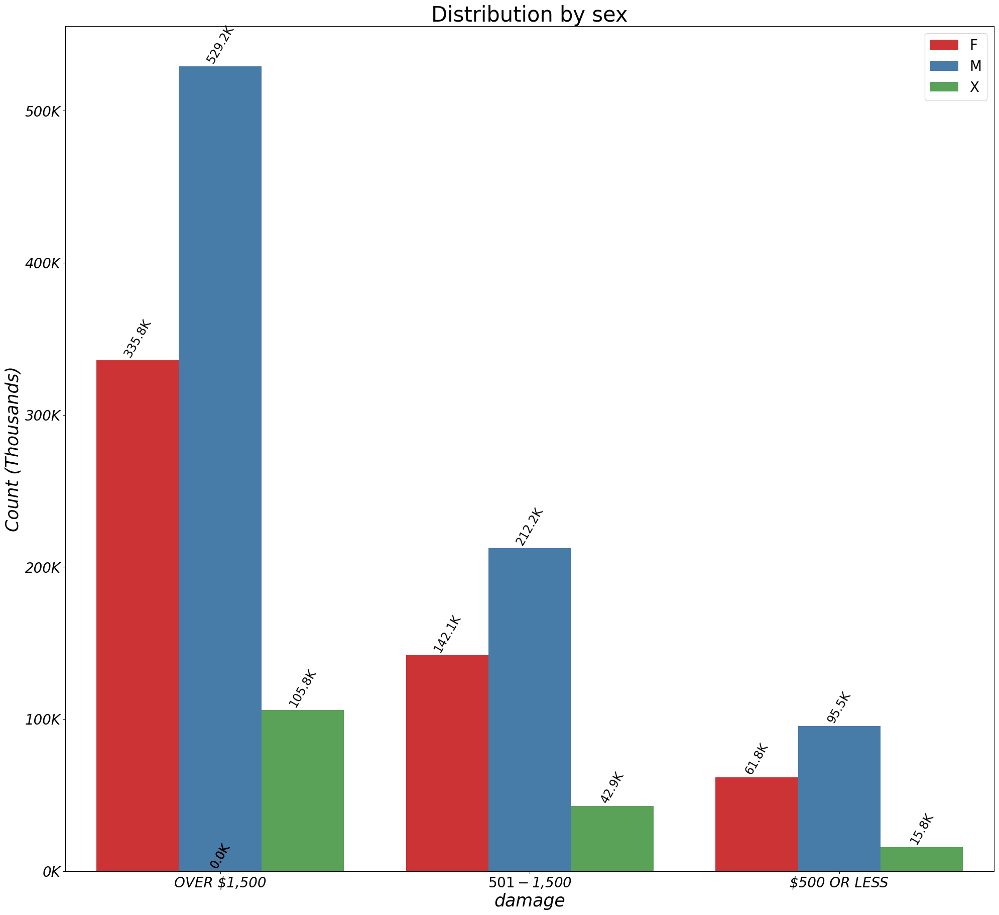

In [282]:
# count plot for 'reporting_delay_category' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'damage', 'sex', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

### Injuries by sex category.
Men have 2x more fatal injuries.

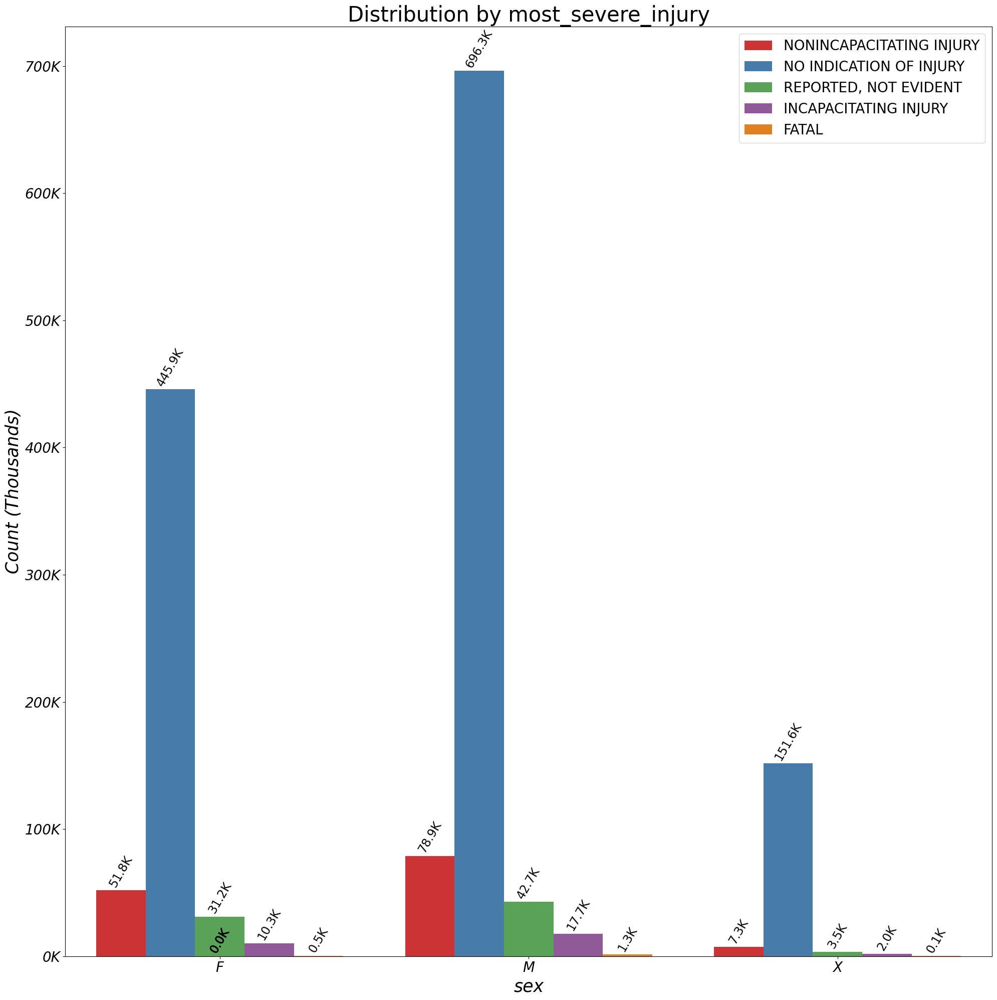

In [283]:
# count plot for 'most_severe_injury' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'sex', 'most_severe_injury', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# refresh the plot
plt.show()

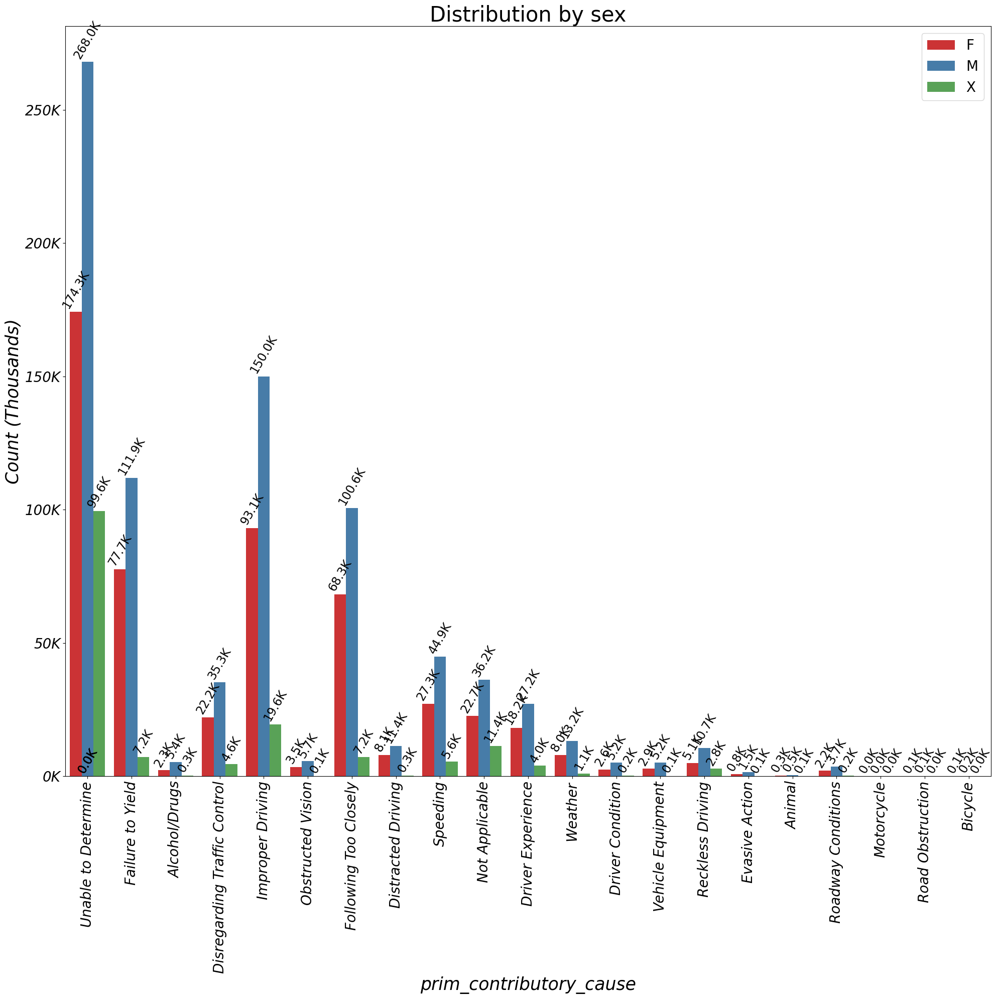

In [284]:
# count plot for 'most_severe_injury' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'prim_contributory_cause', 'sex', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Distribution of sex by age categories.

Notice how a small number of drivers is miscategorized as being younger than a tennager. We'll exclude these entries from the datset.
We can also see that the missing sex info is mostly coming from `Senior` category. That tells us that there's a default DOB that puts an unknown person at senior age.  

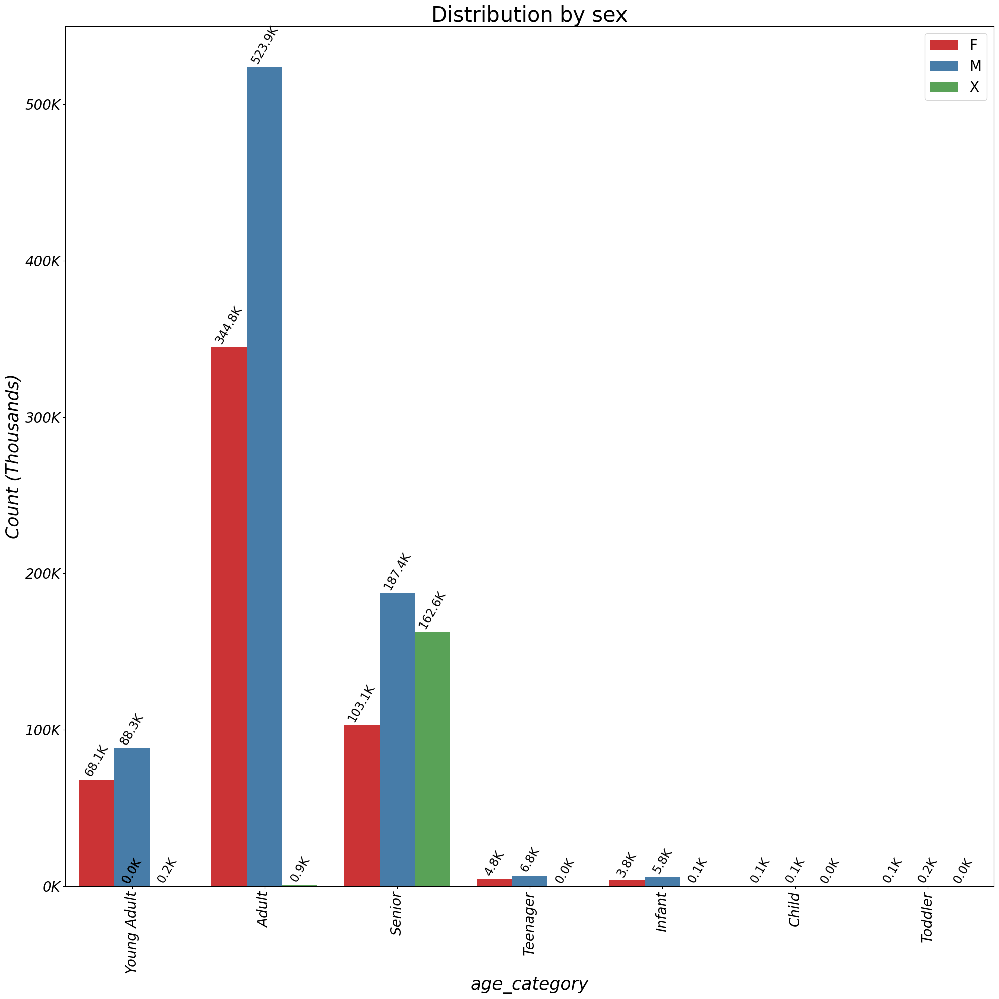

In [285]:
# count plot for 'most_severe_injury' with hue as 'CAUSE_GROUP'
drivers_df = df_crashes_analysis[df_crashes_analysis['person_type'] == 'Driver' ]
fig, ax = countplot_df_crashes(drivers_df, 'age_category', 'sex', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

In [286]:
# df entries where driver is categorized as Infant, Child, Or Toddler
age_categories_to_remove = ['Infant', 'Child', 'Toddler']

df_crashes_analysis = df_crashes_analysis[~((df_crashes_analysis['person_type'] == 'Driver') & 
                                                  (df_crashes_analysis['age_category'].isin(age_categories_to_remove)))]

### Distribution of time of day vs sex.

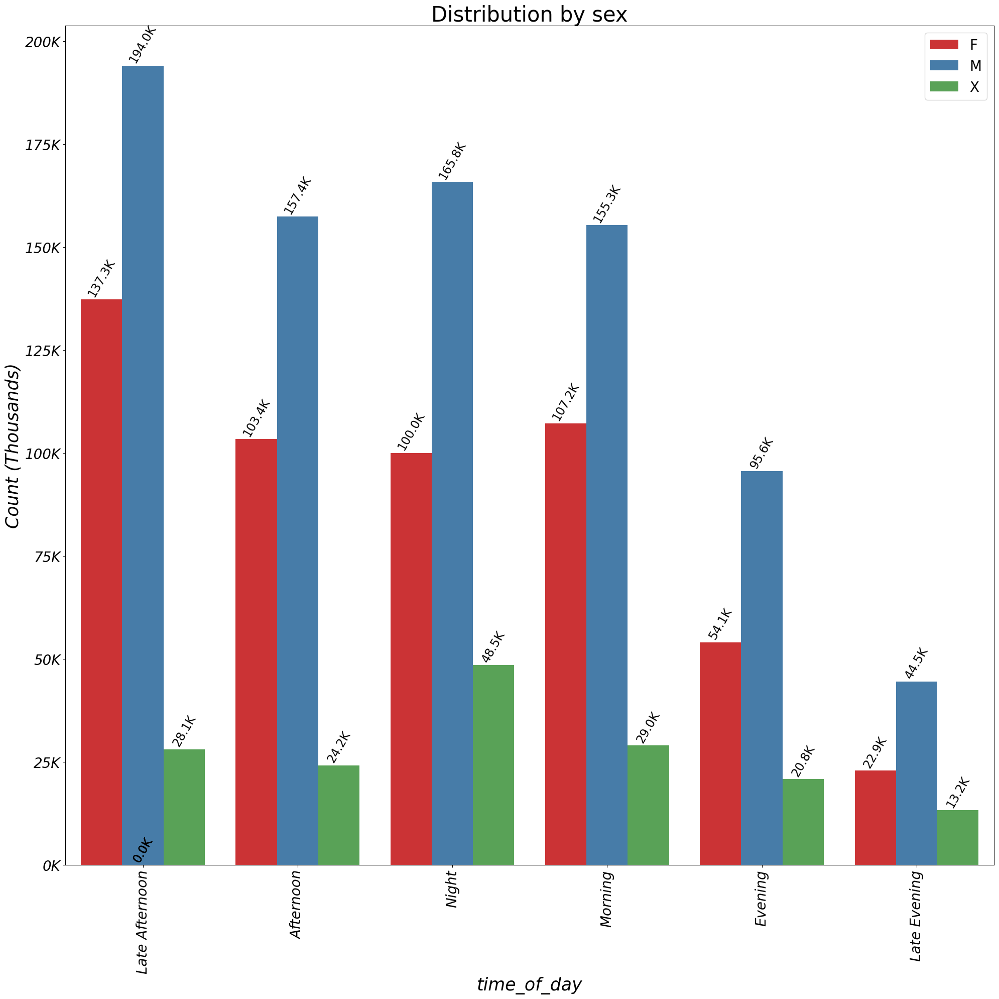

In [287]:
fig, ax = countplot_df_crashes(drivers_df, 'time_of_day', 'sex', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Distribution of primary contributory cause when driver is out of state. 

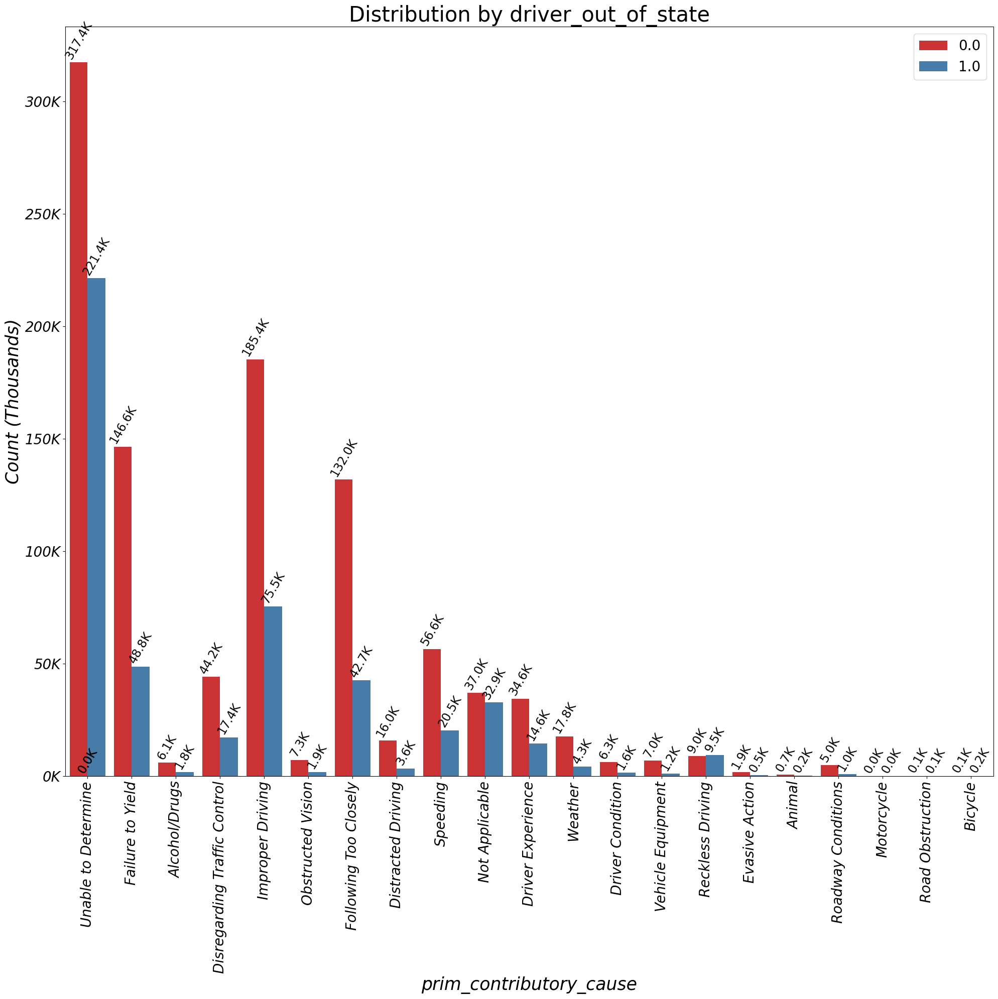

In [288]:
# count plot for 'reporting_delay_category' with hue as 'CAUSE_GROUP'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'prim_contributory_cause', 'driver_out_of_state', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Distribution of vehicle counts in a crash.

Almost a million of crashes (out of 1.5 million) is a two-vehicle crash, followed by a single-vehicle crash (under 250K). We also get a fair amount of crashes having 10+ cars, all the way up to 146(?).  

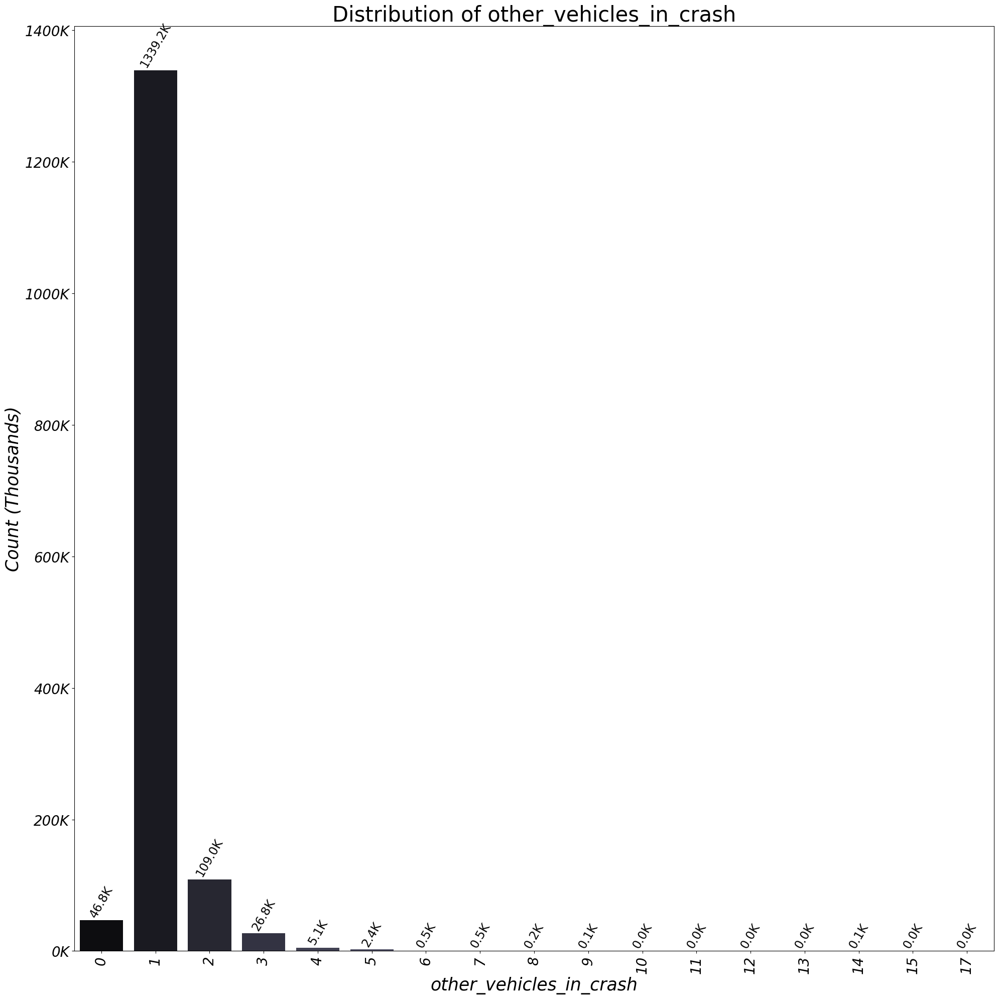

In [289]:
# count plot for 'other_vehicles_in_crash'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'other_vehicles_in_crash')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

#### Check `prim_contributory_cause` for multi-car crashes.

In [290]:
# filter for 'crash_record_id's that have more than 3 rows
valid_crash_ids = vehicle_counts_per_crash[vehicle_counts_per_crash > 4].index

# randomly select one 'crash_record_id' from the valid ones
random_crash_id = np.random.choice(valid_crash_ids)

# filter the df to get all rows with the randomly selected 'crash_record_id'
subset_df = df_crashes_analysis[df_crashes_analysis['crash_record_id'] == random_crash_id]

# Display the subset of data for the randomly selected 'crash_record_id'
subset_df[['crash_record_id', 'make', 'model', 'age_category', 'prim_contributory_cause']]

,crash_record_id,make,model,age_category,prim_contributory_cause
301131,3a5cb8b3e530ffc042ad74f00a45a79eeedb2aef67f040...,Jeep,Cherokee,Adult,Following Too Closely


#### We can see from almost all multi-vehicle crashes, there are duplicates.
In addition, having unknown make/model muddles the dataset, so filter out the Unknown car makes woud be beneficial.

In [291]:
# remove duplicates based on the specified columns: 'crash_record_id', 'make', 'model',''prim_contributory_cause''
subset_to_match=['crash_record_id', 'make', 'model',  \
                 'age_category', 'sex', 'prim_contributory_cause']
df_crashes_analysis = df_crashes_analysis.drop_duplicates(subset=subset_to_match)

In [292]:
df_crashes_analysis.shape

(1520007, 60)

#### Re-compute the number of other vehicles in the same crash.

In [293]:
# count the number of vehicles in each crash using crash_record_id
vehicle_counts_per_crash = df_crashes_analysis['crash_record_id'].value_counts()

# subtract 1 to exclude the current vehicle and count only the "other" vehicles
other_vehicles_in_crash = vehicle_counts_per_crash - 1

# map this count back to the original DataFrame using crash_record_id
df_crashes_analysis['other_vehicles_in_crash'] = \
df_crashes_analysis['crash_record_id'].map(other_vehicles_in_crash)

In [294]:
# filter for 'crash_record_id's that have more than 3 rows
valid_crash_ids = vehicle_counts_per_crash[vehicle_counts_per_crash > 3].index

# randomly select one 'crash_record_id' from the valid ones
random_crash_id = np.random.choice(valid_crash_ids)

# filter the df to get all rows with the randomly selected 'crash_record_id'
subset_df = df_crashes_analysis[df_crashes_analysis['crash_record_id'] == random_crash_id]

# Display the subset of data for the randomly selected 'crash_record_id'
subset_df[['crash_record_id', 'make', 'model', 'age_category', 'prim_contributory_cause']]

,crash_record_id,make,model,age_category,prim_contributory_cause
1433664,9edbce5c3ab5c68fa732d42caa28f262fbccb8cfddc27f...,Honda,Hr-V,Senior,Disregarding Traffic Control
1433665,9edbce5c3ab5c68fa732d42caa28f262fbccb8cfddc27f...,Jeep,Renegade,Young Adult,Disregarding Traffic Control
1433666,9edbce5c3ab5c68fa732d42caa28f262fbccb8cfddc27f...,Ford,Edge,Adult,Disregarding Traffic Control
1433667,9edbce5c3ab5c68fa732d42caa28f262fbccb8cfddc27f...,Mitsubishi,Unknown,Adult,Disregarding Traffic Control


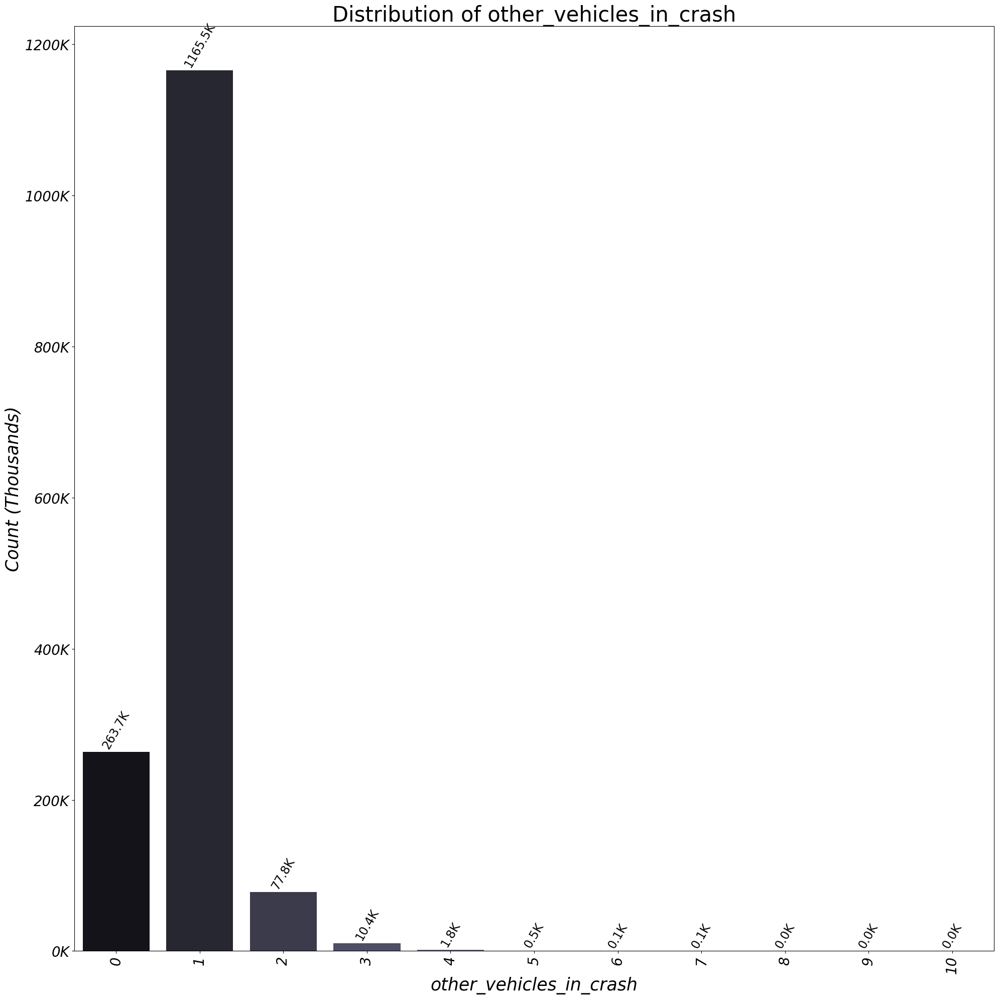

In [295]:
# count the number of vehicles in each crash using crash_record_id
vehicle_counts_per_crash = df_crashes_analysis['crash_record_id'].value_counts()

# subtract 1 to exclude the current vehicle and count only the "other" vehicles
other_vehicles_in_crash = vehicle_counts_per_crash - 1

# map this count back to the original DataFrame using crash_record_id
df_crashes_analysis['other_vehicles_in_crash'] = \
df_crashes_analysis['crash_record_id'].map(other_vehicles_in_crash)
# count plot for 'other_vehicles_in_crash'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'other_vehicles_in_crash')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Distribution of car makes (top 20).

It looks like the most `Unknown` vehicles come from a single-vehicle crash, so it would make sence to drop all rows where there are no other car in crash and the car make is `Unknown`.

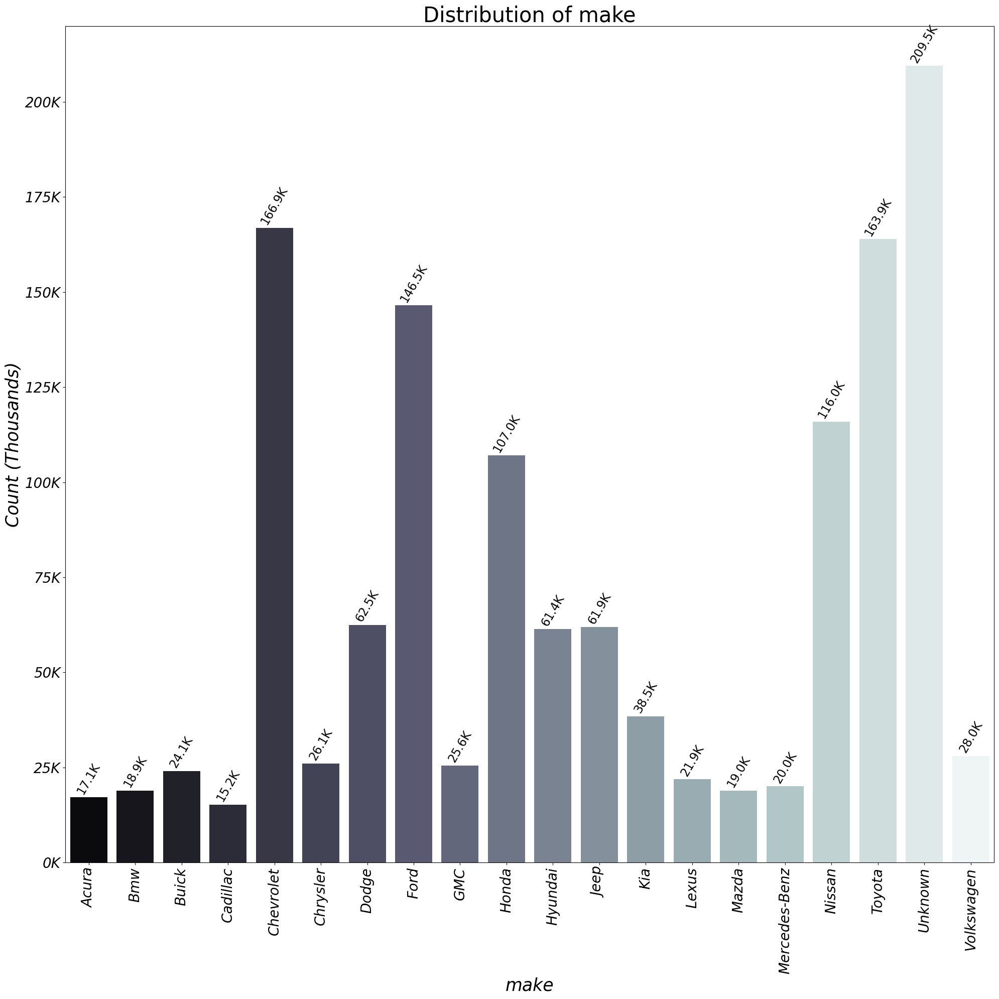

In [296]:
# count plot for car makes
top_20_car_makes = df_crashes_analysis['make'].value_counts().head(20)
df_top_makes = df_crashes_analysis[df_crashes_analysis['make'].isin(top_20_car_makes.index)].copy()
# sort by index
df_top_makes.loc[:, 'make'] = pd.Categorical(df_top_makes['make'], categories=top_20_car_makes.index, ordered=True)
df_top_makes_sorted = df_top_makes.sort_values(by='make')
# count plot for 'make'
fig, ax = countplot_df_crashes(df_top_makes.sort_values(by='make'), 'make')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

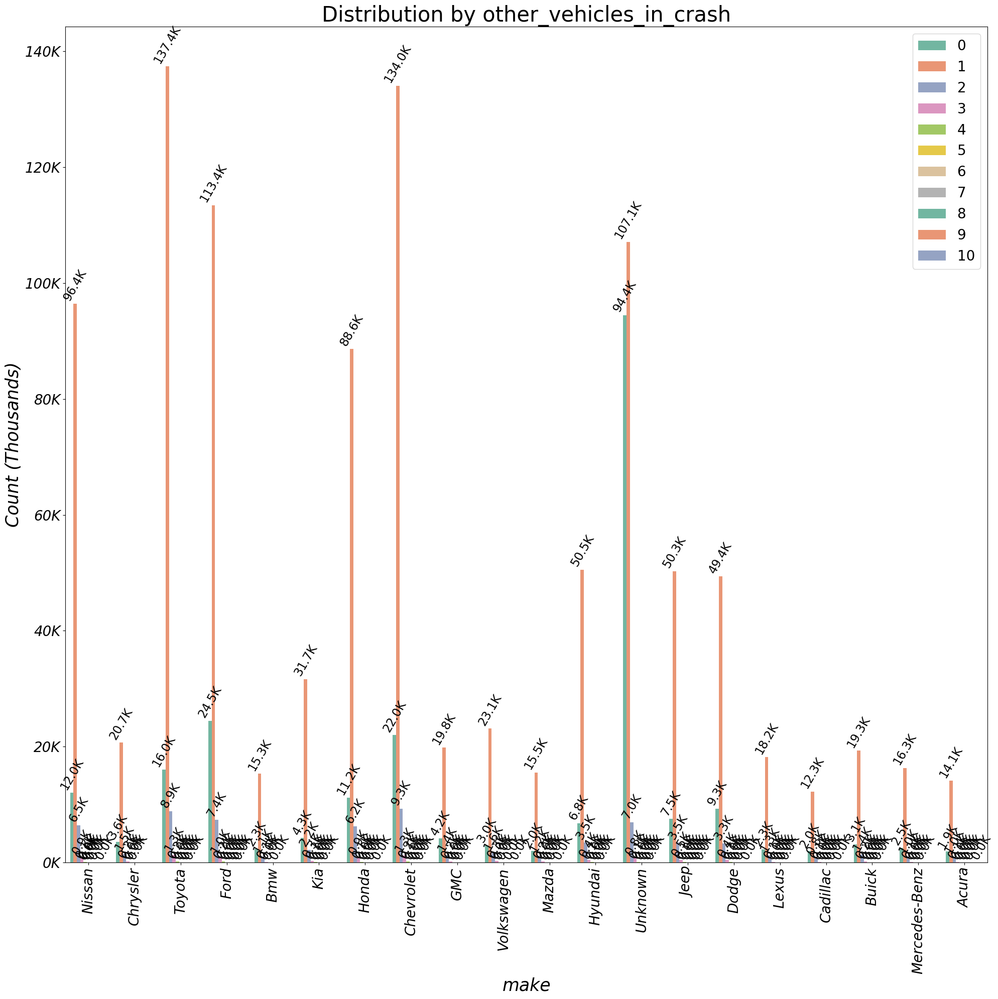

In [297]:
# count plot for 'make'
fig, ax = countplot_df_crashes(df_top_makes, 'make', 'other_vehicles_in_crash', 'Set2')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

In [298]:
df_crashes_analysis = df_crashes_analysis[~((df_crashes_analysis['make'] == 'Unknown') &
                                          (df_crashes_analysis['other_vehicles_in_crash'] == 0))]

#### Redo the histogram of makes plot.

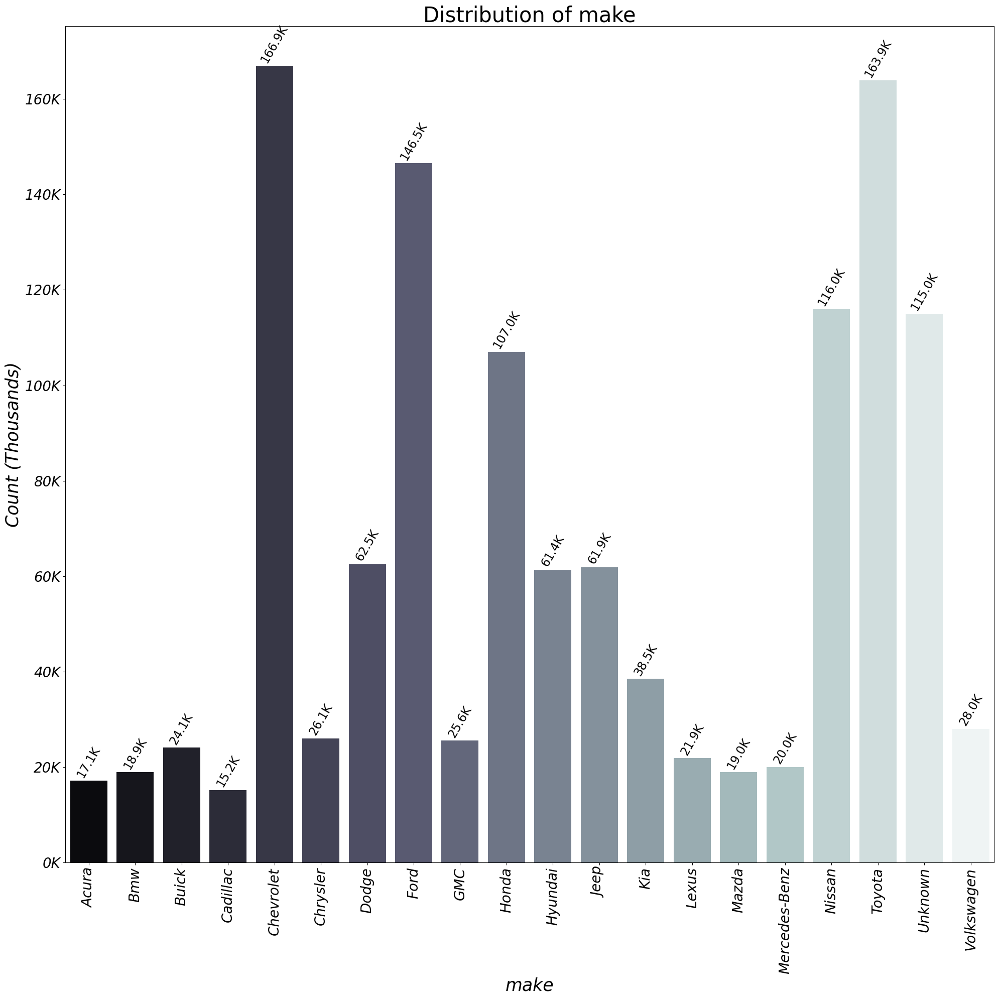

In [299]:
# count plot for car makes
top_20_car_makes = df_crashes_analysis['make'].value_counts().head(20)
df_top_makes = df_crashes_analysis[df_crashes_analysis['make'].isin(top_20_car_makes.index)].copy()
# sort by index
df_top_makes.loc[:, 'make'] = pd.Categorical(df_top_makes['make'], categories=top_20_car_makes.index, ordered=True)
df_top_makes_sorted = df_top_makes.sort_values(by='make')
# count plot for 'make'
fig, ax = countplot_df_crashes(df_top_makes.sort_values(by='make'), 'make')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Car defects by make (top 20).
Top 3 most popular defects among top 20 car makes are : brakes, steering, tires. 

In [300]:
#select a slice with top 20 car makes
df_top_makes = df_crashes_analysis[df_crashes_analysis['make'].isin(top_20_car_makes.index)]

# exclude rows where 'vehicle_defect' is 'None', 'Unknown', or 'Other'
df_top_makes_filtered = df_top_makes[~df_top_makes['vehicle_defect'].isin(['None', 'Unknown', 'Other'])]

# group by 'make' and 'vehicle_defect' and count occurrences
make_defect = df_top_makes_filtered.groupby(['make', 'vehicle_defect']).size().reset_index(name='count')

# sort the data by 'make' and 'count' in descending order
make_defect = make_defect.sort_values(by=['make', 'count'], ascending=[True, False])

# use groupby and head to pick the top 3 vehicle defects for each make
top_3 = make_defect.groupby('make').head(3)
top_3    

,make,vehicle_defect,count
0,Acura,Brakes,79
7,Acura,Steering,14
9,Acura,Tires,11
12,Bmw,Brakes,47
15,Bmw,Steering,8
17,Bmw,Tires,7
19,Buick,Brakes,133
26,Buick,Tires,23
24,Buick,Steering,19
29,Cadillac,Brakes,54


### Driver's condition by sex.
Men are 2.5x more often impaired than women, women are 1.5x times more often distressed.

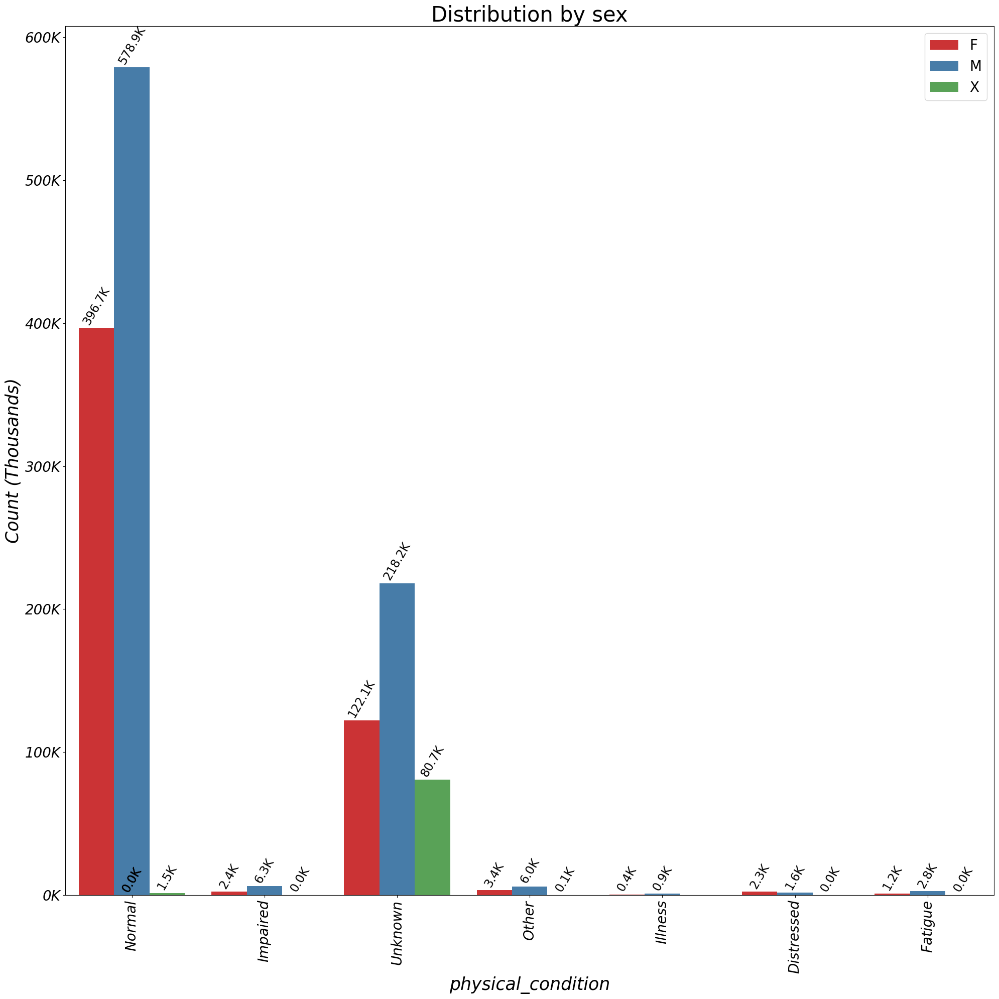

In [301]:
# count plot for 'physical_condition' with hue as 'sex'
fig, ax = countplot_df_crashes(df_crashes_analysis, 'physical_condition', 'sex', 'Set1')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Driver's action and primary contributory cause.

* Driver's actions mostly Unknown for each cause.
* When primary cause is unable to determine, the driver's actions are None or Unknown.
* In some cases, driver's actions correlate strongly with teh crash cause: Disregarding Signs in Failure to Yield, Improper Manouver in Impreoper Driving, etc..  

In [302]:
causes = df_crashes_analysis['prim_contributory_cause'].value_counts()
# shuffle and select random half of the values
random_half_causes = causes.sample(frac=0.5, random_state=42)
random_half_causes_values = random_half_causes.index
idx_primary_cause = df_crashes_analysis['prim_contributory_cause'].isin(random_half_causes_values)
df_crashes_analysis_1 = df_crashes_analysis[idx_primary_cause]
df_crashes_analysis_2 = df_crashes_analysis[~idx_primary_cause]

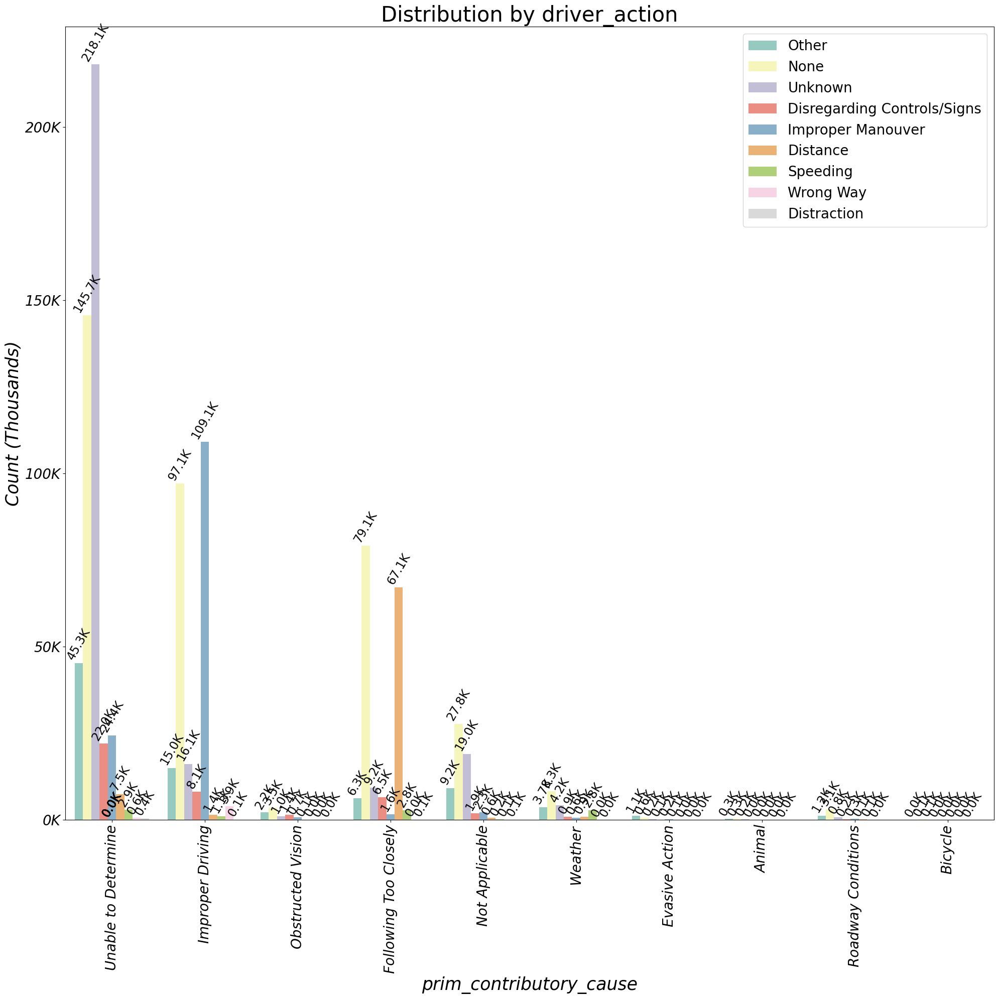

In [303]:
# count plot for 'prim_contributory_cause' with hue as 'driver_action'
fig, ax = countplot_df_crashes(df_crashes_analysis_1, 'prim_contributory_cause', 'driver_action', 'Set3')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

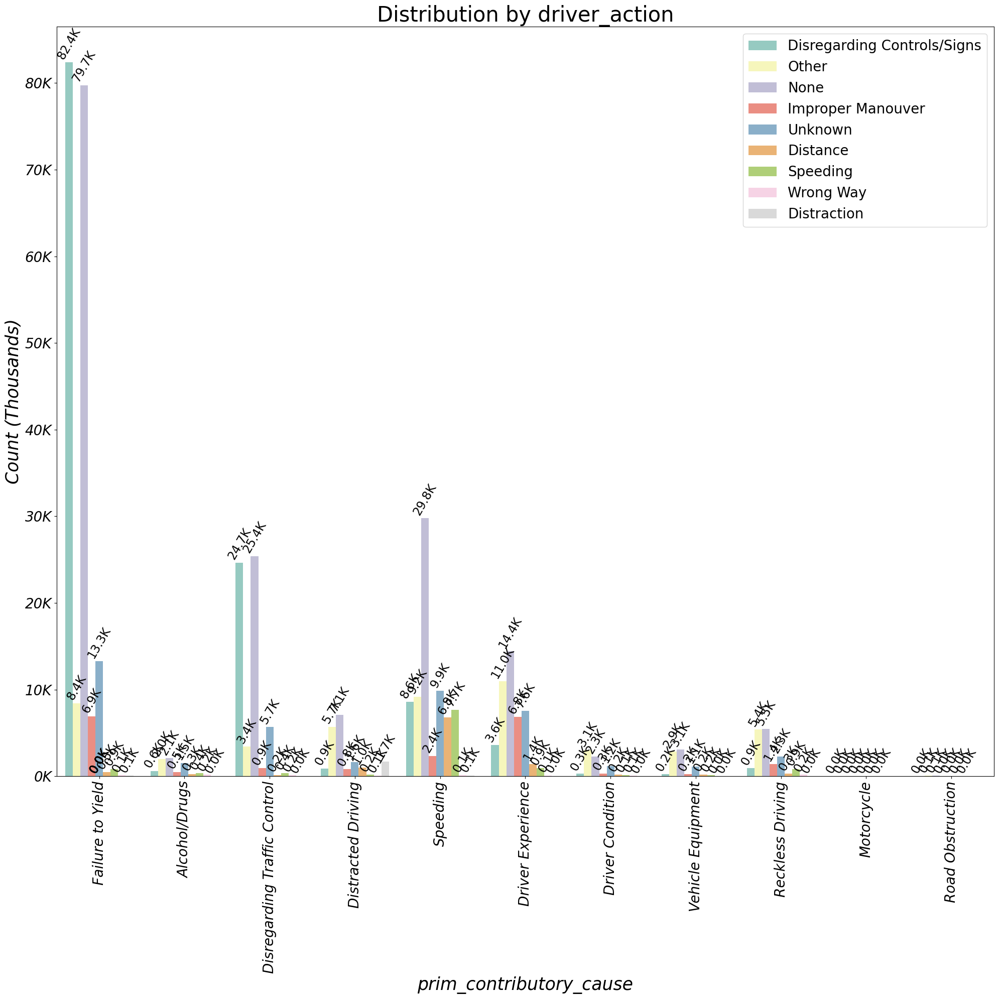

In [304]:
# count plot for 'prim_contributory_cause' with hue as 'driver_action'
fig, ax = countplot_df_crashes(df_crashes_analysis_2, 'prim_contributory_cause', 'driver_action', 'Set3')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

### Most popular car by age and sex.

The most popular car make among all age categories is Chevrolet (except for Male Adults, Toyota takes the win).
Toyota is mostly 2nd most popular make, third is Nissan/Ford. Honda makes an appearance as a popular Teenage car (partent's car)?

In [305]:
#group by 'age_category', 'sex', and 'make' and count occurrences
car_by_age_sex = df_crashes_analysis.groupby(['age_category', 'sex', 'make']).size().reset_index(name='count')
# sort the grouped data to get the most popular car for each gender and age category
car_by_age_sex = car_by_age_sex.sort_values(by=['age_category', 'sex', 'count'], ascending=[True, True, False])
# use groupby and head to pick top 3 for each 'age_category' and 'sex'
top_3_cars_by_age_sex = car_by_age_sex.groupby(['age_category', 'sex']).head(3)
top_3_cars_by_age_sex

,age_category,sex,make,count
18,Adult,F,Chevrolet,41257
101,Adult,F,Toyota,40684
74,Adult,F,Nissan,36292
214,Adult,M,Toyota,71441
148,Adult,M,Ford,66369
129,Adult,M,Chevrolet,61639
268,Adult,X,Unknown,160
266,Adult,X,Toyota,108
231,Adult,X,Chevrolet,97
271,Child,F,Unknown,211


### Recap of Data EDA.

* Men are 2.5x more often impaired than women, and women are 1.5x times more often distressed.
* Men have 2x more fatal injuries.
* Almost a million of crashes (out of 1.5 million) is a two-vehicle crash, followed by a single-vehicle crash (under 250K). We also get a fair amount of crashes having 10+ cars, all the way up to 146(?).
* The most  `Unknown`  vehicles come from a single-vehicle crash,
* Top 3 most popular defects among top 20 car makes are : brakes, steering, tires. 
* Driver's actions mostly Unknown for each primary contributory cause.
* When primary cause is unable to determine, the driver's actions are None or Unknown.
* In some cases, driver's actions correlate strongly with teh crash cause: Disregarding Signs in Failure to Yield, Improper Manouver in Impreoper Driving, etc..
* The most popular car make among all age categories is Chevrolet (except for Male Adults, Toyota takes the win). Toyota is mostly 2nd most popular make, third is Nissan/Ford. Honda makes an appearance as a popular teenage car.

#### Data transformation:
We dropped all rows with where the crash was a single car and the car make is  `Unknown`.
We dropped miscategorized driver age categories, like infant, toddler, etc.. 

## 6. Data Transformation.
In this section we'll prepare the dataset for ML. 

We'll list columns and select a subset suitable for the task (detecting primary contributory cause).
Then, we'll remove all misclassified drivers and all non-drivers.
We'll limit the dataset to top 20 makes and top 3 models for each make.

In [306]:
df_crashes_analysis.columns

Index(['crash_record_id', 'unit_type', 'make', 'model', 'vehicle_defect',
       'vehicle_type', 'vehicle_use', 'travel_direction', 'maneuver',
       'first_contact_point', 'other_vehicles_in_crash', 'person_type', 'sex',
       'age_category', 'safety_equipment', 'airbag_deployed', 'hospital',
       'driver_action', 'driver_vision', 'physical_condition',
       'pedpedal_action', 'pedpedal_visibility', 'pedpedal_location',
       'bac_result', 'driver_out_of_state', 'passenger_adult',
       'passenger_child', 'passenger_infant', 'passenger_senior',
       'passenger_teenager', 'passenger_toddler', 'passenger_young_adult',
       'reporting_delay_category', 'traffic_control_device',
       'device_condition', 'weather_condition', 'lighting_condition',
       'first_crash_type', 'trafficway_type', 'road_defect', 'damage',
       'prim_contributory_cause', 'work_zone', 'hit_and_run',
       'not_right_of_way', 'most_severe_injury', 'injuries_total',
       'injuries_fatal', 'injuries_

In [307]:
# columns for ML
cols_for_ml = ['prim_contributory_cause', 'unit_type', 'make', 'model',
       'vehicle_defect', 'vehicle_type', 'vehicle_use', 'travel_direction',
       'maneuver', 'first_contact_point', 'sex', 'age_category','driver_action',
       'driver_vision', 'physical_condition', 'bac_result',
       'driver_out_of_state','passenger_adult', 'passenger_child',
       'passenger_infant', 'passenger_senior', 'passenger_teenager',
       'passenger_toddler', 'passenger_young_adult','reporting_delay_category', 'traffic_control_device',
       'device_condition', 'weather_condition', 'lighting_condition',
       'first_crash_type', 'trafficway_type', 'road_defect', 'work_zone',
       'not_right_of_way', 'time_of_day', 'day', 'season', 'year',
       'speed_limit']
df_crashes_ml = df_crashes_analysis[cols_for_ml].copy()

#### Remove all non-drivers and limit all makes to top 20.

In [308]:
# remove all non-drivers
df_crashes_ml = df_crashes_ml[(df_crashes_ml['unit_type'] == 'Driver')]
# remove unit type and person type column
df_crashes_ml.drop(columns='unit_type', inplace=True)
df_crashes_ml_top_20 = df_crashes_ml[df_crashes_ml['make'].isin(top_20_car_makes.index)].copy()

In [309]:
df_crashes_ml_top_20.head()

,prim_contributory_cause,make,model,vehicle_defect,vehicle_type,vehicle_use,travel_direction,maneuver,first_contact_point,sex,...,first_crash_type,trafficway_type,road_defect,work_zone,not_right_of_way,time_of_day,day,season,year,speed_limit
0,Unable to Determine,Nissan,Sentra,Unknown,Unknown,Unknown,S,Stopping/Slowing,Front,F,...,Pedestrian,Not Divided,No Defects,0.0,0.0,Late Afternoon,Wednesday,Winter,2023.0,30-35 mph
1,Unable to Determine,Chrysler,Sebring,None,Passenger,Personal,S,Lane Change/Overtaking,Rear-Right,F,...,Rear to Side,Parking Lot,Unknown,0.0,0.0,Late Afternoon,Wednesday,Winter,2023.0,50+ mph
3,Alcohol/Drugs,Toyota,Rav4,Unknown,Passenger,Personal,E,Driving Forward,Side-Left,F,...,Sideswipe Opposite,Not Divided,No Defects,0.0,0.0,Afternoon,Sunday,Winter,2023.0,20-25 mph
5,Unable to Determine,Nissan,Rogue,None,Passenger,Personal,E,Driving Forward,Front-Right,F,...,Rear End,Not Divided,No Defects,0.0,0.0,Afternoon,Sunday,Winter,2023.0,20-25 mph
6,Unable to Determine,Nissan,Murano,Unknown,SUV,Personal,N,Driving Forward,Side-Right,F,...,Parked,Not Divided,No Defects,0.0,0.0,Late Afternoon,Sunday,Winter,2023.0,30-35 mph


In [310]:
df_crashes_ml_top_20.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1220642 entries, 0 to 1501663
Data columns (total 38 columns):
 #   Column                    Non-Null Count    Dtype   
---  ------                    --------------    -----   
 0   prim_contributory_cause   1220642 non-null  object  
 1   make                      1220642 non-null  object  
 2   model                     1220642 non-null  object  
 3   vehicle_defect            1220642 non-null  object  
 4   vehicle_type              1220642 non-null  object  
 5   vehicle_use               1220642 non-null  object  
 6   travel_direction          1220642 non-null  object  
 7   maneuver                  1220642 non-null  object  
 8   first_contact_point       1220642 non-null  object  
 9   sex                       1220642 non-null  object  
 10  age_category              1220642 non-null  object  
 11  driver_action             1220642 non-null  object  
 12  driver_vision             1220642 non-null  object  
 13  physical_conditio

### Save `df_crashes_analysis`  and clear up the memory.

In [311]:
# save the DataFrame to a CSV file in the local folder
data_crashes_clean = 'df_crashes_analysis.csv'
path_crashes = os.path.join(dir_data, data_crashes_clean)
df_crashes_analysis.to_csv(path_crashes, index=False)

In [312]:
# load the dataframe if needed
df_crashes_analysis = pd.read_csv(path_crashes)

### Import `sys` library and list all variables in memory.

We'll list all loaded variables and the memory they occupy. 

In [313]:
import sys

# get the list of all variable names using %who_ls magic command
var_list = %who_ls

# loop over these variable names to get their sizes
variables = [(name, sys.getsizeof(eval(name)) / (1024 ** 2)) for name in var_list]

variables_sorted = sorted(variables, key=lambda x: x[1], reverse=True)
for var_name, size in variables_sorted:
    if size > 100:  # Only display variables larger than 1 MB
        print(f"{var_name}: {size:.2f} MB")

drivers_df: 4092.21 MB
df_crashes_analysis: 3575.63 MB
df_top_makes: 3422.03 MB
df_top_makes_sorted: 3422.03 MB
merged_df_filtered: 2776.18 MB
df_crashes_analysis_1: 2706.66 MB
df_crashes_ml: 2706.11 MB
df_crashes_ml_top_20: 2374.87 MB
df_to_keep_vehicles: 1328.06 MB
df_crashes_analysis_2: 1179.03 MB
df_crashes_undetermined: 787.69 MB
df_people_slice_non_drivers: 395.41 MB
filtered_df: 234.66 MB
other_vehicles_in_crash: 193.39 MB
vehicle_counts_per_crash: 193.39 MB
df_filtered: 178.37 MB
binary_df: 164.00 MB
df_crashes_small: 109.98 MB


### Remove all vars except the two dataframes `df_crashes_ml`, `df_crashes_ml_top_20`.

In [314]:
# define the variables to exclude from deletion
exclude_vars = ['pd', 'sys', 'np', 'os', 'df_crashes_ml', 'df_crashes_ml_top_20']

# gather all variables with their sizes
variables_sorted = [(name, sys.getsizeof(eval(name)) / (1024 ** 2)) \
                    for name in globals() if name not in exclude_vars and not name.startswith('_')]

# loop through the variable names in variables_sorted and delete those not in exclude_vars
for var_name, size in variables_sorted:
    if var_name not in exclude_vars and size > 100:
        del globals()[var_name]

In [315]:
# define the variables to exclude from deletion
exclude_vars = ['pd', 'sys', 'np', 'os', 'df_crashes_ml', 'df_crashes_ml_top_20']

# confirm deletion by listing remaining variables
print("Remaining variables:", [var for var in globals() if var in exclude_vars])

Remaining variables: ['pd', 'np', 'os', 'df_crashes_ml', 'df_crashes_ml_top_20', 'sys']


### Reducing the data dimentionality and limiting the features.
We need to be able to run multiple ML models in reasonable time and this dataset contains a number of categorical features that would exponentially increase the number of columns after we encode them:

In [316]:
# select all categorical columns
categorical_columns = df_crashes_ml_top_20.select_dtypes(include=['object', 'category']).columns

# create a DataFrame with column names and the number of unique values
unique_counts = pd.DataFrame({
    'column_name': categorical_columns,
    'unique_values': [df_crashes_ml_top_20[col].nunique() for col in categorical_columns]
})
# print unique counts
unique_counts

,column_name,unique_values
0,prim_contributory_cause,21
1,make,20
2,model,549
3,vehicle_defect,17
4,vehicle_type,9
5,vehicle_use,13
6,travel_direction,9
7,maneuver,9
8,first_contact_point,11
9,sex,3


In [317]:
causes_to_use = ['Unable to Determine', 'Improper Driving', 'Failure to Yield',\
                 'Following Too Closely', 'Speeding', 'Disregarding Traffic Control',\
                 'Not Applicable', 'Driver Experience', 'Weather', 'Distracted Driving', \
                 'Reckless Driving', 'Vehicle Equipment',\
                 'Obstructed Vision', 'Alcohol/Drugs', 'Driver Condition', 'Roadway Conditions']
df_crashes_ml_top_20 = df_crashes_ml_top_20[df_crashes_ml_top_20['prim_contributory_cause'].isin(causes_to_use)]

In [318]:
df_crashes_ml_top_20.shape

(1217574, 38)

In [319]:
# iterate over each categorical column and display its value counts
for col in categorical_columns:
    print(f"\nValue counts for '{col}':\n")
    print(df_crashes_ml_top_20[col].value_counts())
    print('-' * 40)  # separator for readability between columns


Value counts for 'prim_contributory_cause':

prim_contributory_cause
Unable to Determine             398885
Improper Driving                215451
Failure to Yield                162575
Following Too Closely           153542
Speeding                         64901
Disregarding Traffic Control     52372
Not Applicable                   51543
Driver Experience                38117
Weather                          18266
Distracted Driving               16560
Reckless Driving                 14247
Obstructed Vision                 6733
Vehicle Equipment                 6732
Driver Condition                  6669
Alcohol/Drugs                     6657
Roadway Conditions                4324
Name: count, dtype: int64
----------------------------------------

Value counts for 'make':

make
Chevrolet        166450
Toyota           163541
Ford             146102
Nissan           115686
Honda            106789
Unknown           79996
Dodge             62318
Jeep              61736
Hyundai        

In [320]:
# vehicle_defect

# list of valid vehicle_defect values
vehicle_defect_vals = ['None', 'Unknown', 'Other']

# replace values not in vehicle_defect with 'Other'
df_crashes_ml_top_20['vehicle_defect'] = df_crashes_ml_top_20['vehicle_defect'].apply(
    lambda x: x if x in vehicle_defect_vals else 'Other'
)

In [321]:
# traffic control vals
traffic_control_vals = ['No Controls', 'Traffic Signal', 'Stop Sign', 'Unknown', 'Other', 'Yield Sign']

# replace values not in traffic_control_vals with 'Other'
df_crashes_ml_top_20['traffic_control_device'] = df_crashes_ml_top_20['traffic_control_device'].apply(
    lambda x: x if x in traffic_control_vals else 'Other'
)

In [322]:
# merge 5-15 speed limit with 'slow'
df_crashes_ml_top_20['speed_limit'] = df_crashes_ml_top_20['speed_limit'].replace('5-15 mph', 'slow (<5 mph)')

In [323]:
# merge roundabout into 'Other'
df_crashes_ml_top_20['trafficway_type'] = df_crashes_ml_top_20['trafficway_type'].replace('Roundabout',\
                                                                                          'Other')

In [324]:
df_crashes_ml_top_20['first_crash_type'] = df_crashes_ml_top_20['first_crash_type'].replace(\
                                                                                            ['Overturned',\
                                                                                            'Animal',\
                                                                                            'Train'], 'Other')

In [325]:
#columns to drop
cols_to_drop_big_set = ['model',  'vehicle_use']

### Selecting two subsets.
* We'll create two subsets: one full-size `df_crashes_ml_top_20` and one reduced size `df_crashes_ml_small` with less columns and reduced size `prim_contributory_cause`. 

In [326]:
#reduce size
df_crashes_ml_top_20.drop(columns=cols_to_drop_big_set, inplace=True)

### Checking column types.
Identify columns with mixed type and apply type correction before the Encoder. 

In [327]:
# identify columns with mixed types
mixed_type_columns = []

# loop through each column and check if it contains both 'str' and 'float' types
for col in df_crashes_ml_top_20.columns:
    unique_types = df_crashes_ml_top_20[col].apply(type).nunique()
    if unique_types > 1:
        mixed_type_columns.append(col)

# print columns with mixed types
print("Columns with mixed types: ", mixed_type_columns)

Columns with mixed types:  ['passenger_adult', 'passenger_child', 'passenger_infant', 'passenger_senior', 'passenger_teenager', 'passenger_toddler', 'passenger_young_adult']


In [328]:
# convert all to numeric
for col in mixed_type_columns:
    df_crashes_ml_top_20[col] = pd.to_numeric(df_crashes_ml_top_20[col], errors='coerce')

In [329]:
# drop NaNs after coercing
df_crashes_ml_top_20.dropna(inplace=True)

In [330]:
df_crashes_ml_top_20.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1217574 entries, 0 to 1501663
Data columns (total 36 columns):
 #   Column                    Non-Null Count    Dtype   
---  ------                    --------------    -----   
 0   prim_contributory_cause   1217574 non-null  object  
 1   make                      1217574 non-null  object  
 2   vehicle_defect            1217574 non-null  object  
 3   vehicle_type              1217574 non-null  object  
 4   travel_direction          1217574 non-null  object  
 5   maneuver                  1217574 non-null  object  
 6   first_contact_point       1217574 non-null  object  
 7   sex                       1217574 non-null  object  
 8   age_category              1217574 non-null  object  
 9   driver_action             1217574 non-null  object  
 10  driver_vision             1217574 non-null  object  
 11  physical_condition        1217574 non-null  object  
 12  bac_result                1217574 non-null  object  
 13  driver_out_of_sta

In [331]:
# smaller subset
#cols_to_drop_smaller_subset = ['reporting_delay_category', 'first_crash_type', \
#                               'travel_direction', 'driver_action', 'trafficway_type', 'make', \
#                               'work_zone', 'not_right_of_way', 'speed_limit', \
#                              'driver_vision', 'physical_condition', 'bac_result', \
#                               'road_defect', 'vehicle_defect', 'vehicle_type',
#                              'weather_condition', 'driver_out_of_state']
#df_crashes_ml_small = df_crashes_ml_top_20.drop(columns=cols_to_drop_smaller_subset).copy()

In [332]:
# reduce dimentionality of `prim_contributory_cause`
#drop_causes = ['Unable to Determine', 'Not Applicable', \
#               'Obstructed Vision', 'Alcohol/Drugs', \
#               'Driver Condition', 'Roadway Conditions',\
#              'Vehicle Equipment', 'Reckless Driving', \
#              'Speeding', 'Weather']
#unknown_causes_idx = (df_crashes_ml_small['prim_contributory_cause'].isin(drop_causes))
#df_crashes_ml_small['prim_contributory_cause'] = df_crashes_ml_small[~unknown_causes_idx]
#df_crashes_ml_small.dropna(inplace=True)
#df_crashes_ml_small = df_crashes_ml_small[df_crashes_ml_small['sex'].isin(['M', 'F'])]

In [333]:
 # reduce the dimensionality of `prim_contributory_cause`
drop_causes = ['Unable to Determine', 'Not Applicable', 'Driver Condition', 'Alcohol/Drugs',\
              'Vehicle Equipment', 'Speeding', 'Weather', 'Obstructed Vision', 'Roadway Conditions']
cols_to_drop_smaller_subset = ['reporting_delay_category',\
                               'travel_direction', \
                               'work_zone', 'not_right_of_way', 'driver_out_of_state', 'make', 'bac_result', \
                              'physical_condition', 'speed_limit', 'vehicle_defect','driver_vision', 'weather_condition',\
                              'road_defect', 'device_condition']

In [334]:
unknown_causes_idx = df_crashes_ml_top_20['prim_contributory_cause'].isin(drop_causes)
df_crashes_ml_small = df_crashes_ml_top_20[~unknown_causes_idx].copy()
df_crashes_ml_small.dropna(inplace=True)
df_crashes_ml_small = df_crashes_ml_small[df_crashes_ml_small['sex'].isin(['M', 'F'])]
df_crashes_ml_small = df_crashes_ml_small.drop(columns=cols_to_drop_smaller_subset)

In [335]:
# iterate over each categorical column and display its value counts
categorical_columns = df_crashes_ml_small.select_dtypes(include=['object', 'category']).columns
for col in categorical_columns:
    print(f"\nValue counts for '{col}':\n")
    print(df_crashes_ml_small[col].value_counts())
    print('-' * 40)  # separator for readability between columns


Value counts for 'prim_contributory_cause':

prim_contributory_cause
Improper Driving                202198
Failure to Yield                156436
Following Too Closely           147592
Disregarding Traffic Control     48241
Driver Experience                36304
Distracted Driving               16338
Reckless Driving                 12550
Name: count, dtype: int64
----------------------------------------

Value counts for 'vehicle_type':

vehicle_type
Passenger               427112
SUV                      95523
Van                      34383
Truck                    30538
Unknown                  19127
Other                     5548
Bus                       3997
Vehicle with Trailer      2139
Motorcycle                1292
Name: count, dtype: int64
----------------------------------------

Value counts for 'maneuver':

maneuver
Driving Forward           359030
Turning                    86263
Stopping/Slowing           60179
Lane Change/Overtaking     41533
Backing                 

In [336]:
df_crashes_ml_small.head()

,prim_contributory_cause,vehicle_type,maneuver,first_contact_point,sex,age_category,driver_action,passenger_adult,passenger_child,passenger_infant,...,passenger_toddler,passenger_young_adult,traffic_control_device,lighting_condition,first_crash_type,trafficway_type,time_of_day,day,season,year
13,Failure to Yield,Passenger,Driving Forward,Front-Left,F,Adult,None,0.0,0.0,0.0,...,0.0,0.0,Stop Sign,Daylight,Angle,Not Divided,Morning,Monday,Winter,2023.0
14,Disregarding Traffic Control,SUV,Driving Forward,Unknown,F,Adult,None,0.0,0.0,0.0,...,0.0,0.0,Traffic Signal,Daylight,Angle,Intersection,Morning,Monday,Winter,2023.0
15,Improper Driving,Passenger,Turning,Rear,F,Adult,Improper Manouver,0.0,0.0,0.0,...,0.0,0.0,Traffic Signal,Unknown,Turning,Intersection,Late Afternoon,Friday,Winter,2023.0
16,Improper Driving,Van,Lane Change/Overtaking,Front-Right,F,Senior,Improper Manouver,0.0,0.0,0.0,...,0.0,0.0,Traffic Signal,Daylight,Rear End,Intersection,Morning,Monday,Winter,2023.0
17,Improper Driving,Passenger,Driving Forward,Side-Left,F,Adult,None,0.0,0.0,0.0,...,0.0,0.0,Traffic Signal,Daylight,Rear End,Intersection,Morning,Monday,Winter,2023.0


In [337]:
df_crashes_ml_small.shape

(619659, 22)

In [338]:
df_crashes_ml_small.columns

Index(['prim_contributory_cause', 'vehicle_type', 'maneuver',
       'first_contact_point', 'sex', 'age_category', 'driver_action',
       'passenger_adult', 'passenger_child', 'passenger_infant',
       'passenger_senior', 'passenger_teenager', 'passenger_toddler',
       'passenger_young_adult', 'traffic_control_device', 'lighting_condition',
       'first_crash_type', 'trafficway_type', 'time_of_day', 'day', 'season',
       'year'],
      dtype='object')

### Recap of Data Transformation.

* We saved the `df_crashes_analysis` to the local data folder (~1500000 rows, 38 columns).
* We limited the number of makes to the top 20 (`df_crashes_ml_top_20`) and saved it as a smaller (~1200000 rows x 36 columns) subset.
* We removed all large datasets from the memory, leaving the `df_crashes_ml_top_20`.
* We further reduced the number of columns and filtered out additional crash causes, saving it as `df_crashes_ml_small` (619654 rows, 22 columns).

The rationale behind these changes: computational demands won't allow us to use all features and all samples.
We downsampled by filtering out of the `prim_contributory_cause` unknown and not applicable causes, weather-related, vehicle condition-related, driver condition-related, and road condition-related causes. From earlier EDA, for the most of the crashes, the majority of these features are either unknown or have no effect, i.e. driver's health condition is ok, weather is clear, road has no defects, vehicle is functioning. We then removed the columns containing information about these causes. 

## 7. Modelling.
We'll start with importing all ML libraries.

In [426]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.models import Model
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, make_scorer, f1_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

### Selecting features, target variables.

In [579]:
X = df_crashes_ml_small.drop('prim_contributory_cause', axis=1)  
y = df_crashes_ml_small['prim_contributory_cause']

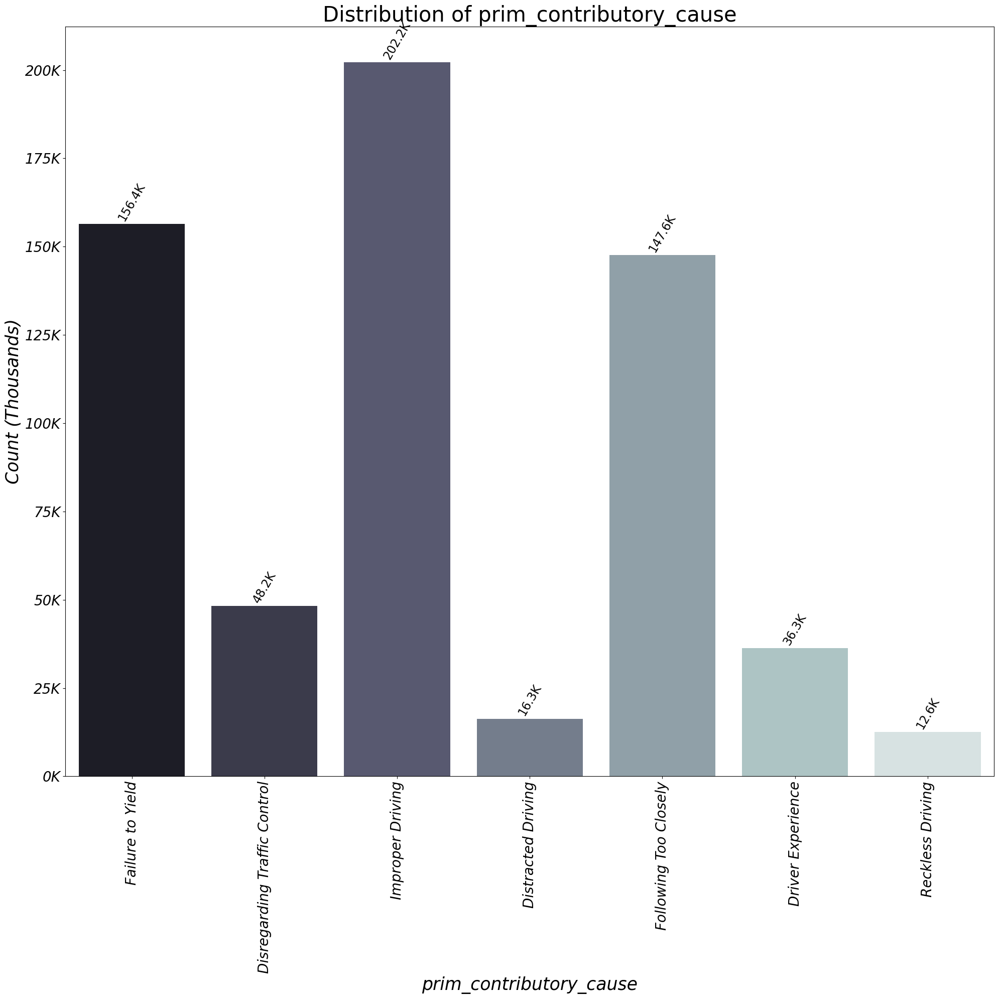

In [581]:
# count plot for 'prim_contributory_cause' for the presentation
fig, ax = countplot_df_crashes(df_crashes_ml_small, 'prim_contributory_cause')

# adjust the x-tick rotation to 90 deg (better vis)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# refresh the plot
plt.show()

In [552]:
display_categorical_vals(X)

Column 'vehicle_type' has unique values: ['Passenger' 'SUV' 'Van' 'Unknown' 'Truck' 'Other' 'Vehicle with Trailer'
 'Bus' 'Motorcycle']
Column 'maneuver' has unique values: ['Driving Forward' 'Turning' 'Lane Change/Overtaking' 'Parking/Starting'
 'Backing' 'Stopping/Slowing' 'Unknown' 'Other' 'Avoidance/Control']
Column 'first_contact_point' has unique values: ['Front-Left' 'Unknown' 'Rear' 'Front-Right' 'Side-Left' 'Side-Right'
 'Rear-Left' 'Front' 'None' 'Other' 'Rear-Right']
Column 'sex' has unique values: ['F' 'M']
Column 'age_category' has unique values: ['Adult' 'Senior' 'Young Adult' 'Teenager']
Column 'driver_action' has unique values: ['None' 'Improper Manouver' 'Disregarding Controls/Signs' 'Unknown'
 'Distance' 'Other' 'Speeding' 'Wrong Way' 'Distraction']
Column 'traffic_control_device' has unique values: ['Stop Sign' 'Traffic Signal' 'No Controls' 'Unknown' 'Other' 'Yield Sign']
Column 'lighting_condition' has unique values: ['Daylight' 'Unknown' 'Lighted Road' 'Dark' 'Dus

### Encoding categorical features and target variable.

In [553]:
# encode categorical features and target variable using LabelEncoder
label_encoder_target = LabelEncoder()

# encode the target variable y
y = label_encoder_target.fit_transform(y)

# column transformer for categorical and numeric columns in X
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numeric_cols = X.select_dtypes(exclude=['object', 'category']).columns

# ColumnTransformer to apply OneHotEncoder to categorical columns and StandardScaler to numeric columns
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', StandardScaler(), numeric_cols)  
    ]
)
num_classes = len(label_encoder.classes_)

### Train-test split: holdout data and runtime estimate data.

* First, we reserve 15% of the data to be held out for evaluating the models' performance.
* Next, we'll select a small subset for all pipelines.

In [554]:
# train-test split
X_use, X_holdout, y_use, y_holdout = train_test_split(X, y, test_size=0.15, random_state=13)
X_small, _, y_small, _ = train_test_split(X_use, y_use, test_size=0.45, random_state=13)
X_small.shape

(289690, 21)

In [555]:
X_holdout.shape

(92949, 21)

### Define pipelines for each model.
We'll start with 3 models: KNN, Random Forest, Extreme Gradient Boosting.

In [556]:
# pipelines for each model:

# Random Forest Pipeline
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  # OneHotEncoding in the pipeline
    ('classifier', RandomForestClassifier(random_state=13))
])

# KNN Pipeline
knn_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', KNeighborsClassifier())
])

# XGBoost Pipeline
xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('classifier', XGBClassifier(eval_metric='mlogloss', random_state=13))
])

# store pipelines together
pipelines = {
    'KNN': knn_pipeline,  
    'Random Forest': rf_pipeline,
    'XGBoost': xgb_pipeline
}

#### Recommend running this code on smaller (30%) data subset to see how long the execution might take. 

In [557]:
#import time
#for model_name, pipeline in pipelines.items():
#    start_time = time.time()
#    
#    # train the model
#    pipeline.fit(X_small, y_small)
#    end_time = time.time()
#    # calculate elapsed time for the subset
#    elapsed_time = end_time - start_time
#    print(f"Training {model_name} time for subset: {elapsed_time:.2f} seconds")
#    # estimate time for the full dataset (linearly extrapolating)
    
#    estimated_full_time = elapsed_time * (len(X_train) / len(X_small))
#    print(f"Estimated training time for full dataset: {estimated_full_time:.2f} seconds")

### Running the three ML pipelines on reduced data subset.

This should take 5-15 minutes depending on the hardware.

In [558]:
X_train, X_test, y_train, y_test = train_test_split(X_small, y_small, test_size=0.3, random_state=13)

Model: KNN
Accuracy: 0.6320434487440597
F1 score: 0.6108726566946545
Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.47      0.45      6725
           1       0.22      0.08      0.12      2333
           2       0.25      0.10      0.14      5109
           3       0.55      0.63      0.59     21974
           4       0.77      0.89      0.82     20624
           5       0.68      0.67      0.67     28340
           6       0.28      0.03      0.05      1802

    accuracy                           0.63     86907
   macro avg       0.46      0.41      0.41     86907
weighted avg       0.60      0.63      0.61     86907



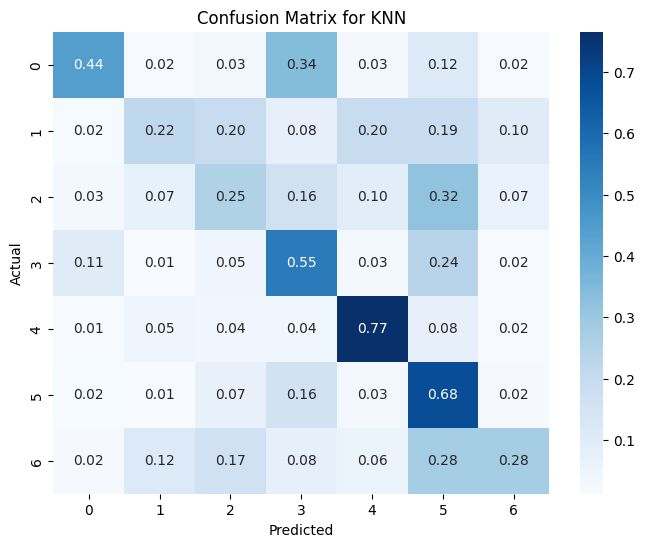

Model: Random Forest
Accuracy: 0.7076184887293313
F1 score: 0.6836151937693734
Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.47      0.54      6725
           1       0.51      0.21      0.30      2333
           2       0.40      0.12      0.19      5109
           3       0.66      0.67      0.67     21974
           4       0.83      0.92      0.87     20624
           5       0.69      0.82      0.75     28340
           6       0.42      0.06      0.11      1802

    accuracy                           0.71     86907
   macro avg       0.59      0.47      0.49     86907
weighted avg       0.68      0.71      0.68     86907



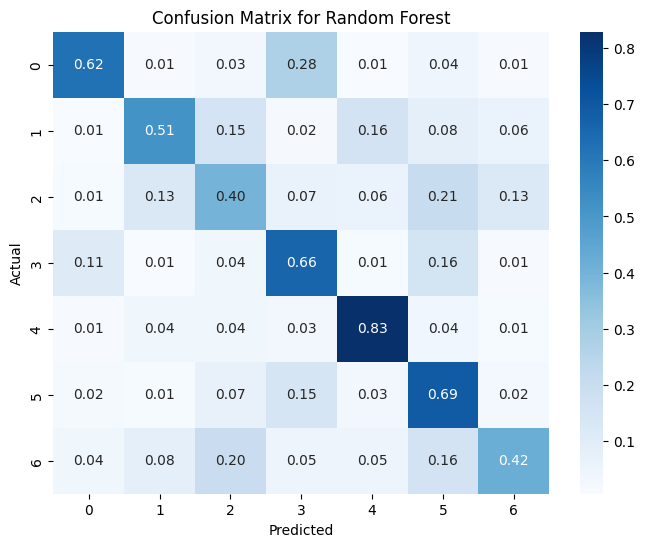

Model: XGBoost
Accuracy: 0.7163059362306834
F1 score: 0.6934009051161382
Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.48      0.55      6725
           1       0.54      0.24      0.33      2333
           2       0.47      0.14      0.22      5109
           3       0.68      0.67      0.67     21974
           4       0.83      0.93      0.88     20624
           5       0.69      0.84      0.76     28340
           6       0.42      0.10      0.17      1802

    accuracy                           0.72     86907
   macro avg       0.61      0.48      0.51     86907
weighted avg       0.70      0.72      0.69     86907



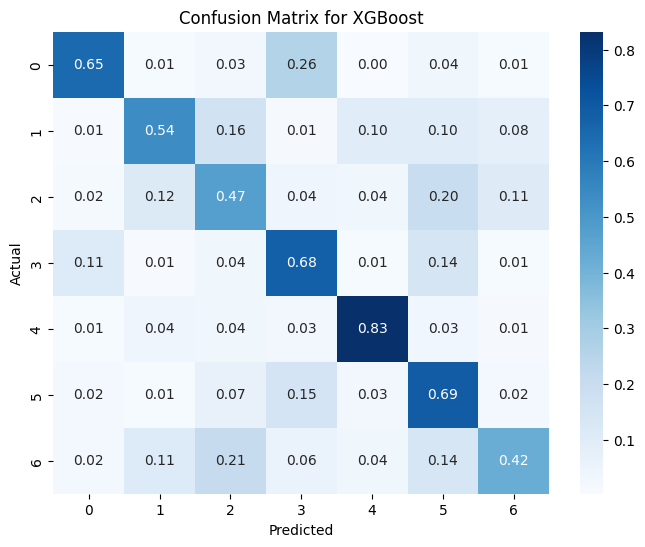

In [560]:
# store accuracy and confusion matrix for each model
model_results = {}

# scorer for multi-class classification
f1_scorer = make_scorer(f1_score, average='weighted') 

for model_name, pipeline in pipelines.items():
    
    # train the model
    pipeline.fit(X_train, y_train)
    # predict on test set
    y_pred = pipeline.predict(X_test)
    y_pred_decoded = label_encoder_target.inverse_transform(y_pred)
    y_test_decoded = label_encoder_target.inverse_transform(y_test)

    # evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_pred_decoded, y_test_decoded)
    # normalize the confusion matrix by the row (true class)
    conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
    
    f1_val = f1_score(y_test, y_pred, average='weighted')  # using 'weighted' for multi-class classification
    #scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring=f1_scorer)
    
    # store the results
    model_results[model_name] = {
        'accuracy': accuracy,
        'f1':f1_val,
        'conf_matrix': conf_matrix
        #'CV score':scores
    }
    # Print results
    print(f"Model: {model_name}")
    print(f"Accuracy: {accuracy}")
    print(f"F1 score: {f1_val}")
    #print(f"{model_name} - F1 Score on CV: {scores.mean():.4f}")    
    
    
    print(f"Classification Report:\n{classification_report(y_test_decoded, y_pred_decoded)}")
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues')
            xticklabels=np.unique(y_test_decoded), yticklabels=np.unique(y_test_decoded))    
    
    plt.title(f'Confusion Matrix for {model_name}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

### 7. 1. Optimizing parameters for best basic model (`XGBoost`).
This is a computationally demanding step, takes 60+ minutes.

In [561]:
# parameter grid for XGBoost
param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [3, 5, 10],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__subsample': [0.8, 1.0],
    'classifier__colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(xgb_pipeline, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Display the best parameters and best score
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation accuracy: ", grid_search.best_score_)

Best parameters found:  {'classifier__colsample_bytree': 0.8, 'classifier__learning_rate': 0.1, 'classifier__max_depth': 10, 'classifier__n_estimators': 100, 'classifier__subsample': 0.8}
Best cross-validation accuracy:  0.6986893430540718


### 7.2. Using holdout set to test best XGB model performance.

Accuracy: 0.7223208426126155
F1: 0.700103990469388


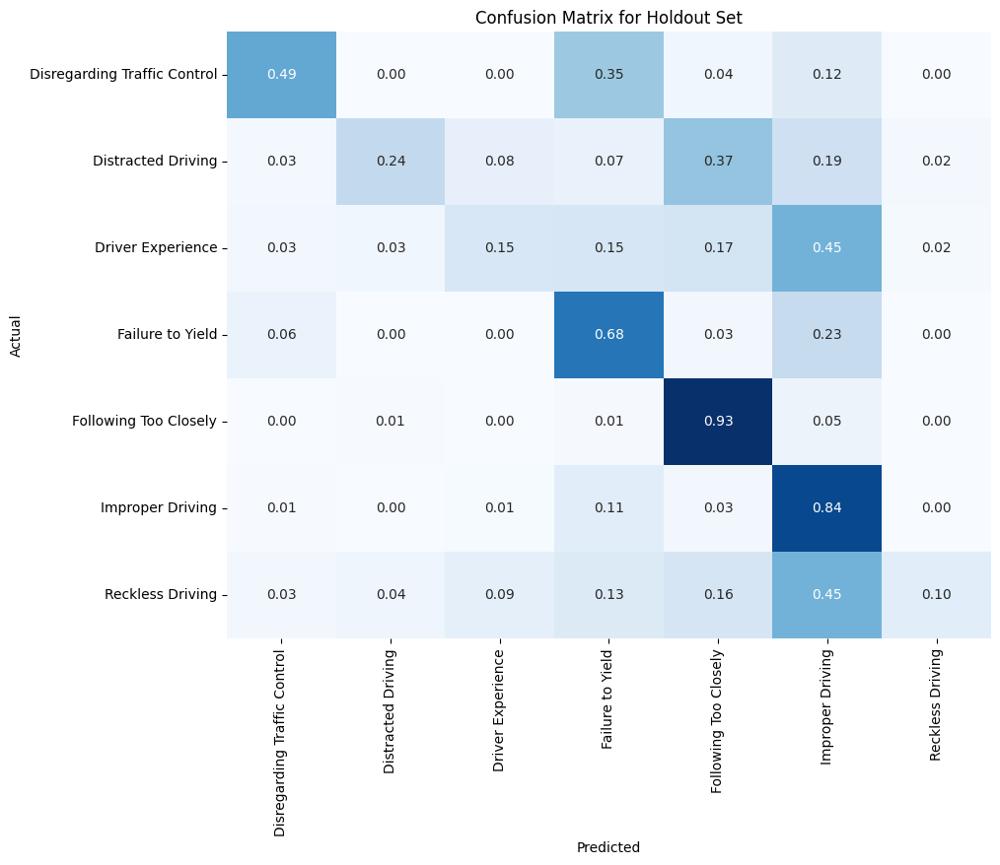

In [586]:
# get the best model with the best parameters
best_model = grid_search.best_estimator_

# predict on the holdout set
y_holdout_pred_encoded = best_model.predict(X_holdout)

# decode the holdout actual and predicted labels
y_holdout_decoded = label_encoder_target.inverse_transform(y_holdout)
y_holdout_pred_decoded = label_encoder_target.inverse_transform(y_holdout_pred_encoded)

# compute the confusion matrix using the decoded labels
conf_matrix = confusion_matrix(y_holdout_decoded, y_holdout_pred_decoded)

# normalize the confusion matrix by the row (true class)
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
    
# evaluate the model
accuracy = accuracy_score(y_holdout, y_holdout_pred_encoded)
f1_val = f1_score(y_holdout, y_holdout_pred_encoded, average='weighted')  # using 'weighted' for multi-class classification

print(f"Accuracy: {accuracy}")
print(f"F1: {f1_val}")


# plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=False, 
            xticklabels=np.unique(y_holdout_decoded), yticklabels=np.unique(y_holdout_decoded))
plt.title('Confusion Matrix for Holdout Set')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Calculating False Discovery Rate.

In [587]:
def calculate_fdr_for_each_class(y_true, y_pred, num_classes):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(num_classes))
    fdr_per_class = []

    for i in range(num_classes):
        # for class i: TP = cm[i, i], FP = sum of column i - TP
        TP = cm[i, i]
        FP = cm[:, i].sum() - TP
        
        # avoid division by zero
        if FP + TP == 0:
            fdr = 0.0
        else:
            fdr = FP / (FP + TP)
        
        fdr_per_class.append(fdr)

    return fdr_per_class

In [588]:
fdr_values = calculate_fdr_for_each_class(y_holdout, y_holdout_pred_encoded, 7)
print("FDR for each class:")
for i, fdr in enumerate(fdr_values):
    label = label_encoder_target.classes_[i]
    print(f"{label}: {fdr:.2f}")

FDR for each class:
Disregarding Traffic Control: 0.34
Distracted Driving: 0.47
Driver Experience: 0.51
Failure to Yield: 0.32
Following Too Closely: 0.16
Improper Driving: 0.30
Reckless Driving: 0.56


### Displaying `XGBoost`'s best model feature importance.

In [564]:
import xgboost as xgb

# create a mapping from 'f0', 'f1', ... to actual feature names
feature_names = preprocessor.get_feature_names_out()
feature_map = {f"f{index}": feature for index, feature in enumerate(feature_names)}
# extract the XGBoost model from the pipeline
xgb_model = best_model.named_steps['classifier']

# access feature importances
importance = xgb_model.get_booster().get_score(importance_type='gain')

# convert feature numbers to actual feature names
importance_mapped = {feature_map.get(key, key): value for key, value in importance.items()}

# convert the mapped feature importance to a df for better visualization
importance_df = pd.DataFrame(list(importance_mapped.items()), \
                             columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)

# display the df
importance_df.head(10)

,Feature,Importance
63,cat__first_crash_type_Rear End,280.237396
38,cat__driver_action_Improper Manouver,89.850182
56,cat__first_crash_type_Angle,73.313103
36,cat__driver_action_Distance,62.447044
35,cat__driver_action_Disregarding Controls/Signs,56.923775
37,cat__driver_action_Distraction,41.656368
23,cat__first_contact_point_Rear,22.867151
69,cat__first_crash_type_Turning,21.865906
68,cat__first_crash_type_Sideswipe Same,20.575909
40,cat__driver_action_Other,17.656883


### This block of code takes ~1 hr to execure, an additional feature importance visualization tool.

In [ ]:
#import shap

# transform the training data using the preprocessor
#X_train_transformed = preprocessor.transform(X_train)
#X_test_transformed = preprocessor.transform(X_test)
# create the SHAP explainer with the extracted XGBoost model
#explainer = shap.Explainer(xgb_model, X_train_transformed.toarray())
# calculate SHAP values for the test set
#shap_values = explainer(X_test_transformed.toarray())
# summary plot: shows overall feature importance
#shap.summary_plot(shap_values, X_test_transformed.toarray())
# Dependence plot for a specific feature (e.g., 'feature_1')
#shap.dependence_plot('Feature 2', shap_values, X_test_transformed.toarray())

## 7.3. Using Keras to create a NN model.

* We'll define DNN model as a function, with 4 layers and the multi-class output layer.
* We'll use 200 epochs (passes thru the dataset), and batch size of 128 (the number of samples the model processes before updating the model's weights).

In [565]:
def create_Keras_model(categorical_input_dims, numerical_input_dim, num_classes):
    """
    Args:
    - categorical_input_dims: List of input dimensions (number of unique categories) for each categorical feature.
    - numerical_input_dim: Number of numerical features.
    - num_classes: Number of output classes for classification.
    """
    
    # input layers for categorical features
    categorical_inputs = []
    categorical_embeddings = []
    
    for i, input_dim in enumerate(categorical_input_dims):
        # create input layer for each categorical feature
        input_cat = Input(shape=(1,), name=f'categorical_input_{i}')
        
        # embedding layer for each categorical feature
        embedding_cat = Embedding(input_dim=input_dim, output_dim=5)(input_cat) 
        flatten_cat = Flatten()(embedding_cat)
        
        # collect inputs and embeddings
        categorical_inputs.append(input_cat)
        categorical_embeddings.append(flatten_cat)

    # input layer for numerical features
    numerical_input = Input(shape=(numerical_input_dim,), name='numerical_input')

    # concatenate all inputs (categorical embeddings + numerical features)
    all_inputs = Concatenate()(categorical_embeddings + [numerical_input])

    # dense layers for processing the combined features
    dense = Dense(64, activation='relu')(all_inputs)
    dense = Dense(32, activation='relu')(dense)
    dense = Dense(32, activation='relu')(dense)
    dense = Dense(16, activation='relu')(dense)
    
    # output layer
    activation_fn = 'softmax'
    output = Dense(num_classes, activation=activation_fn)(dense)
    
    # create and compile the model
    model = Model(inputs=categorical_inputs + [numerical_input], outputs=output)
    loss_fn = 'sparse_categorical_crossentropy'
    
    model.compile(optimizer='adam', loss=loss_fn, metrics='accuracy')  
    return model

### Preparing input data for DNN: label encoding for categorical data, layering.

In [566]:
# save copies of X_train, X_test, X_holdout
copy_X_train = X_train.copy()
copy_X_test = X_test.copy()
copy_X_holdout = X_holdout.copy()

# select and store numerical columns (float64 columns only)
numerical_columns = copy_X_train.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_columns = copy_X_train.select_dtypes(include=['object', 'category']).columns.tolist()

# prepare numeric part of input data for numerical features
train_numerical_inputs = copy_X_train[numerical_columns].values
test_numerical_inputs = copy_X_test[numerical_columns].values
holdout_numerical_inputs = copy_X_holdout[numerical_columns].values

# prepare categorical inputs
train_categorical_inputs = []
test_categorical_inputs = []
holdout_categorical_inputs = []

label_encoders_feature = {}  # Store label encoders for potential future use
for col in categorical_columns:
    le = LabelEncoder()
    # Encode the categorical feature
    copy_X_train[col] = le.fit_transform(copy_X_train[col])
    copy_X_test[col] = le.fit_transform(copy_X_test[col])
    copy_X_holdout[col] = le.fit_transform(copy_X_holdout[col])
        
    label_encoders_feature[col] = le
    # reshape the encoded feature to (n_samples, 1)
    train_categorical_inputs.append(copy_X_train[col].values.reshape(-1, 1))
    test_categorical_inputs.append(copy_X_test[col].values.reshape(-1, 1))
    holdout_categorical_inputs.append(copy_X_holdout[col].values.reshape(-1, 1))
    
# combine categorical and numerical inputs
train_inputs = train_categorical_inputs + [train_numerical_inputs]
test_inputs = test_categorical_inputs + [test_numerical_inputs]
holdout_inputs = holdout_categorical_inputs + [holdout_numerical_inputs]

In [567]:
# check the input shapes again
for i, input_array in enumerate(train_inputs):
    print(f"Train input {i} shape: {input_array.shape}")

# check the input shapes again
for i, input_array in enumerate(test_inputs):
    print(f"Test input {i} shape: {input_array.shape}")
# check the input shapes again
for i, input_array in enumerate(holdout_inputs):
    print(f"Holdout input {i} shape: {input_array.shape}")

Train input 0 shape: (202783, 1)
Train input 1 shape: (202783, 1)
Train input 2 shape: (202783, 1)
Train input 3 shape: (202783, 1)
Train input 4 shape: (202783, 1)
Train input 5 shape: (202783, 1)
Train input 6 shape: (202783, 1)
Train input 7 shape: (202783, 1)
Train input 8 shape: (202783, 1)
Train input 9 shape: (202783, 1)
Train input 10 shape: (202783, 1)
Train input 11 shape: (202783, 1)
Train input 12 shape: (202783, 1)
Train input 13 shape: (202783, 8)
Test input 0 shape: (86907, 1)
Test input 1 shape: (86907, 1)
Test input 2 shape: (86907, 1)
Test input 3 shape: (86907, 1)
Test input 4 shape: (86907, 1)
Test input 5 shape: (86907, 1)
Test input 6 shape: (86907, 1)
Test input 7 shape: (86907, 1)
Test input 8 shape: (86907, 1)
Test input 9 shape: (86907, 1)
Test input 10 shape: (86907, 1)
Test input 11 shape: (86907, 1)
Test input 12 shape: (86907, 1)
Test input 13 shape: (86907, 8)
Holdout input 0 shape: (92949, 1)
Holdout input 1 shape: (92949, 1)
Holdout input 2 shape: (9294

In [568]:
num_classes = len(np.unique(y_train))  # number of output classes 
numerical_input_dim = len(numerical_columns)  # number of numerical features
categorical_input_dims = [len(np.unique(X_train[col])) for col in categorical_columns]  # unique categories per feature

# create the Keras model
model = create_Keras_model(categorical_input_dims, numerical_input_dim, num_classes)

# y_train is a NumPy array
y_train = np.array(y_train)

# train the model
model.fit(train_inputs, y_train, epochs=200, batch_size=128, validation_split=0.2)

# evaluate the model
accuracy = model.evaluate(test_inputs, y_test)
print(f"Test Accuracy: {accuracy[1]:.2f}")

Epoch 1/200
1268/1268 [==============================] - 4s 2ms/step - loss: 2.0479 - accuracy: 0.5125 - val_loss: 1.2425 - val_accuracy: 0.6289
Epoch 2/200
1268/1268 [==============================] - 2s 2ms/step - loss: 1.2063 - accuracy: 0.6297 - val_loss: 1.1672 - val_accuracy: 0.6321
Epoch 3/200
1268/1268 [==============================] - 2s 2ms/step - loss: 1.1160 - accuracy: 0.6496 - val_loss: 1.1045 - val_accuracy: 0.6290
Epoch 4/200
1268/1268 [==============================] - 2s 2ms/step - loss: 1.0663 - accuracy: 0.6582 - val_loss: 1.0326 - val_accuracy: 0.6624
Epoch 5/200
1268/1268 [==============================] - 2s 2ms/step - loss: 1.0249 - accuracy: 0.6659 - val_loss: 1.0032 - val_accuracy: 0.6687
Epoch 6/200
1268/1268 [==============================] - 2s 2ms/step - loss: 0.9949 - accuracy: 0.6690 - val_loss: 0.9703 - val_accuracy: 0.6700
Epoch 7/200
1268/1268 [==============================] - 3s 2ms/step - loss: 0.9779 - accuracy: 0.6696 - val_loss: 0.9732 - val_ac

In [569]:
y_pred = model.predict(test_inputs)
# convert predicted probabilities to class labels
y_pred_classes = y_pred.argmax(axis=-1)
f1 = f1_score(y_test, y_pred_classes, average='weighted')
print(f"F1 Score: {f1:.4f}")

2716/2716 [==============================] - 3s 1ms/step
F1 Score: 0.6857


### Using holdout dataset to estimate DNN model's accuracy.

In [570]:
# make predictions on the holdout set (use predict_proba instead of predict) 
# evaluate the model
y_holdout_pred_proba = model.predict(holdout_inputs)
y_holdout_pred_encoded = np.argmax(y_holdout_pred_proba, axis=1)

# decode the holdout actual and predicted labels
y_holdout_decoded = label_encoder_target.inverse_transform(y_holdout)
y_holdout_pred_decoded = label_encoder_target.inverse_transform(y_holdout_pred_encoded)

2905/2905 [==============================] - 3s 1ms/step


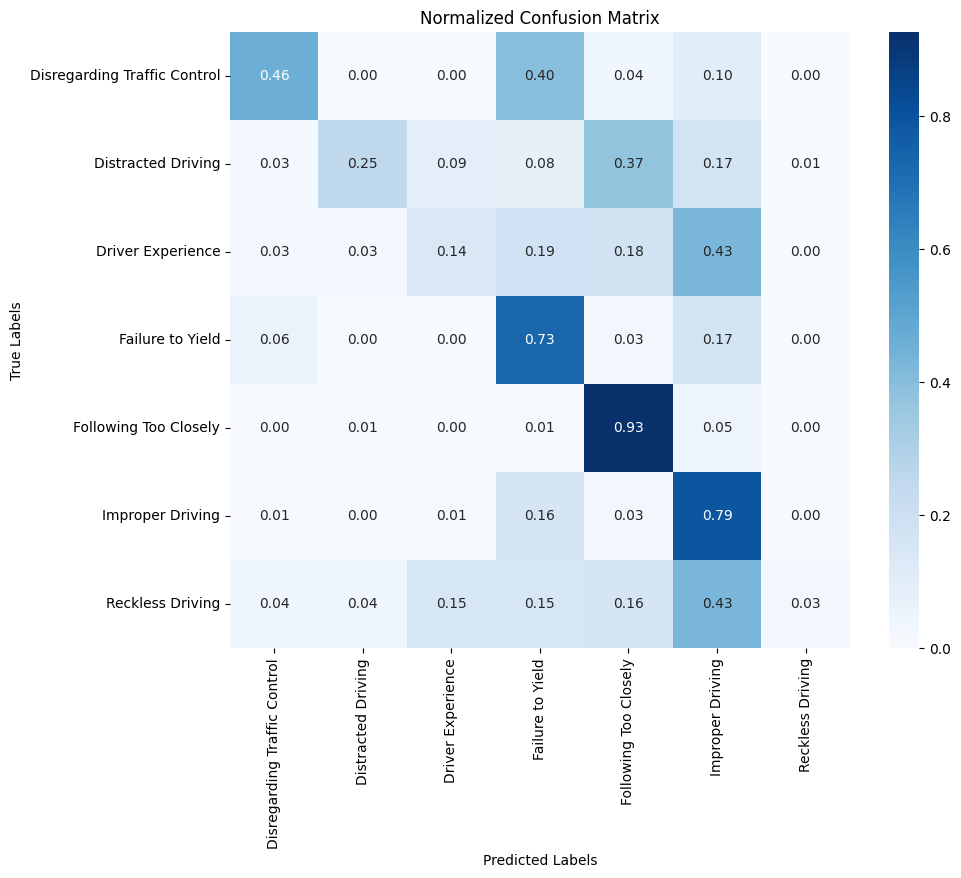

F1 Score: 0.6912
Accuracy: 0.7143379702847799


In [571]:
# compute the confusion matrix using the decoded labels
conf_matrix = confusion_matrix(y_holdout_decoded, y_holdout_pred_decoded)

# normalize the confusion matrix by the row (true class)
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
    
# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=label_encoder_target.classes_, yticklabels=label_encoder_target.classes_)
plt.title('Normalized Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
    
plt.show()

# evaluate the model
accuracy = accuracy_score(y_holdout, y_holdout_pred_encoded)
f1 = f1_score(y_holdout, y_holdout_pred_encoded, average='weighted')
print(f"F1 Score: {f1:.4f}")
print(f"Accuracy: {accuracy}")

### Keras's DNN model interpretability.
In the next few sectoins we'll briefly look into the interpretability of the Keras model: how to extract the weights and interpreting feature importance using Partial Dependence Plotting.

In [572]:
#display model summary
model.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 categorical_input_0 (Input  [(None, 1)]                  0         []                            
 Layer)                                                                                           
                                                                                                  
 categorical_input_1 (Input  [(None, 1)]                  0         []                            
 Layer)                                                                                           
                                                                                                  
 categorical_input_2 (Input  [(None, 1)]                  0         []                            
 Layer)                                                                                    

### Model's weights.
* Embedding weights map categorical feature's values to to a lower-dimensional space.
* Similar categories have similar embeddings.
* We can analyze the distances between embeddings to find similar or related categories.
* We can check for overfitting (magnitude of the weights). 

In [573]:
# loop through all embedding layers, extract and print weights
for i, layer in enumerate(model.layers):
    if isinstance(layer, tf.keras.layers.Embedding):
        embedding_weights = layer.get_weights()[0]
        print(f"Embedding Layer {i} - Shape: {embedding_weights.shape}")
        print(embedding_weights) 

Embedding Layer 13 - Shape: (9, 5)
[[ 2.857769   -5.0852404  -4.926829   -1.8662871   0.05266822]
 [ 4.046398    2.85274     0.3800668   1.5770177  -5.1456394 ]
 [ 2.4604154   0.2206965  -2.4630055  -1.0570594  -2.852827  ]
 [-1.4037887  -0.802705    1.0438204  -0.2560104  -0.03587429]
 [-0.9533198   0.8063346  -0.63102967  1.3560416  -1.5583034 ]
 [ 1.4815761   2.866799    0.25094774 -2.4040496   1.0908405 ]
 [ 0.8859926   2.6114552  -2.4206893   0.8748784   5.423751  ]
 [ 3.5527365  -1.2549939   0.31855652  1.749928    0.7928416 ]
 [ 0.67999023 -0.946801   -2.2685819  -3.069136   -2.859618  ]]
Embedding Layer 14 - Shape: (9, 5)
[[ 3.127461   -1.9619858   2.0679495  -3.6874735   3.5779428 ]
 [-7.320243    4.168835    4.6874733  -3.472431   -0.19840105]
 [ 1.3966616   2.2003999   0.5561512   1.7333956   1.2503475 ]
 [-2.829369    1.6775047   0.87617564 -1.1903801  -6.8868127 ]
 [ 0.435224    0.2865849  -1.3185884  -5.717199    1.4374253 ]
 [-6.1754794  -0.7467596  -2.551237    0.748969

In [574]:
# extract the embedding weights from the embedding layer # 13
feature_number = 0
layer_number = 13
embedding_weights = model.layers[layer_number].get_weights()[0]  # Shape: (n_categories, embedding_dim)

#get the corresponding LabelEncoder for the feature #13
feature_name = categorical_columns[feature_number]  
label_encoder = label_encoders_feature[feature_name]

#decode the integer indices back to their original category names
category_names = label_encoder.inverse_transform(np.arange(embedding_weights.shape[0]))

# print each category name with its corresponding embedding vector
for category, embedding in zip(category_names, embedding_weights):
    print(f"Category: {category}, Weights: {embedding}")

Category: Bus, Weights: [ 2.857769   -5.0852404  -4.926829   -1.8662871   0.05266822]
Category: Motorcycle, Weights: [ 4.046398   2.85274    0.3800668  1.5770177 -5.1456394]
Category: Other, Weights: [ 2.4604154  0.2206965 -2.4630055 -1.0570594 -2.852827 ]
Category: Passenger, Weights: [-1.4037887  -0.802705    1.0438204  -0.2560104  -0.03587429]
Category: SUV, Weights: [-0.9533198   0.8063346  -0.63102967  1.3560416  -1.5583034 ]
Category: Truck, Weights: [ 1.4815761   2.866799    0.25094774 -2.4040496   1.0908405 ]
Category: Unknown, Weights: [ 0.8859926  2.6114552 -2.4206893  0.8748784  5.423751 ]
Category: Van, Weights: [ 3.5527365  -1.2549939   0.31855652  1.749928    0.7928416 ]
Category: Vehicle with Trailer, Weights: [ 0.67999023 -0.946801   -2.2685819  -3.069136   -2.859618  ]


### Detailed analysis:
* Similarity between categories: both `Motorcycle` and `Vehicle with Trailer` have large negative values in dimensions 2, 3, and 4. This suggests the model treats these two categories similarly, possibly as outliers compared to more common vehicles like `Passenger` or `SUV`.
* Clustering of similar categories: the embeddings for `Passenger` and `SUV` are somewhat close (e.g., dimension 3 is close to 0 for both). However, `SUV` has more negative weights in other dimensions, possibly indicating that `SUV`s are treated slightly differently from regular passenger vehicles.
* Outliers: The category Unknown has a large positive value in dimension 2 and large negative values in other dimensions. This suggests the model doesn’t have enough data or treats this category as an outlier with inconsistent impact across features.
* Contrasting between categories: The embeddings for `Bus` and `Van` suggest that these categories are treated differently. `Bus` has large negative weights in dimensions 2-4, suggesting a significant impact (likely negative) on the model’s outcome.
`Van` has smaller weights, closer to 0, indicating a lesser influence on predictions.

### Partial dependences of features `Passenger_child` and `first_contact_point` on targets `Distracted_Driving` and `Failure to Yield`.

* PDP values are calculated by modifying one feature value (for a given feature) at a time and predicting the outcome with the modified set.
* For numerical features, PDP values indicate how the predicted outcome changes as the feature value increases or decreases.
* For categorical features, PDP values show the average prediction for each category.

In [575]:
# supplementalfunction to compute the probabilities for a given feature (numeric or categorical) and target class
def partial_dependence(model, inputs, feature_idx, values, target_class, is_categorical=False, label_encoder=None):
    """
    Computes partial dependence for a single feature and s specific class.

    Args:
        model: Trained Keras model.
        inputs: List of input arrays (categorical + numerical).
        feature_idx: Index of the feature to vary.
        values: List of values to test for the feature.
        target_class: Index of the target class for PDP.        
        is_categorical: Boolean indicating if the feature is categorical.
        label_encoder: LabelEncoder to decode categorical values (optional).
        
    
    Returns:
        List of average predictions for each feature value.
    """
    predictions = []
    
    for val in values:
        # create a copy of the inputs to avoid modifying original data
        new_inputs = [arr.copy() for arr in inputs]
        
        # modify the feature value (either categorical or numerical)
        if is_categorical:
            new_inputs[feature_idx][:, 0] = val  # Update categorical input
        else:
            new_inputs[-1][:, feature_idx] = val  # Update numerical input

        # predict using the modified inputs and average the predictions
        probabilities = model.predict(new_inputs)
        avg_prob = probabilities[:, target_class].mean()
        predictions.append(avg_prob)
    
    # if categorical, decode the values
    if is_categorical and label_encoder is not None:
        decoded_values = label_encoder.inverse_transform(values)
    else:
        decoded_values = values  # Use numerical values directly

    return predictions, decoded_values

#### Increase in value of numeric feature `Passenger_child` slightly increases the probability of `Distracted Driving`.

2716/2716 [==============================] - 3s 985us/step


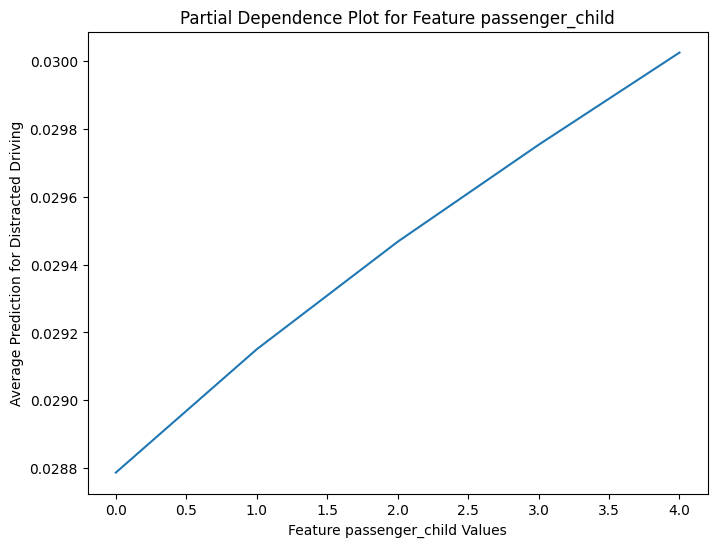

In [576]:
# numerical feature 1 (Passenger_child)
feature_idx = 1

feature_values = np.linspace(0, 4, 5)  # test values for the feature
target_class = 1; # Distracted Driving

pdp_values, decoded_values = partial_dependence(
    model, test_inputs, feature_idx, feature_values, target_class, is_categorical=False 
)

# plot the PDP for the numerical feature
plt.figure(figsize=(8, 6))
plt.plot(decoded_values, pdp_values)
plt.xlabel(f'Feature {numerical_columns[feature_idx]} Values')
plt.ylabel(f'Average Prediction for {label_encoder_target.inverse_transform([target_class])[0]}')
plt.title(f'Partial Dependence Plot for Feature {numerical_columns[feature_idx]}')
plt.show()

#### Of all values in categorical feature `first_contact_point`, `front` has the most impact on `Failure to Yield` target.

2716/2716 [==============================] - 3s 1ms/step


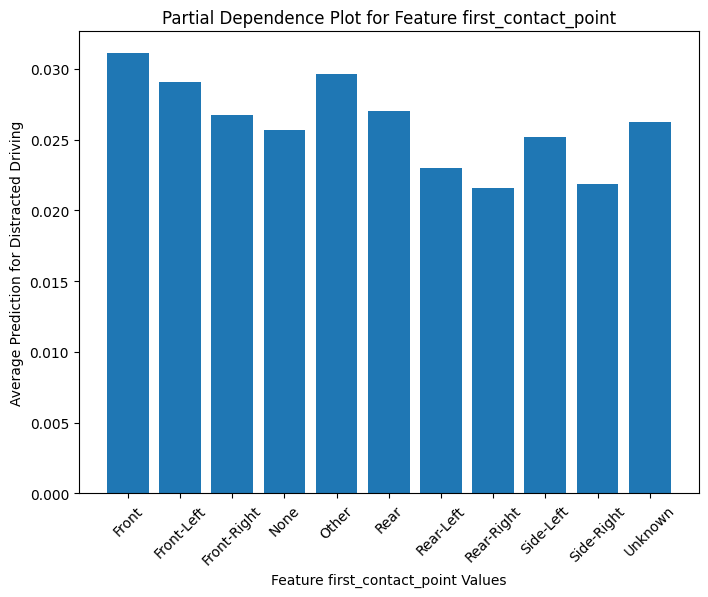

In [577]:
# categorical feature 1 (first_contact_point)
categorical_idx = 2 
target_class = 1 # Failure to Yield 
label_encoder = label_encoders_feature[categorical_columns[categorical_idx]]  # Get the label encoder
categories = np.unique(train_inputs[categorical_idx])  # Get all unique encoded categories

pdp_values, decoded_categories = partial_dependence(
    model, test_inputs, categorical_idx, categories, target_class, is_categorical=True, label_encoder=label_encoder
)

# plot the PDP for the numerical feature
plt.figure(figsize=(8, 6))
plt.bar(decoded_categories, pdp_values)
plt.xlabel(f'Feature {categorical_columns[categorical_idx]} Values')
plt.ylabel(f'Average Prediction for {label_encoder_target.inverse_transform([target_class])[0]}')
plt.title(f'Partial Dependence Plot for Feature {categorical_columns[categorical_idx]}')
plt.xticks(rotation=45)
plt.show()

## 8. Results.
* We have tested the following ML models: Extreme Gradient Boosting, KNN, Random Forest, and Deep Neural Network.
* Initially, all models demonstrated 70% accuracy, with Extreme Gradient Boosting being slightly better at 71%.
* We performed a parameters search for  Extreme Gradient Boosting and tested the performance of a holdout set.
* With the best parameters, accuracy improved to 72%.
* Interpreting the best model parameters:
  - `colsample_bytree = 0.8 `: 80% of the features (columns) are used for building each tree. Using a smaller subset of features improves the model’s performance and prevents overfiting.
  - `learning_rate = 0.1`: a learning rate of 0.1 is moderate; it shows that the model is being updated at a reasonable pace
  - `max_depth = 10`: the maximum depth of each tree is 10. The model is deep, indicating complexity and potential overfitting.
  - `n_estimators = 100`: the number of trees in the ensemble. The model has enough complexity to capture the relationships in the data, but not too many to overfit.
  - `subsample = 0.8`: each tree uses 80% of the data samples, which introduces randomness and helps prevent overfitting.
  - `Accuracy 0.72` : The model performs reasonably well but may have room for improvement. The model captures most but not all of the patterns.
* There's room for improvement with different sampling techniques (some causes are underrepresented).

## 9. Recommendations.
* Target Rear-End collisions: Focus on campaigns that promote safe following distances, especially in high-traffic areas.
* Address Improper Maneuvers: Educate drivers about common improper maneuvers, such as unsafe lane changes, abrupt stops, and risky turns.
* Mitigate Distracted Driving. Stress the dangers of texting, phone use, and other distractions while driving.

## 10. Conclusion.
We have performed extensive EDA on three Chicago Crashes Datasets: Crashes, Vehicles, and Passengers.
We have tested multiple ML Models and a DNN model. Extreme Gradient Boosting was the best-performing model and performed future parameter optimization. Our best model was tested on the holdout data and performed reasonably well (72% accuracy), suggesting there's a possibility for improvement, using different feature engineering.